In [1]:
# import packages

In [2]:
from pandasql import sqldf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from bs4 import BeautifulSoup
import io
import requests

In [3]:
#matplotlib inline

In [4]:
%matplotlib inline

In [5]:
#project csv

In [6]:
project_csv = pd.read_csv('../data/Hot-Stuff.csv')
print(project_csv)

                                                      url      WeekID  \
0       http://www.billboard.com/charts/hot-100/1965-0...   7/17/1965   
1       http://www.billboard.com/charts/hot-100/1965-0...   7/24/1965   
2       http://www.billboard.com/charts/hot-100/1965-0...   7/31/1965   
3       http://www.billboard.com/charts/hot-100/1965-0...    8/7/1965   
4       http://www.billboard.com/charts/hot-100/1965-0...   8/14/1965   
...                                                   ...         ...   
327890  https://www.billboard.com/charts/hot-100/2018-...  10/20/2018   
327891  http://www.billboard.com/charts/hot-100/1977-0...   5/21/1977   
327892  http://www.billboard.com/charts/hot-100/1981-0...   5/23/1981   
327893  http://www.billboard.com/charts/hot-100/1973-0...   9/29/1973   
327894  https://www.billboard.com/charts/hot-100/2020-...  11/28/2020   

        Week Position                      Song                  Performer  \
0                  34    Don't Just Stand The

In [7]:
#project_csv_df

In [8]:
project_csv_df = project_csv[['Song', 'Performer', 'Weeks on Chart', 'Week Position', 'WeekID']]
project_csv_df

,Song,Performer,Weeks on Chart,Week Position,WeekID
0,Don't Just Stand There,Patty Duke,4,34,7/17/1965
1,Don't Just Stand There,Patty Duke,5,22,7/24/1965
2,Don't Just Stand There,Patty Duke,6,14,7/31/1965
3,Don't Just Stand There,Patty Duke,7,10,8/7/1965
4,Don't Just Stand There,Patty Duke,8,8,8/14/1965
...,...,...,...,...,...
327890,God Is A Woman,Ariana Grande,13,22,10/20/2018
327891,I Wanna Get Next To You,Rose Royce,13,22,5/21/1977
327892,I Can't Stand It,Eric Clapton And His Band,13,22,5/23/1981
327893,Here I Am Come & Take Me,Al Green,13,22,9/29/1973


In [9]:
#rename for SQL

# NUMBER 1 POSITION

In [10]:
project_csv_df.rename(columns = {'Week Position' : 'WeekPosition', 'Weeks on Chart' : 'WeeksonChart'}, inplace=True)
project_csv_df

/var/folders/91/wchv5p25455f2k8078kdjvm40000gn/T/ipykernel_21877/1831510081.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  project_csv_df.rename(columns = {'Week Position' : 'WeekPosition', 'Weeks on Chart' : 'WeeksonChart'}, inplace=True)


,Song,Performer,WeeksonChart,WeekPosition,WeekID
0,Don't Just Stand There,Patty Duke,4,34,7/17/1965
1,Don't Just Stand There,Patty Duke,5,22,7/24/1965
2,Don't Just Stand There,Patty Duke,6,14,7/31/1965
3,Don't Just Stand There,Patty Duke,7,10,8/7/1965
4,Don't Just Stand There,Patty Duke,8,8,8/14/1965
...,...,...,...,...,...
327890,God Is A Woman,Ariana Grande,13,22,10/20/2018
327891,I Wanna Get Next To You,Rose Royce,13,22,5/21/1977
327892,I Can't Stand It,Eric Clapton And His Band,13,22,5/23/1981
327893,Here I Am Come & Take Me,Al Green,13,22,9/29/1973


In [11]:
#position_project.sort_values()

In [12]:
position_project=project_csv_df.sort_values(by=['WeekPosition', 'WeeksonChart'], ascending=[True, False])
position_project

,Song,Performer,WeeksonChart,WeekPosition,WeekID
284597,Macarena (Bayside Boys Mix),Los Del Rio,46,1,11/2/1996
284588,Macarena (Bayside Boys Mix),Los Del Rio,45,1,10/26/1996
284578,Macarena (Bayside Boys Mix),Los Del Rio,44,1,10/19/1996
284567,Macarena (Bayside Boys Mix),Los Del Rio,43,1,10/12/1996
284555,Macarena (Bayside Boys Mix),Los Del Rio,42,1,10/5/1996
...,...,...,...,...,...
294181,You Better Know It,Jackie Wilson,1,100,9/5/1959
294476,You Can Do Magic,Limmie & Family Cookin',1,100,11/18/1972
295049,You Don't Have To Be A Tower Of Strength,Gloria Lynne,1,100,12/16/1961
295146,You Don't Know Her Like I Do,Brantley Gilbert,1,100,10/1/2011


In [13]:
#SQL ATTEMPT

In [14]:
position = 'SELECT Song, Performer, WeeksonChart, WeekPosition FROM position_project WHERE WeekPosition = 1'
sqldf(position, globals())
position_df = sqldf(position, globals())
position_df

,Song,Performer,WeeksonChart,WeekPosition
0,Macarena (Bayside Boys Mix),Los Del Rio,46,1
1,Macarena (Bayside Boys Mix),Los Del Rio,45,1
2,Macarena (Bayside Boys Mix),Los Del Rio,44,1
3,Macarena (Bayside Boys Mix),Los Del Rio,43,1
4,Macarena (Bayside Boys Mix),Los Del Rio,42,1
...,...,...,...,...
3274,We R Who We R,Ke$ha,1,1
3275,What Do You Mean?,Justin Bieber,1,1
3276,What's Next,Drake,1,1
3277,Willow,Taylor Swift,1,1


In [15]:
#position_project.drop_values()

In [16]:
position_drop= position_df.drop(position_project.columns[[2, 3]], axis=1)
position_drop

,Song,Performer
0,Macarena (Bayside Boys Mix),Los Del Rio
1,Macarena (Bayside Boys Mix),Los Del Rio
2,Macarena (Bayside Boys Mix),Los Del Rio
3,Macarena (Bayside Boys Mix),Los Del Rio
4,Macarena (Bayside Boys Mix),Los Del Rio
...,...,...
3274,We R Who We R,Ke$ha
3275,What Do You Mean?,Justin Bieber
3276,What's Next,Drake
3277,Willow,Taylor Swift


In [17]:
#position value_count()

In [18]:
position_1 =position_drop[['Song', 'Performer']].value_counts()
position_1

Song                                                              Performer                                        
Old Town Road                                                     Lil Nas X Featuring Billy Ray Cyrus                  19
One Sweet Day                                                     Mariah Carey & Boyz II Men                           16
Despacito                                                         Luis Fonsi & Daddy Yankee Featuring Justin Bieber    16
Candle In The Wind 1997/Something About The Way You Look Tonight  Elton John                                           14
Macarena (Bayside Boys Mix)                                       Los Del Rio                                          14
                                                                                                                       ..
Lose You To Love Me                                               Selena Gomez                                          1
Looks Like We Made It         

In [19]:
# position_1.head(5)

In [20]:
position_top_5= position_1.head(5)
position_top_5

Song                                                              Performer                                        
Old Town Road                                                     Lil Nas X Featuring Billy Ray Cyrus                  19
One Sweet Day                                                     Mariah Carey & Boyz II Men                           16
Despacito                                                         Luis Fonsi & Daddy Yankee Featuring Justin Bieber    16
Candle In The Wind 1997/Something About The Way You Look Tonight  Elton John                                           14
Macarena (Bayside Boys Mix)                                       Los Del Rio                                          14
dtype: int64

In [21]:
position_df_5 = pd.DataFrame(position_top_5)
position_df_5

,,0
Song,Performer,
Old Town Road,Lil Nas X Featuring Billy Ray Cyrus,19
One Sweet Day,Mariah Carey & Boyz II Men,16
Despacito,Luis Fonsi & Daddy Yankee Featuring Justin Bieber,16
Candle In The Wind 1997/Something About The Way You Look Tonight,Elton John,14
Macarena (Bayside Boys Mix),Los Del Rio,14


In [22]:
# position_graph

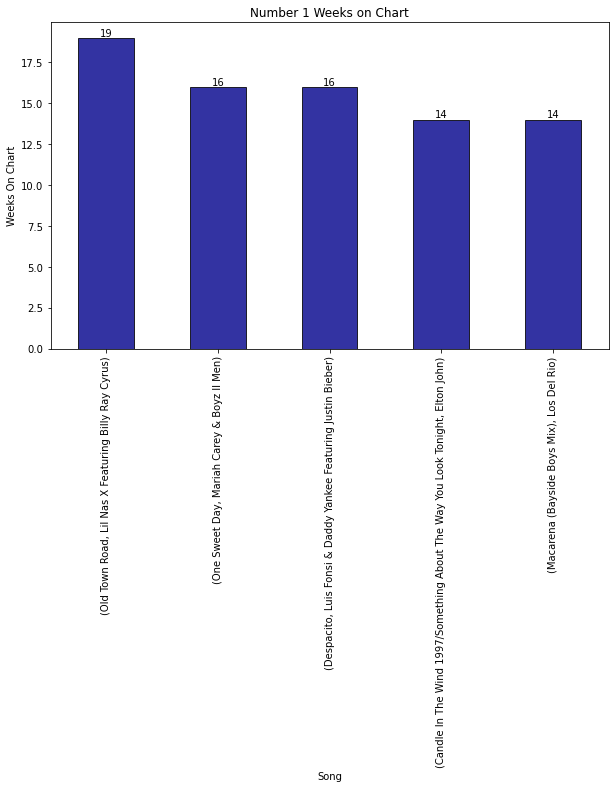

In [23]:
position_graph = position_top_5.plot(figsize=(10,6),
                             x= 'Song',
                             y= 'WeeksonChart',
                             title = 'Number 1 Weeks on Chart',
                             xlabel = 'Song',
                             ylabel = 'Weeks On Chart',
                             kind = 'bar',
                             color = 'darkblue',
                             edgecolor = 'black',
                             alpha = 0.8)
for bars in position_graph.containers:
    position_graph.bar_label(bars)
plt.show()

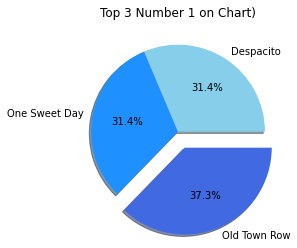

In [24]:
values = [19,16,16]
colors = ['royalblue', 'dodgerblue', 'skyblue']
labels = ['Old Town Row','One Sweet Day','Despacito']
explode = (0.2, 0, 0)
plt.pie(values, colors=colors, labels=labels,
explode=explode, autopct='%1.1f%%',
counterclock=False, shadow=True)
plt.title('Top 3 Number 1 on Chart)')
plt.show()

# NUMBER 1 POSITION END

# WEEKS ON CHART

In [25]:
#sort_values Weeks on Chart

In [26]:
sorted_project=project_csv_df.sort_values(by='WeeksonChart', ascending=False)
sorted_project

,Song,Performer,WeeksonChart,WeekPosition,WeekID
302681,Radioactive,Imagine Dragons,87,49,5/10/2014
302680,Radioactive,Imagine Dragons,86,48,5/3/2014
302679,Radioactive,Imagine Dragons,85,42,4/26/2014
302678,Radioactive,Imagine Dragons,84,39,4/19/2014
302677,Radioactive,Imagine Dragons,83,37,4/12/2014
...,...,...,...,...,...
52135,Leave Me Alone,NF,1,85,8/10/2019
52136,In My Room,Frank Ocean,1,85,11/16/2019
52137,Long RD,YoungBoy Never Broke Again,1,85,3/7/2020
292327,XanaX Damage,Future,1,98,6/22/2019


In [27]:
#sort_drop

In [28]:
sort_drop= sorted_project.drop(sorted_project.columns[[2, 3, 4]], axis=1)
sort_drop

,Song,Performer
302681,Radioactive,Imagine Dragons
302680,Radioactive,Imagine Dragons
302679,Radioactive,Imagine Dragons
302678,Radioactive,Imagine Dragons
302677,Radioactive,Imagine Dragons
...,...,...
52135,Leave Me Alone,NF
52136,In My Room,Frank Ocean
52137,Long RD,YoungBoy Never Broke Again
292327,XanaX Damage,Future


In [29]:
# Weeks on Chart count

In [30]:
weeks_drop= sort_drop[['Song', 'Performer']].value_counts()
weeks_drop


Song                   Performer      
Radioactive            Imagine Dragons    87
Sail                   AWOLNATION         79
I'm Yours              Jason Mraz         76
Blinding Lights        The Weeknd         76
How Do I Live          LeAnn Rimes        69
                                          ..
The Plan               Travis Scott        1
Faraway Star           The Chordettes      1
The Plan               G-Eazy              1
Make You Feel My Love  Glee Cast           1
Stockholm Syndrome     One Direction       1
Length: 29389, dtype: int64

In [31]:
weeks_top_5 = weeks_drop.head(5)

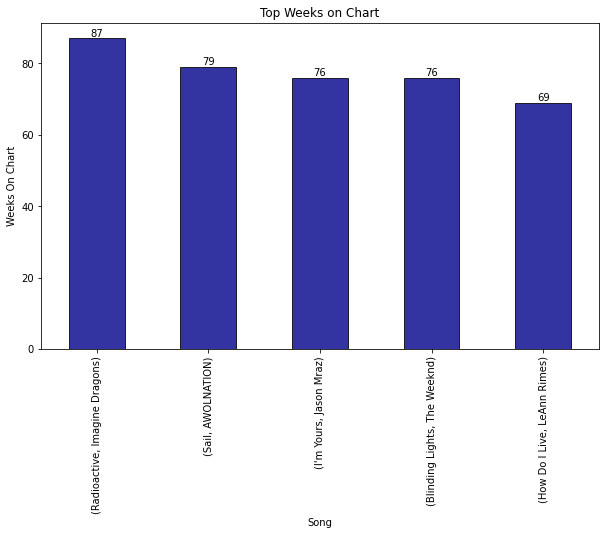

In [32]:
weeks_graph = weeks_top_5.plot(figsize=(10,6),
                             x= 'Song',
                             y= 'WeeksonChart',
                             title = 'Top Weeks on Chart',
                             xlabel = 'Song',
                             ylabel = 'Weeks On Chart',
                             kind = 'bar',
                             color = 'darkblue',
                             edgecolor = 'black',
                             alpha = 0.8)
for bars in weeks_graph.containers:
    weeks_graph.bar_label(bars)
plt.show()

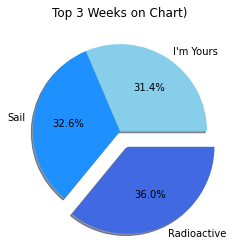

In [33]:
values = [87,79,76]
colors = ['royalblue', 'dodgerblue', 'skyblue']
labels = ['Radioactive','Sail',"I'm Yours"]
explode = (0.2, 0, 0)
plt.pie(values, colors=colors, labels=labels,
explode=explode, autopct='%1.1f%%',
counterclock=False, shadow=True)
plt.title('Top 3 Weeks on Chart)')
plt.show()

# WEEKS ON CHART END

# data searching

In [34]:
# SQL position

In [35]:
Position= 'SELECT DISTINCT(Song) as Song, Performer, WeekID as Week, WeekPosition, WeeksonChart FROM project_csv_df WHERE WeekPosition = 1 ORDER BY WeekPosition ASC'
sqldf(Position, globals())
position_df = sqldf(Position, globals())
position_df

,Song,Performer,Week,WeekPosition,WeeksonChart
0,Don't Leave Me This Way,Thelma Houston,4/23/1977,1,19
1,Poor Little Fool,Ricky Nelson,8/2/1958,1,1
2,One Sweet Day,Mariah Carey & Boyz II Men,12/2/1995,1,1
3,Candle In The Wind 1997/Something About The Wa...,Elton John,10/11/1997,1,1
4,Do I Make You Proud,Taylor Hicks,7/1/2006,1,1
...,...,...,...,...,...
3274,Mood,24kGoldn Featuring iann dior,11/14/2020,1,13
3275,How Am I Supposed To Live Without You,Michael Bolton,1/20/1990,1,13
3276,It's Gonna Be Me,'N Sync,7/29/2000,1,13
3277,Fame,David Bowie,9/20/1975,1,13


In [36]:
#position for loop

In [37]:
for index, row in position_df.iterrows():
    print (index, row ['Song'], row['Performer'], row['WeeksonChart'], row['WeekPosition'])

0 Don't Leave Me This Way Thelma Houston 19 1
1 Poor Little Fool Ricky Nelson 1 1
2 One Sweet Day Mariah Carey & Boyz II Men 1 1
3 Candle In The Wind 1997/Something About The Way You Look Tonight Elton John 1 1
4 Do I Make You Proud Taylor Hicks 1 1
5 3 Britney Spears 1 1
6 Not Afraid Eminem 1 1
7 Born This Way Lady Gaga 1 1
8 Part Of Me Katy Perry 1 1
9 Shake It Off Taylor Swift 1 1
10 Pillowtalk Zayn 1 1
11 Can't Stop The Feeling! Justin Timberlake 1 1
12 Shape Of You Ed Sheeran 1 1
13 7 Rings Ariana Grande 1 1
14 Sucker Jonas Brothers 1 1
15 Stuck With U Ariana Grande & Justin Bieber 1 1
16 Rain On Me Lady Gaga & Ariana Grande 1 1
17 Cardigan Taylor Swift 1 1
18 Positions Ariana Grande 1 1
19 Peaches Justin Bieber Featuring Daniel Caesar & Giveon 1 1
20 Rapstar Polo G 1 1
21 Don't Let The Sun Go Down On Me George Michael/Elton John 9 1
22 Don't Matter Akon 10 1
23 Don't Matter Akon 11 1
24 Fantasy Mariah Carey 1 1
25 Exhale (Shoop Shoop) (From "Waiting To Exhale") Whitney Houston 1 

548 Un-Break My Heart Toni Braxton 11 1
549 Un-Break My Heart Toni Braxton 12 1
550 Un-Break My Heart Toni Braxton 13 1
551 Un-Break My Heart Toni Braxton 14 1
552 Un-Break My Heart Toni Braxton 15 1
553 Un-Break My Heart Toni Braxton 16 1
554 Un-Break My Heart Toni Braxton 17 1
555 Unbelievable EMF 15 1
556 Uncle Albert/Admiral Halsey Paul & Linda McCartney 4 1
557 Undercover Angel Alan O'Day 15 1
558 Sleep Walk Santo & Johnny 10 1
559 Cathy's Clown The Everly Brothers 10 1
560 Save The Last Dance For Me The Drifters 10 1
561 Runaway Del Shannon 10 1
562 Big Bad John Jimmy Dean 10 1
563 She Loves You The Beatles 10 1
564 (Sittin' On) The Dock Of The Bay Otis Redding 10 1
565 Dizzy Tommy Roe 10 1
566 Aquarius/Let The Sunshine In The 5th Dimension 10 1
567 Sugar, Sugar The Archies 10 1
568 American Woman/No Sugar Tonight The Guess Who 10 1
569 One Bad Apple The Osmonds 10 1
570 Brand New Key Melanie 10 1
571 American Pie (Parts I & II) Don McLean 10 1
572 Alone Again (Naturally) Gilbert

1048 We Belong Together Mariah Carey 21 1
1049 We Belong Together Mariah Carey 22 1
1050 We Built This City Starship 11 1
1051 We Built This City Starship 12 1
1052 We Can Work It Out The Beatles 4 1
1053 We Can Work It Out The Beatles 5 1
1054 We Can Work It Out The Beatles 7 1
1055 We Didn't Start The Fire Billy Joel 9 1
1056 We Didn't Start The Fire Billy Joel 10 1
1057 We Found Love Rihanna Featuring Calvin Harris 6 1
1058 We Found Love Rihanna Featuring Calvin Harris 7 1
1059 We Found Love Rihanna Featuring Calvin Harris 8 1
1060 We Found Love Rihanna Featuring Calvin Harris 9 1
1061 We Found Love Rihanna Featuring Calvin Harris 10 1
1062 We Found Love Rihanna Featuring Calvin Harris 11 1
1063 We Found Love Rihanna Featuring Calvin Harris 12 1
1064 We Found Love Rihanna Featuring Calvin Harris 13 1
1065 We Found Love Rihanna Featuring Calvin Harris 16 1
1066 We Found Love Rihanna Featuring Calvin Harris 17 1
1067 We R Who We R Ke$ha 1 1
1068 We're An American Band Grand Funk 10 1


1648 Come On Over Baby (All I Want Is You) Christina Aguilera 13 1
1649 Ain't It Funny Jennifer Lopez Featuring Ja Rule 13 1
1650 21 Questions 50 Cent Featuring Nate Dogg 13 1
1651 Crazy In Love Beyonce Featuring Jay Z 13 1
1652 Shake Ya Tailfeather Nelly, P. Diddy & Murphy Lee 13 1
1653 Baby Boy Beyonce Featuring Sean Paul 13 1
1654 Burn Usher 13 1
1655 Candy Shop 50 Cent Featuring Olivia 13 1
1656 Check On It Beyonce Featuring Slim Thug 13 1
1657 SOS Rihanna 13 1
1658 Promiscuous Nelly Furtado Featuring Timbaland 13 1
1659 SexyBack Justin Timberlake 13 1
1660 Beautiful Girls Sean Kingston 13 1
1661 Crank That (Soulja Boy) Soulja Boy Tell'em 13 1
1662 Boom Boom Pow The Black Eyed Peas 13 1
1663 Nothin' On You B.o.B Featuring Bruno Mars 13 1
1664 Blurred Lines Robin Thicke Featuring T.I. + Pharrell 13 1
1665 Rude MAGIC! 13 1
1666 All About That Bass Meghan Trainor 13 1
1667 See You Again Wiz Khalifa Featuring Charlie Puth 13 1
1668 Cheerleader OMI 13 1
1669 Sorry Justin Bieber 13 1
167

2248 Girl I'm Gonna Miss You Milli Vanilli 9 1
2249 Miss You Much Janet Jackson 9 1
2250 Escapade Janet Jackson 9 1
2251 Justify My Love Madonna 9 1
2252 I Don't Wanna Cry Mariah Carey 9 1
2253 Emotions Mariah Carey 9 1
2254 I'm Too Sexy Right Said Fred 9 1
2255 Jump Kris Kross 9 1
2256 End Of The Road (From "Boomerang") Boyz II Men 9 1
2257 I Will Always Love You Whitney Houston 9 1
2258 Dreamlover Mariah Carey 9 1
2259 I'd Do Anything For Love (But I Won't Do That) Meat Loaf 9 1
2260 I Swear All-4-One 9 1
2261 I'll Make Love To You Boyz II Men 9 1
2262 Have You Ever Really Loved A Woman? Bryan Adams 9 1
2263 I'll Be Missing You Puff Daddy & Faith Evans Featuring 112 9 1
2264 No Scrubs TLC 9 1
2265 If You Had My Love Jennifer Lopez 9 1
2266 Genie In A Bottle Christina Aguilera 9 1
2267 Incomplete Sisqo 9 1
2268 Music Madonna 9 1
2269 Lady Marmalade Christina Aguilera, Lil' Kim, Mya & P!nk 9 1
2270 Lose Yourself Eminem 9 1
2271 My Boo Usher And Alicia Keys 9 1
2272 Hollaback Girl Gwen 

2848 Royals Lorde 21 1
2849 Dark Horse Katy Perry Featuring Juicy J 21 1
2850 Despacito Luis Fonsi & Daddy Yankee Featuring Justin Bieber 21 1
2851 Old Town Road Lil Nas X Featuring Billy Ray Cyrus 21 1
2852 Blinding Lights The Weeknd 21 1
2853 Sad Eyes Robert John 21 1
2854 Smooth Santana Featuring Rob Thomas 22 1
2855 Somebody That I Used To Know Gotye Featuring Kimbra 22 1
2856 Call Me Maybe Carly Rae Jepsen 22 1
2857 Dark Horse Katy Perry Featuring Juicy J 22 1
2858 Despacito Luis Fonsi & Daddy Yankee Featuring Justin Bieber 22 1
2859 Old Town Road Lil Nas X Featuring Billy Ray Cyrus 22 1
2860 Chariots Of Fire - Titles Vangelis 22 1
2861 Shallow Lady Gaga & Bradley Cooper 22 1
2862 Smooth Santana Featuring Rob Thomas 23 1
2863 Call Me Maybe Carly Rae Jepsen 23 1
2864 Despacito Luis Fonsi & Daddy Yankee Featuring Justin Bieber 23 1
2865 Old Town Road Lil Nas X Featuring Billy Ray Cyrus 23 1
2866 Cheap Thrills Sia Featuring Sean Paul 23 1
2867 Smooth Santana Featuring Rob Thomas 24 1

In [38]:
# SQL weeks on chart

In [39]:
Weeks_on_chart= 'SELECT DISTINCT(Song),Performer, WeekID as Week, WeekPosition, WeeksonChart FROM project_csv_df WHERE Week IS NOT NULL ORDER BY WeeksonChart DESC'
sqldf(Weeks_on_chart, globals())
weeks_df = sqldf(Weeks_on_chart, globals())
weeks_df

,Song,Performer,Week,WeekPosition,WeeksonChart
0,Radioactive,Imagine Dragons,5/10/2014,49,87
1,Radioactive,Imagine Dragons,5/3/2014,48,86
2,Radioactive,Imagine Dragons,4/26/2014,42,85
3,Radioactive,Imagine Dragons,4/19/2014,39,84
4,Radioactive,Imagine Dragons,4/12/2014,37,83
...,...,...,...,...,...
327890,You Lied To Me,Cathy Dennis,9/5/1992,83,1
327891,You Lied To Your Daddy,The Tams,3/21/1964,88,1
327892,You Lie,The Band Perry,3/19/2011,80,1
327893,You Light Up My Life/Believe In Humanity,Carole King,7/14/1973,84,1


In [40]:
#for loop week count

In [41]:
for index, row in weeks_df.iterrows():
    print (index, row ['Song'], row['Performer'], row['WeeksonChart'])

0 Radioactive Imagine Dragons 87
1 Radioactive Imagine Dragons 86
2 Radioactive Imagine Dragons 85
3 Radioactive Imagine Dragons 84
4 Radioactive Imagine Dragons 83
5 Radioactive Imagine Dragons 82
6 Radioactive Imagine Dragons 81
7 Radioactive Imagine Dragons 80
8 Radioactive Imagine Dragons 79
9 Sail AWOLNATION 79
10 Radioactive Imagine Dragons 78
11 Sail AWOLNATION 78
12 Radioactive Imagine Dragons 77
13 Sail AWOLNATION 77
14 I'm Yours Jason Mraz 76
15 Blinding Lights The Weeknd 76
16 Radioactive Imagine Dragons 76
17 Sail AWOLNATION 76
18 I'm Yours Jason Mraz 75
19 Blinding Lights The Weeknd 75
20 Radioactive Imagine Dragons 75
21 Sail AWOLNATION 75
22 I'm Yours Jason Mraz 74
23 Blinding Lights The Weeknd 74
24 Radioactive Imagine Dragons 74
25 Sail AWOLNATION 74
26 I'm Yours Jason Mraz 73
27 Blinding Lights The Weeknd 73
28 Radioactive Imagine Dragons 73
29 Sail AWOLNATION 73
30 I'm Yours Jason Mraz 72
31 Blinding Lights The Weeknd 72
32 Radioactive Imagine Dragons 72
33 Sail AWOL

704 Better Now Post Malone 49
705 Say You Won't Let Go James Arthur 49
706 Closer The Chainsmokers Featuring Halsey 49
707 Barely Breathing Duncan Sheik 49
708 Paralyzer Finger Eleven 49
709 Breathe Faith Hill 49
710 Call Me Maybe Carly Rae Jepsen 49
711 Adore You Harry Styles 49
712 Bad Guy Billie Eilish 49
713 See You Again Wiz Khalifa Featuring Charlie Puth 49
714 Stitches Shawn Mendes 49
715 Somebody That I Used To Know Gotye Featuring Kimbra 49
716 Someday Nickelback 49
717 Shake It Off Taylor Swift 49
718 Sicko Mode Travis Scott 49
719 Run-Around Blues Traveler 49
720 Radioactive Imagine Dragons 49
721 Perfect Ed Sheeran 49
722 Party Rock Anthem LMFAO Featuring Lauren Bennett & GoonRock 49
723 Cruise Florida Georgia Line Featuring Nelly 49
724 Sail AWOLNATION 49
725 Shut Up And Dance WALK THE MOON 49
726 Amazed Lonestar 49
727 Stay With Me Sam Smith 49
728 Rolling In The Deep Adele 49
729 Congratulations Post Malone Featuring Quavo 49
730 Rockstar Nickelback 49
731 All Of Me John

1329 How You Remind Me Nickelback 44
1330 I Gotta Feeling The Black Eyed Peas 44
1331 No Guidance Chris Brown Featuring Drake 44
1332 I Like It Cardi B, Bad Bunny & J Balvin 44
1333 New Rules Dua Lipa 44
1334 Follow You Down/Til I Hear It From You Gin Blossoms 44
1335 Lean On Major Lazer & DJ Snake Featuring MO 44
1336 Love Story Taylor Swift 44
1337 Happy Pharrell Williams 44
1338 Needed Me Rihanna 44
1339 It's Been Awhile Staind 44
1340 I Won't Give Up Jason Mraz 44
1341 Feel Good Inc Gorillaz 44
1342 Moves Like Jagger Maroon 5 Featuring Christina Aguilera 44
1343 Dynamite Taio Cruz 44
1344 How's It Going To Be Third Eye Blind 44
1345 Give Me Everything Pitbull Featuring Ne-Yo, Afrojack & Nayer 44
1346 I Wanna Know Joe 44
1347 Hold My Hand Hootie & The Blowfish 44
1348 Feel It Still Portugal. The Man 44
1349 Macarena (Bayside Boys Mix) Los Del Rio 44
1350 Lights Ellie Goulding 44
1351 Higher Creed 44
1352 How To Save A Life The Fray 44
1353 If I Die Young The Band Perry 44
1354 Just 

2079 That's What I Like Bruno Mars 40
2080 The Hills The Weeknd 40
2081 The Middle Zedd, Maren Morris & Grey 40
2082 The Bones Maren Morris 40
2083 The Twist Chubby Checker 40
2084 The Way You Love Me Faith Hill 40
2085 The Sign Ace Of Base 40
2086 The Sweet Escape Gwen Stefani Featuring Akon 40
2087 Together Again Janet 40
2088 Thinking Out Loud Ed Sheeran 40
2089 This Is Your Night Amber 40
2090 This Kiss Faith Hill 40
2091 This Love Maroon 5 40
2092 Thrift Shop Macklemore & Ryan Lewis Featuring Wanz 40
2093 Thunder Imagine Dragons 40
2094 Truly Madly Deeply Savage Garden 40
2095 Truth Hurts Lizzo 40
2096 Un-Break My Heart Toni Braxton 40
2097 Unchained Melody The Righteous Brothers 40
2098 Too Close Alex Clare 40
2099 Too Close Next 40
2100 Trap Queen Fetty Wap 40
2101 Wake Me Up! Avicii 40
2102 Wanted Hunter Hayes 40
2103 Watch Me Silento 40
2104 We Are Young fun. Featuring Janelle Monae 40
2105 We Belong Together Mariah Carey 40
2106 We Found Love Rihanna Featuring Calvin Harris 4

2829 Haven't Met You Yet Michael Buble 38
2830 I Will Remember You (Live) Sarah McLachlan 38
2831 Even Though I'm Leaving Luke Combs 38
2832 I Don't Care Ed Sheeran & Justin Bieber 38
2833 Love. Kendrick Lamar Featuring Zacari 38
2834 Hot N Cold Katy Perry 38
2835 I'm So Excited The Pointer Sisters 38
2836 High Hopes Panic! At The Disco 38
2837 Face Down The Red Jumpsuit Apparatus 38
2838 Home Phillip Phillips 38
2839 Why Me Kris Kristofferson 38
2840 Wild Night John Mellencamp With Me'Shell Ndegeocello 38
2841 Yeah! Usher Featuring Lil Jon & Ludacris 38
2842 You And Me Lifehouse 38
2843 You Belong With Me Taylor Swift 38
2844 You Broke Me First. Tate McRae 38
2845 You Found Me The Fray 38
2846 You Gotta Be Des'ree 38
2847 Blinding Lights The Weeknd 38
2848 Some Nights fun. 38
2849 Someone You Loved Lewis Capaldi 38
2850 Counting Stars OneRepublic 38
2851 Before He Cheats Carrie Underwood 38
2852 Despacito Luis Fonsi & Daddy Yankee Featuring Justin Bieber 38
2853 Sunflower (Spider-Man:

3579 Face Down The Red Jumpsuit Apparatus 36
3580 Monster Mash Bobby "Boris" Pickett And The Crypt-Kickers 36
3581 Home Phillip Phillips 36
3582 Jingle Bell Rock Bobby Helms 36
3583 Why Me Kris Kristofferson 36
3584 Wild Night John Mellencamp With Me'Shell Ndegeocello 36
3585 Wild Ones Flo Rida Featuring Sia 36
3586 Yeah! Usher Featuring Lil Jon & Ludacris 36
3587 You And Me Lifehouse 36
3588 You Belong With Me Taylor Swift 36
3589 You Broke Me First. Tate McRae 36
3590 You Found Me The Fray 36
3591 You Gotta Be Des'ree 36
3592 Some Nights fun. 36
3593 Blinding Lights The Weeknd 36
3594 Despacito Luis Fonsi & Daddy Yankee Featuring Justin Bieber 36
3595 Dark Horse Katy Perry Featuring Juicy J 36
3596 Someone You Loved Lewis Capaldi 36
3597 Pompeii Bastille 36
3598 Circles Post Malone 36
3599 Smooth Santana Featuring Rob Thomas 36
3600 Counting Stars OneRepublic 36
3601 Better Now Post Malone 36
3602 Breathe Faith Hill 36
3603 Stitches Shawn Mendes 36
3604 Cheap Thrills Sia Featuring Se

4329 Eastside benny blanco, Halsey & Khalid 34
4330 It's Been Awhile Staind 34
4331 For The Night Pop Smoke Featuring Lil Baby & DaBaby 34
4332 It's Time Imagine Dragons 34
4333 I Gotta Feeling The Black Eyed Peas 34
4334 Foolish Games/You Were Meant For Me Jewel 34
4335 I Hate U I Love U gnash Featuring Olivia O'Brien 34
4336 Lucid Dreams Juice WRLD 34
4337 Love Story Taylor Swift 34
4338 Let Her Go Passenger 34
4339 Lean On Major Lazer & DJ Snake Featuring MO 34
4340 Drops Of Jupiter (Tell Me) Train 34
4341 Everything You Want Vertical Horizon 34
4342 Mirrors Justin Timberlake 34
4343 New Rules Dua Lipa 34
4344 Happy Pharrell Williams 34
4345 Dynamite Taio Cruz 34
4346 I Love You Always Forever Donna Lewis 34
4347 Moves Like Jagger Maroon 5 Featuring Christina Aguilera 34
4348 No One Alicia Keys 34
4349 Family Affair Mary J. Blige 34
4350 Give Me Everything Pitbull Featuring Ne-Yo, Afrojack & Nayer 34
4351 Memories Maroon 5 34
4352 No Guidance Chris Brown Featuring Drake 34
4353 Hold

5079 Attention Charlie Puth 33
5080 Breakfast At Tiffany's Deep Blue Something 33
5081 (Hot S**t) Country Grammar Nelly 33
5082 Rhythm Is A Dancer Snap! 33
5083 Suge DaBaby 33
5084 Roar Katy Perry 33
5085 Run It! Chris Brown 33
5086 Psycho Post Malone Featuring Ty Dolla $ign 33
5087 24K Magic Bruno Mars 33
5088 Delicate Taylor Swift 33
5089 Renegades X Ambassadors 33
5090 Can I Get A... Jay-Z Featuring Amil (Of Major Coinz) & Ja 33
5091 December Collective Soul 33
5092 All My Life K-Ci & JoJo 33
5093 Boulevard Of Broken Dreams Green Day 33
5094 Replay Iyaz 33
5095 Change The World Eric Clapton 33
5096 Best Day Of My Life American Authors 33
5097 Sad! XXXTENTACION 33
5098 7 Rings Ariana Grande 33
5099 Behind These Hazel Eyes Kelly Clarkson 33
5100 Chandelier Sia 33
5101 All For You Sister Hazel 33
5102 Addicted Saving Abel 33
5103 Animals Martin Garrix 33
5104 Don't Cha The Pussycat Dolls Featuring Busta Rhymes 33
5105 Be My Lover La Bouche 33
5106 Superman (It's Not Easy) Five For Figh

5829 Stressed Out twenty one pilots 32
5830 Bubbly Colbie Caillat 32
5831 Burn Ellie Goulding 32
5832 Stronger (What Doesn't Kill You) Kelly Clarkson 32
5833 Only Human Jonas Brothers 32
5834 Smile Uncle Kracker 32
5835 Style Taylor Swift 32
5836 Close Friends Lil Baby 32
5837 Set Fire To The Rain Adele 32
5838 Rockin' Around The Christmas Tree Brenda Lee 32
5839 All I Want For Christmas Is You Mariah Carey 32
5840 Don't Know Why Norah Jones 31
5841 Don't Let Go (Love) En Vogue 31
5842 Don't Let Me Down The Chainsmokers Featuring Daya 31
5843 Don't Mess With My Man Nivea Featuring Brian & Brandon Casey 31
5844 Take Your Time Sam Hunt 31
5845 Talk Dirty Jason Derulo Featuring 2 Chainz 31
5846 Talk Khalid 31
5847 Telephone Lady Gaga Featuring Beyonce 31
5848 Tarzan Boy (From "Teenage Mutant Ninja Turtles III") Baltimora 31
5849 Tattoo Jordin Sparks 31
5850 Tell Me Groove Theory 31
5851 Temperature Sean Paul 31
5852 Team Lorde 31
5853 Teardrops On My Guitar Taylor Swift 31
5854 Teenage Dr

6578 Twisted Keith Sweat 30
6579 U + Ur Hand P!nk 30
6580 U Got It Bad Usher 30
6581 Umbrella Rihanna Featuring Jay-Z 30
6582 Un-Break My Heart Toni Braxton 30
6583 Unchained Melody The Righteous Brothers 30
6584 Underneath It All No Doubt Featuring Lady Saw 30
6585 Too Close Alex Clare 30
6586 Too Close Next 30
6587 Tootsee Roll 69 Boyz 30
6588 Trampoline SHAED 30
6589 Trap Queen Fetty Wap 30
6590 Walk It Out Unk 30
6591 Want To Want Me Jason Derulo 30
6592 Wanted Hunter Hayes 30
6593 Wasting My Time Default 30
6594 Watch Me Silento 30
6595 Waterfalls TLC 30
6596 Watermelon Sugar Harry Styles 30
6597 We Are Young fun. Featuring Janelle Monae 30
6598 We Belong Together Mariah Carey 30
6599 We Found Love Rihanna Featuring Calvin Harris 30
6600 We Will Rock You/We Are The Champions Queen 30
6601 What About Me Moving Pictures 30
6602 What Do You Mean? Justin Bieber 30
6603 What Hurts The Most Rascal Flatts 30
6604 What It's Like Everlast 30
6605 What Makes You Beautiful One Direction 30
6

7334 This Kiss Faith Hill 29
7335 This Love Maroon 5 29
7336 Thrift Shop Macklemore & Ryan Lewis Featuring Wanz 29
7337 Thunder Imagine Dragons 29
7338 TiK ToK Ke$ha 29
7339 Timber Pitbull Featuring Ke$ha 29
7340 Treat You Better Shawn Mendes 29
7341 Truly Madly Deeply Savage Garden 29
7342 Trumpets Jason Derulo 29
7343 Truth Hurts Lizzo 29
7344 Try Again Aaliyah 29
7345 Tubthumping Chumbawamba 29
7346 Turn Down For What DJ Snake & Lil Jon 29
7347 Twisted Keith Sweat 29
7348 Two Princes Spin Doctors 29
7349 U + Ur Hand P!nk 29
7350 U Got It Bad Usher 29
7351 Umbrella Rihanna Featuring Jay-Z 29
7352 Un-Break My Heart Toni Braxton 29
7353 Unchained Melody The Righteous Brothers 29
7354 Underneath It All No Doubt Featuring Lady Saw 29
7355 Too Close Alex Clare 29
7356 Too Close Next 29
7357 Too Good Drake Featuring Rihanna 29
7358 Tootsee Roll 69 Boyz 29
7359 Total Eclipse Of The Heart Bonnie Tyler 29
7360 Trampoline SHAED 29
7361 Trap Queen Fetty Wap 29
7362 Walk Away Kelly Clarkson 29
7

8078 You And Me Lifehouse 29
8079 You Belong With Me Taylor Swift 29
8080 You Broke Me First. Tate McRae 29
8081 You Can Call Me Al Paul Simon 29
8082 You Found Me The Fray 29
8083 You Gotta Be Des'ree 29
8084 You Learn/You Oughta Know Alanis Morissette 29
8085 Perfect Ed Sheeran 29
8086 Shut Up And Dance WALK THE MOON 29
8087 Bohemian Rhapsody Queen 29
8088 Rolling In The Deep Adele 29
8089 Party Rock Anthem LMFAO Featuring Lauren Bennett & GoonRock 29
8090 Apologize Timbaland Featuring OneRepublic 29
8091 Bang! AJR 29
8092 Stay With Me Sam Smith 29
8093 Congratulations Post Malone Featuring Quavo 29
8094 Rockstar Nickelback 29
8095 Sexy Chick David Guetta Featuring Akon 29
8096 Stand By Me Ben E. King 29
8097 Before You Go Lewis Capaldi 29
8098 Cruise Florida Georgia Line Featuring Nelly 29
8099 Dirty Little Secret The All-American Rejects 29
8100 Do You Love Me The Contours 29
8101 Sweater Weather The Neighbourhood 29
8102 Amazed Lonestar 29
8103 Radioactive Imagine Dragons 29
8104 

8828 Bad Romance Lady Gaga 28
8829 All I Wanna Do Sheryl Crow 28
8830 Semi-Charmed Life Third Eye Blind 28
8831 Ran$om Lil Tecca 28
8832 Someday Sugar Ray 28
8833 Back To The Hotel N2Deep 28
8834 Bring It All To Me Blaque 28
8835 Starships Nicki Minaj 28
8836 Sorry Not Sorry Demi Lovato 28
8837 Angel Of Mine Monica 28
8838 Dilemma Nelly Featuring Kelly Rowland 28
8839 Photograph Nickelback 28
8840 Sittin' Up In My Room (From "Waiting To Exhale") Brandy 28
8841 Airplanes B.o.B Featuring Hayley Williams 28
8842 Payphone Maroon 5 Featuring Wiz Khalifa 28
8843 Bad At Love Halsey 28
8844 Dance With Me Debelah Morgan 28
8845 Club Can't Handle Me Flo Rida Featuring David Guetta 28
8846 Stay (I Missed You) (From "Reality Bites") Lisa Loeb & Nine Stories 28
8847 Nobody's Supposed To Be Here Deborah Cox 28
8848 10,000 Hours Dan + Shay & Justin Bieber 28
8849 Domino Jessie J 28
8850 Only Wanna Be With You Hootie & The Blowfish 28
8851 Stay Zedd & Alessia Cara 28
8852 Roll To Me Del Amitri 28
8853

9578 No Hands Waka Flocka Flame Featuring Roscoe Dash & Wale 27
9579 Karma Alicia Keys 27
9580 High Fashion Roddy Ricch Featuring Mustard 27
9581 Hook Blues Traveler 27
9582 Here Comes The Hotstepper (From "Ready To Wear") Ini Kamoze 27
9583 Ironic Alanis Morissette 27
9584 I Believe Blessid Union Of Souls 27
9585 Leave (Get Out) JoJo 27
9586 La Tortura Shakira Featuring Alejandro Sanz 27
9587 Hate Me Blue October 27
9588 No Diggity BLACKstreet (Featuring Dr. Dre) 27
9589 He Loves U Not Dream 27
9590 I Don't Wanna Know Mario Winans Featuring Enya & P. Diddy 27
9591 Let Me Love You (Until You Learn To Love Yourself) Ne-Yo 27
9592 I'll Never Get Over You (Getting Over Me) Expose 27
9593 Fallin' For You Colbie Caillat 27
9594 It's Not My Time 3 Doors Down 27
9595 If I Die Young The Band Perry 27
9596 Life Is Good Future Featuring Drake 27
9597 I Want You Savage Garden 27
9598 I Fall Apart Post Malone 27
9599 Low Life Future Featuring The Weeknd 27
9600 Love Remains The Same Gavin Rossdale

10328 The Way I Are Timbaland Featuring Keri Hilson 26
10329 The Way I Live Baby Boy Da Prince Featuring Lil Boosie 26
10330 The Way You Love Me Faith Hill 26
10331 The Way You Move OutKast Featuring Sleepy Brown 26
10332 The Way Ariana Grande Featuring Mac Miller 26
10333 The Winner Takes It All ABBA 26
10334 The World I Know Collective Soul 26
10335 Theme From "Greatest American Hero" (Believe It or Not) Joey Scarbury 26
10336 Then The Morning Comes Smash Mouth 26
10337 The Motto Drake Featuring Lil Wayne 26
10338 The Power Of Love Celine Dion 26
10339 The Reason Hoobastank 26
10340 The Remedy (I Won't Worry) Jason Mraz 26
10341 The Rhythm Of The Night Corona 26
10342 The River Of Dreams Billy Joel 26
10343 The Rockafeller Skank Fatboy Slim 26
10344 The Show Goes On Lupe Fiasco 26
10345 The Sign Ace Of Base 26
10346 The Star Spangled Banner Whitney Houston 26
10347 The Sweet Escape Gwen Stefani Featuring Akon 26
10348 Time Hootie & The Blowfish 26
10349 Tipsy J-Kwon 26
10350 Titanium

11078 Barely Breathing Duncan Sheik 26
11079 Cups (Pitch Perfect's When I'm Gone) Anna Kendrick 26
11080 Rockstar Post Malone Featuring 21 Savage 26
11081 Say My Name Destiny's Child 26
11082 DJ Got Us Fallin' In Love Usher Featuring Pitbull 26
11083 Dip It Low Christina Milian 26
11084 Suge DaBaby 26
11085 Centuries Fall Out Boy 26
11086 Second Chance Shinedown 26
11087 Anything 3T 26
11088 Boom Boom Pow The Black Eyed Peas 26
11089 1, 2 Step Ciara Featuring Missy Elliott 26
11090 Complicated Avril Lavigne 26
11091 Don't Cha The Pussycat Dolls Featuring Busta Rhymes 26
11092 Something Just Like This The Chainsmokers & Coldplay 26
11093 Slide Goo Goo Dolls 26
11094 Breakeven The Script 26
11095 All The Right Moves OneRepublic 26
11096 Renegades X Ambassadors 26
11097 Better Khalid 26
11098 See You Again Wiz Khalifa Featuring Charlie Puth 26
11099 Creep TLC 26
11100 Roar Katy Perry 26
11101 Sugar Maroon 5 26
11102 Nobody Keith Sweat Featuring Athena Cage 26
11103 Dance Monkey Tones And 

11828 Wherever You Will Go The Calling 25
11829 Whip It Devo 25
11830 Whiskey Glasses Morgan Wallen 25
11831 Whistle Flo Rida 25
11832 White Flag Dido 25
11833 White Iverson Post Malone 25
11834 Who Can It Be Now? Men At Work 25
11835 Who Knew P!nk 25
11836 Who Says You Can't Go Home Bon Jovi 25
11837 Who Will Save Your Soul Jewel 25
11838 Whoomp! (There It Is) Tag Team 25
11839 Whoot, There It Is 95 South 25
11840 Why Don't You & I Santana Featuring Alex Band Or Chad Kroeger 25
11841 Wind Beneath My Wings (From "Beaches") Bette Midler 25
11842 Wind Of Change Scorpions 25
11843 Wipe Out The Surfaris 25
11844 Wishing Well Terence Trent D'Arby 25
11845 With Arms Wide Open Creed 25
11846 With You I'm Born Again Billy Preston & Syreeta 25
11847 With You Chris Brown 25
11848 Without Me Halsey 25
11849 Without You David Guetta Featuring Usher 25
11850 Wonder Natalie Merchant 25
11851 Work From Home Fifth Harmony Featuring Ty Dolla $ign 25
11852 Work It Missy "Misdemeanor" Elliott 25
11853 Wo

12577 Bad At Love Halsey 25
12578 Angel In Your Arms Hot 25
12579 Be My Lover La Bouche 25
12580 Better Khalid 25
12581 Baby Boy Beyonce Featuring Sean Paul 25
12582 Bad And Boujee Migos Featuring Lil Uzi Vert 25
12583 Airplanes B.o.B Featuring Hayley Williams 25
12584 Crazy Gnarls Barkley 25
12585 Blame It Jamie Foxx Featuring T-Pain 25
12586 Disco Inferno 50 Cent 25
12587 Am I Wrong Nico & Vinz 25
12588 All Star Smash Mouth 25
12589 Panini Lil Nas X 25
12590 Starships Nicki Minaj 25
12591 Castle On The Hill Ed Sheeran 25
12592 December Collective Soul 25
12593 Sad Eyes Robert John 25
12594 Because You Loved Me (From "Up Close & Personal") Celine Dion 25
12595 Burn Usher 25
12596 Nothin' On You B.o.B Featuring Bruno Mars 25
12597 Blank Space Taylor Swift 25
12598 Break Your Heart Taio Cruz Featuring Ludacris 25
12599 Sittin' Up In My Room (From "Waiting To Exhale") Brandy 25
12600 Photograph Nickelback 25
12601 Bang Bang Jessie J, Ariana Grande & Nicki Minaj 25
12602 Someday Sugar Ray

13202 The Way I Are Timbaland Featuring Keri Hilson 24
13203 The Way I Live Baby Boy Da Prince Featuring Lil Boosie 24
13204 The Way You Do The Things You Do UB40 24
13205 The Way You Love Me Faith Hill 24
13206 The Way You Love Me Karyn White 24
13207 The Way You Move OutKast Featuring Sleepy Brown 24
13208 The Way Ariana Grande Featuring Mac Miller 24
13209 The Weekend SZA 24
13210 The Winner Takes It All ABBA 24
13211 The World I Know Collective Soul 24
13212 Theme From "Greatest American Hero" (Believe It or Not) Joey Scarbury 24
13213 Theme From S.W.A.T. Rhythm Heritage 24
13214 Then The Morning Comes Smash Mouth 24
13215 The Motto Drake Featuring Lil Wayne 24
13216 The One That Got Away Katy Perry 24
13217 The Power Of Love Celine Dion 24
13218 The Promise When In Rome 24
13219 The Reason Hoobastank 24
13220 The Remedy (I Won't Worry) Jason Mraz 24
13221 The Rhythm Of The Night Corona 24
13222 The Right Kind Of Love (From "Beverly Hills, 90210") Jeremy Jordan 24
13223 The River O

13788 Semi-Charmed Life Third Eye Blind 24
13789 10,000 Hours Dan + Shay & Justin Bieber 24
13790 Real Love Mary J. Blige 24
13791 Switch Will Smith 24
13792 Cantaloop (Flip Fantasia) US3 24
13793 Sweet Dreams Beyonce 24
13794 Bailando Enrique Iglesias Featuring Descemer Bueno & Gente de Zona 24
13795 Back Here BBMak 24
13796 Addicted Saving Abel 24
13797 Cups (Pitch Perfect's When I'm Gone) Anna Kendrick 24
13798 Ridin' Chamillionaire Featuring Krayzie Bone 24
13799 Stand Up Ludacris Featuring Shawnna 24
13800 Starboy The Weeknd Featuring Daft Punk 24
13801 Stutter Joe Featuring Mystikal 24
13802 Ain't It Funny Jennifer Lopez Featuring Ja Rule 24
13803 7 Rings Ariana Grande 24
13804 Blame It Jamie Foxx Featuring T-Pain 24
13805 Crazy Gnarls Barkley 24
13806 Animals Maroon 5 24
13807 Boombastic/In The Summertime Shaggy 24
13808 Billionaire Travie McCoy Featuring Bruno Mars 24
13809 Story Of My Life One Direction 24
13810 Domino Jessie J 24
13811 Castle On The Hill Ed Sheeran 24
13812 O

14452 Let It Go Idina Menzel 24
14453 Drops Of Jupiter (Tell Me) Train 24
14454 Here Without You 3 Doors Down 24
14455 Drive Incubus 24
14456 I Just Want To Be Your Everything Andy Gibb 24
14457 Goodies Ciara Featuring Petey Pablo 24
14458 I'm Real Jennifer Lopez Featuring Ja Rule 24
14459 How Deep Is Your Love Bee Gees 24
14460 Low Flo Rida Featuring T-Pain 24
14461 Down Jay Sean Featuring Lil Wayne 24
14462 Hurts So Good John Cougar 24
14463 Lips Of An Angel Hinder 24
14464 Lean On Major Lazer & DJ Snake Featuring MO 24
14465 Feel It Still Portugal. The Man 24
14466 Don't Walk Away Jade 24
14467 Don't You Worry Child Swedish House Mafia Featuring John Martin 24
14468 Me, Myself & I G-Eazy x Bebe Rexha 24
14469 Like I'm Gonna Lose You Meghan Trainor Featuring John Legend 24
14470 Landslide Dixie Chicks 24
14471 Don't Ed Sheeran 24
14472 I'll Make Love To You Boyz II Men 24
14473 Mirrors Justin Timberlake 24
14474 Knock You Down Keri Hilson Featuring Kanye West & Ne-Yo 24
14475 Give Me

15202 When The Lights Go Out Five 23
15203 When The Party's Over Billie Eilish 23
15204 When You're In Love With A Beautiful Woman Dr. Hook 23
15205 Whenever, Wherever Shakira 23
15206 Where Are U Now Skrillex & Diplo With Justin Bieber 23
15207 Where Are You Now? Jimmy Harnen With Synch 23
15208 Where Do You Go No Mercy 23
15209 Where Does My Heart Beat Now Celine Dion 23
15210 Where Have You Been Rihanna 23
15211 Where Is The Love? The Black Eyed Peas 23
15212 Where My Girls At? 702 23
15213 Where The Party At Jagged Edge With Nelly 23
15214 Where Ya At Future Featuring Drake 23
15215 Wherever You Will Go The Calling 23
15216 Whip It Devo 23
15217 Whiskey Glasses Morgan Wallen 23
15218 Whistle Flo Rida 23
15219 White Flag Dido 23
15220 White Iverson Post Malone 23
15221 Who Can It Be Now? Men At Work 23
15222 Who Knew P!nk 23
15223 Who Says You Can't Go Home Bon Jovi 23
15224 Who Will Save Your Soul Jewel 23
15225 Whoomp! (There It Is) Tag Team 23
15226 Whoot, There It Is 95 South 23

15952 Sweet Love Commodores 23
15953 Reunited Peaches & Herb 23
15954 C'est La Vie Robbie Nevil 23
15955 Obsession Animotion 23
15956 Around The Way Girl LL Cool J 23
15957 Anything For You Gloria Estefan & Miami Sound Machine 23
15958 Because I Love You (The Postman Song) Stevie B 23
15959 Secret Lovers Atlantic Starr 23
15960 Shining Star The Manhattans 23
15961 Don't Forget Me (When I'm Gone) Glass Tiger 23
15962 Rosanna Toto 23
15963 Show Me The Way Styx 23
15964 Always On My Mind Willie Nelson 23
15965 Rock Steady The Whispers 23
15966 A Little Bit More Dr. Hook 23
15967 Opposites Attract Paula Abdul (Duet With The Wild Pair) 23
15968 Boogie Oogie Oogie A Taste Of Honey 23
15969 She Drives Me Crazy Fine Young Cannibals 23
15970 Rise Herb Alpert 23
15971 Sunglasses At Night Corey Hart 23
15972 Pump Up The Volume M/A/R/R/S 23
15973 Private Eyes Daryl Hall John Oates 23
15974 Owner Of A Lonely Heart Yes 23
15975 Come On Eileen Dexy's Midnight Runners 23
15976 Rub You The Right Way Jo

16702 ESPN Presents The Jock Jam Various Artists 23
16703 Gimme The Light Sean Paul 23
16704 Love Lockdown Kanye West 23
16705 Makin' It David Naughton 23
16706 Giving Him Something He Can Feel En Vogue 23
16707 Finger Poppin' Time Hank Ballard And The Midnighters 23
16708 I'm Like A Bird Nelly Furtado 23
16709 Hot Young Thug Featuring Gunna 23
16710 In My Blood Shawn Mendes 23
16711 Love Remains The Same Gavin Rossdale 23
16712 Heaven Nu Flavor 23
16713 Don't You Wanna Stay Jason Aldean With Kelly Clarkson 23
16714 Lose Yourself Eminem 23
16715 How Do U Want It/California Love 2Pac Featuring K-Ci And JoJo 23
16716 Have You Ever Really Loved A Woman? Bryan Adams 23
16717 Lose My Breath Destiny's Child 23
16718 If Janet Jackson 23
16719 He's Mine MoKenStef 23
16720 Meet Me Halfway The Black Eyed Peas 23
16721 I Get Around 2Pac 23
16722 I Want You Back 'N Sync 23
16723 I Think They Like Me Dem Franchize Boyz Featuring Jermaine Dupri, Da Brat & Bow Wow 23
16724 I Can See Clearly Now (From

17452 Say My Name Destiny's Child 22
17453 Bodak Yellow (Money Moves) Cardi B 22
17454 Sexy And I Know It LMFAO 22
17455 Angel Of Mine Monica 22
17456 Don't Cha The Pussycat Dolls Featuring Busta Rhymes 22
17457 Breathe Again Toni Braxton 22
17458 Cruisin' Smokey Robinson 22
17459 Picture Kid Rock Featuring Sheryl Crow 22
17460 Again Lenny Kravitz 22
17461 Believer Imagine Dragons 22
17462 Ride twenty one pilots 22
17463 (Hot S**t) Country Grammar Nelly 22
17464 Closer Ne-Yo 22
17465 Burn Usher 22
17466 Baby Got Back Sir Mix-A-Lot 22
17467 See You Again Wiz Khalifa Featuring Charlie Puth 22
17468 Cheerleader OMI 22
17469 (Love Is) Thicker Than Water Andy Gibb 22
17470 Since U Been Gone Kelly Clarkson 22
17471 Roses SAINt JHN 22
17472 Dance Monkey Tones And I 22
17473 Sukiyaki 4PM 22
17474 Run-Around Blues Traveler 22
17475 C'mon N' Ride It (The Train) Quad City DJ's 22
17476 Blueberry Faygo Lil Mosey 22
17477 Please Don't Go KC And The Sunshine Band 22
17478 Buy U A Drank (Shawty Snapp

18201 Opposites Attract Paula Abdul (Duet With The Wild Pair) 22
18202 Always Atlantic Starr 22
18203 All The Man That I Need Whitney Houston 22
18204 Reunited Peaches & Herb 22
18205 She Blinded Me With Science Thomas Dolby 22
18206 Only The Lonely The Motels 22
18207 Crazy Little Thing Called Love Queen 22
18208 Saving All My Love For You Whitney Houston 22
18209 A Little In Love Cliff Richard 22
18210 All I Need Jack Wagner 22
18211 99 Luftballons Nena 22
18212 Songbird Kenny G 22
18213 Stumblin' In Suzi Quatro & Chris Norman 22
18214 Step By Step Eddie Rabbitt 22
18215 Signs Tesla 22
18216 Oh Girl Paul Young 22
18217 Super Freak (Part I) Rick James 22
18218 Supersonic J.J. Fad 22
18219 (Just Like) Starting Over John Lennon 22
18220 Shake Your Groove Thing Peaches & Herb 22
18221 Be Near Me ABC 22
18222 Brass In Pocket (I'm Special) Pretenders 22
18223 Rise Herb Alpert 22
18224 Poison Bell Biv DeVoe 22
18225 Angel Eyes The Jeff Healey Band 22
18226 Sharing The Night Together Dr. Hoo

18951 My Lovin' (You're Never Gonna Get It) En Vogue 22
18952 Knockin' Da Boots H-Town 22
18953 In My Bed Dru Hill 22
18954 Good For You Selena Gomez Featuring A$AP Rocky 22
18955 Look Alive BlocBoy JB Featuring Drake 22
18956 Get Closer Seals & Crofts (Featuring Carolyn Willis) 22
18957 Just A Kiss Lady Antebellum 22
18958 No More Lies Michel'le 22
18959 Happy Ashanti 22
18960 I'm Gonna Be Alright Jennifer Lopez Featuring Nas 22
18961 Invisible Man 98 Degrees 22
18962 Fallin' For You Colbie Caillat 22
18963 Love More Chris Brown Featuring Nicki Minaj 22
18964 My Boo Ghost Town DJ's 22
18965 Love Is Alive Gary Wright 22
18966 I Need A Girl (Part One) P. Diddy Featuring Usher & Loon 22
18967 Lately Jodeci 22
18968 Hot Line The Sylvers 22
18969 Leavin' Jesse McCartney 22
18970 Gotta Be Somebody Nickelback 22
18971 Lifestyle Rich Gang Featuring Young Thug & Rich Homie Quan 22
18972 Elastic Heart Sia 22
18973 Leave Me Alone Flipp Dinero 22
18974 Green Light John Legend Featuring Andre 3000

19701 What About Love? Heart 21
19702 What About Me Moving Pictures 21
19703 What About Us P!nk 21
19704 What About Us Total 21
19705 What About Your Friends TLC 21
19706 What Do You Mean? Justin Bieber 21
19707 What Goes Around...Comes Around Justin Timberlake 21
19708 What Have You Done For Me Lately Janet Jackson 21
19709 What Hurts The Most Rascal Flatts 21
19710 What I've Done Linkin Park 21
19711 What If I Never Get Over You Lady Antebellum 21
19712 What Ifs Kane Brown Featuring Lauren Alaina 21
19713 What Is Love Haddaway 21
19714 What It's Like Everlast 21
19715 What Kind Of Man Would I Be Mint Condition 21
19716 What Lovers Do Maroon 5 Featuring SZA 21
19717 What Makes You Beautiful One Direction 21
19718 What Would You Do? City High 21
19719 What You Got Colby O'Donis Featuring Akon 21
19720 What You Know Bout Love Pop Smoke 21
19721 What You Want Mase Featuring Total 21
19722 Unforgettable French Montana Featuring Swae Lee 21
19723 Unpredictable Jamie Foxx Featuring Ludacris

20451 All Time Low Jon Bellion 21
20452 Controlla Drake 21
20453 Please Don't Leave Me P!nk 21
20454 Rolex Ayo & Teo 21
20455 Sit Still, Look Pretty Daya 21
20456 Budapest George Ezra 21
20457 Butterfly Crazy Town 21
20458 Candy Shop 50 Cent Featuring Olivia 21
20459 Scream & Shout will.i.am & Britney Spears 21
20460 Colors Of The Wind (From "Pocahontas") Vanessa Williams 21
20461 Body Bumpin' Yippie-Yi-Yo Public Announcement 21
20462 Come & Get It Selena Gomez 21
20463 Something About You Level 42 21
20464 Break Up Mario Featuring Gucci Mane & Sean Garrett 21
20465 Shadow Of The Day Linkin Park 21
20466 Said Sum Moneybagg Yo 21
20467 Speechless Dan + Shay 21
20468 Set U Free Planet Soul 21
20469 Clocks Coldplay 21
20470 A Thousand Years Christina Perri 21
20471 Boston Augustana 21
20472 21 Questions 50 Cent Featuring Nate Dogg 21
20473 Crush David Archuleta 21
20474 Battlefield Jordin Sparks 21
20475 Call Me When You're Sober Evanescence 21
20476 Roll Up Wiz Khalifa 21
20477 Spend My 

21326 I Like Dreamin' Kenny Nolan 21
21327 I Need To Know Marc Anthony 21
21328 I Like It Enrique Iglesias Featuring Pitbull 21
21329 In My Head Jason Derulo 21
21330 Let It Rock Kevin Rudolf Featuring Lil Wayne 21
21331 Feelings Morris Albert 21
21332 Locked Up Akon Featuring Styles P. 21
21333 Everything I Wanted Billie Eilish 21
21334 Don't Ed Sheeran 21
21335 Landslide Dixie Chicks 21
21336 Last Night (From "The Nutty Professor") Az Yet 21
21337 End Of The Road (From "Boomerang") Boyz II Men 21
21338 How Deep Is Your Love Bee Gees 21
21339 Down Jay Sean Featuring Lil Wayne 21
21340 Drop It Like It's Hot Snoop Dogg Featuring Pharrell 21
21341 Limbo Rock Chubby Checker 21
21342 He Loves U Not Dream 21
21343 Jump Around House Of Pain 21
21344 Me & U Cassie 21
21345 Kiss Me Thru The Phone Soulja Boy Tell 'em Featuring Sammie 21
21346 Glad You Came The Wanted 21
21347 Give Me One Reason Tracy Chapman 21
21348 My Humps The Black Eyed Peas 21
21349 My Love Is Your Love Whitney Houston 21


22172 Epic Faith No More 21
22173 I Was Made For Dancin' Leif Garrett 21
22174 Everybody Dance Ta Mara & The Seen 21
22175 House Of Pain Faster Pussycat 21
22176 Just Between You And Me Lou Gramm 21
22177 Expression Salt-N-Pepa 21
22178 It's Only Make Believe Conway Twitty 21
22179 Got My Mind Set On You George Harrison 21
22180 Escape (The Pina Colada Song) Rupert Holmes 21
22181 Morning Train (Nine To Five) Sheena Easton 21
22182 Nightshift Commodores 21
22183 Little Lies Fleetwood Mac 21
22184 Night Moves Bob Seger 21
22185 No One Is To Blame Howard Jones 21
22186 Heartbreaker Dionne Warwick 21
22187 Longer Dan Fogelberg 21
22188 Girls Nite Out Tyler Collins 21
22189 Holiday Madonna 21
22190 Girl I'm Gonna Miss You Milli Vanilli 21
22191 Hold Me Now Thompson Twins 21
22192 Easy Commodores 21
22193 Eyes Without A Face Billy Idol 21
22194 Love Is In The Air John Paul Young 21
22195 Goody Two Shoes Adam Ant 21
22196 Every Rose Has Its Thorn Poison 21
22197 Glory Of Love (Theme From "Th

22826 We Don't Talk Anymore Charlie Puth Featuring Selena Gomez 20
22827 We Don't Talk Anymore Cliff Richard 20
22828 We Fly High Jim Jones 20
22829 We Found Love Rihanna Featuring Calvin Harris 20
22830 We Got A Love Thang CeCe Peniston 20
22831 We Got It Immature (Featuring Smooth) 20
22832 We Like To Party! Vengaboys 20
22833 We No Speak Americano Yolanda Be Cool & Dcup 20
22834 We Owned The Night Lady Antebellum 20
22835 We Paid Lil Baby & 42 Dugg 20
22836 We R Who We R Ke$ha 20
22837 We Run The Night Havana Brown Featuring Pitbull 20
22838 We Still In This B**** B.o.B Featuring T.I. & Juicy J 20
22839 We Thuggin' Fat Joe Featuring R. Kelly 20
22840 We Were Us Keith Urban And Miranda Lambert 20
22841 We Will Rock You/We Are The Champions Queen 20
22842 We're All Alone Rita Coolidge 20
22843 We're In This Love Together Al Jarreau 20
22844 We're Not Making Love No More Dru Hill 20
22845 We've Got It Goin' On Backstreet Boys 20
22846 Weak SWV 20
22847 Welcome To Atlanta Jermaine Dupri

23576 Bump N' Grind R. Kelly 20
23577 SOS Rihanna 20
23578 Always Be My Baby Mariah Carey 20
23579 Sunshine Lil' Flip Featuring Lea 20
23580 Rosanna Toto 20
23581 Shake It Off Mariah Carey 20
23582 Over And Over Nelly Featuring Tim McGraw 20
23583 On The Floor Jennifer Lopez Featuring Pitbull 20
23584 Bye Bye Bye 'N Sync 20
23585 Back & Forth Aaliyah 20
23586 Pop, Lock & Drop It Huey 20
23587 Only Wanna Be With You Hootie & The Blowfish 20
23588 Rockabye Clean Bandit Featuring Sean Paul & Anne-Marie 20
23589 Sorry Buckcherry 20
23590 Baby I'm Yours Shai 20
23591 Ain't It Fun Paramore 20
23592 Someone To Love Jon B. Featuring Babyface 20
23593 All For You Sister Hazel 20
23594 Sweetest Girl (Dollar Bill) Wyclef Jean Featuring Akon, Lil Wayne & Niia 20
23595 Shy Guy (From "Bad Boys") Diana King 20
23596 Cupid 112 20
23597 Cater 2 U Destiny's Child 20
23598 Cold Water Major Lazer Featuring Justin Bieber & MO 20
23599 Spiders & Snakes Jim Stafford 20
23600 Sukiyaki A Taste Of Honey 20
2360

24325 Burn It Down Linkin Park 20
24326 Come Inside Intro 20
24327 Better Man Little Big Town 20
24328 Dirt On My Boots Jon Pardi 20
24329 Supalonely BENEE Featuring Gus Dapperton 20
24330 2 Reasons Trey Songz Featuring T.I. 20
24331 BEST ON EARTH Russ & BIA 20
24332 Somebody's Heartbreak Hunter Hayes 20
24333 Ride Like The Wind Christopher Cross 20
24334 Don't Forget Me (When I'm Gone) Glass Tiger 20
24335 DNA. Kendrick Lamar 20
24336 Steal Away Robbie Dupree 20
24337 One Last Time Ariana Grande 20
24338 Stranded Heart 20
24339 Don't Happen Twice Kenny Chesney 20
24340 People Are Crazy Billy Currington 20
24341 Don't Blink Kenny Chesney 20
24342 Bartender Lady Antebellum 20
24343 Swervin A Boogie Wit da Hoodie Featuring 6ix9ine 20
24344 Beat Of The Music Brett Eldredge 20
24345 Stagger Lee Lloyd Price 20
24346 Opposites Attract Paula Abdul (Duet With The Wild Pair) 20
24347 99 Luftballons Nena 20
24348 Sometimes When We Touch Dan Hill 20
24349 Rub You The Right Way Johnny Gill 20
2435

25200 Miss Murder AFI 20
25201 Fancy Drake Featuring T.I. & Swizz Beatz 20
25202 I'm So Paid Akon Featuring Lil Wayne & Young Jeezy 20
25203 Don't Stop The Party Pitbull Featuring TJR 20
25204 I'm Gonna Love You Through It Martina McBride 20
25205 Half Of My Heart John Mayer 20
25206 Like This Kelly Rowland Featuring Eve 20
25207 Gallery Mario Vazquez 20
25208 Lemme See Usher Featuring Rick Ross 20
25209 Hate Me Ellie Goulding & Juice WRLD 20
25210 Homegrown Honey Darius Rucker 20
25211 Medicine Queen Naija 20
25212 History In The Making Darius Rucker 20
25213 HYFR (Hell Ya F*****g Right) Drake Featuring Lil Wayne 20
25214 Hit Different SZA Featuring Ty Dolla $ign 20
25215 Girl In A Country Song Maddie & Tae 20
25216 If I Didn't Have You Thompson Square 20
25217 Lovin' You Is Fun Easton Corbin 20
25218 Lola The Kinks 20
25219 It Won't Be Like This For Long Darius Rucker 20
25220 James Brown Is Dead L.A. Style 20
25221 Hole In The Bottle Kelsea Ballerini 20
25222 How Far I'll Go Auli'i 

25950 I Want You Savage Garden 20
25951 Life Is A Highway Tom Cochrane 20
25952 Don't Wanna Know Maroon 5 Featuring Kendrick Lamar 20
25953 Ms. New Booty Bubba Sparxxx Featuring Ying Yang Twins & Mr. ColliPark 20
25954 Good Time Owl City & Carly Rae Jepsen 20
25955 It Feels So Good Sonique 20
25956 Follow You Down/Til I Hear It From You Gin Blossoms 20
25957 If You Go Jon Secada 20
25958 I Don't F**k With You Big Sean Featuring E-40 20
25959 Love Is On The Way Saigon Kick 20
25960 Mercy Kanye West, Big Sean, Pusha T, 2 Chainz 20
25961 If I Could Go! Angie Martinez Featuring Lil' Mo & Sacario 20
25962 I Fall Apart Post Malone 20
25963 Everybody Talks Neon Trees 20
25964 In The House Of Stone And Light Martin Page 20
25965 I Know A Heartache When I See One Jennifer Warnes 20
25966 Laffy Taffy D4L 20
25967 Love In This Club Usher Featuring Young Jeezy 20
25968 Love The Way You Lie Eminem Featuring Rihanna 20
25969 I Gotcha Joe Tex 20
25970 He'll Have To Go Jim Reeves 20
25971 My Way Usher

26700 Must Be Doin' Somethin' Right Billy Currington 20
26701 Let Me Down Easy Billy Currington 20
26702 Drinking Class Lee Brice 20
26703 Jack & Diane John Cougar 20
26704 Laughter In The Rain Neil Sedaka 20
26705 Everytime You Go Away Paul Young 20
26706 Heartbreaker Mariah Carey Featuring Jay-Z 20
26707 More Than Words Can Say Alias 20
26708 How Deep Is Your Love Dru Hill Featuring Redman 20
26709 My Place Nelly Featuring Jaheim 20
26710 Little Red Corvette Prince 20
26711 Let Her In John Travolta 20
26712 Mockingbird Eminem 20
26713 Everyday Is A Winding Road Sheryl Crow 20
26714 New York Groove Ace Frehley 20
26715 Major Tom (Coming Home) Peter Schilling 20
26716 Gimme That Chris Brown Featuring Lil Wayne 20
26717 Mood Swings Pop Smoke Featuring Lil Tjay 20
26718 In My Dreams REO Speedwagon 20
26719 Got Me Waiting Heavy D & The Boyz 20
26720 Marvin Gaye Charlie Puth Featuring Meghan Trainor 20
26721 Dreaming Of You Selena 20
26722 Mind Playing Tricks On Me Geto Boys 20
26723 Her D

27450 Emotional Carl Thomas 20
27451 Mad Season matchbox twenty 20
27452 Firecracker Josh Turner 20
27453 Kitty Kitty 69 Boyz 20
27454 If I Never See Your Face Again Maroon 5 Featuring Rihanna 20
27455 Float On Modest Mouse 20
27456 Guilty (From "Seven") Gravity Kills 20
27457 Medley Stars On 45 20
27458 Lost In Emotion Lisa Lisa And Cult Jam 20
27459 I Love Rock 'N Roll Joan Jett & the Blackhearts 20
27460 Don't Rush Me Taylor Dayne 20
27461 Here I Am (Just When I Thought I Was Over You) Air Supply 20
27462 Midnight Blue Lou Gramm 20
27463 In The Closet Michael Jackson 20
27464 Lonely Ol' Night John Mellencamp 20
27465 I Can Nas 20
27466 Dude (Looks Like A Lady) Aerosmith 20
27467 Never Gonna Let You Go Faith Evans 20
27468 Money, Power & Respect The Lox [Featuring DMX & Lil' Kim] 20
27469 Hay Crucial Conflict 20
27470 Lifestyles Of The Rich And Famous Good Charlotte 20
27471 Don't Wanna Be A Player (From "Booty Call") Joe 20
27472 Luxurious Gwen Stefani 20
27473 Mary's Prayer Danny W

28325 Where Does My Heart Beat Now Celine Dion 19
28326 Where Does That Leave Love George LaMond 19
28327 Where Ever You Are Terry Ellis 19
28328 Where Have All The Cowboys Gone? Paula Cole 19
28329 Where Have You Been Rihanna 19
28330 Where I Come From Alan Jackson 19
28331 Where I Wanna Be Donell Jones 19
28332 Where Is The Love? The Black Eyed Peas 19
28333 Where It's At (Yep, Yep) Dustin Lynch 19
28334 Where It's At Beck 19
28335 Where My Girls At? 702 19
28336 Where The Blacktop Ends Keith Urban 19
28337 Where The Party At Jagged Edge With Nelly 19
28338 Where The Stars And Stripes And The Eagle Fly Aaron Tippin 19
28339 Where Them Girls At David Guetta Featuring Flo Rida & Nicki Minaj 19
28340 Where Were You (When The World Stopped Turning) Alan Jackson 19
28341 Where Ya At Future Featuring Drake 19
28342 Where You Goin' Now Damn Yankees 19
28343 Where'd You Go Fort Minor Featuring Holly Brook 19
28344 Wherever You Will Go The Calling 19
28345 Whine Up Kat DeLuna Featuring Elepha

29075 Ice Box Omarion 19
29076 Feel So Close Calvin Harris 19
29077 I Don't Know How To Love Him Helen Reddy 19
29078 Mrs. Officer Lil Wayne Featuring Bobby Valentino & Kidd Kidd 19
29079 Jeans On David Dundas 19
29080 I'm Doin' Fine Now New York City 19
29081 Motivation Kelly Rowland Featuring Lil Wayne 19
29082 Got What I Got Jason Aldean 19
29083 I Go Crazy Paul Davis 19
29084 I'll Never Let You Go Steelheart 19
29085 Drivers License Olivia Rodrigo 19
29086 Jeopardy Greg Kihn Band 19
29087 Hole Hearted Extreme 19
29088 MIA Bad Bunny Featuring Drake 19
29089 Locked Away R. City Featuring Adam Levine 19
29090 Hands To Myself Selena Gomez 19
29091 I'm Like A Bird Nelly Furtado 19
29092 Jesus Walks Kanye West 19
29093 How Far We've Come matchbox twenty 19
29094 Invisible Man 98 Degrees 19
29095 No Such Thing John Mayer 19
29096 No Surprise Daughtry 19
29097 No Type Rae Sremmurd 19
29098 Fall For You Secondhand Serenade 19
29099 Lights, Camera, Action! Mr. Cheeks 19
29100 Karma Alicia Ke

29825 No More Drama Mary J. Blige 19
29826 More And More Captain Hollywood Project 19
29827 Lifetime Maxwell 19
29828 Everything Mary J. Blige 19
29829 If I Could Teach The World Bone Thugs-N-Harmony 19
29830 Magnolia Playboi Carti 19
29831 Love You Like I Used To Russell Dickerson 19
29832 Human The Killers 19
29833 Just Want To Hold You Jasmine Guy 19
29834 Hold You Down DJ Khaled Featuring Chris Brown, August Alsina, Future & Jeremih 19
29835 I Should Probably Go To Bed Dan + Shay 19
29836 Like We Never Loved At All Faith Hill 19
29837 Higher Creed 19
29838 I'll Be There For You/You're All I Need To Get By Method Man Featuring Mary J. Blige 19
29839 Feels Like The First Time Foreigner 19
29840 Easy Commodores 19
29841 If You Love Me (let Me Know) Olivia Newton-John 19
29842 Elvira The Oak Ridge Boys 19
29843 I Can't Wait Another Minute Hi-Five 19
29844 Everything Changes Kathy Troccoli 19
29845 Freek'n You Jodeci 19
29846 Murder On My Mind YNW Melly 19
29847 Lucky One Amy Grant 19
2

30699 Hall Of Fame The Script Featuring will.i.am 19
30700 Haven't Met You Yet Michael Buble 19
30701 More Than A Woman Tavares 19
30702 Juju On That Beat (TZ Anthem) Zay Hilfigerrr & Zayion McCall 19
30703 In Love With A Girl Gavin DeGraw 19
30704 My Way Fetty Wap Featuring Monty 19
30705 Good Time Niko Moon 19
30706 I Wanna Dance With Somebody (Who Loves Me) Whitney Houston 19
30707 Hell Of A View Eric Church 19
30708 I Wanna Go Britney Spears 19
30709 New Flame Chris Brown Featuring Usher & Rick Ross 19
30710 My Last Big Sean Featuring Chris Brown 19
30711 Just As Much As Ever Bob Beckham 19
30712 Free Bird Lynyrd Skynyrd 19
30713 Magic B.o.B Featuring Rivers Cuomo 19
30714 Let's Go Calvin Harris Featuring Ne-Yo 19
30715 Lose It Kane Brown 19
30716 No Love Eminem Featuring Lil Wayne 19
30717 No Role Modelz J. Cole 19
30718 Hooked On You Sweet Sensation 19
30719 Lights Ellie Goulding 19
30720 I Love My Country Florida Georgia Line 19
30721 Humble And Kind Tim McGraw 19
30722 Greatest

31449 Shame On The Moon Bob Seger & The Silver Bullet Band 19
31450 Can't Stop This Thing We Started Bryan Adams 19
31451 Obsession (No Es Amor) Frankie J Featuring Baby Bash 19
31452 Suit & Tie Justin Timberlake Featuring JAY Z 19
31453 Soldier Destiny's Child Featuring T.I. & Lil Wayne 19
31454 Applause Lady Gaga 19
31455 Come And Get Your Love Redbone 19
31456 Right Above It Lil Wayne Featuring Drake 19
31457 Bust A Move Young M.C. 19
31458 Roses OutKast 19
31459 Comforter Shai 19
31460 A Sky Full Of Stars Coldplay 19
31461 Ass Back Home Gym Class Heroes Featuring Neon Hitch 19
31462 Anywhere 112 Featuring Lil'z 19
31463 On The Way Down Ryan Cabrera 19
31464 One Thing Finger Eleven 19
31465 2 Phones Kevin Gates 19
31466 Daughters John Mayer 19
31467 Die From A Broken Heart Maddie & Tae 19
31468 Back To The Hotel N2Deep 19
31469 Speechless Dan + Shay 19
31470 All I Have Jennifer Lopez Featuring LL Cool J 19
31471 Pump Up The Jam Technotronic Featuring Felly 19
31472 Sometimes When We

32324 Candle In The Wind Elton John 19
32325 Rain On Me Ashanti 19
32326 Baby Love Regina 19
32327 Stop To Love Luther Vandross 19
32328 Dance Hall Days Wang Chung 19
32329 Cold Maroon 5 Featuring Future 19
32330 Connected Stereo MC's 19
32331 CoCo O.T. Genasis 19
32332 (You're My One And Only) True Love Seduction 19
32333 Come Over Kenny Chesney 19
32334 Alright Darius Rucker 19
32335 Somewhere With You Kenny Chesney 19
32336 Come Back Song Darius Rucker 19
32337 Nuttin' But Love Heavy D & The Boyz 19
32338 Take Over Control Afrojack Featuring Eva Simons 19
32339 Please Don't Go Tank 19
32340 Stay A Little Longer Brothers Osborne 19
32341 Ridin' Low L.A.D. 19
32342 Big Rings Drake & Future 19
32343 Rockstar Nickelback 19
32344 Pick It Up Famous Dex Featuring A$AP Rocky 19
32345 Stealing Cinderella Chuck Wicks 19
32346 Reunited Peaches & Herb 19
32347 Simply Irresistible Robert Palmer 19
32348 On Our Own (From "Ghostbusters II") Bobby Brown 19
32349 Better Be Good To Me Tina Turner 19


33199 25 Or 6 To 4 Chicago 19
33200 Put You In A Song Keith Urban 19
33201 7 Summers Morgan Wallen 19
33202 All Around Me Flyleaf 19
33203 Sparks Fly Taylor Swift 19
33204 Superstar Murray Head With The Trinidad Singers 19
33205 Day Drinking Little Big Town 19
33206 Beware Big Sean Featuring Lil Wayne & Jhene Aiko 19
33207 Demons Imagine Dragons 19
33208 Believe Brooks & Dunn 19
33209 Sun Daze Florida Georgia Line 19
33210 Confident Demi Lovato 19
33211 Cool Again Kane Brown 19
33212 Begin Again Taylor Swift 19
33213 Play That Song Train 19
33214 1 Night Lil Yachty 19
33215 Surfin' U.S.A. The Beach Boys 19
33216 Back In Time Pitbull 19
33217 Different For Girls Dierks Bentley Featuring Elle King 19
33218 Beautiful Drug Zac Brown Band 19
33219 Stand By You Rachel Platten 19
33220 Battle Scars Lupe Fiasco & Guy Sebastian 19
33221 Better With The Lights Off New Boyz Featuring Chris Brown 19
33222 Smile (Living My Best Life) Lil' Duval Featuring Snoop Dogg & Ball Greezy 19
33223 Changes XX

34074 What It's Like Everlast 18
34075 What Kind Of Man Would I Be? Chicago 18
34076 What Kind Of Man Would I Be Mint Condition 18
34077 What Kinda Gone Chris Cagle 18
34078 What Lovers Do Maroon 5 Featuring SZA 18
34079 What Makes You Beautiful One Direction 18
34080 What Might Have Been Little Texas 18
34081 What The Hell Avril Lavigne 18
34082 What U Gon' Do Lil Jon & The East Side Boyz Featuring Lil Scrappy 18
34083 What Was I Thinkin' Dierks Bentley 18
34084 What Would You Do? City High 18
34085 What Would You Do? The Isley Brothers Featuring Ronald Isley 18
34086 What Ya Want EVE & Nokio 18
34087 What You Got Colby O'Donis Featuring Akon 18
34088 What You Know Bout Love Pop Smoke 18
34089 What You Know T.I. 18
34090 What You Need INXS 18
34091 What You Waiting For? Gwen Stefani 18
34092 What You Want DMX Featuring Sisqo 18
34093 What You Want Mase Featuring Total 18
34094 What You Won't Do For Love Bobby Caldwell 18
34095 What'Chu Like Da Brat Featuring Tyrese 18
34096 Unforgetta

34949 Fighter Christina Aguilera 18
34950 Edge Of A Broken Heart Vixen 18
34951 I Go Back Kenny Chesney 18
34952 Fly Over States Jason Aldean 18
34953 Mr. Mom Lonestar 18
34954 I Could Not Ask For More Sara Evans 18
34955 Hillbilly Bone Blake Shelton Featuring Trace Adkins 18
34956 Higher Ground UB40 18
34957 Make It Clap Busta Rhymes Featuring Spliff Star 18
34958 Firecracker Josh Turner 18
34959 Money Ain't A Thang JD Featuring Jay-Z 18
34960 Megalomaniac Incubus 18
34961 Lost In Emotion Lisa Lisa And Cult Jam 18
34962 Eternal Flame The Bangles 18
34963 Miss You Much Janet Jackson 18
34964 Mr. Roboto Styx 18
34965 Freeway Of Love Aretha Franklin 18
34966 Have You Seen Her M.C. Hammer 18
34967 Midnight Blue Lou Gramm 18
34968 Get Up! (Before The Night Is Over) Technotronic 18
34969 Lay Me Down Sam Smith 18
34970 Fresh Kool & The Gang 18
34971 Love's Grown Deep Kenny Nolan 18
34972 Fireball Pitbull Featuring John Ryan 18
34973 Kick The Dust Up Luke Bryan 18
34974 Gimmie That Girl Joe N

35800 Somebody That I Used To Know Gotye Featuring Kimbra 18
35801 Call Me Maybe Carly Rae Jepsen 18
35802 One More Night Maroon 5 18
35803 Blurred Lines Robin Thicke Featuring T.I. + Pharrell 18
35804 Royals Lorde 18
35805 Cheerleader OMI 18
35806 Despacito Luis Fonsi & Daddy Yankee Featuring Justin Bieber 18
35807 Old Town Road Lil Nas X Featuring Billy Ray Cyrus 18
35808 Blinding Lights The Weeknd 18
35809 Before The Next Teardrop Falls Freddy Fender 18
35810 Dancing Queen ABBA 18
35811 (Love Is) Thicker Than Water Andy Gibb 18
35812 Do That To Me One More Time Captain & Tennille 18
35813 Abracadabra The Steve Miller Band 18
35814 Circles Post Malone 18
35815 Say So Doja Cat Featuring Nicki Minaj 18
35816 Save Your Tears The Weeknd & Ariana Grande 18
35817 Bette Davis Eyes Kim Carnes 18
35818 Sweet Dreams (Are Made Of This) Eurythmics 18
35819 Baby Got Back Sir Mix-A-Lot 18
35820 Can't Help Falling In Love (From "Sliver") UB40 18
35821 Dilemma Nelly Featuring Kelly Rowland 18
35822 

36574 Self Control Laura Branigan 18
36575 Right Above It Lil Wayne Featuring Drake 18
36576 Catch Me (I'm Falling) (From The Film "Hiding Out") Pretty Poison 18
36577 Rocky Mountain High John Denver 18
36578 A Sky Full Of Stars Coldplay 18
36579 Somebody's Knockin' Terri Gibbs 18
36580 Can't Help But Wait Trey Songz 18
36581 Brand New Lover Dead Or Alive 18
36582 Cry For You Jodeci 18
36583 On The Way Down Ryan Cabrera 18
36584 B**** Better Have My Money Rihanna 18
36585 Stereo Love Edward Maya & Vika Jigulina 18
36586 Sweat (A La La La La Long) Inner Circle 18
36587 According To You Orianthi 18
36588 Country Girl (Shake It For Me) Luke Bryan 18
36589 Praying Kesha 18
36590 Say You Won't Let Go James Arthur 18
36591 Set U Free Planet Soul 18
36592 Close To Me Ellie Goulding X Diplo Featuring Swae Lee 18
36593 Chillin' It Cole Swindell 18
36594 Billie Jean Michael Jackson 18
36595 Sexual Healing Marvin Gaye 18
36596 Take Me Home Tonight Eddie Money 18
36597 Break Free Ariana Grande Fea

37406 Couldn't Last A Moment Collin Raye 18
37407 Come With Me Shai 18
37408 Baggage Claim Miranda Lambert 18
37409 So Help Me Girl Gary Barlow 18
37410 Put A Date On It Yo Gotti Featuring Lil Baby 18
37411 Somebody Told Me The Killers 18
37412 Ain't No Future In Yo' Fronting M.C. Breed & D.F.C. 18
37413 Save The Last Dance For Me The Drifters 18
37414 All I Need Is A Miracle Mike + The Mechanics 18
37415 Shower Me With Your Love Surface 18
37416 Say You Will Foreigner 18
37417 At Your Best (You Are Love) Aaliyah 18
37418 Our House Madness 18
37419 Sentimental Lady Bob Welch 18
37420 Bad Boy Miami Sound Machine 18
37421 Smoke From A Distant Fire The Sanford/Townsend Band 18
37422 Come To Me Diddy Featuring Nicole Scherzinger 18
37423 So Anxious Ginuwine 18
37424 Do You Sleep? Lisa Loeb & Nine Stories 18
37425 Stay Eternal 18
37426 Birthday Cake Rihanna Featuring Chris Brown 18
37427 Round Here Florida Georgia Line 18
37428 Colder Weather Zac Brown Band 18
37429 Angel Eyes Love And Thef

38198 Sing For The Moment Eminem 18
38199 Straight On Heart 18
38200 On The Loose Saga 18
38201 Oh Yeah! Big Tymers Featuring Tateeze, Boo & Gotti 18
38202 Do I Make You Wanna Billy Currington 18
38203 Any Ol' Barstool Jason Aldean 18
38204 Could I Have This Kiss Forever Whitney Houston & Enrique Iglesias 18
38205 Crawling In The Dark Hoobastank 18
38206 Possession Sarah McLachlan 18
38207 Officially Missing You Tamia 18
38208 Re-arranged Limp Bizkit 18
38209 Why Me Kris Kristofferson 18
38210 Why Wait Rascal Flatts 18
38211 Why Ya Wanna Jana Kramer 18
38212 Why You Always Hatin? YG Featuring Drake & Kamaiyah 18
38213 Why You Wanna T.I. 18
38214 Why? Jadakiss Featuring Anthony Hamilton 18
38215 Why Annie Lennox 18
38216 Why Jason Aldean 18
38217 Wicked Game Chris Isaak 18
38218 Wicked Games The Weeknd 18
38219 Wicked Future 18
38220 Wide Awake Katy Perry 18
38221 Wide Open Spaces Dixie Chicks 18
38222 Wifey Next 18
38223 Wiggle It 2 In A Room 18
38224 Wiggle Jason Derulo Featuring Snoo

38948 Got Money Lil Wayne Featuring T-Pain 18
38949 Leavin' Jesse McCartney 18
38950 Here We Go Again! Portrait 18
38951 Hurt So Bad The Lettermen 18
38952 Jumpman Drake & Future 18
38953 Love Is On The Way Saigon Kick 18
38954 I Wish Skee-Lo 18
38955 For The Good Times Ray Price 18
38956 Hold On Wilson Phillips 18
38957 Makes Me Wonder Maroon 5 18
38958 Jeopardy Greg Kihn Band 18
38959 I'll Remember (From "With Honors") Madonna 18
38960 Misty Blue Dorothy Moore 18
38961 Knockin' Da Boots H-Town 18
38962 Love Don't Cost A Thing Jennifer Lopez 18
38963 Holidae In Chingy Featuring Ludacris & Snoop Dogg 18
38964 Follow Me Uncle Kracker 18
38965 Let It Rock Kevin Rudolf Featuring Lil Wayne 18
38966 I Can Dream About You Dan Hartman 18
38967 Let's Go All The Way Sly Fox 18
38968 Finger Poppin' Time Hank Ballard And The Midnighters 18
38969 Hate That I Love You Rihanna Featuring Ne-Yo 18
38970 Lean Wit It, Rock Wit It Dem Franchize Boyz Featuring Lil Peanut & Charlay 18
38971 How You Gonna A

39658 Medley Stars On 45 18
39659 In The Mood Ernie Fields & Orch. 18
39660 It's Your Love Tim McGraw With Faith Hill 18
39661 Get It Poppin' Fat Joe Featuring Nelly 18
39662 Good Days SZA 18
39663 Heartbreaker Dionne Warwick 18
39664 Let Her In John Travolta 18
39665 Miles Away Winger 18
39666 Hella Good No Doubt 18
39667 Him & I G-Eazy & Halsey 18
39668 Lolli Lolli (Pop That Body) Three 6 Mafia Featuring Project Pat, Young D & Superpower 18
39669 I Wish Carl Thomas 18
39670 Get Along Kenny Chesney 18
39671 No One Else Total 18
39672 Let Me Be The One Blessid Union Of Souls 18
39673 Let Me Clear My Throat DJ Kool 18
39674 I Want To Take You Higher Ike & Tina Turner & The Ikettes 18
39675 Lost In This Moment Big & Rich 18
39676 Happy Anywhere Blake Shelton Featuring Gwen Stefani 18
39677 Morning Train (Nine To Five) Sheena Easton 18
39678 I Just Called To Say I Love You Stevie Wonder 18
39679 Good Vibrations Marky Mark & The Funky Bunch Featuring Loleatta Holloway 18
39680 I Want To Kn

40413 Turn Up The Music Chris Brown 17
40414 Turn Up The Radio Autograph 17
40415 Turn Your Love Around George Benson 17
40416 Turnin Me On Keri Hilson Featuring Lil Wayne 17
40417 Turning Japanese The Vapors 17
40418 Tusa Karol G & Nicki Minaj 17
40419 Twilight Zone 2 Unlimited 17
40420 Twilight Zone Golden Earring 17
40421 Twist And Shout The Beatles 17
40422 Twist Of Fate Olivia Newton-John 17
40423 Twisted Keith Sweat 17
40424 Two Black Cadillacs Carrie Underwood 17
40425 Two Hearts Phil Collins 17
40426 Two Is Better Than One Boys Like Girls Featuring Taylor Swift 17
40427 Two Occasions The Deele 17
40428 Two Of Hearts Stacey Q 17
40429 Two Out Of Three Ain't Bad Meat Loaf 17
40430 Two People Fell In Love Brad Paisley 17
40431 Two Princes Spin Doctors 17
40432 Two Steps Behind (From "Last Action Hero") Def Leppard 17
40433 Two Teardrops Steve Wariner 17
40434 Two To Make It Right Seduction 17
40435 Two Wrongs Wyclef Jean Featuring Claudette Ortiz 17
40436 Tyler Herro Jack Harlow 1

41133 You Lloyd Featuring Lil Wayne 17
41134 You Monifah 17
41135 Young And Beautiful Lana Del Rey 17
41136 Young Dumb & Broke Khalid 17
41137 Young Forever Jay-Z + Mr. Hudson 17
41138 Young Turks Rod Stewart 17
41139 Young, Wild & Free Snoop Dogg & Wiz Khalifa Featuring Bruno Mars 17
41140 Young'n (Holla Back) Fabolous 17
41141 Youngblood 5 Seconds Of Summer 17
41142 Young Kenny Chesney 17
41143 Your Body Is A Wonderland John Mayer 17
41144 Your Body's Callin' R. Kelly 17
41145 Your Body Pretty Ricky 17
41146 Your Love Is Driving Me Crazy Sammy Hagar 17
41147 Your Love Is My Drug Ke$ha 17
41148 Your Love Nicki Minaj 17
41149 Your Love The Outfield 17
41150 Your Loving Arms Billie Ray Martin 17
41151 Your Man Josh Turner 17
41152 Your Smiling Face James Taylor 17
41153 Your Wildest Dreams The Moody Blues 17
41154 Your Woman White Town 17
41155 Yours Russell Dickerson 17
41156 Youth Of The Nation P.O.D. 17
41157 Youth Troye Sivan 17
41158 ZEZE Kodak Black Featuring Travis Scott & Offset

41906 Romantic Karyn White 17
41907 Brother Louie Stories 17
41908 Set Adrift On Memory Bliss P.M. Dawn 17
41909 Nonstop Drake 17
41910 November Rain Guns N' Roses 17
41911 Smokin' In The Boy's Room Brownsville Station 17
41912 Show Me The Way Styx 17
41913 Don't Disturb This Groove The System 17
41914 Angel Of The Morning Juice Newton 17
41915 2 Legit 2 Quit M.C. Hammer 17
41916 Do You Know What I Mean Lee Michaels 17
41917 So What Field Mob Featuring Ciara 17
41918 A Love Bizarre Sheila E. 17
41919 Pop Out Polo G Featuring Lil Tjay 17
41920 A Lot 21 Savage 17
41921 Shy Guy (From "Bad Boys") Diana King 17
41922 Back In Blood Pooh Shiesty Featuring Lil Durk 17
41923 Pinch Me Barenaked Ladies 17
41924 Anywhere 112 Featuring Lil'z 17
41925 One Thing Finger Eleven 17
41926 Soak Up The Sun Sheryl Crow 17
41927 Now Or Never Halsey 17
41928 Over You Daughtry 17
41929 Back To You Selena Gomez 17
41930 One Of Them Girls Lee Brice 17
41931 Be Like That Kane Brown With Swae Lee & Khalid 17
41932

42573 Beautiful Mess Diamond Rio 17
42574 One More Day Diamond Rio 17
42575 Dior Pop Smoke 17
42576 All To Myself Dan + Shay 17
42577 Swervin A Boogie Wit da Hoodie Featuring 6ix9ine 17
42578 Craving You Thomas Rhett Featuring Maren Morris 17
42579 2 Reasons Trey Songz Featuring T.I. 17
42580 Rewind Rascal Flatts 17
42581 Cowboys And Angels Dustin Lynch 17
42582 BEST ON EARTH Russ & BIA 17
42583 Anaconda Nicki Minaj 17
42584 Control Janet Jackson 17
42585 Rocket 2 U The Jets 17
42586 Oops (Oh My) Tweet 17
42587 All The Stars Kendrick Lamar & SZA 17
42588 Count On Me (From "Waiting To Exhale") Whitney Houston & CeCe Winans 17
42589 Dear Lady Twist Gary U.S. Bonds 17
42590 Sock It 2 Me Missy "Misdemeanor" Elliott Featuring Da Brat 17
42591 An American Dream The Dirt Band 17
42592 Shake It Ian Matthews 17
42593 Another Lover Giant Steps 17
42594 Rockin' Roll Baby The Stylistics 17
42595 Closer To Free (From "Party Of Five") BoDeans 17
42596 Should've Never Let You Go Neil Sedaka & Dara Se

43322 Hide Away Daya 17
43323 In Love With A Girl Gavin DeGraw 17
43324 Just As Much As Ever Bob Beckham 17
43325 Heat Waves Glass Animals 17
43326 I Won't Let Go Rascal Flatts 17
43327 Mississippi Queen Mountain 17
43328 My Last Big Sean Featuring Chris Brown 17
43329 More Than A Woman Tavares 17
43330 Highway Don't Care Tim McGraw With Taylor Swift 17
43331 Hell Of A View Eric Church 17
43332 If U Seek Amy Britney Spears 17
43333 Fool For Your Loving Whitesnake 17
43334 Home Sweet Home Motley Crue 17
43335 No Role Modelz J. Cole 17
43336 Good Time Niko Moon 17
43337 More Than My Hometown Morgan Wallen 17
43338 Light On David Cook 17
43339 Hole In The Bottle Kelsea Ballerini 17
43340 Heartbreak Warfare John Mayer 17
43341 Haven't Met You Yet Michael Buble 17
43342 Heartbeat The Fray 17
43343 Love Runs Out OneRepublic 17
43344 Must Be Nice Lyfe Jennings 17
43345 Free Bird Lynyrd Skynyrd 17
43346 Don't Stop The Party Pitbull Featuring TJR 17
43347 Like This Kelly Rowland Featuring Eve 1

43988 Perfect Situation Weezer 17
43989 Always And Forever Luther Vandross 17
43990 Oh Carolina Shaggy 17
43991 Privacy Chris Brown 17
43992 Baby Talk Alisha 17
43993 Can't Let Go Anthony Hamilton 17
43994 Possession Sarah McLachlan 17
43995 Beware Of My Crew (From "A Thin Line Between Love And Hate") L.B.C. Crew Feat. Tray D & South Sentrell 17
43996 One Step Closer Linkin Park 17
43997 A View To A Kill Duran Duran 17
43998 Rock Your Baby George McCrae 17
43999 Beach Baby First Class 17
44000 Rock And Roll Music The Beach Boys 17
44001 Angel Madonna 17
44002 On And On Gladys Knight And The Pips 17
44003 Against The Wind Bob Seger 17
44004 Some Like It Hot The Power Station 17
44005 Do You Believe In Love Huey Lewis & The News 17
44006 Adult Education Daryl Hall John Oates 17
44007 Die Another Day Madonna 17
44008 Cry Waterfront 17
44009 Somebody Bryan Adams 17
44010 Southern Cross Crosby, Stills & Nash 17
44011 Nobody Does It Better Nate Dogg Featuring Warren G 17
44012 Run, Runaway S

44822 Fortunate Maxwell 17
44823 Funny Face Donna Fargo 17
44824 Follow Me Uncle Kracker 17
44825 Lonely No More Rob Thomas 17
44826 Lean Wit It, Rock Wit It Dem Franchize Boyz Featuring Lil Peanut & Charlay 17
44827 Love Is In The Air John Paul Young 17
44828 Get Ur Freak On Missy "Misdemeanor" Elliott 17
44829 Grind With Me Pretty Ricky 17
44830 Jack And Jill Raydio 17
44831 I Got 5 On It Luniz 17
44832 It Feels So Good Sonique 17
44833 Hey Mama David Guetta Featuring Nicki Minaj, Bebe Rexha & Afrojack 17
44834 Follow You Down/Til I Hear It From You Gin Blossoms 17
44835 I Found Someone Cher 17
44836 Let Her Cry Hootie & The Blowfish 17
44837 Everytime We Touch Cascada 17
44838 I'm The Only One Melissa Etheridge 17
44839 Love Of My Life (An Ode To Hip Hop) Erykah Badu Featuring Common 17
44840 Feelings Morris Albert 17
44841 Drive By Train 17
44842 Fame David Bowie 17
44843 Escape (The Pina Colada Song) Rupert Holmes 17
44844 Fantasy Mariah Carey 17
44845 Genie In A Bottle Christina 

45572 Marvin Gaye Charlie Puth Featuring Meghan Trainor 17
45573 Feels Like Tonight Daughtry 17
45574 Love Like Woe The Ready Set 17
45575 My Boo Ghost Town DJ's 17
45576 Emotionally Scarred Lil Baby 17
45577 Ho Hey The Lumineers 17
45578 Never Say Never The Fray 17
45579 I Don't Dance Lee Brice 17
45580 Everyday We Lit YFN Lucci Featuring PnB Rock 17
45581 Naked Eye Luscious Jackson 17
45582 Neon Lights Demi Lovato 17
45583 I Love Rock 'N Roll Joan Jett & the Blackhearts 17
45584 Forever Your Girl Paula Abdul 17
45585 Emotions Mariah Carey 17
45586 Handy Man Jimmy Jones 17
45587 Don't Wanna Fall In Love Jane Child 17
45588 In The Still Of The Nite (From "The Jacksons") Boyz II Men 17
45589 Mine Taylor Swift 17
45590 If You Leave Orchestral Manoeuvres In The Dark 17
45591 No One Is To Blame Howard Jones 17
45592 Miss You Like Crazy Natalie Cole 17
45593 It's Your Love Tim McGraw With Faith Hill 17
45594 Lonesome Town Ricky Nelson 17
45595 Every Girl Young Money 17
45596 More Love Kim C

46369 Got To Get It Sisqo Featuring Make It Hot 17
46370 Good Directions Billy Currington 17
46371 Fade Into You Mazzy Star 17
46372 Get Drunk And Be Somebody Toby Keith 17
46373 Money Longer Lil Uzi Vert 17
46374 I'll Be There Mariah Carey 17
46375 I'm Your Man Wham! 17
46376 Head Over Heels Tears For Fears 17
46377 I Want A New Drug Huey Lewis & The News 17
46378 I'm Not In Love Will To Power 17
46379 Jet Airliner The Steve Miller Band 17
46380 Missing You Now Michael Bolton 17
46381 Love Makes Things Happen Pebbles 17
46382 I Won't Forget You Poison 17
46383 Iko Iko (From "Rain Man") The Belle Stars 17
46384 Never Be The Same Christopher Cross 17
46385 Foolish Heart Steve Perry 17
46386 Endless Nights Eddie Money 17
46387 Living Next Door To Alice Smokie 17
46388 Enough Cryin Mary J. Blige Featuring Brook-Lyn 17
46389 Fly Over States Jason Aldean 17
46390 Down To One Luke Bryan 17
46391 Jackie Chan Tiesto & Dzeko Featuring Preme & Post Malone 17
46392 Money Ain't A Thang JD Featurin

47072 Don't Phunk With My Heart The Black Eyed Peas 16
47073 Take What You Want Post Malone Featuring Ozzy Osbourne & Travis Scott 16
47074 Take You Down Chris Brown 16
47075 Take You Out Luther Vandross 16
47076 Take You There Sean Kingston 16
47077 Take Your Time (Do It Right) Part 1 The S.O.S. Band 16
47078 Take Your Time Sam Hunt 16
47079 Taki Taki DJ Snake Featuring Selena Gomez, Ozuna & Cardi B 16
47080 Takin' Care Of Business Bachman-Turner Overdrive 16
47081 Taking You Home Don Henley 16
47082 Talk Dirty To Me Poison 16
47083 Talk Dirty Jason Derulo Featuring 2 Chainz 16
47084 Talk It Over Grayson Hugh 16
47085 Talk That Talk Rihanna Featuring Jay-Z 16
47086 Talk To Me Chico DeBarge 16
47087 Talk To Me Stevie Nicks 16
47088 Talk To Me Tory Lanez & Rich The Kid 16
47089 Talk To Myself Christopher Williams 16
47090 Talk You Out Of It Florida Georgia Line 16
47091 Talking Body Tove Lo 16
47092 Talking In Your Sleep Crystal Gayle 16
47093 Talking In Your Sleep The Romantics 16
4709

47822 Touch It Monifah 16
47823 Touch Me (All Night Long) Cathy Dennis 16
47824 Touch Me (I Want Your Body) Samantha Fox 16
47825 Touch Me In The Morning Diana Ross 16
47826 Touch Me Tease Me (From "The Nutty Professor") Case Featuring Foxxy Brown 16
47827 Touch My Body Mariah Carey 16
47828 Touch My Light Big Mountain 16
47829 Touch Myself (From "Fled") T-Boz 16
47830 Touchin, Lovin Trey Songz Featuring Nicki Minaj 16
47831 Tough Little Boys Gary Allan 16
47832 Town Without Pity Gene Pitney 16
47833 Toxic Britney Spears 16
47834 Toy Soldiers Martika 16
47835 Trade It All Fabolous Featuring P. Diddy & Jagged Edge 16
47836 Trading Places Usher 16
47837 Tragedy Bee Gees 16
47838 Tragedy John Hunter 16
47839 Tragedy Thomas Wayne With the Delons 16
47840 Trampoline SHAED 16
47841 Transportin' Kodak Black 16
47842 Trap Queen Fetty Wap 16
47843 Wake Up Call Maroon 5 16
47844 Wake Up Everybody (Part 1) Harold Melvin And The Blue Notes 16
47845 Wake Up In The Sky Gucci Mane X Bruno Mars X Koda

48447 You Showed Me Salt-N-Pepa 16
48448 You Spin Me Round (Like A Record) Dead Or Alive 16
48449 You Take My Breath Away Rex Smith 16
48450 You The Boss Rick Ross Featuring Nicki Minaj 16
48451 You Think You Know Her Cause And Effect 16
48452 You Turn Me On, I'm A Radio Joni Mitchell 16
48453 You Used To Love Me Faith Evans 16
48454 You Want This/70's Love Groove Janet Jackson 16
48455 You Was Right Lil Uzi Vert 16
48456 You Were Mine Dixie Chicks 16
48457 You Were Mine Fireflies 16
48458 You Won't Ever Be Lonely Andy Griggs 16
48459 You Won't Forget Me La Bouche 16
48460 You Won't See Me Cry Wilson Phillips 16
48461 You Won't See Me Anne Murray 16
48462 You'll Accomp'ny Me Bob Seger 16
48463 You'll Always Be Loved By Me Brooks & Dunn 16
48464 You'll Be In My Heart Phil Collins 16
48465 You'll Be There George Strait 16
48466 You'll Never Find Another Love Like Mine Lou Rawls 16
48467 You'll See Madonna 16
48468 You'll Think Of Me Keith Urban 16
48469 You're A Friend Of Mine Clarence C

49157 I Cried A Tear LaVern Baker 16
49158 I Want You To Want Me Cheap Trick 16
49159 He's Mine MoKenStef 16
49160 He's The Greatest Dancer Sister Sledge 16
49161 Just Another Dream Cathy Dennis 16
49162 Let It Go Idina Menzel 16
49163 My Happy Ending Avril Lavigne 16
49164 If You Go Jon Secada 16
49165 Leavin' Jesse McCartney 16
49166 Jesus Walks Kanye West 16
49167 I Get The Bag Gucci Mane Featuring Migos 16
49168 Issues Julia Michaels 16
49169 Like You'll Never See Me Again Alicia Keys 16
49170 Let's Talk About Sex Salt-N-Pepa 16
49171 Never Forget You Zara Larsson & MNEK 16
49172 Headlines Drake 16
49173 Major Tom (Coming Home) Peter Schilling 16
49174 Drift Away Uncle Kracker Featuring Dobie Gray 16
49175 Hurt So Bad The Lettermen 16
49176 Love Song Tesla 16
49177 Help Is On Its Way Little River Band 16
49178 New York Groove Ace Frehley 16
49179 Gloria Laura Branigan 16
49180 No Hands Waka Flocka Flame Featuring Roscoe Dash & Wale 16
49181 Jive Talkin' Bee Gees 16
49182 Miss You T

49892 Faith George Michael 16
49893 Joyride Roxette 16
49894 It Ain't Over 'til It's Over Lenny Kravitz 16
49895 Love To Love You Baby Donna Summer 16
49896 Goodbye Cruel World James Darren 16
49897 Love Will Find A Way Pablo Cruise 16
49898 New Divide Linkin Park 16
49899 I Want Your Love Chic 16
49900 Long Train Runnin' The Doobie Brothers 16
49901 Faded Pictures Case & Joe 16
49902 Hold On My Heart Genesis 16
49903 Me And My Broken Heart Rixton 16
49904 Ghetto Supastar (That Is What You Are) Pras Michel Feat. Ol' Dirty Bastard & Introducing Mya 16
49905 Irresistible Jessica Simpson 16
49906 Little Miss Can't Be Wrong Spin Doctors 16
49907 Intuition Jewel 16
49908 I Don't Care Fall Out Boy 16
49909 I Care 'Bout You Milestone 16
49910 Hard To Forget Sam Hunt 16
49911 My Wish Rascal Flatts 16
49912 No Problem Lil Scrappy 16
49913 Live Like You Were Dying Tim McGraw 16
49914 Drink A Beer Luke Bryan 16
49915 Emotionally Scarred Lil Baby 16
49916 Look What God Gave Her Thomas Rhett 16
499

50661 Don't Forget About Us Mariah Carey 16
50662 Roar Katy Perry 16
50663 Blank Space Taylor Swift 16
50664 (Just Like) Starting Over John Lennon 16
50665 Break Your Heart Taio Cruz Featuring Ludacris 16
50666 Broken Wings Mr. Mister 16
50667 (Shake, Shake, Shake) Shake Your Booty KC And The Sunshine Band 16
50668 California Gurls Katy Perry Featuring Snoop Dogg 16
50669 Stutter Joe Featuring Mystikal 16
50670 BedRock Young Money Featuring Lloyd 16
50671 99 Luftballons Nena 16
50672 Regulate (From "Above The Rim") Warren G & Nate Dogg 16
50673 Best I Ever Had Drake 16
50674 Problem Ariana Grande Featuring Iggy Azalea 16
50675 At Seventeen Janis Ian 16
50676 Angel Aerosmith 16
50677 She Works Hard For The Money Donna Summer 16
50678 On The Floor Jennifer Lopez Featuring Pitbull 16
50679 Suit & Tie Justin Timberlake Featuring JAY Z 16
50680 Differences Ginuwine 16
50681 Billionaire Travie McCoy Featuring Bruno Mars 16
50682 Bye Bye Bye 'N Sync 16
50683 Come And Get Your Love Redbone 16


51437 Rumor Lee Brice 16
51438 Sugar (Gimme Some) Trick Daddy Featuring Ludacris, Lil' Kim & Cee-Lo 16
51439 Baby I Lied Deborah Allen 16
51440 Ballin' Mustard Featuring Roddy Ricch 16
51441 Collide Howie Day 16
51442 Bluebird Miranda Lambert 16
51443 Crocodile Rock Elton John 16
51444 Sara Starship 16
51445 Careless Whisper Wham! Featuring George Michael 16
51446 Cold Hearted Paula Abdul 16
51447 Sunshine On My Shoulders John Denver 16
51448 Sea Of Love Phil Phillips With The Twilights 16
51449 Boyfriend Justin Bieber 16
51450 Personality Lloyd Price and His Orchestra 16
51451 Dangerous Roxette 16
51452 Outa-Space Billy Preston 16
51453 Crush David Archuleta 16
51454 Remember The Time Michael Jackson 16
51455 Angel Eyes The Jeff Healey Band 16
51456 Ayo Technology 50 Cent Featuring Justin Timberlake & Timbaland 16
51457 All I Have To Give Backstreet Boys 16
51458 Apples, Peaches, Pumpkin Pie Jay And The Techniques 16
51459 Dear Lady Twist Gary U.S. Bonds 16
51460 Sorry 2004 Ruben Stud

52136 Burning House Cam 16
52137 On A Night Like This Trick Pony 16
52138 Riptide Vance Joy 16
52139 Da Doo Ron Ron Shaun Cassidy 16
52140 Can't Fight This Feeling REO Speedwagon 16
52141 Dark Lady Cher 16
52142 Bad Medicine Bon Jovi 16
52143 Return To Sender Elvis Presley With The Jordanaires 16
52144 Ramblin Man The Allman Brothers Band 16
52145 She Bop Cyndi Lauper 16
52146 Don't Be Cruel Cheap Trick 16
52147 Ballerina Girl Lionel Richie 16
52148 Passionfruit Drake 16
52149 Rush Hour Jane Wiedlin 16
52150 Pass The Dutchie Musical Youth 16
52151 Cruel Summer Ace Of Base 16
52152 Running On Empty Jackson Browne 16
52153 Swing The Mood Jive Bunny & The Mastermixers 16
52154 Days Go By Dirty Vegas 16
52155 Almost Doesn't Count Brandy 16
52156 Streets Doja Cat 16
52157 Rock Me Tonight Freddie Jackson 16
52158 Put That Woman First Jaheim 16
52159 Saturday (Oooh! Ooooh!) Ludacris Featuring Sleepy Brown 16
52160 Seven Year Ache Rosanne Cash 16
52161 21 Guns Green Day 16
52162 All-American G

52834 Bristol Stomp The Dovells 16
52835 Sentimental Street Night Ranger 16
52836 Cruel Summer Bananarama 16
52837 Dangerous Busta Rhymes 16
52838 Sad Sweet Dreamer Sweet Sensation 16
52839 Breaking Away Balance 16
52840 By The Time This Night Is Over Kenny G With Peabo Bryson 16
52841 Alcohol Brad Paisley 16
52842 5-1-5-0 Dierks Bentley 16
52843 One Voice Billy Gilman 16
52844 Addicted Simple Plan 16
52845 Pirate Flag Kenny Chesney 16
52846 Party Beyonce Featuring Andre 3000 16
52847 Ain't Gonna Hurt Nobody Kid 'N Play 16
52848 Comin' On Strong Sudden Change 16
52849 At Night I Pray Wild Orchid 16
52850 Take Me In Your Arms Lil Suzy 16
52851 Schism Tool 16
52852 Berzerk Eminem 16
52853 Play That Funky Music Vanilla Ice 16
52854 So Many Ways Brook Benton 16
52855 (Sittin' On) The Dock Of The Bay Michael Bolton 16
52856 Are You Jimmy Ray? Jimmy Ray 16
52857 Operator Midnight Star 16
52858 D'yer Mak'er Led Zeppelin 16
52859 15 Minutes Marc Nelson 16
52860 A Long Walk Jill Scott 16
52861 

53469 More Than My Hometown Morgan Wallen 16
53470 Don't Trust Me 3OH!3 16
53471 Heat Waves Glass Animals 16
53472 For The First Time The Script 16
53473 Fly Nicki Minaj Featuring Rihanna 16
53474 Gallery Mario Vazquez 16
53475 No Love Eminem Featuring Lil Wayne 16
53476 Fool For Your Loving Whitesnake 16
53477 If U Seek Amy Britney Spears 16
53478 Heartbreak Warfare John Mayer 16
53479 Home Sweet Home Motley Crue 16
53480 Mean Taylor Swift 16
53481 Just As Much As Ever Bob Beckham 16
53482 I Won't Let Go Rascal Flatts 16
53483 I Would Die 4 U Prince And The Revolution 16
53484 More Than A Woman Tavares 16
53485 I've Found Someone Of My Own The Free Movement 16
53486 Half Of My Heart John Mayer 16
53487 Hole In The Bottle Kelsea Ballerini 16
53488 Must Be Nice Lyfe Jennings 16
53489 Haven't Met You Yet Michael Buble 16
53490 No Role Modelz J. Cole 16
53491 Let Me Go Hailee Steinfeld & Alesso Featuring Florida Georgia Line & Watt 16
53492 Good Time Niko Moon 16
53493 Juicy Doja Cat & Ty

54196 Love Will Conquer All Lionel Richie 16
54197 Everything About You Ugly Kid Joe 16
54198 I Won't Hold You Back Toto 16
54199 Keep Coming Back Richard Marx 16
54200 Jump Start Natalie Cole 16
54201 Hourglass Squeeze 16
54202 Endless Nights Eddie Money 16
54203 Hideaway The Four Esquires 16
54204 Lady Love Lou Rawls 16
54205 Man To Man Gary Allan 16
54206 Here It Goes Again OK Go 16
54207 Move It Like This K7 16
54208 Just Fishin' Trace Adkins 16
54209 I Still Haven't Found What I'm Looking For U2 16
54210 I Got A Name Jim Croce 16
54211 It Was I Skip And Flip 16
54212 Kiss Him Goodbye The Nylons 16
54213 Last Name Carrie Underwood 16
54214 Just What I Needed The Cars 16
54215 Mercy Duffy 16
54216 Give It To Me The J. Geils Band 16
54217 Falsetto The-Dream 16
54218 Gasolina Daddy Yankee 16
54219 Mr. Mom Lonestar 16
54220 I Don't Wanna Aaliyah 16
54221 Dreams The Cranberries 16
54222 Hero David Crosby & Phil Collins 16
54223 Hello Martin Solveig & Dragonette 16
54224 Go Loko YG, Tyga

54820 John Lil Wayne Featuring Rick Ross 16
54821 I Will Love Again Lara Fabian 16
54822 I Lived OneRepublic 16
54823 Fall Down Toad The Wet Sprocket 16
54824 Little Things One Direction 16
54825 Loving You Easy Zac Brown Band 16
54826 In My Life Juvenile Featuring Mannie Fresh 16
54827 Nappy Heads Fugees 16
54828 Going Through The Motions Aftershock 16
54829 El Perdon (Forgiveness) Nicky Jam & Enrique Iglesias 16
54830 Heaven Help Me Deon Estus With George Michael 16
54831 It's Not Enough Starship 16
54832 I Love College Asher Roth 16
54833 Down Boys Warrant 16
54834 Man! I Feel Like A Woman! Shania Twain 16
54835 Motortown The Kane Gang 16
54836 Love Can Move Mountains Celine Dion 16
54837 If I Fall You're Going Down With Me Dixie Chicks 16
54838 No One In The World Anita Baker 16
54839 Easier 5 Seconds Of Summer 16
54840 No Hurry Zac Brown Band 16
54841 If I Could Regina Belle 16
54842 More Than A Memory Garth Brooks 16
54843 Monday Morning Church Alan Jackson 16
54844 Honest Future

55695 They Don't Know Jon B 15
55696 They Don't Know Tracey Ullman 15
55697 They Just Can't Stop It the (Games People Play) The Spinners 15
55698 They Like It Slow H-Town 15
55699 They Reminisce Over You (T.R.O.Y.) Pete Rock & C.L. Smooth 15
55700 They Want EFX Das EFX 15
55701 Things Can Only Get Better Howard Jones 15
55702 Things I'd Like To Say New Colony Six 15
55703 Things Just Ain't The Same Deborah Cox 15
55704 Things That Make You Go Hmmmm. . . C+C Music Factory 15
55705 Think A Little Less Michael Ray 15
55706 Think I'm In Love Eddie Money 15
55707 Think Of Laura Christopher Cross 15
55708 Think Of You Chris Young Duet With Cassadee Pope 15
55709 Think Of You Usher 15
55710 Thinkin Bout You Frank Ocean 15
55711 Thinkin' Back Color Me Badd 15
55712 Thinkin' Bout It Gerald Levert 15
55713 Think Information Society 15
55714 Thinking Of You Katy Perry 15
55715 Thinking Of You SaFire 15
55716 Thinking Of You Tony Toni Tone 15
55717 Thinking Out Loud Ed Sheeran 15
55718 Third Rate 

56445 Where My Girls At? 702 15
56446 Where Or When Dion & The Belmonts 15
56447 Where The Blacktop Ends Keith Urban 15
56448 Where The Boys Are Connie Francis 15
56449 Where The Party At Jagged Edge With Nelly 15
56450 Where The Stars And Stripes And The Eagle Fly Aaron Tippin 15
56451 Where Them Girls At David Guetta Featuring Flo Rida & Nicki Minaj 15
56452 Where Were You (When The World Stopped Turning) Alan Jackson 15
56453 Where Were You When I Was Falling In Love Lobo 15
56454 Where Would You Be Martina McBride 15
56455 Where Ya At Future Featuring Drake 15
56456 Where You Goin' Now Damn Yankees 15
56457 Where'd You Go Fort Minor Featuring Holly Brook 15
56458 Wherever You Go Voices Of Theory 15
56459 Wherever You Will Go The Calling 15
56460 Which Way You Goin' Billy? The Poppy Family (Featuring Susan Jacks) 15
56461 While You See A Chance Steve Winwood 15
56462 Whine Up Kat DeLuna Featuring Elephant Man 15
56463 Whip Appeal Babyface 15
56464 Whip It Devo 15
56465 Whip My Hair 

57121 Just Like Paradise David Lee Roth 15
57122 Life Is A Highway Rascal Flatts 15
57123 More Kai Winding & Orchestra 15
57124 Dreamin' Johnny Burnette 15
57125 Elevators (Me & You) OutKast 15
57126 Modern Girl Sheena Easton 15
57127 If You Gotta Make A Fool Of Somebody James Ray 15
57128 No More Parties Coi Leray Featuring Lil Durk 15
57129 Face The Face Pete Townshend 15
57130 Firestarter The Prodigy 15
57131 I'm Still A Guy Brad Paisley 15
57132 I Lost It Kenny Chesney 15
57133 Hillbilly Bone Blake Shelton Featuring Trace Adkins 15
57134 Meanwhile Back At Mama's Tim McGraw Featuring Faith Hill 15
57135 Five More Minutes Scotty McCreery 15
57136 It's A Vibe 2 Chainz Featuring Ty Dolla $ign, Trey Songz & Jhene Aiko 15
57137 Long Live Florida Georgia Line 15
57138 Macarena (Bayside Boys Mix) Los Del Rio 15
57139 No Stylist French Montana Featuring Drake 15
57140 From The Ground Up Dan + Shay 15
57141 Halfway Gone Lifehouse 15
57142 Every Little Thing Carly Pearce 15
57143 Money Ain't 

57820 I Drove All Night Cyndi Lauper 15
57821 I Wanna Be Your Lover Prince 15
57822 Heartbeat Seduction 15
57823 Don't Wanna Go Home Jason Derulo 15
57824 Human Touch/Better Days Bruce Springsteen 15
57825 Give It All You Got Chuck Mangione 15
57826 Higher Taio Cruz Featuring Travie McCoy 15
57827 Lyin' To Myself David Cassidy 15
57828 If The Love Fits Wear It Leslie Pearl 15
57829 Fine China Chris Brown 15
57830 Jocelyn Flores XXXTENTACION 15
57831 Hard Knock Life (Ghetto Anthem) JAY-Z 15
57832 Girlfriend Bow Wow & Omarion 15
57833 Love Is Blind Eve Featuring Faith Evans 15
57834 Lose My Mind Young Jeezy Featuring Plies 15
57835 Here It Goes Again OK Go 15
57836 I'll Be Around Rappin' 4-Tay Featuring The Spinners 15
57837 My Neck, My Back Khia Featuring DSD 15
57838 Mother Danzig 15
57839 I Wanna Get With U Guy 15
57840 Just Be Straight With Me Silkk The Shocker Featuring Master P, Destiny's Child, O'Dell, Mo 15
57841 Murder She Wrote Chaka Demus & Pliers 15
57842 Most Girls Hailee St

58470 Oh Boy Cam'Ron Featuring Juelz Santana 15
58471 Save Your Tears The Weeknd & Ariana Grande 15
58472 A Thousand Miles Vanessa Carlton 15
58473 Show Me Love Robin S. 15
58474 Bring Me To Life Evanescence Featuring Paul McCoy 15
58475 Better Now Post Malone 15
58476 Chantilly Lace Big Bopper 15
58477 Do It Again Steely Dan 15
58478 Devil Woman Cliff Richard 15
58479 Slip Slidin' Away Paul Simon 15
58480 Steal Away Robbie Dupree 15
58481 Queen Of Hearts Juice Newton 15
58482 Breakout Swing Out Sister 15
58483 After The Rain Nelson 15
58484 Baby I Love Your Way (From "Reality Bites") Big Mountain 15
58485 A Milli Lil Wayne 15
58486 Same Old Love Selena Gomez 15
58487 Obsession Animotion 15
58488 Can't We Try Dan Hill (Duet With Vonda Shepard) 15
58489 Breakin' My Heart (Pretty Brown Eyes) Mint Condition 15
58490 Rhythm Is A Dancer Snap! 15
58491 Shannon Henry Gross 15
58492 Right Time Of The Night Jennifer Warnes 15
58493 Roses The Chainsmokers Featuring Rozes 15
58494 All This Time T

59179 Centuries Fall Out Boy 15
59180 Pick Up The Pieces AWB 15
59181 Could've Been Tiffany 15
59182 Rock On (From "Dream A Little Dream") Michael Damian 15
59183 All The Man That I Need Whitney Houston 15
59184 (I've Had) The Time Of My Life Bill Medley & Jennifer Warnes 15
59185 Blame It On The Rain Milli Vanilli 15
59186 Dangerous Roxette 15
59187 Crystal Blue Persuasion Tommy James And The Shondells 15
59188 Can't Stop This Thing We Started Bryan Adams 15
59189 So Alive Love And Rockets 15
59190 Betcha By Golly, Wow The Stylistics Featuring Russell Thompkins,Jr. 15
59191 Come Back When You Grow Up Bobby Vee And The Strangers 15
59192 Ayo Technology 50 Cent Featuring Justin Timberlake & Timbaland 15
59193 Stand R.E.M. 15
59194 On Fire Lloyd Banks 15
59195 Dear Mama/Old School 2Pac 15
59196 Pretty Blue Eyes Steve Lawrence 15
59197 Something's Burning Kenny Rogers & The First Edition 15
59198 All The Things (Your Man Won't Do) (From "Don't Be A Menace...") Joe 15
59199 One Wish Ray J 

59712 American Kids Kenny Chesney 15
59713 Backseat New Boyz Featuring The Cataracs & Dev 15
59714 Baby Come Close Smokey Robinson 15
59715 People Are Crazy Billy Currington 15
59716 Personal Jesus Depeche Mode 15
59717 So Into You Tamia 15
59718 As She's Walking Away Zac Brown Band Featuring Alan Jackson 15
59719 Swang Rae Sremmurd 15
59720 She Got The Best Of Me Luke Combs 15
59721 Budapest George Ezra 15
59722 Do You Mind DJ Khaled Featuring Nicki Minaj, Chris Brown, August Alsina, Jeremih, Future & Rick Ross 15
59723 Part-Time Lover Stevie Wonder 15
59724 Black Or White Michael Jackson 15
59725 Stay Maurice Williams & The Zodiacs 15
59726 Say, Has Anybody Seen My Sweet Gypsy Rose Dawn Featuring Tony Orlando 15
59727 Please Me Cardi B & Bruno Mars 15
59728 Summertime D.J. Jazzy Jeff & The Fresh Prince 15
59729 Rocket Man Elton John 15
59730 September Earth, Wind & Fire 15
59731 Oops!...I Did It Again Britney Spears 15
59732 Caught Up In You 38 Special 15
59733 Bandit Juice WRLD & Yo

60406 Stay Jodeci 15
60407 Cop Car Keith Urban 15
60408 Action Terror Fabulous Featuring Nadine Sutherland 15
60409 Pain Three Days Grace 15
60410 At The Beginning Richard Marx & Donna Lewis 15
60411 Bring The Pain Method Man 15
60412 Right Now Al B. Sure! 15
60413 Beez In The Trap Nicki Minaj Featuring 2 Chainz 15
60414 Nothin 'Bout Love Makes Sense LeAnn Rimes 15
60415 Roll With It Easton Corbin 15
60416 Ain't Always The Cowboy Jon Pardi 15
60417 Southern Comfort Zone Brad Paisley 15
60418 Suspicious Minds Elvis Presley 15
60419 Sussudio Phil Collins 15
60420 Deja Vu Beyonce Featuring Jay Z 15
60421 Angel Madonna 15
60422 Party Lights Claudine Clark 15
60423 Sugar Walls Sheena Easton 15
60424 Star Wars (Main Title) London Symphony Orchestra 15
60425 Player's Anthem Junior M.A.F.I.A. 15
60426 Any Day Now Ronnie Milsap 15
60427 Take Me To Heart Quarterflash 15
60428 September Morn' Neil Diamond 15
60429 Diamonds And Pearls The Paradons 15
60430 Sex Me (Parts I & II) R. Kelly 15
60431 R

61069 Amazing Josh Kelley 15
61070 Crew Love Drake Featuring The Weeknd 15
61071 Break Three Days Grace 15
61072 Quarter To Three U.S. Bonds 15
61073 Skyfall Adele 15
61074 Die Another Day Madonna 15
61075 Cult Of Personality Living Colour 15
61076 Along Comes A Woman Chicago 15
61077 One Of The Living Tina Turner 15
61078 One Lonely Night REO Speedwagon 15
61079 Deep Inside My Heart Randy Meisner 15
61080 Seventeen Winger 15
61081 Beg For It Iggy Azalea Featuring M0 15
61082 Rush Big Audio 15
61083 Carlene Phil Vassar 15
61084 Singles You Up Jordan Davis 15
61085 After 12, Before 6 Sam Salter 15
61086 All Woman Lisa Stansfield 15
61087 Cross My Heart Eighth Wonder 15
61088 Can't Stop Red Hot Chili Peppers 15
61089 Apparently J. Cole 15
61090 Sitting, Waiting, Wishing Jack Johnson 15
61091 Bounce It Juicy J Featuring Wale & Trey Songz 15
61092 Can't Stop Loving You Phil Collins 15
61093 Big Love Fleetwood Mac 15
61094 Burnin' Up Jonas Brothers 15
61095 Show Me What You Got JAY-Z 15
610

61819 Heaven Kane Brown 15
61820 Guitar Man Elvis Presley 15
61821 Mississippi Queen Mountain 15
61822 Jar Of Hearts Christina Perri 15
61823 Hide Away Daya 15
61824 Hall Of Fame The Script Featuring will.i.am 15
61825 Let's Twist Again Chubby Checker 15
61826 In Love With A Girl Gavin DeGraw 15
61827 Mean Taylor Swift 15
61828 More Than My Hometown Morgan Wallen 15
61829 Dream On Aerosmith 15
61830 Love Me Now John Legend 15
61831 Gallery Mario Vazquez 15
61832 If U Seek Amy Britney Spears 15
61833 Half Of My Heart John Mayer 15
61834 Heartbreak Warfare John Mayer 15
61835 My Last Big Sean Featuring Chris Brown 15
61836 No Love Eminem Featuring Lil Wayne 15
61837 I Won't Let Go Rascal Flatts 15
61838 Fool For Your Loving Whitesnake 15
61839 For The First Time The Script 15
61840 Gentle On My Mind Glen Campbell 15
61841 Night Train Jason Aldean 15
61842 Little Bit Of Everything Keith Urban 15
61843 Let Me Go Hailee Steinfeld & Alesso Featuring Florida Georgia Line & Watt 15
61844 Home 

62569 Garden Party Rick Nelson And The Stone Canyon Band 15
62570 Midnight At The Oasis Maria Muldaur 15
62571 Enjoy Yourself The Jacksons 15
62572 I Feel Love Donna Summer 15
62573 Heaven On The 7th Floor Paul Nicholas 15
62574 Never Knew Love Like This Before Stephanie Mills 15
62575 Fast Car Tracy Chapman 15
62576 Girls Nite Out Tyler Collins 15
62577 Life Is A Highway Tom Cochrane 15
62578 Levitating Dua Lipa Featuring DaBaby 15
62579 Lover Girl Teena Marie 15
62580 Hands To Heaven Breathe 15
62581 Finally CeCe Peniston 15
62582 It's Over Now 112 15
62583 Livin' It Up Ja Rule Featuring Case 15
62584 Hot Boy Bobby Shmurda 15
62585 Giving Him Something He Can Feel En Vogue 15
62586 Name Goo Goo Dolls 15
62587 Don't Start Now Dua Lipa 15
62588 Just Another Day Jon Secada 15
62589 Get Closer Seals & Crofts (Featuring Carolyn Willis) 15
62590 Money For Nothing Dire Straits 15
62591 My Ding-A-Ling Chuck Berry 15
62592 Lady Marmalade Christina Aguilera, Lil' Kim, Mya & P!nk 15
62593 Love 

63319 Make Em' Say Uhh! Master P Feat. Fiend, Silkk The Shocker, Mia X & Mystikal 15
63320 Luv Tory Lanez 15
63321 Don't Wanna Try Frankie J 15
63322 I Want Crazy Hunter Hayes 15
63323 Hey Brother Avicii 15
63324 Jeans On David Dundas 15
63325 In The House Of Stone And Light Martin Page 15
63326 It Was Almost Like A Song Ronnie Milsap 15
63327 Goodbye Girl David Gates 15
63328 I Love The Nightlife (Disco 'round) Alicia Bridges 15
63329 Freek-A-Leek Petey Pablo 15
63330 I Write Sins Not Tragedies Panic! At The Disco 15
63331 Don't Ed Sheeran 15
63332 Hey Baby (Drop It To The Floor) Pitbull Featuring T-Pain 15
63333 Just My Imagination (Running Away With Me) The Temptations 15
63334 Emotions Mariah Carey 15
63335 Kokomo (From"Cocktail" ) The Beach Boys 15
63336 Go Away Little Girl Donny Osmond 15
63337 Louie Louie The Kingsmen 15
63338 Hair The Cowsills 15
63339 My Life Billy Joel 15
63340 Lonely Night (angel Face) Captain & Tennille 15
63341 Heartbeat - It's A Lovebeat The DeFranco Fami

64069 Gone Joey Heatherton 15
64070 Mighty Mighty Earth, Wind & Fire 15
64071 Good Morning Beautiful Steve Holy 15
64072 Gettin' Over You David Guetta & Chris Willis Featuring Fergie & LMFAO 15
64073 Fly Over States Jason Aldean 15
64074 I Should Be Sleeping Emerson Drive 15
64075 Exchange Bryson Tiller 15
64076 Hold You Down DJ Khaled Featuring Chris Brown, August Alsina, Future & Jeremih 15
64077 Made In America Toby Keith 15
64078 Kiss You Back Digital Underground 15
64079 Leave The Night On Sam Hunt 15
64080 My Guy Mary Wells 15
64081 Live To Tell Madonna 15
64082 Miss You Much Janet Jackson 15
64083 Junior's Farm/Sally G Paul McCartney And Wings 15
64084 Is There Something I Should Know Duran Duran 15
64085 I Believe In You And Me (From "The Preacher's Wife") Whitney Houston 15
64086 Guitar Boogie Shuffle The Virtues 15
64087 Glory Days Bruce Springsteen 15
64088 I Tried Bone Thugs-N-Harmony Featuring Akon 15
64089 Get Down Gilbert O'Sullivan 15
64090 Just A Friend Biz Markie 15
6

64819 Thinking Of You SaFire 14
64820 Thinking Of You Tony Toni Tone 14
64821 Thinking Out Loud Ed Sheeran 14
64822 Third Rate Romance Amazing Rhythm Aces 14
64823 Third Time Lucky (First Time I Was A Fool) Foghat 14
64824 Thirty-Three The Smashing Pumpkins 14
64825 This Afternoon Nickelback 14
64826 This Ain't A Love Song Bon Jovi 14
64827 This Ain't A Scene, It's An Arms Race Fall Out Boy 14
64828 This Bitter Earth Dinah Washington 14
64829 This Could Be The Night Loverboy 14
64830 This Could Be Us Rae Sremmurd 14
64831 This D.J. Warren G 14
64832 This Everyday Love Rascal Flatts 14
64833 This Feeling The Chainsmokers Featuring Kelsea Ballerini 14
64834 This Girl Kungs vs Cookin' On 3 Burners 14
64835 This Guy's In Love With You Herb Alpert 14
64836 This Heart Gene Redding 14
64837 This House Tracie Spencer 14
64838 This I Promise You 'N Sync 14
64839 This Is America Childish Gambino 14
64840 This Is Country Music Brad Paisley 14
64841 This Is For The Lover In You Babyface Featuring 

65569 When I See You Smile Bad English 14
65570 When I Think About Angels Jamie O'Neal 14
65571 When I Think Of You Janet Jackson 14
65572 When I Wanted You Barry Manilow 14
65573 When I Was Your Man Bruno Mars 14
65574 When I'm Back On My Feet Again Michael Bolton 14
65575 When I'm Gone 3 Doors Down 14
65576 When I'm Gone Eminem 14
65577 When I'm With You Sheriff 14
65578 When It Rains It Pours Luke Combs 14
65579 When It's Love Van Halen 14
65580 When It's Over Loverboy 14
65581 When It's Over Sugar Ray 14
65582 When Love & Hate Collide Def Leppard 14
65583 When She Cries Restless Heart 14
65584 When She Says Baby Jason Aldean 14
65585 When She Was My Girl Four Tops 14
65586 When Smokey Sings ABC 14
65587 When Somebody Loves You Alan Jackson 14
65588 When The Children Cry White Lion 14
65589 When The Going Gets Tough, The Tough Get Going Billy Ocean 14
65590 When The Heart Rules The Mind GTR 14
65591 When The Last Time Clipse 14
65592 When The Lights Go Out Five 14
65593 When The Lig

66318 Worker Man Patra 14
66319 Work Iggy Azalea 14
66320 Working For The Weekend Loverboy 14
66321 Working My Way Back To You/Forgive Me, Girl The Spinners 14
66322 Work Rihanna Featuring Drake 14
66323 Worth It Fifth Harmony Featuring Kid Ink 14
66324 Worth It YK Osiris 14
66325 Wot's It To Ya Robbie Nevil 14
66326 Would I Lie To You? Charles & Eddie 14
66327 Would I Lie To You? Eurythmics 14
66328 Would You Go With Me Josh Turner 14
66329 Wow. Post Malone 14
66330 Wrap Her Up Elton John 14
66331 Wrapped Around Your Finger The Police 14
66332 Wrapped Around Brad Paisley 14
66333 Wrapped Up In You Garth Brooks 14
66334 Wrapped George Strait 14
66335 Wrecking Ball Miley Cyrus 14
66336 Write This Down George Strait 14
66337 Written All Over Your Face The Rude Boys 14
66338 Written In The Sand Old Dominion 14
66339 Written In The Stars Tinie Tempah Featuring Eric Turner 14
66340 Wrong Baby Wrong Martina McBride 14
66341 WTF (Where They From) Missy Elliott Featuring Pharrell Williams 14
6

67068 Candy Cameo 14
67069 Oochie Coochie M.C. Brains 14
67070 Breaking Away Balance 14
67071 Can I Get A Witness Marvin Gaye 14
67072 Soul Serenade Willie Mitchell 14
67073 Smooth Criminal Alien Ant Farm 14
67074 Prayer In C Lillywood & Robin Schulz 14
67075 Pop That Thang The Isley Brothers 14
67076 Amazed Lonestar 14
67077 Cotton Eye Joe Rednex 14
67078 Blessings Big Sean Featuring Drake 14
67079 Paranoid Ty Dolla $ign Featuring B.o.B 14
67080 Beautiful Bazzi Featuring Camila Cabello 14
67081 Are You Gonna Kiss Me Or Not Thompson Square 14
67082 As She's Walking Away Zac Brown Band Featuring Alan Jackson 14
67083 Steelo 702 14
67084 Counting Blue Cars Dishwalla 14
67085 Anaconda Nicki Minaj 14
67086 Out Of The Blue Debbie Gibson 14
67087 Please Me Cardi B & Bruno Mars 14
67088 Something Happened On The Way To Heaven Phil Collins 14
67089 Put A Little Love In Your Heart Annie Lennox & Al Green 14
67090 Room To Move Animotion 14
67091 An Innocent Man Billy Joel 14
67092 Danny Boy Conw

67818 Born In The USA Bruce Springsteen 14
67819 Chante's Got A Man Chante Moore 14
67820 A Very Special Love Song Charlie Rich 14
67821 She Bangs Ricky Martin 14
67822 Shadows Of The Night Pat Benatar 14
67823 Sandy Larry Hall 14
67824 Stop Spice Girls 14
67825 Big Daddy Hev-D 14
67826 Possession Bad English 14
67827 Area Codes Ludacris Featuring Nate Dogg 14
67828 Sausalito Summernight Diesel 14
67829 Somewhere I Belong Linkin Park 14
67830 Cry Faith Hill 14
67831 Came Here To Forget Blake Shelton 14
67832 Dance Tonight Lucy Pearl 14
67833 Play Something Country Brooks & Dunn 14
67834 Dance Across The Floor Jimmy "Bo" Horne 14
67835 Consider Me Gone Reba 14
67836 Cell Therapy Goodie Mob 14
67837 Sweet Southern Comfort Buddy Jewell 14
67838 Shine On L.T.D. 14
67839 A Thousand Years Christina Perri 14
67840 No Bulldog 14
67841 Show Me The Cover Girls 14
67842 Best Days Of Your Life Kellie Pickler 14
67843 Danger Blahzay Blahzay 14
67844 Ridin' Low L.A.D. 14
67845 Sweet Annie Zac Brown 

68568 Could I Have This Kiss Forever Whitney Houston & Enrique Iglesias 14
68569 Romantic Call Patra Featuring Yo-Yo 14
68570 Say You'll Stay KAI 14
68571 At Night I Pray Wild Orchid 14
68572 Cups (Pitch Perfect's When I'm Gone) Anna Kendrick 14
68573 Take Me In Your Arms Lil Suzy 14
68574 Show Me How To Live Audioslave 14
68575 Can't Fight The Moonlight LeAnn Rimes 14
68576 Don't Come Around Here No More Tom Petty And The Heartbreakers 14
68577 Angel Of Harlem U2 14
68578 Sing For The Moment Eminem 14
68579 Someone Could Lose A Heart Tonight Eddie Rabbitt 14
68580 Pussy Cat The Ames Brothers 14
68581 Potential Breakup Song Aly & AJ 14
68582 All I Want To Do Sugarland 14
68583 Don't Ask Me Why Billy Joel 14
68584 Bop 'til You Drop Rick Springfield 14
68585 Someday (From "The Hunchback Of Notre Dame") All-4-One 14
68586 Bouncin' Back (Bumpin' Me Against The Wall) Mystikal 14
68587 Sugar Robin Schulz Featuring Francesco Yates 14
68588 Candy Paint Post Malone 14
68589 crushcrushcrush Para

69318 Picture Kid Rock Featuring Sheryl Crow 14
69319 Rhiannon (will You Ever Win) Fleetwood Mac 14
69320 Cool Night Paul Davis 14
69321 Borderline Madonna 14
69322 Only Sixteen Dr. Hook 14
69323 Strip That Down Liam Payne Featuring Quavo 14
69324 Piano In The Dark Brenda Russell Featuring Joe Esposito 14
69325 Don't Call Us, We'll Call You Sugarloaf/Jerry Corbetta 14
69326 Can't Stay Away From You Gloria Estefan & Miami Sound Machine 14
69327 Dip It Low Christina Milian 14
69328 Superstition Stevie Wonder 14
69329 Sleep Walk Santo & Johnny 14
69330 Da Doo Ron Ron Shaun Cassidy 14
69331 (Everything I Do) I Do It For You Bryan Adams 14
69332 Careless Whisper Wham! Featuring George Michael 14
69333 Baby Baby Amy Grant 14
69334 Star Wars Theme/Cantina Band Meco 14
69335 Bills, Bills, Bills Destiny's Child 14
69336 Rich Girl Daryl Hall John Oates 14
69337 Raindrops Dee Clark 14
69338 Sorry (I Ran All The Way Home) The Impalas 14
69339 Only The Lonely (Know How I Feel) Roy Orbison 14
69340 

70068 In The Night The Weeknd 14
70069 Don't Wake Me Up Chris Brown 14
70070 Lost Without U Robin Thicke 14
70071 Hijack Herbie Mann 14
70072 Never Be The Same Camila Cabello 14
70073 International Love Pitbull Featuring Chris Brown 14
70074 Drunk On You Luke Bryan 14
70075 Love On The Brain Rihanna 14
70076 My Way Fetty Wap Featuring Monty 14
70077 Let's Go Calvin Harris Featuring Ne-Yo 14
70078 Fly Nicki Minaj Featuring Rihanna 14
70079 More Usher 14
70080 Just Dance Lady Gaga Featuring Colby O'Donis 14
70081 Don't Stop The Party Pitbull Featuring TJR 14
70082 Girl Crush Little Big Town 14
70083 Highway Don't Care Tim McGraw With Taylor Swift 14
70084 Love Runs Out OneRepublic 14
70085 Live Like We're Dying Kris Allen 14
70086 I Never Cry Alice Cooper 14
70087 Mississippi Queen Mountain 14
70088 If U Seek Amy Britney Spears 14
70089 Every Little Kiss Bruce Hornsby & The Range 14
70090 Hymn For The Weekend Coldplay 14
70091 Heaven Kane Brown 14
70092 Hall Of Fame The Script Featuring 

70818 I Don't Have The Heart James Ingram 14
70819 I'm Too Sexy Right Said Fred 14
70820 Let's Dance David Bowie 14
70821 Livin' La Vida Loca Ricky Martin 14
70822 If You Had My Love Jennifer Lopez 14
70823 Incomplete Sisqo 14
70824 My Love Justin Timberlake Featuring T.I. 14
70825 I Think I Love You The Partridge Family Starring Shirley Jones Featuring David Cassidy 14
70826 Mr. Big Stuff Jean Knight 14
70827 Lover Boy Billy Ocean 14
70828 Exodus Ferrante & Teicher 14
70829 Mashed Potato Time Dee Dee Sharp 14
70830 Keep It Comin' Love KC And The Sunshine Band 14
70831 Laugh Now Cry Later Drake Featuring Lil Durk 14
70832 Georgy Girl The Seekers 14
70833 My Lovin' (You're Never Gonna Get It) En Vogue 14
70834 Last Song Edward Bear 14
70835 Make Me Lose Control Eric Carmen 14
70836 I Don't Wanna Live Without Your Love Chicago 14
70837 If I Could Turn Back Time Cher 14
70838 Love Shack The B-52s 14
70839 Knockin' Da Boots H-Town 14
70840 I Wanna Love You Forever Jessica Simpson 14
70841 

71568 Get It Shawty Lloyd 14
71569 Get Like Me David Banner Featuring Chris Brown 14
71570 Mrs. Officer Lil Wayne Featuring Bobby Valentino & Kidd Kidd 14
71571 Hold On Jamie Walters 14
71572 Friends Marshmello & Anne-Marie 14
71573 I Fall To Pieces Patsy Cline 14
71574 Gypsys, Tramps & Thieves Cher 14
71575 Heaven Is A Place On Earth Belinda Carlisle 14
71576 Na Na Hey Hey Kiss Him Goodbye Steam 14
71577 Let's Go Crazy Prince And The Revolution 14
71578 How Can You Mend A Broken Heart Bee Gees 14
71579 Like A Virgin Madonna 14
71580 I Wish Stevie Wonder 14
71581 How Do U Want It/California Love 2Pac Featuring K-Ci And JoJo 14
71582 London Bridge Fergie 14
71583 Gettin' Jiggy Wit It Will Smith 14
71584 Heaven Warrant 14
71585 Grazing In The Grass The Friends Of Distinction 14
71586 Freeze-frame The J. Geils Band 14
71587 Night Jackie Wilson 14
71588 Down Low (Nobody Has To Know) R. Kelly Featuring Ronald Isley 14
71589 I Second That Emotion Smokey Robinson & The Miracles 14
71590 Heart

72192 Kiss An Angel Good Mornin' Charley Pride 14
72193 Endless Nights Eddie Money 14
72194 I'll Get By Eddie Money 14
72195 I Wanna Be Bad Willa Ford 14
72196 Found Out About You Gin Blossoms 14
72197 I Love This Bar Toby Keith 14
72198 Living And Living Well George Strait 14
72199 Drank In My Cup Kirko Bangz 14
72200 Drive (For Daddy Gene) Alan Jackson 14
72201 Give It To Me The J. Geils Band 14
72202 Hemorrhage (In My Hands) Fuel 14
72203 Love Me Again John Newman 14
72204 Double Dutch Bus Frankie Smith 14
72205 For The Good Times Ray Price 14
72206 Marry Me Thomas Rhett 14
72207 Love Remains The Same Gavin Rossdale 14
72208 Man In The Mirror Michael Jackson 14
72209 Hang On Sloopy The McCoys 14
72210 Live To Tell Madonna 14
72211 Girl I'm Gonna Miss You Milli Vanilli 14
72212 Eternal Flame The Bangles 14
72213 I'll Be Your Everything Tommy Page 14
72214 For Once In My Life Stevie Wonder 14
72215 Dueling Banjos Deliverance/Eric Weissberg & Steve Mandell 14
72216 I Don't Need You Ken

72922 Hound Dog Man Fabian 14
72923 Gotham City R. Kelly 14
72924 Go Your Own Way Fleetwood Mac 14
72925 Fall In Love With Me Earth, Wind & Fire 14
72926 I'll Do 4 U Father M.C. 14
72927 Don't Want To Live Without It Pablo Cruise 14
72928 Man To Man Gary Allan 14
72929 Lady Lenny Kravitz 14
72930 Making Memories Of Us Keith Urban 14
72931 I Loved Her First Heartland 14
72932 Gimmie That Girl Joe Nichols 14
72933 Just Another Day In Paradise Phil Vassar 14
72934 I Don't Know About You Chris Lane 14
72935 Drink In My Hand Eric Church 14
72936 Good Time Alan Jackson 14
72937 Hot Girl Bummer blackbear 14
72938 Higher Ground UB40 14
72939 Goodbye In Her Eyes Zac Brown Band 14
72940 Let Me Down Easy Billy Currington 14
72941 Go Loko YG, Tyga & Jon Z 14
72942 Halfway Gone Lifehouse 14
72943 La Tortura Shakira Featuring Alejandro Sanz 14
72944 If You Leave Me Now Jaya 14
72945 If You Can Do Anything Else George Strait 14
72946 Let It Rain David Nail Featuring Sarah Buxton 14
72947 How Country 

73567 Feeling Myself Nicki Minaj Featuring Beyonce 14
73568 No One In The World Anita Baker 14
73569 It Don't Hurt Like It Used To Billy Currington 14
73570 It's All Good M.C. Hammer 14
73571 Harlem Nocturne The Viscounts 14
73572 Goody Goody Lisette Melendez 14
73573 Never Gonna Leave This Bed Maroon 5 14
73574 Just Clownin' WC From Westside Connection 14
73575 Laughed Until We Cried Jason Aldean 14
73576 Get Up On It Keith Sweat (Featuring Kut Klose) 14
73577 Just Fishin' Trace Adkins 14
73578 For You Staind 14
73579 In Paradise Laissez Faire 14
73580 Don't Stop Movin' Livin' Joy 14
73581 I Got You Thompson Square 14
73582 It's Okay (One Blood) The Game Featuring Junior Reid 14
73583 Hit Me Off New Edition 14
73584 New Soul Yael Naim 14
73585 Love Is Alright Tonite Rick Springfield 14
73586 I Want It All Warren G Featuring Mack 10 14
73587 Fake Alexander O'Neal 14
73588 Encore Eminem, Dr. Dre & 50 Cent 14
73589 Edge Of A Broken Heart Vixen 14
73590 It's A Love Thing The Whispers 14
7

73942 I'm From The Country Tracy Byrd 14
73943 Funk Dat/Why Is It? Sagat 14
73944 If You Want It 2nd II None 14
73945 I Can Go Deep (From "A Low Down Dirty Shame") Silk 14
73946 Midnight City M83. 14
73947 I Disappear Metallica 14
73948 Hey Papi Jay-Z Featuring Memphis Bleek & Amil 14
73949 Love Will Save The Day Whitney Houston 14
73950 Modern Woman (From "Ruthless People") Billy Joel 14
73951 Gemini Dream The Moody Blues 14
73952 I'm Gonna Tear Your Playhouse Down Paul Young 14
73953 Fantasy Aldo Nova 14
73954 New Song Howard Jones 14
73955 I'm A Slave 4 U Britney Spears 14
73956 I Should Be So Lucky Kylie Minogue 14
73957 Even Better Than The Real Thing U2 14
73958 Kush Dr. Dre Featuring Snoop Dogg & Akon 14
73959 My Heart Skips A Beat The Cover Girls 14
73960 Grace Kelly MIKA 14
73961 Keep On Lovin' You Steel Magnolia 14
73962 Life In Mono Mono 14
73963 Love Takes Time Orleans 14
73964 Going Back To Cali (From "Less Than Zero") LL Cool J 14
73965 My Favorite Girl Dave Hollister 14


74692 The Witch Queen Of New Orleans Redbone 13
74693 The Woman In Me Donna Summer 13
74694 The Woman With You Kenny Chesney 13
74695 The Wonder Of You Ray Peterson 13
74696 The Woo Pop Smoke Featuring 50 Cent & Roddy Ricch 13
74697 The Word Is Out Jermaine Stewart 13
74698 The World I Know Collective Soul 13
74699 The World Is A Ghetto War 13
74700 The World's Greatest R. Kelly 13
74701 The World Brad Paisley 13
74702 The Worst Jhene Aiko 13
74703 The Wreck Of The Edmund Fitzgerald Gordon Lightfoot 13
74704 The Zephyr Song Red Hot Chili Peppers 13
74705 Them Changes Buddy Miles & The Freedom Express 13
74706 Theme From "Close Encounters Of The Third Kind" John Williams 13
74707 Theme From "Greatest American Hero" (Believe It or Not) Joey Scarbury 13
74708 Theme From "Summer Of '42" Peter Nero 13
74709 Theme From "The Unforgiven" (The Need For Love) Don Costa And His Orchestra And Chorus 13
74710 Theme From Cleopatra Jones Joe Simon featuring The Mainstreeters 13
74711 Theme From Dr. K

75442 We Are The World USA For Africa 13
75443 We Are The Young Dan Hartman 13
75444 We Are Tonight Billy Currington 13
75445 We Are Young fun. Featuring Janelle Monae 13
75446 We Back Jason Aldean 13
75447 We Be Burnin' Sean Paul 13
75448 We Belong Together Mariah Carey 13
75449 We Belong Pat Benatar 13
75450 We Built This City Starship 13
75451 We Can't Be Friends Deborah Cox With R.L. 13
75452 We Can't Go Wrong The Cover Girls 13
75453 We Can't Stop Miley Cyrus 13
75454 We Close Our Eyes Go West 13
75455 We Connect Stacey Q 13
75456 We Danced Brad Paisley 13
75457 We Dem Boyz Wiz Khalifa 13
75458 We Didn't Start The Fire Billy Joel 13
75459 We Don't Have To Take Our Clothes Off Jermaine Stewart 13
75460 We Don't Need Another Hero (Thunderdome) Tina Turner 13
75461 We Don't Talk Anymore Charlie Puth Featuring Selena Gomez 13
75462 We Don't Talk Anymore Cliff Richard 13
75463 We Fly High Jim Jones 13
75464 We Found Love Rihanna Featuring Calvin Harris 13
75465 We Got A Love Thang CeCe

76192 Abracadabra The Steve Miller Band 13
76193 Dirty Laundry Don Henley 13
76194 She Works Hard For The Money Donna Summer 13
76195 She's Like The Wind Patrick Swayze (Featuring Wendy Fraser) 13
76196 Pour Some Sugar On Me Def Leppard 13
76197 Roam The B-52s 13
76198 Poison Bell Biv DeVoe 13
76199 Cradle Of Love (From "Ford Fairlane") Billy Idol 13
76200 Do Me! Bell Biv DeVoe 13
76201 Return Of The Mack Mark Morrison 13
76202 Crush Jennifer Paige 13
76203 Always On Time Ja Rule Featuring Ashanti 13
76204 Big Girls Don't Cry Fergie 13
76205 Poker Face Lady Gaga 13
76206 Norman Sue Thompson 13
76207 Smokin' In The Boy's Room Brownsville Station 13
76208 Rock Me Gently Andy Kim 13
76209 Nobody Does It Better Carly Simon 13
76210 A Little More Love Olivia Newton-John 13
76211 Sea Of Love The Honeydrippers 13
76212 Secret Lovers Atlantic Starr 13
76213 Shake You Down Gregory Abbott 13
76214 Born To Be My Baby Bon Jovi 13
76215 Rub You The Right Way Johnny Gill 13
76216 Adia Sarah McLachla

76942 Part Of Me Katy Perry 13
76943 Notorious Duran Duran 13
76944 Return To Sender Elvis Presley With The Jordanaires 13
76945 Say, Has Anybody Seen My Sweet Gypsy Rose Dawn Featuring Tony Orlando 13
76946 Surfin' U.S.A. The Beach Boys 13
76947 Calling My Phone Lil Tjay Featuring 6LACK 13
76948 Circus Britney Spears 13
76949 Since I Fell For You Lenny Welch 13
76950 Baby Brandy 13
76951 Something To Believe In Poison 13
76952 Please Come To Boston Dave Loggins 13
76953 Paper Roses Anita Bryant 13
76954 Diamonds Herb Alpert 13
76955 An Everlasting Love Andy Gibb 13
76956 2 Legit 2 Quit M.C. Hammer 13
76957 All Through The Night Cyndi Lauper 13
76958 Come Dancing The Kinks 13
76959 Stuck In The Middle With You Stealers Wheel 13
76960 Romeo And Juliet Sylk-E. Fyne Featuring Chill 13
76961 Come On Down To My Boat Every Mothers' Son 13
76962 A Song For Mama Boyz II Men 13
76963 Rain On Me Ashanti 13
76964 Alley Cat Bent Fabric and His Piano 13
76965 Please Help Me, I'm Falling Hank Lockli

77691 Sweet Life Paul Davis 13
77692 Anything 3T 13
77693 Sunday Best Surfaces 13
77694 Round And Round Tevin Campbell 13
77695 Beautiful Sunday Daniel Boone 13
77696 Short Dick Man 20 Fingers Featuring Gillette 13
77697 Sir Duke Stevie Wonder 13
77698 Don't Go Breaking My Heart Elton John & Kiki Dee 13
77699 Please Mr. Postman Carpenters 13
77700 Spinning Wheel Blood, Sweat & Tears 13
77701 Dancing In The Street Martha & The Vandellas 13
77702 Because They're Young Duane Eddy And The Rebels 13
77703 Pink Cadillac Natalie Cole 13
77704 Sad Songs (say So Much) Elton John 13
77705 Don't Cry Daddy/Rubberneckin' Elvis Presley 13
77706 Ooh Baby Baby Linda Ronstadt 13
77707 98.6 Keith 13
77708 Count On Me (From "Waiting To Exhale") Whitney Houston & CeCe Winans 13
77709 Only U Ashanti 13
77710 Can't You See (From "New Jersey Drive") Total Featuring The Notorious B.I.G. 13
77711 Cool Gwen Stefani 13
77712 7/11 Beyonce 13
77713 Boom! Shake The Room Jazzy Jeff & The Fresh Prince 13
77714 Strang

78441 Do It To Me Lionel Richie 13
78442 She's A Bad Mama Jama (She's Built, She's Stacked) Carl Carlton 13
78443 But It's Alright J.J. Jackson 13
78444 Paloma Blanca George Baker Selection 13
78445 Close To Me Ellie Goulding X Diplo Featuring Swae Lee 13
78446 Albert Flasher/Broken The Guess Who 13
78447 Be Happy Mary J. Blige 13
78448 Back When Tim McGraw 13
78449 So Alone Men At Large 13
78450 Breaking All The Rules She Moves 13
78451 Do That... Baby Featuring P. Diddy 13
78452 Blessed Elton John 13
78453 Restless Heart Peter Cetera 13
78454 September Daughtry 13
78455 Came Here To Forget Blake Shelton 13
78456 Praise You Fatboy Slim 13
78457 Player's Ball OutKast 13
78458 Raining On Sunday Keith Urban 13
78459 On A Sunday Afternoon Lighter Shade Of Brown 13
78460 Supalonely BENEE Featuring Gus Dapperton 13
78461 Sweet Southern Comfort Buddy Jewell 13
78462 She's More Andy Griggs 13
78463 Shattered (Turn The Car Around) O.A.R. 13
78464 Pretty Good At Drinkin' Beer Billy Currington 1

79191 Do For Love 2Pac Featuring Eric Williams 13
79192 Ta Ta Clyde McPhatter 13
79193 A Fool In Love Ike & Tina Turner 13
79194 Apple Green June Valli 13
79195 Take Time Chris Walker 13
79196 Take Back The Night Justin Timberlake 13
79197 Sleeping Satellite Tasmin Archer 13
79198 Come As You Are Nirvana 13
79199 Stand Up (Kick Love Into Motion) Def Leppard 13
79200 Better Tell Him No The Starlets 13
79201 Nothin' To Lose Josh Gracin 13
79202 Red Rag Top Tim McGraw 13
79203 Break The Ice Britney Spears 13
79204 Over Blake Shelton 13
79205 She's Like The Wind Lumidee Featuring Tony Sunshine 13
79206 A Long Walk Jill Scott 13
79207 So Help Me Girl Gary Barlow 13
79208 Armed And Dangerous Juice WRLD 13
79209 So Seductive Tony Yayo Featuring 50 Cent 13
79210 Please Don't Go Boyz II Men 13
79211 Chasing The Sun The Wanted 13
79212 Crazy Town Jason Aldean 13
79213 Release Me Angelina 13
79214 Ayy Ladies Travis Porter Featuring Tyga 13
79215 Come Back To Me Vanessa Hudgens 13
79216 Do You Wan

79941 Dance For You Beyonce 13
79942 Alone Lasgo 13
79943 American Heartbeat Survivor 13
79944 Take Me Down Alabama 13
79945 Come Get To This Marvin Gaye 13
79946 Bruce Rick Springfield 13
79947 One Good Reason Paul Carrack 13
79948 Oh Well Rockets 13
79949 T.L.C. Linear 13
79950 Burning Heart Vandenberg 13
79951 Six Feet Deep Geto Boys 13
79952 Can't Forget You Gloria Estefan 13
79953 Swingin' John Anderson 13
79954 Anything But Down Sheryl Crow 13
79955 Because You Love Me Jo Dee Messina 13
79956 A Lot Of Things Different Kenny Chesney 13
79957 Sweet November Troop 13
79958 Sissy's Song Alan Jackson 13
79959 Stay (Faraway, So Close!) U2 13
79960 Quickie Miguel 13
79961 Set It Off Juvenile 13
79962 360 Degrees (What Goes Around) Grand Puba 13
79963 B.E.D. Jacquees 13
79964 Off The Hook Jody Watley 13
79965 Players Holiday T.W.D.Y. Featuring Too Short & Mac Mall 13
79966 Cold Crossfade 13
79967 Beast Of Burden The Rolling Stones 13
79968 Spirits In The Material World The Police 13
7996

80777 I'll Wait For You Frankie Avalon 13
80778 Guitar Man Elvis Presley 13
80779 In Love With A Girl Gavin DeGraw 13
80780 Feeling Alright Joe Cocker 13
80781 Every Little Kiss Bruce Hornsby & The Range 13
80782 Little Bit Of Everything Keith Urban 13
80783 Half Of My Heart John Mayer 13
80784 My Last Big Sean Featuring Chris Brown 13
80785 Fancy Drake Featuring T.I. & Swizz Beatz 13
80786 I'm So Paid Akon Featuring Lil Wayne & Young Jeezy 13
80787 Let's Live Together The Road Apples 13
80788 Just As Much As Ever Bob Beckham 13
80789 Mean Taylor Swift 13
80790 Hall Of Fame The Script Featuring will.i.am 13
80791 Heartbreak Warfare John Mayer 13
80792 Light On David Cook 13
80793 I Want To Take You Higher Sly & The Family Stone 13
80794 Gallery Mario Vazquez 13
80795 If We Ever Meet Again Timbaland Featuring Katy Perry 13
80796 No Love Eminem Featuring Lil Wayne 13
80797 Heat Waves Glass Animals 13
80798 Hide Away Daya 13
80799 Heart Attack Trey Songz 13
80800 Jar Of Hearts Christina P

81511 If You're Ready (Come Go With Me) The Staple Singers 13
81512 Manhattan Spiritual Reg Owen & His Orchestra 13
81513 Moon River Jerry Butler 13
81514 Hot Girls In Love Loverboy 13
81515 Hello Walls Faron Young 13
81516 I'm Into Something Good Herman's Hermits 13
81517 Freek'n You Jodeci 13
81518 It Was A Good Day Ice Cube 13
81519 Funky Nassau-Part I The Beginning Of The End 13
81520 Hooka Tooka Chubby Checker 13
81521 If I Ever Lose My Faith In You Sting 13
81522 Mood Swings Pop Smoke Featuring Lil Tjay 13
81523 Give It All You Got Chuck Mangione 13
81524 Heard It All Before Sunshine Anderson 13
81525 La La La Naughty Boy Featuring Sam Smith 13
81526 Makin' Love Floyd Robinson 13
81527 I Miss You N2U 13
81528 If You Gotta Make A Fool Of Somebody James Ray 13
81529 Ex-Factor Lauryn Hill 13
81530 Faded SoulDecision Featuring Thrust 13
81531 I Wanna Be Bad Willa Ford 13
81532 Let's Make A Night To Remember Bryan Adams 13
81533 Hold On Loosely 38 Special 13
81534 Love Like Woe The Re

82244 I Am Love (Parts I & II) Jackson 5 13
82245 It Ain't Enough Corey Hart 13
82246 Living In A Box Living In A Box 13
82247 Double Shot (Of My Baby's Love) Swingin' Medallions 13
82248 Don't Stop The Music Yarbrough & Peoples 13
82249 Early In The Morning Robert Palmer 13
82250 Just For Old Time's Sake The McGuire Sisters 13
82251 Hushabye The Mystics 13
82252 Go The Distance (From "Hercules") Michael Bolton 13
82253 Luckenbach, Texas (Back To The Basics Of Love) Waylon Jennings 13
82254 Loving Her Was Easier (Than Anything I'll Ever Do Again) Kris Kristofferson 13
82255 I Wanna Talk About Me Toby Keith 13
82256 I've Come Of Age Billy Storm 13
82257 Karma Alicia Keys 13
82258 I Wanna Be The One Stevie B 13
82259 In My Dreams The Party 13
82260 Kryptonite (I'm On It) Purple Ribbon All-Stars 13
82261 Go Back Crabby Appleton 13
82262 Down The Aisle (Wedding Song) Patti LaBelle And The Blue Belles 13
82263 I Wanna Do It All Terri Clark 13
82264 I Hold On Dierks Bentley 13
82265 Lemon N*

82941 I Don't Like It, I Love It Flo Rida Featuring Robin Thicke & Verdine White 13
82942 I Would've Loved You Anyway Trisha Yearwood 13
82943 Headstrong Trapt 13
82944 IDGAF Dua Lipa 13
82945 I Wish I Wasn't Heather Headley 13
82946 Just Clownin' WC From Westside Connection 13
82947 Hustlin' Rick Ross 13
82948 Madness Muse 13
82949 Ladies Love Country Boys Trace Adkins 13
82950 Lettin' The Night Roll Justin Moore 13
82951 For You Keith Urban 13
82952 Ghost Town Adam Lambert 13
82953 Forever After All Luke Combs 13
82954 I Am...I Said/Done Too Soon Neil Diamond 13
82955 I Know What I Like Huey Lewis & The News 13
82956 I Only Have Eyes For You The Flamingos 13
82957 Just Another Night Mick Jagger 13
82958 It Doesn't Matter Anymore Buddy Holly 13
82959 My Music Loggins & Messina 13
82960 I'm Gonna Be A Wheel Some Day Fats Domino 13
82961 Gimme Some Lovin' Blues Brothers 13
82962 Drop The World Lil Wayne Featuring Eminem 13
82963 I Wanna Be With You Mandy Moore 13
82964 I Love You Period

83691 Love Is A Stranger Eurythmics 13
83692 Hang In Long Enough Phil Collins 13
83693 I Love My Friend Charlie Rich 13
83694 If Ever I See You Again Roberta Flack 13
83695 Edge Of The Universe Bee Gees 13
83696 Dreaming Blondie 13
83697 Home And Dry Gerry Rafferty 13
83698 Girlfriend B2K 13
83699 Lost Her In The Sun John Stewart 13
83700 Keep The Fire Kenny Loggins 13
83701 I Can't Help Myself (Sugar Pie, Honey Bunch) Bonnie Pointer 13
83702 Invisible Hands Kim Carnes 13
83703 Hot Hot Hot Buster Poindexter & His Banshees Of Blue 13
83704 Feel The Funk (From "Dangerous Minds") Immature 13
83705 Give Me Tonight Shannon 13
83706 Girls And Boys Good Charlotte 13
83707 Don't Talk Jon B 13
83708 If You Ever Have Forever In Mind Vince Gill 13
83709 I Love The Way You Love Me John Michael Montgomery 13
83710 Low Cracker 13
83711 It's Your Love She Moves 13
83712 Even A Fool Can See Peter Cetera 13
83713 It's You Ali Gatie 13
83714 No Me Conoce Jhay Cortez, J Balvin & Bad Bunny 13
83715 I Shou

84487 Heaven On The 7th Floor Paul Nicholas 13
84488 Emotion Samantha Sang 13
84489 Lotta Love Nicolette Larson 13
84490 I'm Alright Kenny Loggins 13
84491 Never Knew Love Like This Before Stephanie Mills 13
84492 My Immortal Evanescence 13
84493 In My Head Jason Derulo 13
84494 Fight Song Rachel Platten 13
84495 How Do You Do? Mouth & MacNeal 13
84496 Just A Song Before I Go Crosby, Stills & Nash 13
84497 Fire The Pointer Sisters 13
84498 Hungry Eyes (From "Dirty Dancing") Eric Carmen 13
84499 I Remember Holding You Boys Club 13
84500 Girls Nite Out Tyler Collins 13
84501 I'm Sprung T-Pain 13
84502 Garden Party Rick Nelson And The Stone Canyon Band 13
84503 Heart And Soul T'Pau 13
84504 King Of Wishful Thinking (From "Pretty Woman") Go West 13
84505 I Can Help Billy Swan 13
84506 Let's Hear It For The Boy Deniece Williams 13
84507 Faith George Michael 13
84508 Hold On To The Nights Richard Marx 13
84509 I'll Be There For You Bon Jovi 13
84510 Johnny Angel Shelley Fabares 13
84511 Judy

85262 I'll Tumble 4 Ya Culture Club 13
85263 I Love How You Love Me Bobby Vinton 13
85264 Give It To You Jordan Knight 13
85265 Get On Up The Esquires 13
85266 I Believe In You (You Believe In Me) Johnnie Taylor 13
85267 Heaven In Your Eyes Loverboy 13
85268 Finish What Ya Started Van Halen 13
85269 Me Too Meghan Trainor 13
85270 Goin' Crazy Natalie 13
85271 Miss Sun Boz Scaggs 13
85272 Key West Intermezzo (I Saw You First) John Mellencamp 13
85273 Me And My Broken Heart Rixton 13
85274 LoveStoned Justin Timberlake 13
85275 Little Miss Can't Be Wrong Spin Doctors 13
85276 Misery Maroon 5 13
85277 Hell Yeah Ginuwine Featuring Baby 13
85278 Looking Through Your Eyes LeAnn Rimes 13
85279 Headed For A Heartbreak Winger 13
85280 I Got My Mind Made Up (You Can Get It Girl) Instant Funk 13
85281 Lovin', Touchin', Squeezin' Journey 13
85282 I Do Love You GQ 13
85283 If You Remember Me Chris Thompson & Night 13
85284 I Wouldn't Have Missed It For The World Ronnie Milsap 13
85285 I'll Stand By Y

86065 Tired Of Toein' The Line Rocky Burnette 12
86066 Titanium David Guetta Featuring Sia 12
86067 TKO Justin Timberlake 12
86068 To All The Girls I've Loved Before Julio Iglesias And Willie Nelson 12
86069 To Be A Lover Billy Idol 12
86070 To Be With You Mr. Big 12
86071 To Each His Own Faith, Hope And Charity 12
86072 To Get To You Jerry Wallace 12
86073 To Know Him, Is To Love Him The Teddy Bears 12
86074 To Know You Is To Love You B.B. King 12
86075 To Live And Die In L.A. Wang Chung 12
86076 To Love Somebody Michael Bolton 12
86077 To Sir With Love Lulu 12
86078 To The Door Of The Sun (Alle Porte Del Sole) Al Martino 12
86079 To The Moon And Back Savage Garden 12
86080 Today Was A Fairytale Taylor Swift 12
86081 Today's The Day America 12
86082 Today The New Christy Minstrels 12
86083 TOES DaBaby Featuring Lil Baby & Moneybagg Yo 12
86084 Toes Zac Brown Band 12
86085 Together Again Janet 12
86086 Together Forever Lisette Melendez 12
86087 Together Forever Rick Astley 12
86088 Tog

86938 Up -- Up And Away The 5th Dimension 12
86939 Up All Night Jon Pardi 12
86940 Up All Night Slaughter 12
86941 Up Down (Do This All Day) T-Pain Featuring B.o.B 12
86942 Up Down Morgan Wallen Featuring Florida Georgia Line 12
86943 Up In A Puff Of Smoke Polly Brown 12
86944 Up Jumps Da Boogie Magoo And Timbaland 12
86945 Up On Cripple Creek The Band 12
86946 Up On The Roof The Drifters 12
86947 Up Where We Belong Joe Cocker And Jennifer Warnes 12
86948 UP! LoveRance Featuring IamSu & Skipper or 50 Cent 12
86949 Up Cardi B 12
86950 Upgrade U Beyonce Featuring Jay Z 12
86951 Uprising Muse 12
86952 Uproar Lil Wayne 12
86953 Upside Down Diana Ross 12
86954 Upside Down Jack Johnson 12
86955 Uptight (Everything's Alright) Stevie Wonder 12
86956 Uptown Festival (Part 1) Shalamar 12
86957 Uptown Funk! Mark Ronson Featuring Bruno Mars 12
86958 Uptown Girl Billy Joel 12
86959 Uptown The Crystals 12
86960 Urgent Foreigner 12
86961 Use Me Bill Withers 12
86962 Use Somebody Kings Of Leon 12
8696

87690 Norman Sue Thompson 12
87691 Smokin' In The Boy's Room Brownsville Station 12
87692 Nobody Does It Better Carly Simon 12
87693 Somewhere Out There (From "An American Tail") Linda Ronstadt & James Ingram 12
87694 Shake Your Love Debbie Gibson 12
87695 (Can't Live Without Your) Love And Affection Nelson 12
87696 Spill The Wine Eric Burdon And War 12
87697 Real Real Real Jesus Jones 12
87698 P.I.M.P. 50 Cent 12
87699 Don't Cha The Pussycat Dolls Featuring Busta Rhymes 12
87700 Side To Side Ariana Grande Featuring Nicki Minaj 12
87701 Rock Me Gently Andy Kim 12
87702 18 And Life Skid Row 12
87703 Boulevard Of Broken Dreams Green Day 12
87704 Come On Eileen Dexy's Midnight Runners 12
87705 Replay Iyaz 12
87706 She Ain't Worth It Glenn Medeiros Featuring Bobby Brown 12
87707 Cathy's Clown The Everly Brothers 12
87708 Separate Lives Phil Collins and Marilyn Martin 12
87709 Baby Don't Forget My Number Milli Vanilli 12
87710 Blue Velvet Bobby Vinton 12
87711 Dizzy Tommy Roe 12
87712 (They

88549 Poison Ivy The Coasters 12
88550 Sweet Mary Wadsworth Mansion 12
88551 School's Out Alice Cooper 12
88552 A Bay Bay Hurricane Chris 12
88553 Please Forgive Me Bryan Adams 12
88554 Daylight Maroon 5 12
88555 Copacabana (at The Copa) Barry Manilow 12
88556 America Neil Diamond 12
88557 Pretty Blue Eyes Steve Lawrence 12
88558 A Little Bitty Tear Burl Ives 12
88559 Corinna, Corinna Ray Peterson 12
88560 Dance Monkey Tones And I 12
88561 Streets Of Philadelphia (From "Philadelphia") Bruce Springsteen 12
88562 An Innocent Man Billy Joel 12
88563 Shiny Happy People R.E.M. 12
88564 One Toke Over The Line Brewer And Shipley 12
88565 Pride And Joy Marvin Gaye 12
88566 Baby, I'm Yours Barbara Lewis 12
88567 Dare Me The Pointer Sisters 12
88568 (Sittin' On) The Dock Of The Bay Michael Bolton 12
88569 Between Me And You Ja Rule Featuring Christina Milian 12
88570 Cool For The Summer Demi Lovato 12
88571 All The Things (Your Man Won't Do) (From "Don't Be A Menace...") Joe 12
88572 Since I Don

89267 Pop That Thang The Isley Brothers 12
89268 Don't Cry Out Loud Melissa Manchester 12
89269 Say Yes Floetry 12
89270 2 On Tinashe Featuring ScHoolboy Q 12
89271 Dance (Disco Heat) Sylvester 12
89272 Sweet Baby Stanley Clarke/George Duke 12
89273 Do You Want Me Salt-N-Pepa 12
89274 Amazed Lonestar 12
89275 Death Bed Powfu Featuring beabadoobee 12
89276 Slow Ride Foghat 12
89277 Seven Year Ache Rosanne Cash 12
89278 Steppin' Out Joe Jackson 12
89279 Baby Ashanti 12
89280 Oui Jeremih 12
89281 Centipede Rebbie Jackson 12
89282 One Step Closer To You Gavin Christopher 12
89283 Come Baby Come K7 12
89284 Ordinary People John Legend 12
89285 Almost Persuaded David Houston 12
89286 Clarity Zedd Featuring Foxes 12
89287 Rock On David Essex 12
89288 Barely Breathing Duncan Sheik 12
89289 Said Sum Moneybagg Yo 12
89290 Surf City Jan & Dean 12
89291 Batdance (From "Batman") Prince 12
89292 One Week Barenaked Ladies 12
89293 A Moment Like This Kelly Clarkson 12
89294 Rainy Days And Mondays Carp

90039 Over And Over The Dave Clark Five 12
90040 Black Cat Janet Jackson 12
90041 She's Just My Style Gary Lewis And The Playboys 12
90042 Respect Yourself Bruce Willis 12
90043 Ray Of Light Madonna 12
90044 All Day And All Of The Night The Kinks 12
90045 Baby Don't Go Sonny & Cher 12
90046 Only The Young Journey 12
90047 Baby Blue The Echoes 12
90048 Any Way You Want It The Dave Clark Five 12
90049 Come As You Are Peter Wolf 12
90050 A Nightmare On My Street D.J. Jazzy Jeff & The Fresh Prince 12
90051 Big Daddy Hev-D 12
90052 Purple Hills D12 12
90053 Sweet Sixteen Billy Idol 12
90054 All Me Drake Featuring 2 Chainz & Big Sean 12
90055 Back To Back Drake 12
90056 Bullet With Butterfly Wings The Smashing Pumpkins 12
90057 Shape Of Things To Come Max Frost And The Troopers 12
90058 Born To Roll Masta Ace Incorporated 12
90059 (There Was A) Tall Oak Tree Dorsey Burnette 12
90060 She Looks So Perfect 5 Seconds Of Summer 12
90061 Check Out Your Mind The Impressions 12
90062 Simple Life Elt

90765 Only Time Will Tell Asia 12
90766 Corner Of The Sky Jackson 5 12
90767 All I Want To Do Sugarland 12
90768 Rock 'n' Roll Is King Electric Light Orchestra 12
90769 Don't Ask Me Why Billy Joel 12
90770 So Far Away Dire Straits 12
90771 Action Sweet 12
90772 Do For Love 2Pac Featuring Eric Williams 12
90773 Dancin' Man Q 12
90774 Runnin' Down A Dream Tom Petty 12
90775 Crossfire Johnny And The Hurricanes 12
90776 Choose Color Me Badd 12
90777 Cuddly Toy (Feel For Me) Roachford 12
90778 Believe Me Royal Teens 12
90779 Abacab Genesis 12
90780 She's All I Got Jimmy Cozier 12
90781 B.B.D. (I Thought It Was Me)? Bell Biv DeVoe 12
90782 Stronger Than Before Carole Bayer Sager 12
90783 Slide Slave 12
90784 Already Gone Eagles 12
90785 223's YNW Melly & 9lokknine 12
90786 Riding With Private Malone David Ball 12
90787 Close Your Eyes Edward Bear 12
90788 Nothin' But The Cavi Hit (From "Rhyme & Reason") Mack 10 & Tha Dogg Pound 12
90789 All Girls Are The Same Juice WRLD 12
90790 Church Bells

91439 Step By Step (From "The Preacher's Wife") Whitney Houston 12
91440 Russians Sting 12
91441 Dance Again Jennifer Lopez Featuring Pitbull 12
91442 Rumbleseat John Mellencamp 12
91443 Papers Usher 12
91444 Ain't Nuthin' But A She Thing Salt-N-Pepa 12
91445 Powerful Thing Trisha Yearwood 12
91446 Big Bad Mamma (From "Def Jam's How To Be A Player") Foxy Brown Featuring Dru Hill 12
91447 Cars With The Boom L'Trimm 12
91448 After Party Don Toliver 12
91449 Take Me Home Cash Cash Featuring Bebe Rexha 12
91450 Scenario A Tribe Called Quest 12
91451 Reminisce Mary J. Blige 12
91452 Caught A Lite Sneeze Tori Amos 12
91453 At Night I Pray Wild Orchid 12
91454 Secret Orchestral Manoeuvres In The Dark 12
91455 Bad Day Fuel 12
91456 Crawling In The Dark Hoobastank 12
91457 Still In Love Teena Marie Featuring Baby 12
91458 One Night Standards Ashley McBryde 12
91459 One More Drinkin' Song Jerrod Niemann 12
91460 A Public Affair Jessica Simpson 12
91461 Stars Are Blind Paris Hilton 12
91462 Romeo

92314 In Da Club 50 Cent 12
92315 Hey Ya! OutKast 12
92316 My Boo Usher And Alicia Keys 12
92317 Drop It Like It's Hot Snoop Dogg Featuring Pharrell 12
92318 Let Me Love You Mario 12
92319 Gold Digger Kanye West Featuring Jamie Foxx 12
92320 Irreplaceable Beyonce 12
92321 No One Alicia Keys 12
92322 Low Flo Rida Featuring T-Pain 12
92323 Lollipop Lil Wayne Featuring Static Major 12
92324 I Kissed A Girl Katy Perry 12
92325 I Gotta Feeling The Black Eyed Peas 12
92326 Empire State Of Mind Jay-Z + Alicia Keys 12
92327 Just The Way You Are Bruno Mars 12
92328 Locked Out Of Heaven Bruno Mars 12
92329 Happy Pharrell Williams 12
92330 Everyday People Sly & The Family Stone 12
92331 Maggie May/Reason To Believe Rod Stewart 12
92332 Lovin' You Minnie Riperton 12
92333 Looks Like We Made It Barry Manilow 12
92334 Don't Stop 'til You Get Enough Michael Jackson 12
92335 Morning Train (Nine To Five) Sheena Easton 12
92336 Hello Lionel Richie 12
92337 Higher Love Steve Winwood 12
92338 Lost In Emot

93189 Lost Without Your Love Bread 12
93190 Lotta Love Nicolette Larson 12
93191 Love Is The Answer England Dan & John Ford Coley 12
93192 I'm Alright Kenny Loggins 12
93193 Hey Nineteen Steely Dan 12
93194 Let It Go Keyshia Cole Featuring Missy Elliott & Lil Kim 12
93195 Midnight Cowboy Ferrante & Teicher 12
93196 Heaven On The 7th Floor Paul Nicholas 12
93197 More Love Kim Carnes 12
93198 Never Knew Love Like This Before Stephanie Mills 12
93199 Is This Love Survivor 12
93200 Fast Car Tracy Chapman 12
93201 Keep On, Keepin' On (From "Sunset Park") MC Lyte Featuring Xscape 12
93202 Hold The Line Toto 12
93203 Just To See Her Smokey Robinson 12
93204 Just Between You And Me Lou Gramm 12
93205 Never Can Say Goodbye Gloria Gaynor 12
93206 Lady Styx 12
93207 Fight Song Rachel Platten 12
93208 iSpy KYLE Featuring Lil Yachty 12
93209 Midnight At The Oasis Maria Muldaur 12
93210 He Ain't Heavy, He's My Brother The Hollies 12
93211 Emotion Samantha Sang 12
93212 Fingertips - Pt 2 Little Stevi

93996 New Americana Halsey 12
93997 Mirror Lil Wayne Featuring Bruno Mars 12
93998 Grace Lil Baby & 42 Dugg 12
93999 Golden Harry Styles 12
94000 Dreamy Eyes Johnny Tillotson 12
94001 Good Drank 2 Chainz x Gucci Mane x Quavo 12
94002 Ginza J Balvin 12
94003 homecoming queen? Kelsea Ballerini 12
94004 I Smile Kirk Franklin 12
94005 Lockjaw French Montana Featuring Kodak Black 12
94006 Karate Chop (Remix) Future Featuring Lil Wayne 12
94007 Into The Unknown Idina Menzel & AURORA 12
94008 My Sh*t A Boogie Wit da Hoodie 12
94009 Feliz Navidad Jose Feliciano 12
94010 Last Christmas Wham! 12
94011 It's The Most Wonderful Time Of The Year Andy Williams 12
94012 Fearless Taylor Swift 12
94013 Father Stretch My Hands Pt. 1 Kanye West 12
94014 July Noah Cyrus & Leon Bridges 12
94015 Million Reasons Lady Gaga 12
94016 Goosebumps Travis Scott 12
94017 Drankin N Smokin Future & Lil Uzi Vert 12
94018 Heartless Diplo Presents Thomas Wesley Featuring Morgan Wallen 12
94019 Home Michael Buble 12
94020 

94814 I Need Your Love Calvin Harris Featuring Ellie Goulding 12
94815 Here Alessia Cara 12
94816 First Name Initial Annette With The Afterbeats 12
94817 Magic Man Heart 12
94818 Give It Up KC 12
94819 I Can See Clearly Now (From "Cool Runnings") Jimmy Cliff 12
94820 Little Willy The Sweet 12
94821 I Wish I Had A Girl Henry Lee Summer 12
94822 Mama's Broken Heart Miranda Lambert 12
94823 No More Tears (Enough Is Enough) Barbra Streisand/Donna Summer 12
94824 Let It Be The Beatles 12
94825 Invisible Touch Genesis 12
94826 Monster Mash Bobby "Boris" Pickett And The Crypt-Kickers 12
94827 Kodachrome Paul Simon 12
94828 Leave Me Alone (ruby Red Dress) Helen Reddy 12
94829 It's Time To Cry Paul Anka 12
94830 Every Beat Of My Heart Pips 12
94831 Hooray For Hazel Tommy Roe 12
94832 New Divide Linkin Park 12
94833 Love Like This Faith Evans 12
94834 Free Your Mind En Vogue 12
94835 Lay Me Down Sam Smith 12
94836 God Is A Woman Ariana Grande 12
94837 Money Honey Bay City Rollers 12
94838 Hyster

95439 Fancy Bobbie Gentry 12
95440 Island Girl Elton John 12
95441 In The Rain The Dramatics 12
95442 Gina Johnny Mathis 12
95443 Elenore The Turtles 12
95444 Never Make A Promise Dru Hill 12
95445 Mexican Hat Rock The Applejacks 12
95446 Just Keep It Up Dee Clark 12
95447 Keeping The Faith Billy Joel 12
95448 Little Bitty Girl Bobby Rydell 12
95449 Heart Of The Night Poco 12
95450 Lies The Knickerbockers 12
95451 Mighty Love - Pt. 1 The Spinners 12
95452 Living In Danger Ace Of Base 12
95453 I Do Not Hook Up Kelly Clarkson 12
95454 I Will Remember You Amy Grant 12
95455 Hushabye The Mystics 12
95456 Get It Right Next Time Gerry Rafferty 12
95457 Eighteen Alice Cooper 12
95458 I Will Always Think About You The New Colony Six 12
95459 I Want To Come Over Melissa Etheridge 12
95460 Fantasy Aldo Nova 12
95461 It's All In The Game Four Tops 12
95462 Fake Alexander O'Neal 12
95463 Foot Stomping - Part 1 The Flares 12
95464 Lies Jonathan Butler 12
95465 Just Got Started Lovin' You James Otto

96188 Look At Me! XXXTentacion 12
96189 He's A Friend Eddie Kendricks 12
96190 No New Friends (SFTB Remix) DJ Khaled Featuring Drake, Rick Ross & Lil Wayne 12
96191 Everybody's Free (To Feel Good) Rozalla 12
96192 Fannie Mae Buster Brown 12
96193 Mr. Loverman (From "Deep Cover") Shabba Ranks 12
96194 Flavor Of The Weak American Hi-Fi 12
96195 Dreaming A Dream Crown Heights Affair 12
96196 I Would've Loved You Anyway Trisha Yearwood 12
96197 Heaven Solo 12
96198 I Wanna Be Your Girl Icy Blu 12
96199 Look What God Gave Her Thomas Rhett 12
96200 I Still Miss You Keith Anderson 12
96201 No Tengo Dinero Los Umbrellos 12
96202 Like A Pimp David Banner Featuring Lil' Flip 12
96203 Drive Incubus 12
96204 I'm A Survivor Reba 12
96205 Free And Easy (Down The Road I Go) Dierks Bentley 12
96206 Love You Too Late Cole Swindell 12
96207 Glorious Macklemore Featuring Skylar Grey 12
96208 Music Of My Heart 'N Sync & Gloria Estefan 12
96209 Dum Dum Brenda Lee 12
96210 Life Is A Highway Rascal Flatts 12

96938 Dreams The Game 12
96939 Man! I Feel Like A Woman! Shania Twain 12
96940 Life Goes On Poison 12
96941 Incarcerated Scarfaces/Ice Cream Raekwon 12
96942 Girls Need Love Summer Walker X Drake 12
96943 I've Got A Thing About You Baby/Take Good Care Of Her Elvis Presley 12
96944 I Don't Love You Anymore Teddy Pendergrass 12
96945 I Love My B**** Busta Rhymes Featuring will.i.am & Kelis 12
96946 I'm Already Taken Steve Wariner 12
96947 Handle With Care Traveling Wilburys 12
96948 Hippy Hippy Shake (From "Cocktail") The Georgia Satellites 12
96949 Human Nature Madonna 12
96950 Don't Think I Can't Love You Jake Owen 12
96951 God Whispered Your Name Keith Urban 12
96952 I Wanna Know Your Name The Intruders 12
96953 Escapate Conmigo Wisin Featuring Ozuna 12
96954 I'm On A Boat The Lonely Island Featuring T-Pain 12
96955 Heartache Medication Jon Pardi 12
96956 Ghost Town Adam Lambert 12
96957 La Bomba Azul Azul 12
96958 Farmer's Daughter Rodney Atkins 12
96959 Loverboy Mariah Carey Featuri

97769 Tender Years John Cafferty & The Beaver Brown Band 11
97770 Tenderness General Public 11
97771 Tennessee Bird Walk Jack Blanchard & Misty Morgan 11
97772 Tennessee Arrested Development 11
97773 Tennis Court Lorde 11
97774 Tequila Makes Her Clothes Fall Off Joe Nichols 11
97775 Team Lorde 11
97776 Tear Drop Santo & Johnny 11
97777 Tear It Up Yung Wun Featuring DMX, Lil' Flip & David Banner 11
97778 Tear The Roof Off The Sucker (Give Up The Funk) Parliament 11
97779 Teardrops On My Guitar Taylor Swift 11
97780 Tears Are Falling KISS 11
97781 Tears In Heaven Eric Clapton 11
97782 Tears On My Pillow Little Anthony And The Imperials 11
97783 Tears John Waite 11
97784 Tears The Isley Brothers 11
97785 Teddy Bear Song Barbara Fairchild 11
97786 Teddy Bear G-Wiz 11
97787 Teddy Connie Francis 11
97788 Teen Age Idol Rick Nelson 11
97789 Teen Angel Mark Dinning 11
97790 Teen Beat Sandy Nelson 11
97791 Teenage Dream Katy Perry 11
97792 Teenage Love Affair Alicia Keys 11
97793 Teenagers My Ch

98507 They Like It Slow H-Town 11
98508 They Reminisce Over You (T.R.O.Y.) Pete Rock & C.L. Smooth 11
98509 They Want EFX Das EFX 11
98510 Thieves In The Temple Prince 11
98511 Thin Line Between Love & Hate The Persuaders 11
98512 Things Can Only Get Better Howard Jones 11
98513 Things I'd Like To Say New Colony Six 11
98514 Things Just Ain't The Same Deborah Cox 11
98515 Things That Make You Go Hmmmm. . . C+C Music Factory 11
98516 Things'll Never Change/Rapper's Ball E-40 Featuring Bo-Rock 11
98517 Things Bobby Darin 11
98518 Think A Little Less Michael Ray 11
98519 Think About Me Fleetwood Mac 11
98520 Think I'm In Love Eddie Money 11
98521 Think It Over Cheryl Ladd 11
98522 Think Of Laura Christopher Cross 11
98523 Think Of You Chris Young Duet With Cassadee Pope 11
98524 Think Of You Usher 11
98525 Think Twice Brook Benton 11
98526 Thinkin Bout You Frank Ocean 11
98527 Thinkin' Back Color Me Badd 11
98528 Thinkin' Bout It Gerald Levert 11
98529 Thinkin' Problem David Ball 11
98530

99308 Don't Fall In Love With A Dreamer Kenny Rogers with Kim Carnes 11
99309 Cupid/I've Loved You For A Long Time The Spinners 11
99310 Should've Known Better Richard Marx 11
99311 Power Of Love/Love Power Luther Vandross 11
99312 Adia Sarah McLachlan 11
99313 '03 Bonnie & Clyde Jay-Z Featuring Beyonce Knowles 11
99314 Right Thurr Chingy 11
99315 Soldier Destiny's Child Featuring T.I. & Lil Wayne 11
99316 Ridin' Chamillionaire Featuring Krayzie Bone 11
99317 Am I Wrong Nico & Vinz 11
99318 24K Magic Bruno Mars 11
99319 Cat's In The Cradle Harry Chapin 11
99320 Saturday Night Bay City Rollers 11
99321 Boogie Fever The Sylvers 11
99322 Shop Around Captain & Tennille 11
99323 Baby, What A Big Surprise Chicago 11
99324 Take A Chance On Me ABBA 11
99325 Still The Same Bob Seger & The Silver Bullet Band 11
99326 Chuck E.'s In Love Rickie Lee Jones 11
99327 Angel Of The Morning Juice Newton 11
99328 Puttin' On The Ritz Taco 11
99329 One Thing Leads To Another The Fixx 11
99330 Sea Of Love Th

100063 Chandelier Sia 11
100064 Same Old Love Selena Gomez 11
100065 Shining Star Earth, Wind & Fire 11
100066 Rock Steady The Whispers 11
100067 A Milli Lil Wayne 11
100068 Chantilly Lace Big Bopper 11
100069 Rockin' Pneumonia - Boogie Woogie Flu Johnny Rivers 11
100070 Can't Get It Out Of My Head Electric Light Orchestra 11
100071 Poetry Man Phoebe Snow 11
100072 Boogie Nights Heatwave 11
100073 Sweet Dreams (Are Made Of This) Eurythmics 11
100074 Rush Hour Jane Wiedlin 11
100075 Oh Girl Paul Young 11
100076 Sixteen Reasons Connie Stevens 11
100077 On Broadway George Benson 11
100078 Once Bitten Twice Shy Great White 11
100079 Carnival Natalie Merchant 11
100080 Suga Suga Baby Bash Featuring Frankie J 11
100081 Day 'N' Nite Kid Cudi 11
100082 Sunshine Superman Donovan 11
100083 Puff (The Magic Dragon) Peter, Paul & Mary 11
100084 Spanish Harlem Aretha Franklin 11
100085 Satisfy You Puff Daddy Featuring R. Kelly 11
100086 Candy Girl The 4 Seasons 11
100087 Desire U2 11
100088 South St

100813 Soul Provider Michael Bolton 11
100814 Roll To Me Del Amitri 11
100815 Over You Daughtry 11
100816 CoCo O.T. Genasis 11
100817 Ballroom Blitz Sweet 11
100818 Black Betty Ram Jam 11
100819 Pump Up The Volume M/A/R/R/S 11
100820 Close My Eyes Forever Lita Ford (Duet With Ozzy Osbourne) 11
100821 Someone You Loved Lewis Capaldi 11
100822 Something About You Level 42 11
100823 Sweet Lady Tyrese 11
100824 Cherish The Association 11
100825 All Those Years Ago George Harrison 11
100826 Dawn (Go Away) The 4 Seasons 11
100827 Popstar DJ Khaled Featuring Drake 11
100828 Puppy Love Donny Osmond 11
100829 Bridge Over Troubled Water/Brand New Me Aretha Franklin 11
100830 One Bee Gees 11
100831 Pop Life Prince And The Revolution 11
100832 Born Too Late Poni-Tails 11
100833 Asia Minor Kokomo 11
100834 Alone At Last Jackie Wilson 11
100835 Close Your Eyes Peaches & Herb 11
100836 Baby I Need Your Loving Four Tops 11
100837 Can't Stop Falling Into Love Cheap Trick 11
100838 Sha La La Manfred Man

101592 Roxanne The Police 11
101593 Paperlate Genesis 11
101594 Can't Stop Lovin' You Van Halen 11
101595 Almost Like Being In Love Michael Johnson 11
101596 Better Days (And The Bottom Drops Out) Citizen King 11
101597 Damned If I Do The Alan Parsons Project 11
101598 Spending My Time Roxette 11
101599 Bottoms Up Brantley Gilbert 11
101600 Bartender Lady Antebellum 11
101601 Ain't Understanding Mellow Jerry Butler & Brenda Lee Eager 11
101602 One Hundred Ways Quincy Jones Featuring James Ingram 11
101603 Shanghai Breezes John Denver 11
101604 On The Wings Of Love Jeffrey Osborne 11
101605 Short Dick Man 20 Fingers Featuring Gillette 11
101606 Swear It Again Westlife 11
101607 Badd Ying Yang Twins Featuring Mike Jones & Mr. ColliPark 11
101608 100% Pure Love Crystal Waters 11
101609 Solo Iyaz 11
101610 Rock On David Essex 11
101611 Breaking Up Was Easy In The 90's Sam Hunt 11
101612 Chattanooga Choo Choo Tuxedo Junction 11
101613 Post To Be Omarion Featuring Chris Brown & Jhene Aiko 11

102437 Rhythm Divine Enrique Iglesias 11
102438 Abra-Ca-Dabra The De Franco Family 11
102439 Principal's Office Young M.C. 11
102440 Pretty Boy Swag Soulja Boy Tell'em 11
102441 Something's Got A Hold On Me Etta James 11
102442 Both Gucci Mane Featuring Drake 11
102443 Sixteen Thomas Rhett 11
102444 Smoke Break Carrie Underwood 11
102445 Better Life Keith Urban 11
102446 A Piece Of Paper Gladstone 11
102447 Somebody's Crying Chris Isaak 11
102448 Addicted Simple Plan 11
102449 Best Shot Jimmie Allen 11
102450 No Bulldog 11
102451 Small Town Boy Bronski Beat 11
102452 Cowgirls Don't Cry Brooks & Dunn Featuring Reba McEntire 11
102453 Prayin' For Daylight Rascal Flatts 11
102454 Cannonball The Breeders 11
102455 Cut Her Off KCamp Featuring 2 Chainz 11
102456 Smoke A Thousand Horses 11
102457 Counting Blue Cars Dishwalla 11
102458 Somewhere In My Car Keith Urban 11
102459 Ready Or Not Bridgit Mendler 11
102460 Alvin's Harmonica David Seville And The Chipmunks 11
102461 Take These Chains F

103312 Up Down (Do This All Day) T-Pain Featuring B.o.B 11
103313 Up Down Morgan Wallen Featuring Florida Georgia Line 11
103314 Up In A Puff Of Smoke Polly Brown 11
103315 Up Jumps Da Boogie Magoo And Timbaland 11
103316 Up On Cripple Creek The Band 11
103317 Up On The Roof James Taylor 11
103318 Up On The Roof The Drifters 11
103319 Up The Ladder To The Roof The Supremes 11
103320 Up Where We Belong Joe Cocker And Jennifer Warnes 11
103321 UP! LoveRance Featuring IamSu & Skipper or 50 Cent 11
103322 Up Cardi B 11
103323 Upgrade U Beyonce Featuring Jay Z 11
103324 Uprising Muse 11
103325 Uproar Lil Wayne 11
103326 Upside Down Diana Ross 11
103327 Upside Down Jack Johnson 11
103328 Uptight (Everything's Alright) Stevie Wonder 11
103329 Uptown Festival (Part 1) Shalamar 11
103330 Uptown Funk! Mark Ronson Featuring Bruno Mars 11
103331 Uptown Girl Billy Joel 11
103332 Uptown The Crystals 11
103333 Urgent Foreigner 11
103334 Use Me Bill Withers 11
103335 Use Somebody Kings Of Leon 11
1033

104062 Shawty Get Loose Lil Mama Featuring Chris Brown & T-Pain 11
104063 Steal My Girl One Direction 11
104064 Rama Lama Ding Dong The Edsels 11
104065 POWER Kanye West 11
104066 Paper Doll P.M. Dawn 11
104067 Super Fly Meets Shaft John & Ernest 11
104068 Start The Commotion The Wiseguys 11
104069 Ain't Nothin' Goin' On But The Rent Gwen Guthrie 11
104070 Real Muthaphuckkin G's Eazy-E 11
104071 Can't Forget You Gloria Estefan 11
104072 China Anuel AA, Daddy Yankee, Karol G, Ozuna & J Balvin 11
104073 Cinnamon Girl The Gentrys 11
104074 Red Nose Sage The Gemini 11
104075 (I Can Feel Those Vibrations) This Love Is Real Jackie Wilson 11
104076 Dangerous David Guetta Featuring Sam Martin 11
104077 Sweet November Troop 11
104078 Party For Two Shania Twain With Billy Currington Or Mark McGrath 11
104079 Pop That Coochie The 2 Live Crew 11
104080 Sing My Chemical Romance 11
104081 Over And Over Pajama Party 11
104082 Come Close To Me Common Featuring Mary J. Blige 11
104083 Building Bridges 

104937 Woo-Hoo Rock-A-Teens 11
104938 Wooden Heart Joe Dowell 11
104939 Woodstock Crosby, Stills, Nash & Young 11
104940 Woodstock Matthews' Southern Comfort 11
104941 Woof Woof 69 Boyz 11
104942 Woof Snoop Dogg Featuring Mystikal And Fiend 11
104943 Wooly Bully Sam The Sham and the Pharaohs 11
104944 Wop J. Dash 11
104945 Word Up Cameo 11
104946 Words Get In The Way Miami Sound Machine 11
104947 Words Of Love The Mamas & The Papas 11
104948 Words Bee Gees 11
104949 Words Missing Persons 11
104950 Work B**ch! Britney Spears 11
104951 Work From Home Fifth Harmony Featuring Ty Dolla $ign 11
104952 Work Hard, Play Hard Wiz Khalifa 11
104953 Work In Progress Alan Jackson 11
104954 Work It Missy "Misdemeanor" Elliott 11
104955 Work Out J. Cole 11
104956 Work To Do Vanessa Williams 11
104957 Worker Man Patra 11
104958 Work Iggy Azalea 11
104959 Workin' At The Car Wash Blues Jim Croce 11
104960 Workin' For The Man Roy Orbison 11
104961 Workin' On A Groovy Thing Patti Drew 11
104962 Working Fo

105772 Move Luke Bryan 11
105773 Mongoose Elephant's Memory 11
105774 Easy Rascal Flatts Featuring Natasha Bedingfield 11
105775 Drive Incubus 11
105776 Get Me Some Of That Thomas Rhett 11
105777 Forever After All Luke Combs 11
105778 I Won't Give Up Jason Mraz 11
105779 Life In The Fast Lane Eagles 11
105780 Her Town Too James Taylor & J.D. Souther 11
105781 Love The World Away Kenny Rogers 11
105782 Jealous Of You (Tango Della Gelosia) Connie Francis 11
105783 Hello Young Lovers Paul Anka 11
105784 More Than Words Frankie J 11
105785 I Want To Stay Here Steve & Eydie 11
105786 Mona Lisa Conway Twitty 11
105787 Going Back To Cali (From "Less Than Zero") LL Cool J 11
105788 Night Changes One Direction 11
105789 Goldmine The Pointer Sisters 11
105790 Life Changes Thomas Rhett 11
105791 Downtown One 2 Many 11
105792 Don't Take Your Love Away Avant 11
105793 Housecall Shabba Ranks (Featuring Maxi Priest) 11
105794 My Mother's Eyes Bette Midler 11
105795 Elevate My Mind Stereo MC's 11
1057

106562 How Does It Feel To Be Back Daryl Hall John Oates 11
106563 Don't Take Your Guns To Town Johnny Cash 11
106564 Give It Up Public Enemy 11
106565 Girls Are More Fun Ray Parker Jr. 11
106566 Mama Said Lukas Graham 11
106567 I Need You Paul Carrack 11
106568 In Neon Elton John 11
106569 Hole In The Wall The Packers 11
106570 Every Other Time LFO 11
106571 Joey's Song Bill Haley And His Comets 11
106572 El Farsante Ozuna & Romeo Santos 11
106573 I Got A Feelin' Billy Currington 11
106574 How Could You (From "Bulletproof") K-Ci & JoJo 11
106575 I Love You/You Bring Me Joy Mary J. Blige 11
106576 I Do (Wanna Get Close To You) 3LW Featuring P. Diddy & Loon 11
106577 Laid James 11
106578 Insomnia Faithless 11
106579 Nann Trick Daddy Featuring Trina 11
106580 Love Faces Trey Songz 11
106581 Lay It Down Lloyd 11
106582 Lettin' The Night Roll Justin Moore 11
106583 Everything's Gonna Be Alright David Lee Murphy & Kenny Chesney 11
106584 I'm Afraid Of Americans David Bowie 11
106585 Gonna W

107403 Drop It Like It's Hot Snoop Dogg Featuring Pharrell 11
107404 Let Me Love You Mario 11
107405 No One Alicia Keys 11
107406 Live Your Life T.I. Featuring Rihanna 11
107407 Firework Katy Perry 11
107408 Love Yourself Justin Bieber 11
107409 Love's Theme Love Unlimited Orchestra 11
107410 Jive Talkin' Bee Gees 11
107411 Miss You The Rolling Stones 11
107412 Heart Of Glass Blondie 11
107413 Money For Nothing Dire Straits 11
107414 Head To Toe Lisa Lisa And Cult Jam 11
107415 I Think We're Alone Now Tiffany 11
107416 If You Don't Know Me By Now Simply Red 11
107417 Don't Wanna Lose You Gloria Estefan 11
107418 Listen To Your Heart Roxette 11
107419 If You Leave Me Now Chicago 11
107420 Down Under Men At Work 11
107421 Forever Your Girl Paula Abdul 11
107422 How Will I Know Whitney Houston 11
107423 It Must Have Been Love (From "Pretty Woman") Roxette 11
107424 Lonely Boy Paul Anka 11
107425 I'm Sorry Brenda Lee 11
107426 Michael The Highwaymen 11
107427 I'm A Believer The Monkees 11


108187 Let Me Be The One Expose 11
108188 Kisses On The Wind Neneh Cherry 11
108189 Here We Are Gloria Estefan 11
108190 Never Gonna Let You Go Sergio Mendes 11
108191 In Your Room The Bangles 11
108192 Mr. Tambourine Man The Byrds 11
108193 Grazing In The Grass Hugh Masekela 11
108194 Hangin' Tough New Kids On The Block 11
108195 Hello, I Love You The Doors 11
108196 My Girl The Temptations 11
108197 Help Me, Rhonda The Beach Boys 11
108198 I Got You Babe Sonny & Cher 11
108199 Heartache Tonight Eagles 11
108200 How Do U Want It/California Love 2Pac Featuring K-Ci And JoJo 11
108201 My All Mariah Carey 11
108202 Doo Wop (That Thing) Lauryn Hill 11
108203 Have You Never Been Mellow Olivia Newton-John 11
108204 Midnight In Moscow Kenny Ball and his Jazzmen 11
108205 Live And Let Die Wings 11
108206 Everybody Tommy Roe 11
108207 I Got Rhythm The Happenings 11
108208 Give Me Just A Little More Time Chairman Of The Board 11
108209 Good Timin' Jimmy Jones 11
108210 Hello Stranger Barbara Le

109047 I've Got A Rock N' Roll Heart Eric Clapton 11
109048 Emergency Kool & The Gang 11
109049 Hourglass Squeeze 11
109050 Love Makes Things Happen Pebbles 11
109051 Hay Crucial Conflict 11
109052 Falling Montell Jordan 11
109053 No Time Lil' Kim Featuring Puff Daddy 11
109054 Fill Me In Craig David 11
109055 dontchange Musiq 11
109056 Go Getta Young Jeezy Featuring R. Kelly 11
109057 Get Like Me David Banner Featuring Chris Brown 11
109058 I've Gotta Be Me Sammy Davis Jr. 11
109059 Love Hurts Nazareth 11
109060 Modern Girl Sheena Easton 11
109061 I Could Never Miss You (More Than I Do) Lulu 11
109062 Keep It Comin' Keith Sweat 11
109063 Every Little Thing I Do Soul For Real 11
109064 Drift Away Uncle Kracker Featuring Dobie Gray 11
109065 Ice Box Omarion 11
109066 I Was Made For Dancin' Leif Garrett 11
109067 Hot Summer Nights Night 11
109068 Let's Get Serious Jermaine Jackson 11
109069 I'll Be Good To You Quincy Jones Featuring Ray Charles & Chaka Khan 11
109070 How Can I Ease The P

109811 Living Next Door To Alice Smokie 11
109812 Native New Yorker Odyssey 11
109813 Killin' Time Fred Knoblock & Susan Anton 11
109814 Hanginaround Counting Crows 11
109815 I'm Gonna Miss Her (The Fishin' Song) Brad Paisley 11
109816 My Fair Share Seals & Crofts 11
109817 I Pledge My Love Peaches & Herb 11
109818 Feelings Morris Albert 11
109819 I Found Someone Cher 11
109820 Kiss Tomorrow Goodbye Luke Bryan 11
109821 Music Of My Heart 'N Sync & Gloria Estefan 11
109822 Lovers Who Wander Dion 11
109823 From This Moment On Shania Twain 11
109824 I'll Never Fall In Love Again Dionne Warwick 11
109825 Never Make A Promise Dru Hill 11
109826 Message To Michael Dionne Warwick 11
109827 Love Takes Time Orleans 11
109828 Going To A Go-Go The Miracles 11
109829 Modern Love David Bowie 11
109830 Mr. Bass Man Johnny Cymbal 11
109831 Love Is The Seventh Wave Sting 11
109832 F**k You! (Forget You) Cee Lo Green 11
109833 Money, Power & Respect The Lox [Featuring DMX & Lil' Kim] 11
109834 Gett Off

110651 Heat Waves Glass Animals 11
110652 For The First Time The Script 11
110653 Girl Like You Jason Aldean 11
110654 I'm In Miami Trick LMFAO 11
110655 K-Jee The Nite-Liters 11
110656 Lady Brett Young 11
110657 Like This Kelly Rowland Featuring Eve 11
110658 Heart Attack Trey Songz 11
110659 Make Me (Cry) Noah Cyrus Featuring Labrinth 11
110660 No Role Modelz J. Cole 11
110661 Gunpowder And Lead Miranda Lambert 11
110662 Here Tonight Brett Young 11
110663 Hide Away Daya 11
110664 Good Old Days Macklemore Featuring Kesha 11
110665 Jack And Jill Tommy Roe 11
110666 Let Me Go Hailee Steinfeld & Alesso Featuring Florida Georgia Line & Watt 11
110667 Drunk Last Night Eli Young Band 11
110668 Hope You Get Lonely Tonight Cole Swindell 11
110669 Hey Girl Billy Currington 11
110670 My Ex's Best Friend Machine Gun Kelly X blackbear 11
110671 Maggie Redbone 11
110672 I Can Only Imagine David Guetta Featuring Chris Brown & Lil Wayne 11
110673 Every Little Thing Russell Dickerson 11
110674 Fool F

111436 That Was Yesterday Foreigner 10
111437 That Way Lil Uzi Vert 10
111438 That Way Wale Featuring Jeremih & Rick Ross 10
111439 That'd Be Alright Alan Jackson 10
111440 That'll Be The Day Linda Ronstadt 10
111441 That's All You Gotta Do Brenda Lee 10
111442 That's All Genesis 10
111443 That's How Country Boys Roll Billy Currington 10
111444 That's How Heartaches Are Made Baby Washington 10
111445 That's How Love Goes Jermaine Jackson 10
111446 That's Just Jessie Kevin Denney 10
111447 That's Life (That's Tough) Gabriel And The Angels 10
111448 That's Life Frank Sinatra 10
111449 That's Love Jim Capaldi 10
111450 That's My Kind Of Night Luke Bryan 10
111451 That's My Pa Sheb Wooley 10
111452 That's Not My Name The Ting Tings 10
111453 That's Old Fashioned (That's The Way Love Should Be) The Everly Brothers 10
111454 That's On Me Yella Beezy 10
111455 That's Right DJ Taz Featuring Raheem The Dream 10
111456 That's Rock 'N' Roll Shaun Cassidy 10
111457 That's That Snoop Dogg Featuring

112241 Thoia Thoing R. Kelly 10
112242 Thong Song Sisqo 10
112243 Those Lazy-Hazy-Crazy Days Of Summer Nat King Cole 10
112244 Those Oldies But Goodies (Remind Me Of You) Little Caesar and The Romans 10
112245 Those Were The Days Mary Hopkin 10
112246 Thotiana Blueface 10
112247 Thou Shalt Not Steal Dick and DeeDee 10
112248 Thought I'd Died And Gone To Heaven Bryan Adams 10
112249 Three Hearts In A Tangle Roy Drusky 10
112250 Three Little Pigs Green Jelly 10
112251 Three Nights A Week Fats Domino 10
112252 Three Stars Tommy Dee with Carol Kay and the Teen-Aires 10
112253 Three Steps From The Altar Shep And The Limelites 10
112254 Three Times A Lady Commodores 10
112255 Three Times In Love Tommy James 10
112256 Three Wooden Crosses Randy Travis 10
112257 Thrift Shop Macklemore & Ryan Lewis Featuring Wanz 10
112258 Thriller Michael Jackson 10
112259 Throat Baby (Go Baby) BRS Kash 10
112260 Through Glass Stone Sour 10
112261 Through the Fire Chaka Khan 10
112262 Through The Storm Aretha 

113061 Not Gon' Cry (From "Waiting To Exhale") Mary J. Blige 10
113062 Photograph Nickelback 10
113063 Been Around The World Puff Daddy & The Family (Feat. The Notorious B.I.G. & Mase) 10
113064 Blowin' In The Wind Peter, Paul & Mary 10
113065 All Alone Am I Brenda Lee 10
113066 Rhythm Of The Rain The Cascades 10
113067 Popsicles And Icicles The Murmaids 10
113068 Suspicion Terry Stafford 10
113069 Desire U2 10
113070 Candy Girl The 4 Seasons 10
113071 Please Please Me The Beatles 10
113072 Cry Me A River Justin Timberlake 10
113073 Cry Baby Garnet Mimms & The Enchanters 10
113074 Shotgun Jr. Walker & The All Stars 10
113075 Sweet Caroline (Good Times Never Seemed So Good) Neil Diamond 10
113076 Shoop Salt-N-Pepa 10
113077 Cleanin' Out My Closet Eminem 10
113078 Sunflower (Spider-Man: Into The Spider-Verse) Post Malone & Swae Lee 10
113079 ('til) I Kissed You The Everly Brothers 10
113080 Only The Strong Survive Jerry Butler 10
113081 Say Something A Great Big World & Christina Aguiler

113764 Candle In The Wind Elton John 10
113765 (Sittin' On) The Dock Of The Bay Michael Bolton 10
113766 Nothin' But A Good Time Poison 10
113767 A Woman's Worth Alicia Keys 10
113768 Runaway Love Ludacris Featuring Mary J. Blige 10
113769 Sideshow Blue Magic 10
113770 Come On Eileen Dexy's Midnight Runners 10
113771 Somewhere Out There (From "An American Tail") Linda Ronstadt & James Ingram 10
113772 Real Love Mary J. Blige 10
113773 Between Me And You Ja Rule Featuring Christina Milian 10
113774 Caught Up Usher 10
113775 Reeling In The Years Steely Dan 10
113776 Sometimes When We Touch Dan Hill 10
113777 Right On Track The Breakfast Club 10
113778 Something So Strong Crowded House 10
113779 Rico Suave Gerardo 10
113780 All The Things (Your Man Won't Do) (From "Don't Be A Menace...") Joe 10
113781 Pony Ginuwine 10
113782 Show And Tell Al Wilson 10
113783 Sweet Thing Rufus Featuring Chaka Khan 10
113784 Blue Bayou Linda Ronstadt 10
113785 Strike It Up Black Box 10
113786 Band Of Gold F

114436 Do You Want To Know A Secret The Beatles 10
114437 She's Just My Style Gary Lewis And The Playboys 10
114438 No Meghan Trainor 10
114439 California Girls The Beach Boys 10
114440 An Old Fashioned Love Song Three Dog Night 10
114441 Nobody Told Me John Lennon 10
114442 Shout - Part I Joey Dee & the Starliters 10
114443 Sock It To Me-Baby! Mitch Ryder And The Detroit Wheels 10
114444 San Antonio Rose Floyd Cramer 10
114445 Somewhere, My Love Ray Conniff And The Singers 10
114446 Chante's Got A Man Chante Moore 10
114447 Devoted To You The Everly Brothers 10
114448 So Good B.o.B 10
114449 Take It Easy Eagles 10
114450 All Right Christopher Cross 10
114451 Pata Pata Miriam Makeba 10
114452 Burnin' It Down Jason Aldean 10
114453 (Theme From) Love Story Henry Mancini And His Orchestra 10
114454 Take Me There BLACKstreet & Mya Featuring Mase & Blinky Blink 10
114455 Daisy Petal Pickin' Jimmy Gilmer And The Fireballs 10
114456 19 Paul Hardcastle 10
114457 A Nightmare On My Street D.J. J

115185 Another Sleepless Night Jimmy Clanton 10
115186 All She Wants Is Duran Duran 10
115187 Bullet With Butterfly Wings The Smashing Pumpkins 10
115188 (God Must Have Spent) A Little More Time On You 'N Sync 10
115189 Cuddly Toy (Feel For Me) Roachford 10
115190 Closer Ne-Yo 10
115191 An American Trilogy Mickey Newbury 10
115192 Days Of Wine And Roses Andy Williams 10
115193 Chopped 'N' Skrewed T-Pain Featuring Ludacris 10
115194 Check Out Your Mind The Impressions 10
115195 Athena The Who 10
115196 One Good Reason Paul Carrack 10
115197 Shake For The Sheik The Escape Club 10
115198 Deeper Shade Of Soul Urban Dance Squad 10
115199 Back To The Hotel N2Deep 10
115200 Back In The Day Ahmad 10
115201 Something He Can Feel Aretha Franklin 10
115202 Be My Lady Jefferson Starship 10
115203 Radioactive The Firm 10
115204 Slow Ride Foghat 10
115205 Dance (Disco Heat) Sylvester 10
115206 One Nation Under A Groove - Part I Funkadelic 10
115207 Still Right Here In My Heart Pure Prairie League 10

115935 Panini Lil Nas X 10
115936 Come Back Silly Girl The Lettermen 10
115937 A World Of Our Own The Seekers 10
115938 All Me Drake Featuring 2 Chainz & Big Sean 10
115939 Ciao, Ciao Bambina Jacky Noguez And His Musette Orchestra 10
115940 Sandy Ronny And The Daytonas 10
115941 Satisfaction Eve 10
115942 So Long Baby Del Shannon 10
115943 Crazy The Boys 10
115944 20-75 Willie Mitchell 10
115945 Rolex Ayo & Teo 10
115946 Stay Sugarland 10
115947 Almost Grown Chuck Berry 10
115948 Cry Faith Hill 10
115949 Don't Cry Seal 10
115950 Best Friend Brandy 10
115951 Birthday Suit (From "Sing") Johnny Kemp 10
115952 American Ride Toby Keith 10
115953 Player's Ball OutKast 10
115954 Better Dig Two The Band Perry 10
115955 Burnin' For You Blue Oyster Cult 10
115956 Spice Of Life The Manhattan Transfer 10
115957 'Til You Do Me Right After 7 10
115958 Buy Me A Rose Kenny Rogers With Alison Krauss & Billy Dean 10
115959 Dance Tonight Lucy Pearl 10
115960 Chill Bill Rob $tone Featuring J. Davi$ & Spoo

116685 Come Back Song Darius Rucker 10
116686 Shaddap You Face Joe Dolce 10
116687 A Little Too Late Toby Keith 10
116688 Only You Commodores 10
116689 Prayin' For Daylight Rascal Flatts 10
116690 One In Every Crowd Montgomery Gentry 10
116691 Roll Over Beethoven Electric Light Orchestra 10
116692 She Couldn't Change Me Montgomery Gentry 10
116693 Anything Like Me Brad Paisley 10
116694 Awnaw Nappy Roots 10
116695 No Worries Lil Wayne Featuring Detail 10
116696 Raised On Country Chris Young 10
116697 Some Days Are Diamonds (Some Days Are Stone) John Denver 10
116698 (Marie's The Name) His Latest Flame Elvis Presley 10
116699 Pop 'N Sync 10
116700 Out Of Sight James Brown And His Orchestra 10
116701 Questions 67 And 68/I'm A Man Chicago 10
116702 Big Iron Marty Robbins 10
116703 Did You Ever Think R. Kelly 10
116704 Arms Around You XXXTENTACION x Lil Pump Featuring Maluma & Swae Lee 10
116705 Summer Rain Belinda Carlisle 10
116706 Completely Michael Bolton 10
116707 Best Of Both Worlds 

117310 Shining DJ Khaled Featuring Beyonce & JAY Z 10
117311 Rockin' In The Same Old Boat Bobby Bland 10
117312 Over And Over Pajama Party 10
117313 She's Got That Vibe R. Kelly & Public Announcement 10
117314 Rush Aly & AJ 10
117315 C.R.E.A.M. (Cash Rules Everything Around Me) Wu-Tang Clan 10
117316 She's Got A Way With Words Blake Shelton 10
117317 Be Your Man Jesse Johnson's Revue 10
117318 Secret Orchestral Manoeuvres In The Dark 10
117319 Bring It On Keith Washington 10
117320 A Little Less Sixteen Candles, A Little More Touch Me Fall Out Boy 10
117321 Starstrukk 3OH!3 Featuring Katy Perry 10
117322 Small Town Throwdown Brantley Gilbert Featuring Justin Moore & Thomas Rhett 10
117323 Cowboys And Angels Dustin Lynch 10
117324 Crushin' It Brad Paisley 10
117325 A Promise I Make Dakota Moon 10
117326 Betcha'll Never Find Chantay Savage 10
117327 Step Into A World (Rapture's Delight) KRS-One 10
117328 Stealing Cinderella Chuck Wicks 10
117329 Did It For The Girl Greg Bates 10
117330 O

117953 Redneck Friend Jackson Browne 10
117954 Break Three Days Grace 10
117955 Shy Girl Stacey Q 10
117956 Cold Crossfade 10
117957 Righteous Juice WRLD 10
117958 Songbird Barbra Streisand 10
117959 Racks In The Middle Nipsey Hussle Featuring Roddy Ricch & Hit-Boy 10
117960 All You Get From Love Is A Love Song Carpenters 10
117961 Selfish Future Featuring Rihanna 10
117962 Don't Ever Wanna Lose Ya New England 10
117963 Still Here Drake 10
117964 Children Of The Sun Billy Thorpe 10
117965 State Of Independence Donna Summer 10
117966 Savin' Myself Eria Fachin 10
117967 Can't We Try Teddy Pendergrass 10
117968 Anotherloverholenyohead Prince And The Revolution 10
117969 Somebody Like You Robbie Nevil 10
117970 Out Of My Bones Randy Travis 10
117971 Rope Foo Fighters 10
117972 Sunshine And Summertime Faith Hill 10
117973 Quitame Ese Hombre Pilar Montenegro 10
117974 Crush Dave Matthews Band 10
117975 Avenging Annie Andy Pratt 10
117976 Breathe Telepopmusik 10
117977 Broken Lifehouse 10
117

118605 Up On The Roof James Taylor 10
118606 Up On The Roof The Drifters 10
118607 Up The Ladder To The Roof The Supremes 10
118608 Up Where We Belong Joe Cocker And Jennifer Warnes 10
118609 UP! LoveRance Featuring IamSu & Skipper or 50 Cent 10
118610 Up! Shania Twain 10
118611 Up Cardi B 10
118612 Upgrade U Beyonce Featuring Jay Z 10
118613 Uprising Muse 10
118614 Uproar Lil Wayne 10
118615 Upside Down Diana Ross 10
118616 Upside Down Jack Johnson 10
118617 Uptight (Everything's Alright) Stevie Wonder 10
118618 Uptown Festival (Part 1) Shalamar 10
118619 Uptown Funk! Mark Ronson Featuring Bruno Mars 10
118620 Uptown Girl Billy Joel 10
118621 Uptown The Crystals 10
118622 Urgent Foreigner 10
118623 Use Me Bill Withers 10
118624 Use Somebody Kings Of Leon 10
118625 Use Ta Be My Girl The O'Jays 10
118626 Use Your Heart SWV 10
118627 Used To Be Charlene & Stevie Wonder 10
118628 Used To Love U John Legend 10
118629 Used To This Future Featuring Drake 10
118630 Utopia Frank Gari 10
118631

119310 Image Of A Girl Safaris with The Phantom's Band 10
119311 Happy Birthday, Sweet Sixteen Neil Sedaka 10
119312 Goin' Out Of My Head Little Anthony And The Imperials 10
119313 No Time The Guess Who 10
119314 Love Or Let Me Be Lonely The Friends Of Distinction 10
119315 Morning Has Broken Cat Stevens 10
119316 Lonely People America 10
119317 Late In The Evening Paul Simon 10
119318 Hello Again Neil Diamond 10
119319 Elvira The Oak Ridge Boys 10
119320 Heat Of The Moment Asia 10
119321 If This Is It Huey Lewis & The News 10
119322 No More Lonely Nights Paul McCartney 10
119323 I'm On Fire Bruce Springsteen 10
119324 I Touch Myself Divinyls 10
119325 Lately Jodeci 10
119326 I Can Love You Like That All-4-One 10
119327 Every Time I Close My Eyes Babyface 10
119328 Here Without You 3 Doors Down 10
119329 No Air Jordin Sparks Duet With Chris Brown 10
119330 Good For You Selena Gomez Featuring A$AP Rocky 10
119331 No Guidance Chris Brown Featuring Drake 10
119332 Let's Go, Let's Go, Let'

120055 Little Things Bobby Goldsboro 10
120056 Never Ending Song Of Love Delaney & Bonnie & Friends 10
120057 Lost In You Rod Stewart 10
120058 Last Song Edward Bear 10
120059 Fight Song Rachel Platten 10
120060 Neutron Dance The Pointer Sisters 10
120061 Let Her In John Travolta 10
120062 Long Time Gone Dixie Chicks 10
120063 Game Of Love Wayne Fontana & The Mindbenders 10
120064 Mrs. Brown You've Got A Lovely Daughter Herman's Hermits 10
120065 MacArthur Park Richard Harris 10
120066 Frozen Madonna 10
120067 If I Can't Have You Shawn Mendes 10
120068 Lovers Who Wander Dion 10
120069 Mine Taylor Swift 10
120070 Kookie, Kookie (Lend Me Your Comb) Edward Byrnes & Connie Stevens 10
120071 Hurdy Gurdy Man Donovan 10
120072 Dress You Up Madonna 10
120073 Memphis Lonnie Mack 10
120074 Maps Maroon 5 10
120075 Jet Paul McCartney And Wings 10
120076 Fever The McCoys 10
120077 Funky Broadway Wilson Pickett 10
120078 Hip Hop Hooray Naughty By Nature 10
120079 I Got Stung Elvis Presley 10
120080 

120684 You're Like Comin' Home Lonestar 10
120685 You're Looking Good Dee Clark 10
120686 You're Looking Like Love To Me Peabo Bryson & Roberta Flack 10
120687 You're Makin' Me High/Let It Flow Toni Braxton 10
120688 You're Mines Still Yung Bleu Featuring Drake 10
120689 You're Movin' Out Today Bette Midler 10
120690 You're My Best Friend Queen 10
120691 You're My Better Half Keith Urban 10
120692 You're My Everything Anita Baker 10
120693 You're My Everything The Temptations 10
120694 You're My Girl Franke & The Knockouts 10
120695 You're My Latest, My Greatest Inspiration Teddy Pendergrass 10
120696 You're My World Helen Reddy 10
120697 You're No Good Betty Everett 10
120698 You're No Good Linda Ronstadt 10
120699 You're Not Alone Chicago 10
120700 You're Not Alone Olive 10
120701 You're Only Human (Second Wind) Billy Joel 10
120702 You're Only Lonely J.D. Souther 10
120703 You're Sixteen Johnny Burnette 10
120704 You're Sixteen Ringo Starr 10
120705 You're So Fine The Falcons 10
120

121434 If Everyone Cared Nickelback 10
121435 Get It Shawty Lloyd 10
121436 Lolli Lolli (Pop That Body) Three 6 Mafia Featuring Project Pat, Young D & Superpower 10
121437 I Need Your Loving Don Gardner And Dee Dee Ford 10
121438 Little Too Late Pat Benatar 10
121439 Hello Again The Cars 10
121440 Freedom Overspill Steve Winwood 10
121441 Happy Surface 10
121442 Insane In The Brain Cypress Hill 10
121443 Mr. Vain Culture Beat 10
121444 Got Me Waiting Heavy D & The Boyz 10
121445 I Got The Hook Up! Master P Featuring Sons Of Funk 10
121446 Family Portrait P!nk 10
121447 Fighter Christina Aguilera 10
121448 In My Blood Shawn Mendes 10
121449 Funny Face Donna Fargo 10
121450 Just For Old Time's Sake The McGuire Sisters 10
121451 My Mistake (Was To Love You) Diana Ross & Marvin Gaye 10
121452 Love Come Down Evelyn King 10
121453 Just To See Her Smokey Robinson 10
121454 I'll Be Good To You Quincy Jones Featuring Ray Charles & Chaka Khan 10
121455 Lifestyles Of The Rich And Famous Good Char

122199 How Do You Sleep? Jesse McCartney Featuring Ludacris 10
122200 My Songs Know What You Did In The Dark (Light Em Up) Fall Out Boy 10
122201 In These Arms Bon Jovi 10
122202 Learning To Fly Tom Petty And The Heartbreakers 10
122203 My Heart Belongs To You Russ Irwin 10
122204 Drive R.E.M. 10
122205 I Want To Stay Here Steve & Eydie 10
122206 Missing You Ray Peterson 10
122207 Flashing Lights Kanye West Featuring Dwele 10
122208 Magnolia Playboi Carti 10
122209 Land Of 1000 Dances Cannibal And The Headhunters 10
122210 Love Fire Jigsaw 10
122211 Fopp Ohio Players 10
122212 Nice 'N' Naasty The Salsoul Orchestra 10
122213 Lovely Day Bill Withers 10
122214 Make Believe Toto 10
122215 Dreamin' Is Easy Steel Breeze 10
122216 Let Me Clear My Throat DJ Kool 10
122217 Just Got Started Lovin' You James Otto 10
122218 Na Na Trey Songz 10
122219 Lifestyle Rich Gang Featuring Young Thug & Rich Homie Quan 10
122220 Jamie Eddie Holland 10
122221 I've Been Lonely For So Long Frederick Knight 10
1

123059 Drunk On Your Love Brett Eldredge 10
123060 Jessie Joshua Kadison 10
123061 Gettin' Over You David Guetta & Chris Willis Featuring Fergie & LMFAO 10
123062 In My Dreams The Party 10
123063 Hit 'Em Up Style (Oops!) Blu Cantrell 10
123064 It Don't Hurt Like It Used To Billy Currington 10
123065 I'm Upset Drake 10
123066 I'm Ready For Love Martha & The Vandellas 10
123067 Mornin' Beautiful Tony Orlando & Dawn 10
123068 I'll Be There Gerry And The Pacemakers 10
123069 Everybody Loves A Lover Doris Day 10
123070 Love The World Away Kenny Rogers 10
123071 Let The Four Winds Blow Fats Domino 10
123072 My Favorite Mistake Sheryl Crow 10
123073 I Wanna Dance Wit' Choo (Doo Dat Dance), Part I Disco Tex & The Sex-O-Letters 10
123074 Hello Young Lovers Paul Anka 10
123075 Long Dark Road The Hollies 10
123076 Never Let Me Down David Bowie 10
123077 How Come D12 10
123078 It's All The Way Live (Now) (From "Eddie") Coolio 10
123079 Girlfriend B2K 10
123080 I Lived OneRepublic 10
123081 Goldmin

123890 Freaky Gurl Gucci Mane 10
123891 Eat It "Weird Al" Yankovic 10
123892 Edge Of The Universe Bee Gees 10
123893 Find Another Girl Jerry Butler 10
123894 Give It Up Public Enemy 10
123895 I'm Gonna Getcha Good! Shania Twain 10
123896 I'm Alive Neil Diamond 10
123897 I Don't Want To Walk Without You Barry Manilow 10
123898 Lonely Eyes Robert John 10
123899 Done Chris Janson 10
123900 Make It Like It Was Regina Belle 10
123901 Ebony Eyes Rick James And Smokey Robinson 10
123902 L.a. Sunshine War 10
123903 Java Floyd Cramer 10
123904 El Farsante Ozuna & Romeo Santos 10
123905 Lonely Guitar Annette 10
123906 Layla Derek & The Dominos 10
123907 Love Has No Pride Linda Ronstadt 10
123908 Grizzly Bear The Youngbloods 10
123909 I Wish Gabrielle 10
123910 Forthenight Musiq 10
123911 Dream Boy/Dream Girl Cynthia & Johnny O 10
123912 How Could You (From "Bulletproof") K-Ci & JoJo 10
123913 Loveeeeeee Song Rihanna Featuring Future 10
123914 Forever Papa Roach 10
123915 Megalomaniac Incubus 10


124684 If You Think I'm Jiggy The Lox 10
124685 Nightwalker Gino Vannelli 10
124686 I Can't Stand Still Don Henley 10
124687 Love Someone Brett Eldredge 10
124688 New Day For You Basia 10
124689 Low Rider (On The Boulevard) Latin Alliance Featuring War 10
124690 Honky Tonk (Part 2) Bill Doggett 10
124691 Little Girl Gone Donna Fargo 10
124692 Low Kelly Clarkson 10
124693 Latin Active Lighter Shade Of Brown Featuring Teardrop & Shiro 10
124694 I Do Young Jeezy Featuring Jay-Z & Andre 3000 10
124695 Meeting In My Bedroom Silk 10
124696 Four Leaf Clover Abra Moore 10
124697 Low Cracker 10
124698 Kisses In The Night Brandon 10
124699 No One But You (From "Baps") Veronica (Featuring Craig Mack) 10
124700 It's Over Now Cause And Effect 10
124701 Friends John Michael Montgomery 10
124702 Looking For You Kirk Franklin 10
124703 Kiss Of Life Sade 10
124704 I'll Fly With You (L'amour Toujours) Gigi D'Agostino 10
124705 Hold On (Tighter To Love) Clubland 10
124706 Everyone Falls In Love Tanto Met

125520 Imma Be The Black Eyed Peas 10
125521 Moonlight XXXTENTACION 10
125522 Home Phillip Phillips 10
125523 Let It Snow, Let It Snow, Let It Snow Dean Martin 10
125524 Hey Daddy (Daddy's Home) Usher Featuring Plies 10
125525 High Hopes Panic! At The Disco 10
125526 Fifteen Taylor Swift 10
125527 G.D.F.R. Flo Rida Featuring Sage The Gemini & Lookas 10
125528 If Today Was Your Last Day Nickelback 10
125529 Everything Has Changed Taylor Swift Featuring Ed Sheeran 10
125530 Kiss You One Direction 10
125531 Jingle Bell Rock Bobby Helms 10
125532 Irresistible Fall Out Boy 10
125533 Hot Rod Lincoln Charlie Ryan and the Timberline Riders 10
125534 I Just Want To Make Love To You Foghat 10
125535 Everything Michael Buble 10
125536 Millionaire Chris Stapleton 10
125537 HeadBand B.o.B Featuring 2 Chainz 10
125538 Heartbreak (It's Hurtin' Me) Jon Thomas and Orchestra 10
125539 Kill A Word Eric Church Featuring Rhiannon Giddens 10
125540 Lovely Billie Eilish & Khalid 10
125541 Misery Business Par

126184 The Fly Chubby Checker 9
126185 The Fly U2 9
126186 The Fool On The Hill Sergio Mendes & Brasil '66 9
126187 The Fox Ylvis 9
126188 The Free Electric Band Albert Hammond 9
126189 The Freshmen The Verve Pipe 9
126190 The Funky Judge Bull & The Matadors 9
126191 The Future's So Bright, I Gotta Wear Shades Timbuk 3 9
126192 The Gambler Kenny Rogers 9
126193 The Game Of Love Santana Featuring Michelle Branch 9
126194 The Ghetto Too $hort 9
126195 The Ghost In You Psychedelic Furs 9
126196 The Gigolo O'Bryan 9
126197 The Girl From Ipanema Stan Getz/Astrud Gilberto 9
126198 The Girl I Used To Know Brother Beyond 9
126199 The Girl Is Mine Michael Jackson And Paul McCartney 9
126200 The Girl On Page 44 The Four Lads 9
126201 The Girl's A Devil The Dukays 9
126202 The Git Up Blanco Brown 9
126203 The Glamorous Life Sheila E. 9
126204 The Globe Big Audio 9
126205 The Good Life Tony Bennett 9
126206 The Good Ones Gabby Barrett 9
126207 The Good Stuff Kenny Chesney 9
126208 The Good, The Ba

127058 South Street The Orlons 9
127059 Sweet Soul Music Arthur Conley 9
127060 One Less Bell To Answer The 5th Dimension 9
127061 Precious And Few Climax 9
127062 Sunshine On My Shoulders John Denver 9
127063 One Of These Nights Eagles 9
127064 Overkill Men At Work 9
127065 Notorious Duran Duran 9
127066 Desire U2 9
127067 Coming Out Of The Dark Gloria Estefan 9
127068 Can't Let Go Mariah Carey 9
127069 Complicated Avril Lavigne 9
127070 Big Girls Don't Cry Fergie 9
127071 Sexy And I Know It LMFAO 9
127072 Circles Post Malone 9
127073 Burning Bridges Jack Scott 9
127074 Daddy's Home Shep And The Limelites 9
127075 Raindrops Keep Fallin' On My Head B.J. Thomas 9
127076 Sing Carpenters 9
127077 Dancing Machine Jackson 5 9
127078 Baker Street Gerry Rafferty 9
127079 Could've Been Tiffany 9
127080 Because I Love You (The Postman Song) Stevie B 9
127081 Can't Stop This Thing We Started Bryan Adams 9
127082 Nobody's Supposed To Be Here Deborah Cox 9
127083 Air Force Ones Nelly Featuring Kyj

127821 Off The Wall Michael Jackson 9
127822 Pink Houses John Mellencamp 9
127823 Shawty Plies Featuring T-Pain 9
127824 Poker Face Lady Gaga 9
127825 Stay In My Corner The Dells 9
127826 Reflections Of My Life The Marmalade 9
127827 Clap For The Wolfman The Guess Who 9
127828 #9 Dream John Lennon 9
127829 Rumors Timex Social Club 9
127830 Smooth Criminal Michael Jackson 9
127831 Cherry Pie Warrant 9
127832 Don't Cry Guns N' Roses 9
127833 All Star Smash Mouth 9
127834 Rain On Me Ashanti 9
127835 Popeye (The Hitchhiker) Chubby Checker 9
127836 Sweet City Woman Stampeders 9
127837 She Works Hard For The Money Donna Summer 9
127838 Danger Zone Kenny Loggins 9
127839 Shake Your Love Debbie Gibson 9
127840 (You Drive Me) Crazy Britney Spears 9
127841 Bring Me To Life Evanescence Featuring Paul McCoy 9
127842 On Fire Lloyd Banks 9
127843 Red Roses For A Blue Lady Vic Dana 9
127844 Reminiscing Little River Band 9
127845 She's Like The Wind Patrick Swayze (Featuring Wendy Fraser) 9
127846 Don

128683 Seven Wonders Fleetwood Mac 9
128684 Baby, It's Tonight Jude Cole 9
128685 Practice What You Preach Barry White 9
128686 She Hates Me Puddle Of Mudd 9
128687 Break Up Mario Featuring Gucci Mane & Sean Garrett 9
128688 Chains Nick Jonas 9
128689 Controlla Drake 9
128690 She Can't Find Her Keys Paul Petersen 9
128691 Somewhere The Tymes 9
128692 Suavecito Malo 9
128693 Pieces Of April Three Dog Night 9
128694 Desiree Neil Diamond 9
128695 September Morn' Neil Diamond 9
128696 Someone Could Lose A Heart Tonight Eddie Rabbitt 9
128697 Rock 'n' Roll Is King Electric Light Orchestra 9
128698 Promises, Promises Naked Eyes 9
128699 Swept Away Diana Ross 9
128700 So Far Away Dire Straits 9
128701 Rush Hour Jane Wiedlin 9
128702 Ask Of You (From "Higher Learning") Raphael Saadiq 9
128703 Back For Good Take That 9
128704 Contagious The Isley Brothers Featuring Ronald Isley 9
128705 She's Always A Woman Billy Joel 9
128706 Disco Nights (Rock-Freak) G.Q. 9
128707 Don't Do Me Like That Tom Pe

129558 Satin Pillows Bobby Vinton 9
129559 Cycles Frank Sinatra 9
129560 Pushover Etta James 9
129561 Autobahn Kraftwerk 9
129562 Broadway Goo Goo Dolls 9
129563 One Thing Finger Eleven 9
129564 Rumbleseat John Mellencamp 9
129565 Not Enough Time INXS 9
129566 Breathe, Stretch, Shake Mase Featuring P. Diddy 9
129567 Stay Florida Georgia Line 9
129568 Beg For It Iggy Azalea Featuring M0 9
129569 Six Nights A Week The Crests 9
129570 Dead End Street Monologue/Dead End Street Lou Rawls 9
129571 Something He Can Feel Aretha Franklin 9
129572 Shame, Shame Magic Lanterns 9
129573 Big Yellow Taxi The Neighborhood 9
129574 (Don't Worry) If There's A Hell Below We're All Going To Go Curtis Mayfield 9
129575 One Tin Soldier, The Legend of Billy Jack Coven 9
129576 Did You Boogie (With Your Baby) Flash Cadillac And The Continental Kids 9
129577 Stop In The Name Of Love The Hollies 9
129578 Not Just Another Girl Ivan Neville 9
129579 Take Time Chris Walker 9
129580 Set U Free Planet Soul 9
129581 

130285 Does It Make You Remember Kim Carnes 9
130286 10-9-8 Face To Face 9
130287 A Little Bit Of Love (Is All It Takes) New Edition 9
130288 Restless Heart Peter Cetera 9
130289 Nothin' But The Cavi Hit (From "Rhyme & Reason") Mack 10 & Tha Dogg Pound 9
130290 Colder Weather Zac Brown Band 9
130291 Studio ScHoolboy Q Featuring BJ The Chicago Kid 9
130292 A Natural Man Lou Rawls 9
130293 Sweet Inspiration/Where You Lead Barbra Streisand 9
130294 Shanghai Breezes John Denver 9
130295 Circles Atlantic Starr 9
130296 Notorious Loverboy 9
130297 Ritual Dan Reed Network 9
130298 Player's Ball OutKast 9
130299 Better Tell Him No The Starlets 9
130300 Pushin' Too Hard The Seeds 9
130301 Blue Suede Shoes Johnny Rivers 9
130302 (Shu-Doo-Pa-Poo-Poop) Love Being Your Fool Travis Wammack 9
130303 C'mon Marianne Donny Osmond 9
130304 Something In Your Eyes Bell Biv DeVoe 9
130305 Stranger In My House Tamia 9
130306 Ain't Understanding Mellow Jerry Butler & Brenda Lee Eager 9
130307 Call To The Hear

131058 (You Can Still) Rock In America Night Ranger 9
131059 Slow Love Doc Box & B. Fresh 9
131060 Burn Jo Dee Messina 9
131061 Collide Howie Day 9
131062 Ain't Gonna Hurt Nobody Kid 'N Play 9
131063 4 Ever Lil' Mo Featuring Fabolous 9
131064 She Never Cried In Front Of Me Toby Keith 9
131065 Crew GoldLink Featuring Brent Faiyaz & Shy Glizzy 9
131066 Shiftwork Kenny Chesney Duet With George Strait 9
131067 Right Now Al B. Sure! 9
131068 Sleep Without You Brett Young 9
131069 Take It To Da House Trick Daddy Featuring The SNS Express 9
131070 Sleeping With A Friend Neon Trees 9
131071 Rompe Daddy Yankee 9
131072 Ridin' Roads Dustin Lynch 9
131073 Consequences Camila Cabello 9
131074 Runaway Kanye West Featuring Pusha T 9
131075 Sum 2 Prove Lil Baby 9
131076 Dance Again Jennifer Lopez Featuring Pitbull 9
131077 Batman Theme The Marketts 9
131078 Somethin' Bad Miranda Lambert Duet With Carrie Underwood 9
131079 Cupid Tony Orlando & Dawn 9
131080 Breathin Ariana Grande 9
131081 Something In

131891 Ding-A-Ling Hi-Town DJs 9
131892 Somebody Like That Tenille Arts 9
131893 Please Don't Go Tank 9
131894 Boom Boom Boom The Outhere Brothers 9
131895 Shotta Flow NLE Choppa 9
131896 Dancin' Guy 9
131897 Roll Me Away Bob Seger & The Silver Bullet Band 9
131898 Part Of The Plan Dan Fogelberg 9
131899 Old Man Neil Young 9
131900 T-R-O-U-B-L-E Elvis Presley 9
131901 Better Days Goo Goo Dolls 9
131902 All My Life Kenny Rogers 9
131903 Objects In The Rear View Mirror May Appear Closer Than... Meat Loaf 9
131904 Request Line Zhane 9
131905 Something Happened Paul Anka 9
131906 Raised On Rock/For Ol' Times Sake Elvis Presley 9
131907 Patti Ann Johnny Crawford 9
131908 Say It Again Santana 9
131909 Real Love Skyy 9
131910 She Don't Know Me Bon Jovi 9
131911 Body Rock Maria Vidal 9
131912 Should've Been Us Tori Kelly 9
131913 Can You Stop The Rain Peabo Bryson 9
131914 Could I Be Dreaming The Pointer Sisters 9
131915 Caught Out There Kelis 9
131916 Romantic Call Patra Featuring Yo-Yo 9
131

132682 Undeniable Ms. Adventures 9
132683 Under Pressure Queen & David Bowie 9
132684 Under The Boardwalk The Drifters 9
132685 Under The Bridge Red Hot Chili Peppers 9
132686 Under The Gun Poco 9
132687 Under The Milky Way The Church 9
132688 Undercover Angel Alan O'Day 9
132689 Undercover Of The Night The Rolling Stones 9
132690 Underneath It All No Doubt Featuring Lady Saw 9
132691 Underneath The Tree Kelly Clarkson 9
132692 Underneath Your Clothes Shakira 9
132693 Under Pleasure P 9
132694 Understand This Groove Sound Factory 9
132695 Understanding Bob Seger 9
132696 Understanding Ray Charles 9
132697 Understanding Xscape 9
132698 Undo It Carrie Underwood 9
132699 Undone - The Sweater Song Weezer 9
132700 Undun The Guess Who 9
132701 Uneasy Rider Charlie Daniels 9
132702 Unfaithful Rihanna 9
132703 Unforgettable Dinah Washington 9
132704 Circle Edie Brickell & New Bohemians 9
132705 Come Again Damn Yankees 9
132706 Catch My Fall Billy Idol 9
132707 Sunday Morning Earth, Wind & Fire

133432 Be My Baby Tonight John Michael Montgomery 9
133433 All These Things That I've Done The Killers 9
133434 Somebody Else's Guy Jocelyn Brown 9
133435 Bring It Back Travis Porter 9
133436 99 1/2 Carol Lynn Townes 9
133437 Sour Girl Stone Temple Pilots 9
133438 Nookie Limp Bizkit 9
133439 Oh No Mos Def & Pharoahe Monch Featuring Nate Dogg 9
133440 DJ Girl Katalina 9
133441 Cover You In Kisses John Michael Montgomery 9
133442 All Mine Kanye West 9
133443 Straight Shootin' Woman Steppenwolf 9
133444 Changes XXXTENTACION 9
133445 Souvenirs Voyage 9
133446 Animal Instinct Commodores 9
133447 Allergies Paul Simon 9
133448 (you're So Square) Baby, I Don't Care Joni Mitchell 9
133449 Something To Grab For Ric Ocasek 9
133450 Arc Of A Diver Steve Winwood 9
133451 Crawl Chris Brown 9
133452 All I Want Is You Carly Simon 9
133453 A World Without Heroes KISS 9
133454 Sharp Dressed Man ZZ Top 9
133455 Come Give Your Love To Me Janet Jackson 9
133456 After All Al Jarreau 9
133457 93 'til Infinit

134269 Whatever It Is Zac Brown Band 9
134270 Whatever It Takes Imagine Dragons 9
134271 Whatever It Takes Lifehouse 9
134272 Whatever She's Got David Nail 9
134273 Whatever You Got, I Want Jackson 5 9
134274 Whatever You Like T.I. 9
134275 Whatever You Need Meek Mill Featuring Chris Brown & Ty Dolla $ign 9
134276 Whatever You Say Martina McBride 9
134277 Whatever You Want Tony Toni Tone 9
134278 Whatever En Vogue 9
134279 Whatever Ideal Featuring Lil' Mo 9
134280 Whats Happnin! Ying Yang Twins Featuring Trick Daddy 9
134281 Whats Poppin Jack Harlow Featuring DaBaby, Tory Lanez & Lil Wayne 9
134282 Whatta Man Salt-N-Pepa Featuring En Vogue 9
134283 Wheels Foo Fighters 9
134284 Wheels The String-A-Longs 9
134285 When A Boy Falls In Love Mel Carter 9
134286 When A Man Loves A Woman Bette Midler 9
134287 When A Man Loves A Woman Michael Bolton 9
134288 When A Man Loves A Woman Percy Sledge 9
134289 When A Woman's Fed Up R. Kelly 9
134290 When All Is Said And Done ABBA 9
134291 When Boy Me

135033 Yours Russell Dickerson 9
135034 Yours Shai 9
135035 You Ryan Duarte 9
135036 Youth Of The Nation P.O.D. 9
135037 Youth Troye Sivan 9
135038 Yummy Yummy Yummy Ohio Express 9
135039 Yummy Justin Bieber 9
135040 ZEZE Kodak Black Featuring Travis Scott & Offset 9
135041 Zing Went The Strings Of My Heart The Trammps 9
135042 Zip-A-Dee Doo-Dah Bob B. Soxx And The Blue Jeans 9
135043 Zombie Bad Wolves 9
135044 Zoom Lil' Boosie Featuring Yung Joc 9
135045 Zorba The Greek Herb Alpert & The Tijuana Brass 9
135046 Zunga Zeng K7 9
135047 It's All In The Game Tommy Edwards 9
135048 Lonely Boy Paul Anka 9
135049 Mack The Knife Bobby Darin 9
135050 Everybody's Somebody's Fool Connie Francis 9
135051 I'm Sorry Brenda Lee 9
135052 It's Now Or Never Elvis Presley With The Jordanaires 9
135053 Hey! Baby Bruce Channel 9
135054 I Can't Stop Loving You Ray Charles 9
135055 Hey Paula Paul and Paula 9
135056 He's So Fine The Chiffons 9
135057 If You Wanna Be Happy Jimmy Soul 9
135058 Fingertips - Pt 2

135807 Magic Olivia Newton-John 9
135808 Master Blaster (Jammin') Stevie Wonder 9
135809 Guilty Barbra Streisand & Barry Gibb 9
135810 Living Inside Myself Gino Vannelli 9
135811 Even The Nights Are Better Air Supply 9
135812 Jump (for My Love) The Pointer Sisters 9
135813 If You Asked Me To Celine Dion 9
135814 I'll Be Foxy Brown Featuring Jay-Z 9
135815 I Know What You Want Busta Rhymes & Mariah Carey Featuring The Flipmode Squad 9
135816 If I Ain't Got You Alicia Keys 9
135817 Good Life Kanye West Featuring T-Pain 9
135818 Forever Chris Brown 9
135819 Don't Wanna Know Maroon 5 Featuring Kendrick Lamar 9
135820 Just Ask Your Heart Frankie Avalon 9
135821 Lay Lady Lay Bob Dylan 9
135822 Keep On Truckin' (Part 1) Eddie Kendricks 9
135823 Just You 'n' Me Chicago 9
135824 Jive Talkin' Bee Gees 9
135825 Evergreen (Love Theme From "A Star Is Born") Barbra Streisand 9
135826 Lay Down Sally Eric Clapton 9
135827 My Love Lionel Richie 9
135828 Human Nature Michael Jackson 9
135829 Method Of M

136557 Misty Blue Dorothy Moore 9
136558 I Can't Stand It No More Peter Frampton 9
136559 Don't You Want Me Jody Watley 9
136560 Kisses On The Wind Neneh Cherry 9
136561 I Still Love You Next 9
136562 In The Dark Dev 9
136563 H.O.L.Y. Florida Georgia Line 9
136564 Look In My Eyes The Chantels 9
136565 It Takes Two Marvin Gaye & Kim Weston 9
136566 I Gotcha Joe Tex 9
136567 Jungle Boogie Kool & The Gang 9
136568 Imaginary Lover Atlanta Rhythm Section 9
136569 Hot Girls In Love Loverboy 9
136570 Go Home Stevie Wonder 9
136571 I Won't Back Down Tom Petty 9
136572 If I Could Reach You The 5th Dimension 9
136573 Feels Like The First Time Foreigner 9
136574 It's Ecstasy When You Lay Down Next To Me Barry White 9
136575 No One Is To Blame Howard Jones 9
136576 Here We Are Gloria Estefan 9
136577 Motownphilly Boyz II Men 9
136578 Listen To Your Heart D.H.T. 9
136579 Moon River Jerry Butler 9
136580 In Your Room The Bangles 9
136581 Janie's Got A Gun Aerosmith 9
136582 Hanging By A Moment Lifeh

137307 I Was Only Joking Rod Stewart 9
137308 I'll Be Over You Toto 9
137309 Nite And Day Al B. Sure! 9
137310 High Enough Damn Yankees 9
137311 Hot Tottie Usher Featuring Jay-Z 9
137312 Girl On Fire Alicia Keys Featuring Nicki Minaj 9
137313 My Sweet Lady Cliff DeYoung 9
137314 Love Come Down Evelyn King 9
137315 Everybody Plays The Fool The Main Ingredient 9
137316 Garden Party Rick Nelson And The Stone Canyon Band 9
137317 Just To See Her Smokey Robinson 9
137318 Jumpin', Jumpin' Destiny's Child 9
137319 Imagine John Lennon Plastic Ono Band 9
137320 Godzilla Eminem Featuring Juice WRLD 9
137321 I've Got You Under My Skin The 4 Seasons Featuring the "Sound of Frankie Valli" 9
137322 Is That All There Is Peggy Lee 9
137323 Everybody's Everything Santana 9
137324 Goodbye Mary Hopkin 9
137325 Double Lovin' The Osmonds 9
137326 Eenie Meenie Sean Kingston & Justin Bieber 9
137327 Happily Ever After Case 9
137328 Everything's Alright The Newbeats 9
137329 Elevator Flo Rida Featuring Timbal

138057 I'm Gonna' Be Warm This Winter Connie Francis 9
138058 Holiday Green Day 9
138059 I Gotta Know Elvis Presley With The Jordanaires 9
138060 I Will Wait Mumford & Sons 9
138061 Everything Mary J. Blige 9
138062 Long Dark Road The Hollies 9
138063 Hot Young Thug Featuring Gunna 9
138064 Money Changes Everything Cyndi Lauper 9
138065 Makin' Good Love Avant 9
138066 How Forever Feels Kenny Chesney 9
138067 Funky Stuff Kool & The Gang 9
138068 Flesh For Fantasy Billy Idol 9
138069 Falls Apart Sugar Ray 9
138070 Moon Shadow Cat Stevens 9
138071 Mirror Man The Human League 9
138072 Get That Love Thompson Twins 9
138073 First Name Initial Annette With The Afterbeats 9
138074 Goodnight My Love The Fleetwoods 9
138075 Folsom Prison Blues Johnny Cash 9
138076 In-A-Gadda-Da-Vida Iron Butterfly 9
138077 Give Me Your Love Barbara Mason 9
138078 Main Title (Theme From "Jaws") John Williams/"Jaws" Soundtrack 9
138079 Fantasy Earth, Wind & Fire 9
138080 I Get Excited Rick Springfield 9
138081 Is 

138902 In My Eyes Stevie B 9
138903 Get Down Craig Mack 9
138904 I Was Jack (You Were Diane) Jake Owen 9
138905 Life Changes Thomas Rhett 9
138906 Love Plus One Haircut One Hundred 9
138907 If It's Lovin' That You Want Rihanna 9
138908 Mixed Personalities YNW Melly Featuring Kanye West 9
138909 It's Gonna Take A Miracle The Royalettes 9
138910 El Bimbo Bimbo Jet 9
138911 Gone Crazy Alan Jackson 9
138912 I'm A Hustla Cassidy 9
138913 Ghost Ella Henderson 9
138914 Leave The Pieces The Wreckers 9
138915 Goodbye Girl David Gates 9
138916 Make Her Say Kid Cudi Featuring Kanye West & Common 9
138917 Hold You Down DJ Khaled Featuring Chris Brown, August Alsina, Future & Jeremih 9
138918 I Don't Like It, I Love It Flo Rida Featuring Robin Thicke & Verdine White 9
138919 Hey D.J. (From "Mi Vida Loca") Lighter Shade Of Brown 9
138920 Gonzo James Booker 9
138921 Itchycoo Park Small Faces 9
138922 Hey You! Get Off My Mountain The Dramatics 9
138923 I Like It Like That Hot Chelle Rae Featuring New 

139681 My PYT Wale 9
139682 Heartache On The Dance Floor Jon Pardi 9
139683 Lay-Away The Isley Brothers 9
139684 Here Rascal Flatts 9
139685 Feels Like Today Rascal Flatts 9
139686 Let It Go Tim McGraw 9
139687 Every Time I Hear That Song Blake Shelton 9
139688 Goosebumps Travis Scott & HVME 9
139689 Happy Anywhere Blake Shelton Featuring Gwen Stefani 9
139690 Freek-A-Leek Petey Pablo 9
139691 Jackie Chan Tiesto & Dzeko Featuring Preme & Post Malone 9
139692 Monday Morning Church Alan Jackson 9
139693 Homewrecker Gretchen Wilson 9
139694 Invisible Tears The Ray Conniff Singers 9
139695 Helluva Brotherhood Creed 9
139696 Jook Gal (Wine Wine) Elephant Man 9
139697 Moments Emerson Drive 9
139698 Follow Me Mary Travers 9
139699 Let's Make Love Faith Hill With Tim McGraw 9
139700 I Wanna Make You Close Your Eyes Dierks Bentley 9
139701 Higher Ground UB40 9
139702 It's Alright, It's Ok Leah Andreone 9
139703 Little Good-Byes SHeDAISY 9
139704 Lot Of Leavin' Left To Do Dierks Bentley 9
139705

140537 Life Ain't Always Beautiful Gary Allan 9
140538 Memories Of Maria Jerry Byrd 9
140539 Hicktown Jason Aldean 9
140540 I'm Coming Home Johnny Mathis 9
140541 In My Mind Heather Headley 9
140542 I Can't Love You Back Easton Corbin 9
140543 I Can't Help Myself Eddie Rabbitt 9
140544 More Girls Like You Kip Moore 9
140545 Franchise Travis Scott Featuring Young Thug & M.I.A. 9
140546 Me Against The Music Britney Spears Featuring Madonna 9
140547 I'm Leavin' Elvis Presley 9
140548 My Name Is Prince Prince And The New Power Generation 9
140549 Mr. Pitiful Otis Redding 9
140550 F**k Love XXXTENTACION Featuring Trippie Redd 9
140551 Innocent Child Colourhaus 9
140552 Music Makes Me High Lost Boyz 9
140553 Fencewalk Mandrill 9
140554 Done For Me Charlie Puth Featuring Kehlani 9
140555 Money Can't Buy You Love (From "Mo' Money") Ralph Tresvant 9
140556 Every Face Tells A Story Olivia Newton-John 9
140557 Little Red Wagon Miranda Lambert 9
140558 It's Always Somethin' Joe Diffie 9
140559 God

141306 Heart Attack Trey Songz 9
141307 Living In The U.s.a. The Steve Miller Band 9
141308 Just Gettin' Started Jason Aldean 9
141309 Hey Girl Billy Currington 9
141310 Gunpowder And Lead Miranda Lambert 9
141311 Lip Gloss Lil Mama 9
141312 I Called Mama Tim McGraw 9
141313 Fake It Seether 9
141314 Momma's House Dustin Lynch 9
141315 Here Tonight Brett Young 9
141316 Lie NF 9
141317 I Bet Ciara 9
141318 Juicy Doja Cat & Tyga 9
141319 If I Told You Darius Rucker 9
141320 Heartbeat The Fray 9
141321 Dreamy Eyes Johnny Tillotson 9
141322 I Need A Girl Trey Songz 9
141323 Lil Bit Nelly & Florida Georgia Line 9
141324 It's Got To Be Mellow Leon Haywood 9
141325 Drunk Last Night Eli Young Band 9
141326 Little Toy Guns Carrie Underwood 9
141327 Jack And Jill Tommy Roe 9
141328 Hard Work John Handy 9
141329 Liquor Chris Brown 9
141330 Jar Of Hearts Christina Perri 9
141331 Girl In A Country Song Maddie & Tae 9
141332 Gonna Know We Were Here Jason Aldean 9
141333 Maggie Redbone 9
141334 I Neve

142123 Princess Of China Coldplay Featuring Rihanna 9
142124 Stressed Out twenty one pilots 9
142125 Soothe Me Sims Twins 9
142126 $ave Dat Money Lil Dicky Featuring Fetty Wap & Rich Homie Quan 9
142127 See You Tonight Scotty McCreery 9
142128 Booty Jennifer Lopez Featuring Iggy Azalea Or Pitbull 9
142129 All On Me Devin Dawson 9
142130 Rudolph The Red Nosed Reindeer David Seville And The Chipmunks 9
142131 Rhythm of Love Plain White T's 9
142132 Pretty Heart Parker McCollum 9
142133 Ain't No Rest For The Wicked Cage The Elephant 9
142134 Scary Monsters And Nice Sprites Skrillex 9
142135 sobeautiful Musiq Soulchild 9
142136 Shots LMFAO Featuring Lil Jon 9
142137 Slow Dancing In The Dark Joji 9
142138 Cry Pretty Carrie Underwood 9
142139 3 Headed Goat Lil Durk Featuring Lil Baby & Polo G 9
142140 Set Fire To The Rain Adele 9
142141 Reminder The Weeknd 9
142142 Pound Cake / Paris Morton Music 2 Drake Featuring Jay Z 9
142143 Rumour Has It Adele 9
142144 All Around The World Justin Bieber

142931 Spaceman Nilsson 8
142932 After The Goldrush Prelude 8
142933 Old-Fashion Love Commodores 8
142934 A Word In Spanish Elton John 8
142935 All This Time Tiffany 8
142936 Say A Prayer Breathe 8
142937 Born To Roll Masta Ace Incorporated 8
142938 Children Robert Miles 8
142939 Southern Hospitality Ludacris 8
142940 Check It Out will.i.am & Nicki Minaj 8
142941 Something's Burning Kenny Rogers & The First Edition 8
142942 Somewhere In The Night Helen Reddy 8
142943 Saturday Nite Earth, Wind & Fire 8
142944 Sam Olivia Newton-John 8
142945 Do It Or Die Atlanta Rhythm Section 8
142946 Spooky Atlanta Rhythm Section 8
142947 One Step Closer The Doobie Brothers 8
142948 And I Am Telling You I'm Not Going Jennifer Holliday 8
142949 Rock Of Life Rick Springfield 8
142950 Crash And Burn Savage Garden 8
142951 Promise Jagged Edge 8
142952 Close Nick Jonas Featuring Tove Lo 8
142953 Daisy Jane America 8
142954 All Fired Up Pat Benatar 8
142955 Prayer For The Dying Seal 8
142956 Sweet Lady Tyres

143681 Regret New Order 8
143682 Sunday Morning Maroon 5 8
143683 Adorn Miguel 8
143684 Outside Today YoungBoy Never Broke Again 8
143685 Snatching It Back Clarence Carter 8
143686 (Do The) Push And Pull Part I Rufus Thomas 8
143687 Sky High Jigsaw 8
143688 Baby I'm Burnin' Dolly Parton 8
143689 Cruisin' Smokey Robinson 8
143690 Animal Def Leppard 8
143691 Soul Provider Michael Bolton 8
143692 Stay The Night IMx 8
143693 Somebody Like You Keith Urban 8
143694 Am I Losing You Jim Reeves 8
143695 Do It Again Steely Dan 8
143696 All Out Of Love Air Supply 8
143697 Bless The Broken Road Rascal Flatts 8
143698 Over My Head (Cable Car) The Fray 8
143699 Behind Closed Doors Charlie Rich 8
143700 (Don't Fear) The Reaper Blue Oyster Cult 8
143701 Black Betty Ram Jam 8
143702 Smooth Criminal Alien Ant Farm 8
143703 Radioactive The Firm 8
143704 Caribbean Mitchell Torok 8
143705 Shoot'em Up, Baby Andy Kim 8
143706 Born Free Roger Williams 8
143707 Nothin' N.O.R.E. 8
143708 Dirty Water The Standel

144410 99 Toto 8
144411 Somebody's Out There Triumph 8
144412 Nothing's Gonna Change My Love For You Glenn Medeiros 8
144413 Orinoco Flow (Sail Away) Enya 8
144414 Doin' What She Likes Blake Shelton 8
144415 Precious, Precious Jackie Moore 8
144416 Only In My Dreams Debbie Gibson 8
144417 Pure Lightning Seeds 8
144418 Because Of You Ne-Yo 8
144419 Baby Let's Wait The Royal Guardsmen 8
144420 Cowboy Take Me Away Dixie Chicks 8
144421 34+35 Ariana Grande Feat. Doja Cat & Megan Thee Stallion 8
144422 Bitter Sweet Symphony The Verve 8
144423 (You Don't Have To) Paint Me A Picture Gary Lewis And The Playboys 8
144424 (I'm Not Your) Steppin' Stone The Monkees 8
144425 Don't Blame Me The Everly Brothers 8
144426 And Get Away The Esquires 8
144427 (There Was A) Tall Oak Tree Dorsey Burnette 8
144428 Be Anything (But Be Mine) Connie Francis 8
144429 Backstage Gene Pitney 8
144430 All Strung Out Nino Tempo & April Stevens 8
144431 Always Something There To Remind Me R.B. Greaves 8
144432 Did You

145181 The More You Do It (The More I Like It Done To Me) Ronnie Dyson 8
145182 The More You Ignore Me, The Closer I Get Morrissey 8
145183 The More You Live, The More You Love A Flock Of Seagulls 8
145184 The Morning After Maureen McGovern 8
145185 The Morning Papers Prince And The New Power Generation 8
145186 The Morning Side Of The Mountain Tommy Edwards 8
145187 The Most Beautiful Girl In The World Prince 8
145188 The Most Beautiful Girl Charlie Rich 8
145189 The Most Beautifullest Thing In This World Keith Murray 8
145190 The Motown Song Rod Stewart 8
145191 Saturday Night, Sunday Morning Thelma Houston 8
145192 Coming Down From Love Bobby Caldwell 8
145193 Crazy (Keep On Falling) The John Hall Band 8
145194 On The Loose Saga 8
145195 Burning Heart Vandenberg 8
145196 Crazy Arms Bob Beckham 8
145197 Power Trip J. Cole Featuring Miguel 8
145198 Stormy Monday Blues Bobby Bland 8
145199 Soul Song Joe Stampley 8
145200 Rings Lobo 8
145201 As Long As You Follow Fleetwood Mac 8
145202 

145919 Dinner With Gershwin Donna Summer 8
145920 Circle Edie Brickell & New Bohemians 8
145921 Supalonely BENEE Featuring Gus Dapperton 8
145922 Afro-Strut The Nite-Liters 8
145923 Can't Truss It Public Enemy 8
145924 Send Me A Lover Taylor Dayne 8
145925 So Fine Sean Paul 8
145926 Pop-Eye Huey Smith 8
145927 Can You Stop The Rain Peabo Bryson 8
145928 Baby LL Cool J Featuring The-Dream 8
145929 Anything But Mine Kenny Chesney 8
145930 Son Of Shaft The Bar-Kays 8
145931 Powder Blue Mercedes Queen The Raiders 8
145932 Caught Up In The Rapture Anita Baker 8
145933 And I Love Him Esther Phillips 8
145934 Ain't Nobody Home B.B. King 8
145935 Devil In The Bottle T.G. Sheppard 8
145936 Call Me Go West 8
145937 Dancin' Shoes Faith Band 8
145938 Cars With The Boom L'Trimm 8
145939 She Let Herself Go George Strait 8
145940 She Wouldn't Be Gone Blake Shelton 8
145941 One Of Those Nights Tim McGraw 8
145942 Prayed For You Matt Stell 8
145943 Dancing In The Moonlight King Harvest 8
145944 But It'

146650 Secrets Mary Lambert 8
146651 Can I Call You My Girl PC Quest 8
146652 Southbound Carrie Underwood 8
146653 7 Summers Morgan Wallen 8
146654 Somebody To Love George Michael & Queen 8
146655 Second Avenue Garfunkel 8
146656 Black And Blue Van Halen 8
146657 All You Get From Love Is A Love Song Carpenters 8
146658 Sometimes A Fantasy Billy Joel 8
146659 Better Days Goo Goo Dolls 8
146660 Can't Hide Love Earth, Wind & Fire 8
146661 Shake Me I Rattle (Squeeze Me I Cry) Marion Worth 8
146662 Rockin' Into The Night 38 Special 8
146663 Bo$$ Fifth Harmony 8
146664 Dear John Pat Boone 8
146665 Sail Around The World David Gates 8
146666 Sure Lookin' Donny Osmond 8
146667 Brooklyn Zoo Ol' Dirty Bastard 8
146668 Between Her Goodbye And My Hello Gladys Knight And The Pips 8
146669 Afro Puffs The Lady Of Rage 8
146670 Reminisce Mary J. Blige 8
146671 Say You Love Me The Impressions 8
146672 All You Zombies Hooters 8
146673 Bright Lights Big City Jimmy Reed 8
146674 She Misses Him Tim Rushlow 

147316 Blue Ribbon Baby Tommy Sands And The Raiders 8
147317 Stuck Stacie Orrico 8
147318 Do What You Wanna Do T-Connection 8
147319 Diamonds Dancing Drake & Future 8
147320 Reaction To Action Foreigner 8
147321 Phenomenon LL Cool J 8
147322 Peanuts Rick And The Keens 8
147323 A Different World Bucky Covington 8
147324 All Cried Out Denine With Collage's Adam Marano 8
147325 93 'til Infinity Souls Of Mischief 8
147326 Southernplayalisticadillacmuzik OutKast 8
147327 Defy You The Offspring 8
147328 Avenging Annie Andy Pratt 8
147329 Beggin' Madcon 8
147330 Save Me, San Francisco Train 8
147331 Take It On Back Chase Bryant 8
147332 Steam Ty Herndon 8
147333 Take A Walk Passion Pit 8
147334 (I Know) I'm Losing You Uptown 8
147335 Danger Erykah Badu 8
147336 1234 Feist 8
147337 American Life Madonna 8
147338 (I Wanna) Love My Life Away Gene Pitney 8
147339 Blood On The Dance Floor Michael Jackson 8
147340 Something To Grab For Ric Ocasek 8
147341 Stop This Game Cheap Trick 8
147342 Bounce 

148055 The Nitty Gritty Shirley Ellis 8
148056 The Oak Tree Morris Day 8
148057 The Old Lamplighter The Browns Featuring Jim Edward Brown 8
148058 The Old Man Down The Road John Fogerty 8
148059 The Old Songs Barry Manilow 8
148060 The One And Only Chesney Hawkes 8
148061 The One I Gave My Heart To Aaliyah 8
148062 The One I Love R.E.M. 8
148063 The One That Got Away Jake Owen 8
148064 The One That Got Away Katy Perry 8
148065 The One That You Love Air Supply 8
148066 The One Thing INXS 8
148067 The One Who Really Loves You Mary Wells 8
148068 The One You Love Glenn Frey 8
148069 The One Backstreet Boys 8
148070 The One Elton John 8
148071 The One Gary Allan 8
148072 The One Mary J. Blige Featuring Drake 8
148073 The Ones That Didn't Make It Back Home Justin Moore 8
148074 The Only Difference Between Martyrdom And Suicide Is Press Coverage Panic! At The Disco 8
148075 The Only Exception Paramore 8
148076 The Only Flame In Town Elvis Costello & The Atrractions 8
148077 The Only Thing Th

148805 U Already Know 112 Featuring Foxy Brown 8
148806 U And Dat E-40 Featuring T-Pain & Kandi Girl 8
148807 U Can't Touch This M.C. Hammer 8
148808 U Don't Have To Call Usher 8
148809 U Don't Know Me T.I. 8
148810 U Don't Love Me Kumbia Kings Featuring A.B. Quintanilla 8
148811 U Got It Bad Usher 8
148812 U Got The Look Prince 8
148813 U Know What's Up Donell Jones 8
148814 U Make Me Wanna Jadakiss Featuring Mariah Carey 8
148815 U Remind Me Usher 8
148816 U Saved Me R. Kelly 8
148817 U Send Me Swingin' Mint Condition 8
148818 U Should've Known Better Monica 8
148819 U Will Know (From "Jason's Lyric") B.M.U. (Black Men United) 8
148820 U.N.I.T.Y. Queen Latifah 8
148821 U.O.E.N.O. Rocko Featuring Future & Rick Ross 8
148822 U.S. Male Elvis Presley With The Jordanaires 8
148823 Uber Everywhere MadeinTYO 8
148824 Ugly Bubba Sparxxx 8
148825 Uh Huh B2K 8
148826 Uh! Oh! Part 2 The Nutty Squirrels 8
148827 Uhh Ahh Boyz II Men 8
148828 Um, Um, Um, Um, Um, Um Major Lance 8
148829 Uma Thurman

149555 Voice Of America's Sons John Cafferty & The Beaver Brown Band 8
149556 Voice Your Choice The Radiants 8
149557 Voices Carry 'Til Tuesday 8
149558 Voices Of Babylon The Outfield 8
149559 Voices That Care Voices That Care 8
149560 Voices Cheap Trick 8
149561 Voices Chris Young 8
149562 Volare (Nel Blu Dipinto Di Blu) Dean Martin 8
149563 Volare Al Martino 8
149564 Volare Bobby Rydell 8
149565 Volunteers Jefferson Airplane 8
149566 Voodoo Woman Bobby Goldsboro 8
149567 Vox Humana Kenny Loggins 8
149568 Voyeur Kim Carnes 8
149569 W O R K I N M E Quavo 8
149570 Wack Wack The Young Holt Trio 8
149571 Wade In The Water Ramsey Lewis 8
149572 Wagon Wheel Darius Rucker 8
149573 Wait (The Whisper Song) Ying Yang Twins 8
149574 Wait A Minute Ray J Featuring Lil' Kim 8
149575 Wait A Minute The Coasters 8
149576 Wait A Minute The Pussycat Dolls Featuring Timbaland 8
149577 Wait For Me Daryl Hall John Oates 8
149578 Wait For Me The Playmates 8
149579 Wait For You Bonham 8
149580 Wait For You E

150305 She Ain't Worth It Glenn Medeiros Featuring Bobby Brown 8
150306 All Or Nothing O-Town 8
150307 Stayin' Alive Bee Gees 8
150308 Nothing's Gonna Stop Us Now Starship 8
150309 A Big Hunk O' Love Elvis Presley With The Jordanaires 8
150310 Brown Sugar The Rolling Stones 8
150311 Paint It, Black The Rolling Stones 8
150312 So What P!nk 8
150313 4 Seasons Of Loneliness Boyz II Men 8
150314 Take A Bow Rihanna 8
150315 Break Your Heart Taio Cruz Featuring Ludacris 8
150316 Did You Ever Have To Make Up Your Mind? The Lovin' Spoonful 8
150317 Rainy Days And Mondays Carpenters 8
150318 Poetry In Motion Johnny Tillotson 8
150319 Take A Letter Maria R.B. Greaves 8
150320 Psycho Post Malone Featuring Ty Dolla $ign 8
150321 Been Around The World Puff Daddy & The Family (Feat. The Notorious B.I.G. & Mase) 8
150322 Slow Twistin' Chubby Checker (with Dee Dee Sharp) 8
150323 All Alone Am I Brenda Lee 8
150324 Da Doo Ron Ron (When He Walked Me Home) The Crystals 8
150325 California Girls David Lee

151055 Scorpio Dennis Coffey & The Detroit Guitar Band 8
151056 Take Me In Your Arms (Rock Me) The Doobie Brothers 8
151057 Solitaire Laura Branigan 8
151058 Circle In The Sand Belinda Carlisle 8
151059 Scream Usher 8
151060 Apache Jorgen Ingmann & His Guitar 8
151061 Conscience James Darren 8
151062 Another Saturday Night Cat Stevens 8
151063 Steppin' Out (Gonna Boogie Tonight) Tony Orlando & Dawn 8
151064 Abracadabra The Steve Miller Band 8
151065 Rub You The Right Way Johnny Gill 8
151066 Couple Days Off Huey Lewis & The News 8
151067 Come Undone Duran Duran 8
151068 Bed J. Holiday 8
151069 Damaged Danity Kane 8
151070 Summertime Blues Eddie Cochran 8
151071 Don't Bet Money Honey Linda Scott 8
151072 Come A Little Bit Closer Jay & The Americans 8
151073 Can't Get Enough Bad Company 8
151074 Seasons Change Expose 8
151075 All My Life Linda Ronstadt (Featuring Aaron Neville) 8
151076 3 A.M. Eternal The KLF 8
151077 Still Bill Anderson 8
151078 Coming Home Soldier Bobby Vinton 8
151079

151779 Feeling Myself Nicki Minaj Featuring Beyonce 8
151780 Hole In The Wall The Packers 8
151781 Hit Record Brook Benton 8
151782 I'm The Leader Of The Gang Brownsville Station 8
151783 Games Without Frontiers Peter Gabriel 8
151784 Got To Get Leila K With Rob 'N' Raz 8
151785 Every Little Thing I Do Dion & The Belmonts 8
151786 Message In Our Music The O'Jays 8
151787 Java Floyd Cramer 8
151788 Grapevyne Brownstone 8
151789 Just Like Me Jamie Foxx Featuring T.I. 8
151790 Hush Billy Joe Royal 8
151791 Lovers Never Say Goodbye The Flamingos 8
151792 I've Been There Tommy Edwards 8
151793 Ninety-Nine And A Half (Won't Do) Wilson Pickett 8
151794 Dreamin' Will To Power 8
151795 I Will Survive SaFire 8
151796 For Your Love Stevie Wonder 8
151797 I Saw You Dancing Yaki-Da 8
151798 Here Comes The Hammer M.C. Hammer 8
151799 Let's Spend The Night Together The Rolling Stones 8
151800 I Love You/You Bring Me Joy Mary J. Blige 8
151801 Little Wonders Rob Thomas 8
151802 I Hate U I Love U gnash

152554 Levitate Hadouken! 8
152555 John Deere Green Joe Diffie 8
152556 Helluva Life Frankie Ballard 8
152557 Key To The Streets YFN Lucci Featuring Migos & Trouble 8
152558 Lost Gorilla Zoe 8
152559 Next To You Mike Jones 8
152560 I Changed My Mind Keyshia Cole Featuring Shyne 8
152561 Lick It Roula 8
152562 Keep Them Kisses Comin' Craig Campbell 8
152563 Down To The Honkytonk Jake Owen 8
152564 Father Of Mine Everclear 8
152565 I'll Wait For You Joe Nichols 8
152566 My Give A Damn's Busted Jo Dee Messina 8
152567 I Love You Dru Hill 8
152568 Honesty (Write Me A List) Rodney Atkins 8
152569 I Gotta Get To You George Strait 8
152570 Funky Weekend The Stylistics 8
152571 Dreamin Loleatta Holloway 8
152572 I Can't Help Myself Eddie Rabbitt 8
152573 From A Table Away Sunny Sweeney 8
152574 My Guy Petula Clark 8
152575 I Got The Boy Jana Kramer 8
152576 Last Tango In Paris Herb Alpert & The Tijuana Brass 8
152577 Love And Understanding (Come Together) Kool & The Gang 8
152578 Last Call Lee

153287 End Of The Road (From "Boomerang") Boyz II Men 8
153288 How Do You Talk To An Angel The Heights 8
153289 I Will Always Love You Whitney Houston 8
153290 Dreamlover Mariah Carey 8
153291 I Swear All-4-One 8
153292 I'll Make Love To You Boyz II Men 8
153293 Fantasy Mariah Carey 8
153294 No Diggity BLACKstreet (Featuring Dr. Dre) 8
153295 I'll Be Missing You Puff Daddy & Faith Evans Featuring 112 8
153296 Have You Ever? Brandy 8
153297 Livin' La Vida Loca Ricky Martin 8
153298 If You Had My Love Jennifer Lopez 8
153299 Genie In A Bottle Christina Aguilera 8
153300 Music Madonna 8
153301 Lose Yourself Eminem 8
153302 Hollaback Girl Gwen Stefani 8
153303 Irreplaceable Beyonce 8
153304 Kiss Kiss Chris Brown Featuring T-Pain 8
153305 I Kissed A Girl Katy Perry 8
153306 Live Your Life T.I. Featuring Rihanna 8
153307 I Gotta Feeling The Black Eyed Peas 8
153308 Love The Way You Lie Eminem Featuring Rihanna 8
153309 Firework Katy Perry 8
153310 Hello Adele 8
153311 God's Plan Drake 8
1533

153957 I Love How You Love Me The Paris Sisters 8
153958 I'm Gonna Love You Just A Little More Baby Barry White 8
153959 Heartbeat Don Johnson 8
153960 Just Like Paradise David Lee Roth 8
153961 How Can We Be Lovers Michael Bolton 8
153962 Forget Him Bobby Rydell 8
153963 Image Of A Girl Safaris with The Phantom's Band 8
153964 I'll Be Around The Spinners 8
153965 Mony Mony Billy Idol 8
153966 Gucci Gang Lil Pump 8
153967 Fancy Iggy Azalea Featuring Charli XCX 8
153968 Heartaches The Marcels 8
153969 I Like It Cardi B, Bad Bunny & J Balvin 8
153970 Hands To Myself Selena Gomez 8
153971 Heartbreak Hotel Whitney Houston Feat. Faith Evans & Kelly Price 8
153972 Drunk In Love Beyonce Featuring Jay Z 8
153973 How Deep Is Your Love Dru Hill Featuring Redman 8
153974 Little Ole Man (Uptight-Everything's Alright) Bill Cosby 8
153975 Middle Child J. Cole 8
153976 Little Sister Elvis Presley 8
153977 Go, Jimmy, Go Jimmy Clanton 8
153978 Lonely Blue Boy Conway Twitty 8
153979 New Orleans U.S. Bon

154679 If I Can't Have You Yvonne Elliman 8
154680 It's No Crime Babyface 8
154681 Get Ur Freak On Missy "Misdemeanor" Elliott 8
154682 Luv U Better LL Cool J 8
154683 Lose Control Missy Elliott Featuring Ciara & Fat Man Scoop 8
154684 High On You Survivor 8
154685 Gimme Gimme Good Lovin' Crazy Elephant 8
154686 I Wanna Be Rich Calloway 8
154687 Express Yourself Charles Wright And The Watts 103rd Street Rhythm Band 8
154688 My Pledge Of Love The Joe Jeffrey Group 8
154689 Hush, Hush, Sweet Charlotte Patti Page 8
154690 In My Head Jason Derulo 8
154691 It's Gonna Work Out Fine Ike & Tina Turner 8
154692 HIGHEST IN THE ROOM Travis Scott 8
154693 From This Moment On Shania Twain 8
154694 Just Lose It Eminem 8
154695 For The Night Pop Smoke Featuring Lil Baby & DaBaby 8
154696 Meet Me Halfway The Black Eyed Peas 8
154697 Gravy (For My Mashed Potatoes) Dee Dee Sharp 8
154698 I've Got You Under My Skin The 4 Seasons Featuring the "Sound of Frankie Valli" 8
154699 My First Kiss 3OH!3 Featurin

155429 I Can't Wait Nu Shooz 8
155430 Keep On Movin' Soul II Soul (Featuring Caron Wheeler) 8
155431 I Know What You Did Last Summer Shawn Mendes & Camila Cabello 8
155432 Heartbreak Anniversary Giveon 8
155433 He's The Greatest Dancer Sister Sledge 8
155434 Joanna Kool & The Gang 8
155435 Landslide Dixie Chicks 8
155436 Let You Down NF 8
155437 Like Glue Sean Paul 8
155438 My Kind Of Girl Matt Monro 8
155439 Get Up Ciara Featuring Chamillionaire 8
155440 Everything I Wanted Billie Eilish 8
155441 Liquid Dreams O-Town 8
155442 May You Always The McGuire Sisters 8
155443 Knight In Rusty Armour Peter And Gordon 8
155444 Fame And Fortune Elvis Presley With The Jordanaires 8
155445 I'm Gonna' Be Warm This Winter Connie Francis 8
155446 Have You Heard The Duprees featuring Joey Vann 8
155447 Far Behind Candlebox 8
155448 Love Keyshia Cole 8
155449 Gotta Hold On To This Feeling Jr. Walker & The All Stars 8
155450 Down With The King Run-D.M.C. 8
155451 Luxurious Gwen Stefani 8
155452 Mr. Luck

156103 Little Jackie Wants To Be A Star Lisa Lisa And Cult Jam 8
156104 Knock On Wood Otis & Carla 8
156105 La La Peace Song Al Wilson 8
156106 Let It Shine/He Ain't Heavy...He's My Brother Olivia Newton-John 8
156107 I Was Made For Dancin' Leif Garrett 8
156108 Let's Stay Together Tina Turner 8
156109 Happiness The Pointer Sisters 8
156110 Mirror Man The Human League 8
156111 For America Jackson Browne 8
156112 Lesson In Leavin' Jo Dee Messina 8
156113 Fireball Pitbull Featuring John Ryan 8
156114 Moon Shadow Cat Stevens 8
156115 Just Remember I Love You Firefall 8
156116 Love Come Down Evelyn King 8
156117 Love Me For Life Stevie B 8
156118 My Side Of The Bed Susanna Hoffs 8
156119 It's A Shame (My Sister) Monie Love Featuring True Image 8
156120 Go Crazy Chris Brown & Young Thug 8
156121 Golden Years David Bowie 8
156122 Dreaming Blondie 8
156123 Make Believe Toto 8
156124 Lady Love Me (One More Time) George Benson 8
156125 Everybody Plays The Fool Aaron Neville 8
156126 I Will Be H

156679 Keep The Fire Kenny Loggins 8
156680 Little By Little Robert Plant 8
156681 Nightime Pretty Poison 8
156682 It Never Rains (In Southern California) Tony Toni Tone 8
156683 No One Else Total 8
156684 Feelin' On Yo Booty R. Kelly 8
156685 Get Silly V.I.C. 8
156686 Hey Brother Avicii 8
156687 I Can Understand It The New Birth 8
156688 I'll Always Love My Mama (Part I) The Intruders 8
156689 He's A Friend Eddie Kendricks 8
156690 It Must Be Love Alton McClain & Destiny 8
156691 Fins Jimmy Buffett 8
156692 I'm Almost Ready Pure Prairie League 8
156693 Let's Go Dancin' (ooh La, La, La) Kool & The Gang 8
156694 No Better Love Young Gunz Featuring Rell 8
156695 Mr. Saxobeat Alexandra Stan 8
156696 I Understand (Just How You Feel) Freddie And The Dreamers 8
156697 Mississippi John Phillips 8
156698 Everybody Needs Love Stephen Bishop 8
156699 Heaven Must Have Sent You Bonnie Pointer 8
156700 I Thank You ZZ Top 8
156701 How 'bout Us Champaign 8
156702 He'll Never Love You (Like I Do) Fred

157225 I Will Be In Love With You Livingston Taylor 8
157226 I Don't Mind At All Bourgeois Tagg 8
157227 Motortown The Kane Gang 8
157228 I'm Already Taken Steve Wariner 8
157229 Giving Up Gladys Knight And The Pips 8
157230 Hip Hug-Her Booker T. & The MG's 8
157231 Love Is Like Oxygen Sweet 8
157232 Marvin & Chardonnay Big Sean Featuring Kanye West & Roscoe Dash 8
157233 Graveyard Halsey 8
157234 Johnny One Time Brenda Lee 8
157235 Give It To Me Timbaland Featuring Nelly Furtado & Justin Timberlake 8
157236 I Can't Let Go The Hollies 8
157237 Give It To Me The J. Geils Band 8
157238 I Don't Wanna Be In Love (Dance Floor Anthem) Good Charlotte 8
157239 If I Had You Adam Lambert 8
157240 I Ain't Got Time Anymore The Glass Bottle 8
157241 Look At Me! XXXTentacion 8
157242 Hanky Panky Madonna 8
157243 Hang On Sloopy Ramsey Lewis Trio 8
157244 Last Dollar (Fly Away) Tim McGraw 8
157245 Let The Four Winds Blow Fats Domino 8
157246 It's Gonna Be Alright Gerry And The Pacemakers 8
157247 I'll

157928 Gal Yuh Ah Lead T.O.K. 8
157929 Girl Next Door Musiq Soulchild Featuring Ayana 8
157930 Forever Tonight Peter Cetera & Crystal Bernard 8
157931 Never Been Kissed Sherrie Austin 8
157932 Just For You Lionel Richie 8
157933 Find A Way Dwele 8
157934 Gimme The Light Sean Paul 8
157935 Killshot Eminem 8
157936 Ego Elton John 8
157937 Good Vibrations Todd Rundgren 8
157938 Framed Cheech & Chong 8
157939 I've Never Been In Love Suzi Quatro 8
157940 I Kinda Miss You The Manhattans 8
157941 Greased Lightnin' John Travolta 8
157942 E-Bow The Letter R.E.M. 8
157943 Kacey Talk YoungBoy Never Broke Again 8
157944 I Just Wanna Live Good Charlotte 8
157945 Landslide Olivia Newton-John 8
157946 Let's Try It Again New Kids On The Block 8
157947 In My Arms Erasure 8
157948 Last Night On Earth U2 8
157949 Just The Same Way Journey 8
157950 Into You Giant Steps 8
157951 Groovin' In The Midnight Maxi Priest 8
157952 Follow You Glen Burtnick 8
157953 Front Page Story Neil Diamond 8
157954 Let Me Be 

158678 You Know How We Do It Ice Cube 8
158679 You Know I Love You ... Don't You? Howard Jones 8
158680 You Know I'm No Good Amy Winehouse 8
158681 You Know Like I Know Ozark Mountain Daredevils 8
158682 You Know My Steez Gang Starr 8
158683 You Know That I Love You Donell Jones 8
158684 You Know That I Love You Santana 8
158685 You Know What I Mean The Turtles 8
158686 You Know What It Is T.I. Featuring Wyclef Jean 8
158687 You Know You Like It DJ Snake & AlunaGeorge 8
158688 You Know You're Right Nirvana 8
158689 You Learn/You Oughta Know Alanis Morissette 8
158690 You Let Your Heart Go Too Fast Spin Doctors 8
158691 You Lied To Me Cathy Dennis 8
158692 You Lie The Band Perry 8
158693 You Light Up My Life/Believe In Humanity Carole King 8
158694 You Light Up My Life Debby Boone 8
158695 S&M Rihanna Featuring Britney Spears 8
158696 Take It Off Ke$ha 8
158697 Bad Things Machine Gun Kelly x Camila Cabello 8
158698 Blow Ke$ha 8
158699 Rehab Amy Winehouse 8
158700 Send My Love (To Your N

159428 If You're Reading This Tim McGraw 8
159429 Give Me Back My Hometown Eric Church 8
159430 I'm In Love Wilson Pickett 8
159431 Fool Moon Fire Walter Egan 8
159432 I Don't Like It, I Love It Flo Rida Featuring Robin Thicke & Verdine White 8
159433 Human Nature Madonna 8
159434 Mental Picture Jon Secada 8
159435 Good Times (From "The Lost Boys") INXS & Jimmy Barnes 8
159436 I Will Vic Dana 8
159437 I Can't Make You Love Me Bonnie Raitt 8
159438 I Miss You Blink-182 8
159439 Luchini aka (This Is It) Camp Lo 8
159440 Keeping Our Love Alive Henry Paul Band 8
159441 Missing You Diana Ross 8
159442 Make Her Say Kid Cudi Featuring Kanye West & Common 8
159443 Human Wheels John Mellencamp 8
159444 Money The Flying Lizards 8
159445 Don't Push It Don't Force It Leon Haywood 8
159446 Don't Waste Your Time Yarbrough & Peoples 8
159447 I'm Still In Love With You Sean Paul Featuring Sasha 8
159448 Neighbors Know My Name Trey Songz 8
159449 Hold You Down DJ Khaled Featuring Chris Brown, August Al

160303 The Greatest Hurt Jackie Wilson 7
160304 The Greatest Love Of All George Benson 7
160305 The Greatest Romance Ever Sold Prince 7
160306 The Greatest Sia Featuring Kendrick Lamar 7
160307 The Green Grass Starts To Grow Dionne Warwick 7
160308 The Green Leaves Of Summer The Brothers Four 7
160309 The Green Mosquito The Tune Rockers 7
160310 The Groove Line Heatwave 7
160311 The Guitar Man Bread 7
160312 The Gypsy Cried Lou Christie 7
160313 The Gypsy Rover The Highwaymen 7
160314 The Hair On My Chinny Chin Chin Sam The Sham and the Pharaohs 7
160315 The Hand That Feeds Nine Inch Nails 7
160316 The Hanging Tree James Newton Howard Featuring Jennifer Lawrence 7
160317 Tequila Sunrise Eagles 7
160318 Tequila A.L.T. And The Lost Civilization 7
160319 Tequila Dan + Shay 7
160320 Testify (I Wonna) Johnnie Taylor 7
160321 Texas In My Rear View Mirror Mac Davis 7
160322 Tha Block Is Hot Lil' Wayne Featuring Juvenile & B.G. 7
160323 Tha Crossroads Bone Thugs-N-Harmony 7
160324 Tha Hop Kins

161053 The Riddle Five For Fighting 7
161054 The Riddler (From "Batman Forever") Method Man 7
161055 The Right Combination Seiko & Donnie Wahlberg 7
161056 The Right Kind Of Love (From "Beverly Hills, 90210") Jeremy Jordan 7
161057 The Right Kinda Lover Patti LaBelle 7
161058 The Right Stuff Vanessa Williams 7
161059 The Right Thing To Do Carly Simon 7
161060 The Right Thing Simply Red 7
161061 The Right Time (From "Four Weddings And A Funeral") I To I 7
161062 The Rising Bruce Springsteen 7
161063 The River Is Wide The Forum 7
161064 The River Is Wide The Grass Roots 7
161065 The River Of Dreams Billy Joel 7
161066 The River Of Love B.W. Stevenson 7
161067 The Rock Show Blink-182 7
161068 The Rockafeller Skank Fatboy Slim 7
161069 The Rockford Files Mike Post 7
161070 The Rose Bette Midler 7
161071 The Royal Mile (Sweet Darlin') Gerry Rafferty 7
161072 The Rubberband Man The Spinners 7
161073 The Runway The Grass Roots 7
161074 The Rush Luther Vandross 7
161075 The Safety Dance Men Wi

161753 Two Hearts Phil Collins 7
161754 Two Hearts Stephanie Mills Featuring Teddy Pendergrass 7
161755 Two Is Better Than One Boys Like Girls Featuring Taylor Swift 7
161756 Two Kind Of Teardrops Del Shannon 7
161757 Two Less Lonely People In The World Air Supply 7
161758 Two Little Kids Peaches & Herb 7
161759 Two Lovers Mary Wells 7
161760 Two Occasions The Deele 7
161761 Two Of A Kind Sue Thompson 7
161762 Two Of Hearts Stacey Q 7
161763 Two Out Of Three Ain't Bad Meat Loaf 7
161764 Two People Fell In Love Brad Paisley 7
161765 Two People Tina Turner 7
161766 Two Places At The Same Time Ray Parker Jr. & Raydio 7
161767 Two Princes Spin Doctors 7
161768 Two Sides Of Love Sammy Hagar 7
161769 Two Steps Behind (From "Last Action Hero") Def Leppard 7
161770 Two Teardrops Steve Wariner 7
161771 Two Tickets To Paradise Brook Benton 7
161772 Two Tickets To Paradise Eddie Money 7
161773 Two To Make It Right Seduction 7
161774 Two Tribes Frankie Goes To Hollywood 7
161775 Two Wrongs Wyclef 

162428 Brilliant Disguise Bruce Springsteen 7
162429 So Emotional Whitney Houston 7
162430 Clumsy Fergie 7
162431 Rude MAGIC! 7
162432 Peace Train Cat Stevens 7
162433 Sing Carpenters 7
162434 One Of These Nights Eagles 7
162435 On The Radio Donna Summer 7
162436 Dirty Laundry Don Henley 7
162437 Dancing In The Street David Bowie & Mick Jagger 7
162438 Crush Jennifer Paige 7
162439 Always On Time Ja Rule Featuring Ashanti 7
162440 All The Stars Kendrick Lamar & SZA 7
162441 Stranger On The Shore Mr. Acker Bilk 7
162442 All Day And All Of The Night The Kinks 7
162443 Shotgun Jr. Walker & The All Stars 7
162444 Along Comes Mary The Association 7
162445 Soul Man Sam & Dave 7
162446 Please Love Me Forever Bobby Vinton 7
162447 Sweet Cherry Wine Tommy James And The Shondells 7
162448 Ramblin Man The Allman Brothers Band 7
162449 Paper Roses Marie Osmond 7
162450 All Or Nothing Milli Vanilli 7
162451 Something To Believe In Poison 7
162452 Nobody Keith Sweat Featuring Athena Cage 7
162453 Sw

163052 What About Love? Heart 7
163053 What About Love 'Til Tuesday 7
163054 What About Love Austin Mahone 7
163055 What About Me? Kenny Rogers With Kim Carnes & James Ingram 7
163056 What About Me Anne Murray 7
163057 What About Me Moving Pictures 7
163058 What About Now Daughtry 7
163059 What About Now Lonestar 7
163060 What About Us? Brandy 7
163061 What About Us P!nk 7
163062 What About Us The Coasters 7
163063 What About Us Total 7
163064 What About Your Friends TLC 7
163065 What Am I Crying For? Dennis Yost And The Classics IV 7
163066 What Am I Gonna Do (I'm So In Love With You) Rod Stewart 7
163067 What Am I Gonna Do With You Barry White 7
163068 What Am I Gonna Do Tyrese 7
163069 What Am I Living For Chuck Willis 7
163070 What Am I Living For Conway Twitty 7
163071 What Am I Living For Ray Charles 7
163072 What Are We Doin' In Love Dottie West with Kenny Rogers 7
163073 What Are You Doing Sunday Dawn Featuring Tony Orlando 7
163074 What Becomes Of The Brokenhearted Jimmy Ruffi

163802 Clair Gilbert O'Sullivan 7
163803 Superfly Curtis Mayfield 7
163804 Don't Expect Me To Be Your Friend Lobo 7
163805 America Neil Diamond 7
163806 Shame On The Moon Bob Seger & The Silver Bullet Band 7
163807 All Through The Night Cyndi Lauper 7
163808 She Ain't Worth It Glenn Medeiros Featuring Bobby Brown 7
163809 Colors Of The Wind (From "Pocahontas") Vanessa Williams 7
163810 Do You Know (What It Takes) Robyn 7
163811 Be With You Enrique Iglesias 7
163812 Overnight Celebrity Twista 7
163813 7 Years Lukas Graham 7
163814 Queen Of The Hop Bobby Darin 7
163815 Color Him Father The Winstons 7
163816 Raindrops Keep Fallin' On My Head B.J. Thomas 7
163817 Billy, Don't Be A Hero Bo Donaldson And The Heywoods 7
163818 Disco Duck (Part I) Rick Dees & His Cast Of Idiots 7
163819 Take A Chance On Me ABBA 7
163820 Cold Hearted Paula Abdul 7
163821 All I Wanna Do Sheryl Crow 7
163822 Baby Don't Go Sonny & Cher 7
163823 Boogie Down Eddie Kendricks 7
163824 Only You Ringo Starr 7
163825 Rig

164552 Pretty Ballerina The Left Banke 7
164553 All The Things (Your Man Won't Do) (From "Don't Be A Menace...") Joe 7
164554 C'est La Vie B*Witched 7
164555 Silence Is Golden The Tremeloes 7
164556 Always Atlantic Starr 7
164557 Born To Be My Baby Bon Jovi 7
164558 Since I Don't Have You The Skyliners 7
164559 All I Have To Do Is Dream Richard Chamberlain 7
164560 Saturday Night Bay City Rollers 7
164561 Sign Your Name Terence Trent D'Arby 7
164562 Anywhere 112 Featuring Lil'z 7
164563 Poor Boy The Royaltones 7
164564 Outa-Space Billy Preston 7
164565 Boogie Oogie Oogie A Taste Of Honey 7
164566 Red Solo Cup Toby Keith 7
164567 Norman Sue Thompson 7
164568 Calling My Phone Lil Tjay Featuring 6LACK 7
164569 Passionfruit Drake 7
164570 Speed Of Sound Coldplay 7
164571 Sweeter Than You Ricky Nelson 7
164572 Clique Kanye West, Jay-Z, Big Sean 7
164573 Send Me Some Lovin' Sam Cooke 7
164574 A Fool Never Learns Andy Williams 7
164575 Action Freddy Cannon 7
164576 Opus 17 (Don't You Worry 'B

165302 Catch The Wind Donovan 7
165303 Runnin' Away Sly & The Family Stone 7
165304 Someday Never Comes Creedence Clearwater Revival 7
165305 A Million To One/Young Love Donny Osmond 7
165306 Songbird Barbra Streisand 7
165307 Don't Do Me Like That Tom Petty And The Heartbreakers 7
165308 Day-In Day-Out David Bowie 7
165309 Both Sides Of The Story Phil Collins 7
165310 Big Pimpin' Jay-Z Featuring UGK 7
165311 Southern Hospitality Ludacris 7
165312 Stick Shift Duals 7
165313 Since I Don't Have You Don McLean 7
165314 Born To Roll Masta Ace Incorporated 7
165315 Diary Alicia Keys Featuring Tony! Toni! Tone! 7
165316 Dear Heart Andy Williams 7
165317 Not The Lovin' Kind Dino, Desi & Billy 7
165318 Ooh Baby Gilbert O'Sullivan 7
165319 Sharing The Night Together Dr. Hook 7
165320 Bicycle Race/Fat Bottomed Girls Queen 7
165321 Old-Fashion Love Commodores 7
165322 Sweetheart Franke & The Knockouts 7
165323 She's A Beauty The Tubes 7
165324 Children Robert Miles 7
165325 Only You 112 Featuring

166052 Ariel Dean Friedman 7
166053 Because The Night Patti Smith Group 7
166054 Set Me Free Utopia 7
166055 Sweet Dreams (Are Made Of This) Eurythmics 7
166056 Stone Love Kool & The Gang 7
166057 Spend My Life With You Eric Benet Featuring Tamia 7
166058 She Looks So Perfect 5 Seconds Of Summer 7
166059 Another Sleepless Night Jimmy Clanton 7
166060 Rockin' Pneumonia - Boogie Woogie Flu Johnny Rivers 7
166061 Brazil The Ritchie Family 7
166062 Please Don't Leave Lauren Wood 7
166063 Obsession Animotion 7
166064 Brown Sugar D'Angelo 7
166065 Sure Be Cool If You Did Blake Shelton 7
166066 Rhiannon (will You Ever Win) Fleetwood Mac 7
166067 Somewhere Down The Road Barry Manilow 7
166068 (You Gotta) Fight For Your Right (To Party!) Beastie Boys 7
166069 Secret Rendezvous Karyn White 7
166070 Disappear INXS 7
166071 Take Time Chris Walker 7
166072 Outta My System Bow Wow Featuring T-Pain & Johnta Austin 7
166073 People Gotta Move Gino Vannelli 7
166074 Before The Next Teardrop Falls Freddy

166802 People The Tymes 7
166803 Satin Sheets Jeanne Pruett 7
166804 Deuces Chris Brown Featuring Tyga & Kevin McCall 7
166805 Do You Believe Me Now Jimmy Wayne 7
166806 So Very Hard To Go Tower Of Power 7
166807 Cheap Thrills Sia Featuring Sean Paul 7
166808 Ole Buttermilk Sky Bill Black's Combo 7
166809 Summer Wind Frank Sinatra 7
166810 Carry Me Back The Rascals 7
166811 Blue LeAnn Rimes 7
166812 Spanish Flea Herb Alpert & The Tijuana Brass 7
166813 Does Your Mama Know About Me Bobby Taylor & The Vancouvers 7
166814 American Pie Madonna 7
166815 Be Kind Marshmello & Halsey 7
166816 Setting The World On Fire Kenny Chesney Featuring P!nk 7
166817 Caribbean Mitchell Torok 7
166818 Chapel In The Moonlight The Bachelors 7
166819 Stay Sugarland 7
166820 Some Kind Of Wonderful The Drifters 7
166821 Nu Nu Lidell Townsell 7
166822 Backyard Boogie Mack 10 7
166823 Bouncin' Back (Bumpin' Me Against The Wall) Mystikal 7
166824 Bewildered James Brown And The Famous Flames 7
166825 Call Me Lightn

167427 So Good, So Right Brenda Russell 7
167428 Shine On L.T.D. 7
167429 Smoky Mountain Rain Ronnie Milsap 7
167430 Breakin' Away Al Jarreau 7
167431 Back On The Chain Gang Pretenders 7
167432 Something In My Heart Michel'le 7
167433 ABC-123 Levert 7
167434 Ruffneck MC Lyte 7
167435 Born To Lose Ray Charles 7
167436 Stubborn Kind Of Fellow Marvin Gaye 7
167437 Born To Fly Sara Evans 7
167438 Do You Ne-Yo 7
167439 Cry To Me Solomon Burke 7
167440 On The Wings Of Love Jeffrey Osborne 7
167441 Destination Unknown Missing Persons 7
167442 Only In My Dreams Debbie Gibson 7
167443 Part Time Love Ann Peebles 7
167444 Brass In Pocket (I'm Special) Pretenders 7
167445 32 Flavors Alana Davis 7
167446 Right On The Money Alan Jackson 7
167447 Beds Are Burning Midnight Oil 7
167448 A Deeper Love/Pride In The Name Of Love Clivilles & Cole 7
167449 Roses OutKast 7
167450 Steppin' Out Joe Jackson 7
167451 Should've Said No Taylor Swift 7
167452 Respect Otis Redding 7
167453 Spiders & Snakes Jim Staff

168052 Shout Bamalama Mickey Murray 7
168053 Cinnamon Girl The Gentrys 7
168054 Seems Like I Gotta Do Wrong The Whispers 7
168055 Ace Of Spade O.V. Wright 7
168056 9,999,999 Tears Dickey Lee 7
168057 She Loves To Be In Love Charlie 7
168058 Oh Honey Delegation 7
168059 Ready Or Not Lou Gramm 7
168060 Passin' Me By The Pharcyde 7
168061 Breakfast At Tiffany's Deep Blue Something 7
168062 One And One Robert Miles Featuring Maria Nayler 7
168063 Rhythm Of Love DJ Company 7
168064 One Honest Heart Reba 7
168065 American Child Phil Vassar 7
168066 Collide Howie Day 7
168067 Perfect Situation Weezer 7
168068 Shotgun Rider Tim McGraw 7
168069 Condition Red The Goodees 7
168070 Son Of Shaft The Bar-Kays 7
168071 Powder Blue Mercedes Queen The Raiders 7
168072 Caught Up In The Rapture Anita Baker 7
168073 "B" Girls Young And Restless 7
168074 15 Minutes Marc Nelson 7
168075 But For The Grace Of God Keith Urban 7
168076 Rubber Band Man T.I. 7
168077 Domino Jessie J 7
168078 Pills And Automobiles

168801 Pull Up To The Bumper Patra 7
168802 River Joe Simon 7
168803 Beer Money Kip Moore 7
168804 About The Money T.I. Featuring Young Thug 7
168805 Stay With Me Lorraine Ellison 7
168806 Baby Make Your Own Sweet Music Jay And The Techniques 7
168807 Special Someone The Heywoods 7
168808 Alone Again Dokken 7
168809 Sugar Honey Ice Tea Goodfellaz 7
168810 Call Me Le Click 7
168811 And My Heart Sang (Tra La La) Brenda & The Tabulations 7
168812 Some Of Shelly's Blues Nitty Gritty Dirt Band 7
168813 Connection Elastica 7
168814 Pain (Part I) Ohio Players 7
168815 On The Dark Side John Cafferty & The Beaver Brown Band 7
168816 Short Dick Man 20 Fingers Featuring Gillette 7
168817 Paralyzer Finger Eleven 7
168818 A String Of Trumpets The Trumpeteers 7
168819 All About My Girl Jimmy McGriff 7
168820 Candy The Astors 7
168821 Planez Jeremih Featuring J. Cole 7
168822 Cheryl Moana Marie John Rowles 7
168823 Do It In The Name Of Love Candi Staton 7
168824 Philadelphia B.B. King 7
168825 Prayer

169551 Still Crazy After All These Years Paul Simon 7
169552 Still Here Drake 7
169553 Daisies Katy Perry 7
169554 Queen Of Mean Sarah Jeffery 7
169555 Sour Times (Nobody Loves Me) Portishead 7
169556 At My Front Door Dee Clark 7
169557 Shook Ones Part II Mobb Deep 7
169558 Snow Blind Friend Steppenwolf 7
169559 Baby Come To Me Regina Belle 7
169560 Bringin' On The Heartbreak Def Leppard 7
169561 Cerveza Boots Brown And His Blockbusters 7
169562 Anyone Can See Irene Cara 7
169563 Nowhere To Run Santana 7
169564 Nobody Wins In This War Mitch Malloy 7
169565 Shambala B.W. Stevenson 7
169566 Sixteen Thomas Rhett 7
169567 Stand Up Underworld 7
169568 Shadowboxin' Genius/GZA Featuring Method Man 7
169569 Pets Porno For Pyros 7
169570 Ain't No Future In Yo' Fronting M.C. Breed & D.F.C. 7
169571 BEST ON EARTH Russ & BIA 7
169572 (See You At The) "Go-Go" Dobie Gray 7
169573 Dirty Laundry Carrie Underwood 7
169574 Survival Of The Fittest Mobb Deep 7
169575 1942 G-Eazy Featuring Yo Gotti & YBN N

170301 Will 2K Will Smith Featuring K-Ci 7
170302 Will It Go Round In Circles Billy Preston 7
170303 Will You Be Staying After Sunday The Peppermint Rainbow 7
170304 Will You Be There (In The Morning) Heart 7
170305 Will You Be There Michael Jackson 7
170306 Will You Love Me Tomorrow The 4 Seasons Featuring the "Sound of Frankie Valli" 7
170307 Will You Love Me Tomorrow The Shirelles 7
170308 Will You Marry Me? Paula Abdul 7
170309 Will You Still Love Me Tomorrow Dave Mason 7
170310 Will You Still Love Me? Chicago 7
170311 Willie & The Hand Jive George Thorogood & The Destroyers 7
170312 Willie And The Hand Jive Eric Clapton 7
170313 Willie And The Hand Jive The Johnny Otis Show 7
170314 Willing To Forgive Aretha Franklin 7
170315 Willow Weep For Me Chad & Jeremy 7
170316 Willow Taylor Swift 7
170317 Win Your Love For Me Sam Cooke 7
170318 Winchester Cathedral The New Vaudeville Band 7
170319 Wind Beneath My Wings (From "Beaches") Bette Midler 7
170320 Wind Him Up Saga 7
170321 Wind It

171051 My Kinda Lover Billy Squier 7
171052 I Need A Man Eurythmics 7
171053 Live My Life (From The Film "Hiding Out") Boy George 7
171054 No Rain Blind Melon 7
171055 Love On My Mind Xscape 7
171056 No Charge Melba Montgomery 7
171057 Mary Jane Rick James 7
171058 I Don't Want To Talk About It Rod Stewart 7
171059 Hitchin' A Ride Vanity Fare 7
171060 How Can I Leave You Again John Denver 7
171061 Midas Touch Midnight Star 7
171062 Hey Jealousy Gin Blossoms 7
171063 Love Galore SZA Featuring Travis Scott 7
171064 Mission-Impossible Lalo Schifrin 7
171065 I Love The Nightlife (Disco 'round) Alicia Bridges 7
171066 Joey Concrete Blonde 7
171067 I'm On Fire Dwight Twilley Band 7
171068 My Fair Share Seals & Crofts 7
171069 Hearts Don't Think (They Feel) Natural Selection 7
171070 Move That Doh Future Featuring Pharrell, Pusha T & Casino 7
171071 Groove Me King Floyd 7
171072 Neon Lights Demi Lovato 7
171073 Flaming Star Elvis Presley With The Jordanaires 7
171074 Every Step Of The Way Joh

171801 Love You Like A Love Song Selena Gomez & The Scene 7
171802 Music Time Styx 7
171803 Me (Without You) Andy Gibb 7
171804 Love Lies Khalid & Normani 7
171805 Life Changes Thomas Rhett 7
171806 More & More Joe 7
171807 Gitty Up Salt-N-Pepa 7
171808 I Write Sins Not Tragedies Panic! At The Disco 7
171809 Everything's Gonna Be Alright Father M.C. 7
171810 My Heart Would Know Al Martino 7
171811 Made In England Elton John 7
171812 Get Ugly Jason Derulo 7
171813 It's A Party Busta Rhymes Featuring Zhane 7
171814 Love For Love Robin S. 7
171815 For Your Love Stevie Wonder 7
171816 Easy For You To Say Linda Ronstadt 7
171817 Hot Mama Trace Adkins 7
171818 Imma Star (Everywhere We Are) Jeremih 7
171819 Loveeeeeee Song Rihanna Featuring Future 7
171820 Manhattan Spiritual Mike Post 7
171821 Heartache Away Don Johnson 7
171822 I Got The Feelin' (It's Over) Gregory Abbott 7
171823 If You Needed Somebody Bad Company 7
171824 No Tengo Dinero Los Umbrellos 7
171825 Just Clownin' WC From Westsi

172551 Hawai Maluma & The Weeknd 7
172552 Look Homeward Angel The Monarchs 7
172553 House Of Fire Alice Cooper 7
172554 Feel It Sam Cooke 7
172555 Everybody Talks Neon Trees 7
172556 He Thinks I Still Care Connie Francis 7
172557 Just Be Straight With Me Silkk The Shocker Featuring Master P, Destiny's Child, O'Dell, Mo 7
172558 Everybody Needs Somebody To Love Solomon Burke 7
172559 Moonlight On Water Laura Branigan 7
172560 Drive Incubus 7
172561 Down By The Riverside Les Compagnons De La Chanson 7
172562 Everyday James Taylor 7
172563 I Like You Phyllis Nelson 7
172564 Look At Me! XXXTentacion 7
172565 Hold Me Menudo 7
172566 I'll Bet You Funkadelic 7
172567 How Can I Unlove You Lynn Anderson 7
172568 Freedom For The Stallion The Hues Corporation 7
172569 Felices Los 4 Maluma 7
172570 For Ladies Only Steppenwolf 7
172571 Don't Take It Personal Jermaine Jackson 7
172572 If You Want It 2nd II None 7
172573 I'm On A Boat The Lonely Island Featuring T-Pain 7
172574 I Walk Alone Marty Rob

173301 L-L-Lies Diana King 7
173302 Future Shock Hello People 7
173303 Kisses Down Low Kelly Rowland 7
173304 Here We Go Funkmaster Flex Presents Khadejia Featuring Product 7
173305 Left, Right, Left Drama 7
173306 It's Over Eddy Arnold 7
173307 Morning Much Better Ten Wheel Drive With Genya Ravan 7
173308 Every Little Thing U Do Christopher Williams 7
173309 Let It Go James Bay 7
173310 I Can't Love You Back Easton Corbin 7
173311 It's Not A Love Thing Geoffrey Williams 7
173312 Jump Right In Zac Brown Band 7
173313 I'm Coming Home Johnny Mathis 7
173314 Electric Kingdom Twilight 22 7
173315 No Promises Icehouse 7
173316 Ella Quiere Beber Anuel AA & Romeo Santos 7
173317 Let Me Get To Know You Paul Anka 7
173318 I'm On Fire Jim Gilstrap 7
173319 Hey Papi Jay-Z Featuring Memphis Bleek & Amil 7
173320 My Guy Petula Clark 7
173321 If U Stay Ready Suga Free 7
173322 Macarena Los Del Mar 7
173323 Hope Twista Featuring Faith Evans 7
173324 Kissin' On The Phone Paul Anka 7
173325 Girls Need 

174051 Livin' La Vida Loca Ricky Martin 7
174052 If You Had My Love Jennifer Lopez 7
174053 Genie In A Bottle Christina Aguilera 7
174054 Heartbreaker Mariah Carey Featuring Jay-Z 7
174055 Music Madonna 7
174056 Lose Yourself Eminem 7
174057 Hollaback Girl Gwen Stefani 7
174058 Live Your Life T.I. Featuring Rihanna 7
174059 I Gotta Feeling The Black Eyed Peas 7
174060 Love The Way You Lie Eminem Featuring Rihanna 7
174061 Hello Adele 7
174062 God's Plan Drake 7
174063 In My Feelings Drake 7
174064 Drivers License Olivia Rodrigo 7
174065 Lonely Boy Paul Anka 7
174066 Mack The Knife Bobby Darin 7
174067 My Heart Has A Mind Of Its Own Connie Francis 7
174068 Hey! Baby Bruce Channel 7
174069 Monster Mash Bobby "Boris" Pickett And The Crypt-Kickers 7
174070 Hey Paula Paul and Paula 7
174071 I Get Around The Beach Boys 7
174072 Mr. Lonely Bobby Vinton 7
174073 Mr. Tambourine Man The Byrds 7
174074 Love Is Here And Now You're Gone The Supremes 7
174075 Happy Together The Turtles 7
174076 Love

174800 I Need Your Love Tonight Elvis Presley With The Jordanaires 7
174801 Look Into My Eyes (From "Batman & Robin") Bone Thugs-N-Harmony 7
174802 Just Lose It Eminem 7
174803 New Divide Linkin Park 7
174804 God Is A Woman Ariana Grande 7
174805 G.H.E.T.T.O.U.T. Changing Faces 7
174806 I'm Still In Love With You New Edition 7
174807 Nasty Freestyle T-Wayne 7
174808 Don't Wanna Know Maroon 5 Featuring Kendrick Lamar 7
174809 Laugh At Me Sonny 7
174810 Eli's Coming Three Dog Night 7
174811 Hey Girl/I Knew You When Donny Osmond 7
174812 I Love You More And More Every Day Al Martino 7
174813 I'm Gonna Be Strong Gene Pitney 7
174814 Mighty Quinn (Quinn The Eskimo) Manfred Mann 7
174815 I Got A Name Jim Croce 7
174816 Fool To Cry The Rolling Stones 7
174817 Don't Stop Believin' Journey 7
174818 Good Enough Bobby Brown 7
174819 Girl On TV LFO 7
174820 Near You Roger Williams 7
174821 Laughing The Guess Who 7
174822 Keep On Truckin' (Part 1) Eddie Kendricks 7
174823 In The Navy Village People

175550 Eenie Meenie Sean Kingston & Justin Bieber 7
175551 Forever Love (From "Mo' Money") Color Me Badd 7
175552 He Can't Love U Jagged Edge 7
175553 Like The Way I Do/If I Wanted To Melissa Etheridge 7
175554 I'm Ready Fats Domino 7
175555 Here Comes Summer Jerry Keller 7
175556 Money The Kingsmen 7
175557 Everything's Alright The Newbeats 7
175558 Give Him A Great Big Kiss The Shangri-Las 7
175559 Michelle David & Jonathan 7
175560 I'm Still Standing Elton John 7
175561 Miracle (From "Young Guns II") Jon Bon Jovi 7
175562 Jaded Aerosmith 7
175563 Mockingbird Eminem 7
175564 I'm So Proud The Impressions 7
175565 Here Comes My Baby The Tremeloes 7
175566 I Make A Fool Of Myself Frankie Valli 7
175567 Easy Come, Easy Go Bobby Sherman 7
175568 My Music Loggins & Messina 7
175569 Lay Your Hands On Me Thompson Twins 7
175570 I Do (Cherish You) 98 Degrees 7
175571 Gives You Hell The All-American Rejects 7
175572 I Hate This Part The Pussycat Dolls 7
175573 Hot Boy Bobby Shmurda 7
175574 He

176300 Need You Tonight INXS 7
176301 Everybody Everybody Black Box 7
176302 Hole Hearted Extreme 7
176303 I Think They Like Me Dem Franchize Boyz Featuring Jermaine Dupri, Da Brat & Bow Wow 7
176304 Hot Tottie Usher Featuring Jay-Z 7
176305 Niki Hoeky P.J. Proby 7
176306 Floy Joy The Supremes 7
176307 Misdemeanor Foster Sylvers 7
176308 I'm A Woman Maria Muldaur 7
176309 Love Theme From "Eyes Of Laura Mars" (Prisoner) Barbra Streisand 7
176310 Miss Sun Boz Scaggs 7
176311 I Do What I Do... (Theme For 9 1/2 Weeks) John Taylor 7
176312 Heaven In Your Eyes Loverboy 7
176313 My Immortal Evanescence 7
176314 Happy People R. Kelly 7
176315 Heaven Los Lonely Boys 7
176316 If You Love Me (let Me Know) Olivia Newton-John 7
176317 It's A Heartache Bonnie Tyler 7
176318 Electric Avenue Eddy Grant 7
176319 Love Light In Flight Stevie Wonder 7
176320 Mad About You Belinda Carlisle 7
176321 How You Gonna Act Like That Tyrese 7
176322 Little Band Of Gold James Gilreath 7
176323 Midnight Rider Gregg 

177140 Love At 1st Sight Mary J. Blige Featuring Method Man 7
177141 I Play And Sing Dawn 7
177142 Girl (Why You Wanna Make Me Blue) The Temptations 7
177143 Goodbye To My Homies Master P Featuring Silkk The Shocker, Sons Of Funk And Mo B. Dick 7
177144 Drums Are My Beat Sandy Nelson 7
177145 It's All The Way Live (Now) (From "Eddie") Coolio 7
177146 I Hear Trumpets Blow The Tokens 7
177147 Night Changes One Direction 7
177148 Holy Cow Lee Dorsey 7
177149 Hard Knock Life (Ghetto Anthem) JAY-Z 7
177150 Goodbye Is Forever Arcadia 7
177151 Heaven Sent Keyshia Cole 7
177152 Music To Watch Girls By Andy Williams 7
177153 Friends Elton John 7
177154 Gold Spandau Ballet 7
177155 I Will Be There Glass Tiger 7
177156 I'm Gonna Getcha Good! Shania Twain 7
177157 Hypnotized Plies Featuring Akon 7
177158 Memphis Soul Stew King Curtis 7
177159 Glory Bound The Grass Roots 7
177160 Gonna Fly Now (Theme From "Rocky") Maynard Ferguson 7
177161 Get Off Foxy 7
177162 Go Insane Lindsey Buckingham 7
177163

177925 Heat Chris Brown Featuring Gunna 7
177926 Get Closer Seals & Crofts (Featuring Carolyn Willis) 7
177927 Find A Way Amy Grant 7
177928 I've Got Dreams To Remember Otis Redding 7
177929 Endless Nights Eddie Money 7
177930 Macarena Los Del Rio 7
177931 Mona Lisa Carl Mann 7
177932 My Dearest Darling Etta James 7
177933 My Heart Can't Tell You No Rod Stewart 7
177934 Is It Good To You Heavy D & The Boyz 7
177935 Magic Man Heart 7
177936 Love You Like I Used To Russell Dickerson 7
177937 Mind, Body and Soul The Flaming Ember 7
177938 Lonely Weekends Charlie Rich 7
177939 Godzilla Eminem Featuring Juice WRLD 7
177940 New York Mining Disaster 1941 (Have You Seen My Wife, Mr. Jones) Bee Gees 7
177941 Grow Some Funk Of Your Own/I Feel Like A Bullet (In The Gun Of Robert Ford) Elton John 7
177942 I Love Me Demi Lovato 7
177943 I Get Money 50 Cent 7
177944 Like An Old Time Movie Scott McKenzie 7
177945 My Way Calvin Harris 7
177946 I'm A Telling You Jerry Butler 7
177947 My First Night Wit

178675 Wild Things Alessia Cara 7
178676 Wild Thing Senator Bobby Featuring Bill Minkin 7
178677 Wild Thing The Troggs 7
178678 Wild Thing Tone-Loc 7
178679 Wild Thoughts DJ Khaled Featuring Rihanna & Bryson Tiller 7
178680 Wild Weekend The Rebels 7
178681 Wild West Show Big & Rich 7
178682 Wild Wild Life Talking Heads 7
178683 Wild Wild Love Pitbull Featuring G.R.L. 7
178684 Wild Wild West Will Smith Featuring Dru Hill & Kool Mo Dee 7
178685 Wild Women Do (From "Pretty Woman") Natalie Cole 7
178686 Wild World Cat Stevens 7
178687 Wild World Maxi Priest 7
178688 Wild World Mr. Big 7
178689 Wild, Wild West Kool Moe Dee 7
178690 Wild, Wild West The Escape Club 7
178691 Wild! Dee Dee Sharp 7
178692 Wildest Dreams Taylor Swift 7
178693 Wildfire Michael Murphey 7
178694 Wildflower Skylark 7
178695 Wildflower The JaneDear Girls 7
178696 Wildflower The New Birth 7
178697 Wildside Marky Mark & The Funky Bunch 7
178698 X Gon' Give It To Ya DMX 7
178699 X 21 Savage & Metro Boomin Featuring Futur

179550 Tell Me It's Real K-Ci & JoJo 6
179551 Tell Me Something Bad About Tulsa George Strait 6
179552 Tell Me Something Good Rufus Featuring Chaka Khan 6
179553 Tell Me Something Indecent Obsession 6
179554 Tell Me That You Love Me Fats Domino 6
179555 Tell Me The Truth Nancy Wilson 6
179556 Tell Me To My Face Keith 6
179557 Tell Me Tomorrow - Part I Smokey Robinson 6
179558 Tell Me What You Dream Restless Heart Featuring Warren Hill 6
179559 Tell Me What You Want Me To Do Tevin Campbell 6
179560 Tell Me When To Go E-40 Featuring Keak Da Sneak 6
179561 Tell Me When The Human League 6
179562 Tell Me Where It Hurts Kathy Troccoli 6
179563 Tell Me Why Bobby Vinton 6
179564 Tell Me Why Elvis Presley With The Jordanaires 6
179565 Tell Me Why Expose 6
179566 Tell Me Why The Belmonts 6
179567 Tell Me You Love Me Demi Lovato 6
179568 Tell Me Bobby Valentino 6
179569 Tell Me Dick and DeeDee 6
179570 Tell Me Diddy Featuring Christina Aguilera 6
179571 Tell Me Groove Theory 6
179572 Tell Me Whit

180175 The Choice Is Yours Black Sheep 6
180176 The Chokin' Kind Joe Simon 6
180177 The Christmas Song (Merry Christmas To You) Nat King Cole 6
180178 The Cinnamon Cinder (It's A Very Nice Dance) The Pastel Six 6
180179 The Circle Is Small (I Can See It In Your Eyes) Gordon Lightfoot 6
180180 The Cisco Kid War 6
180181 The City Is Mine Jay-Z Featuring BLACKstreet 6
180182 The City Of New Orleans Arlo Guthrie 6
180183 The Clapping Song (Clap Pat Clap Slap) Shirley Ellis 6
180184 The Clapping Song Pia Zadora 6
180185 The Class Chubby Checker 6
180186 The Climb Miley Cyrus 6
180187 The Climb The Kingsmen 6
180188 The Closer I Get To You Roberta Flack With Donny Hathaway 6
180189 The Closer You Get Alabama 6
180190 The Clouds The Spacemen 6
180191 The Coldest Days Of My Life (Part 1) The Chi-lites 6
180192 The Colour Of Love Billy Ocean 6
180193 The Colour Of My Love Jefferson 6
180194 The Comancheros Claude King 6
180195 The Comfort Zone Vanessa Williams 6
180196 The Composer Diana Ross &

180924 Brokenhearted Brandy 6
180925 Confessions Part II Usher 6
180926 Baby (You've Got What It Takes) Dinah Washington & Brook Benton 6
180927 P.T. 109 Jimmy Dean 6
180928 On Broadway The Drifters 6
180929 Stop And Think It Over Dale & Grace 6
180930 Nowhere To Run Martha & The Vandellas 6
180931 Sunday Will Never Be The Same Spanky And Our Gang 6
180932 Oh My My Ringo Starr 6
180933 Summertime D.J. Jazzy Jeff & The Fresh Prince 6
180934 Can't Stop This Thing We Started Bryan Adams 6
180935 Doin It LL Cool J 6
180936 Along Came Jones The Coasters 6
180937 Swingin' School Bobby Rydell 6
180938 So Much In Love The Tymes 6
180939 Crocodile Rock Elton John 6
180940 Adult Education Daryl Hall John Oates 6
180941 A Whole New World (Aladdin's Theme) Peabo Bryson & Regina Belle 6
180942 Crush Jennifer Paige 6
180943 Always On Time Ja Rule Featuring Ashanti 6
180944 1, 2 Step Ciara Featuring Missy Elliott 6
180945 Pon de Replay Rihanna 6
180946 Birthday Sex Jeremih 6
180947 Be My Guest Fats D

181674 Slow Motion Color Me Badd 6
181675 Can't Help Falling In Love (From "Sliver") UB40 6
181676 Rainy Dayz Mary J. Blige Featuring Ja Rule 6
181677 Shake Ya Tailfeather Nelly, P. Diddy & Murphy Lee 6
181678 Red Roses For A Blue Lady Bert Kaempfert And His Orchestra 6
181679 Close Your Eyes Peaches & Herb 6
181680 Baker Street Gerry Rafferty 6
181681 Angel Of The Morning Juice Newton 6
181682 Oh Sheila Ready For The World 6
181683 Shattered Dreams Johnny Hates Jazz 6
181684 Rain Madonna 6
181685 Black Is Black Los Bravos 6
181686 Star Wars Theme/Cantina Band Meco 6
181687 Boulevard Of Broken Dreams Green Day 6
181688 Reflections Of My Life The Marmalade 6
181689 September Earth, Wind & Fire 6
181690 Slow Hand The Pointer Sisters 6
181691 Rose Garden Lynn Anderson 6
181692 Nobody But Me The Human Beinz 6
181693 Always Together The Dells 6
181694 Chained To The Rhythm Katy Perry Featuring Skip Marley 6
181695 Rebel-'rouser Duane Eddy His Twangy Guitar And The Rebels 6
181696 Come And G

182424 Slip Slidin' Away Paul Simon 6
182425 Shake It Ian Matthews 6
182426 Bad Case Of Loving You (Doctor, Doctor) Robert Palmer 6
182427 Since I Don't Have You Don McLean 6
182428 Swept Away Diana Ross 6
182429 Along Comes A Woman Chicago 6
182430 Cult Of Personality Living Colour 6
182431 Policy Of Truth Depeche Mode 6
182432 Because The Night 10,000 Maniacs 6
182433 She's All I Got Jimmy Cozier 6
182434 Butterflies Michael Jackson 6
182435 Come Over Kenny Chesney 6
182436 Desafinado Stan Getz/Charlie Byrd 6
182437 Sexy Eyes Dr. Hook 6
182438 Same Old Lang Syne Dan Fogelberg 6
182439 Sisters Are Doin' It For Themselves Eurythmics & Aretha Franklin 6
182440 Rain On The Scarecrow John Mellencamp 6
182441 Someone To Hold Trey Lorenz 6
182442 Cold Rock A Party MC Lyte 6
182443 All The Places (I Will Kiss You) Aaron Hall 6
182444 Can't Hold Us Down Christina Aguilera Featuring Lil' Kim 6
182445 Blame Calvin Harris Featuring John Newman 6
182446 Oh Baby Don't You Weep (Part 1) James Brown

183174 Dance Little Sister Terence Trent D'Arby 6
183175 Beware Of The Boys (Mundian To Bach Ke) Panjabi MC Featuring Jay-Z 6
183176 Am I Losing You Jim Reeves 6
183177 Sha-La-La (Make Me Happy) Al Green 6
183178 Can't Get It Out Of My Head Electric Light Orchestra 6
183179 Rockin' Chair Gwen McCrae 6
183180 Bluer Than Blue Michael Johnson 6
183181 Candida Dawn 6
183182 Beer Barrel Polka/Dick And Jane Bobby Vinton 6
183183 Call Me Skyy 6
183184 Place In This World Michael W. Smith 6
183185 Cyclone Baby Bash Featuring T-Pain 6
183186 Step By Step The Crests 6
183187 Run, Run, Look And See Brian Hyland 6
183188 Dare You To Move Switchfoot 6
183189 Rush Hour Jane Wiedlin 6
183190 Percolator (Twist) Billy Joe & The Checkmates 6
183191 Crying Time Ray Charles 6
183192 Rings Cymarron 6
183193 So What Field Mob Featuring Ciara 6
183194 Can I Get A Witness Marvin Gaye 6
183195 She's The One The Chartbusters 6
183196 Chained Marvin Gaye 6
183197 Promise Jagged Edge 6
183198 Shawty Is A 10 The-D

183924 Things Bobby Darin 6
183925 Think (About It) Lyn Collins 6
183926 Think A Little Less Michael Ray 6
183927 Think About Me Fleetwood Mac 6
183928 Think His Name Johnny Rivers 6
183929 Think I'll Go Somewhere And Cry Myself To Sleep Al Martino 6
183930 Think I'm In Love Eddie Money 6
183931 Think It Over Cheryl Ladd 6
183932 Think It Over The Crickets 6
183933 Think Me A Kiss Clyde McPhatter 6
183934 Think Of Laura Christopher Cross 6
183935 Think Of The Good Times Jay & The Americans 6
183936 Think Of You Chris Young Duet With Cassadee Pope 6
183937 Think Of You Usher 6
183938 Think Twice Brook Benton 6
183939 Think Aretha Franklin 6
183940 Think Brenda Lee 6
183941 Thinkin Bout You Frank Ocean 6
183942 Thinkin' Back Color Me Badd 6
183943 Thinkin' Bout It Gerald Levert 6
183944 Thinkin' Problem David Ball 6
183945 Think Information Society 6
183946 Thinking About You Calvin Harris Featuring Ayah Marar 6
183947 Thinking Of You Earth, Wind & Fire 6
183948 Thinking Of You Grandmast

184674 (Shu-Doo-Pa-Poo-Poop) Love Being Your Fool Travis Wammack 6
184675 Do What You Wanna Do Five Flights Up 6
184676 Pennies From Heaven The Skyliners 6
184677 Baby Let's Wait The Royal Guardsmen 6
184678 Self Control YoungBoy Never Broke Again 6
184679 Runaway Kanye West Featuring Pusha T 6
184680 Be Yourself Audioslave 6
184681 Brass Buttons The String-A-Longs 6
184682 Baby What You Want Me To Do Jimmy Reed 6
184683 Ain't Nuthin' But A She Thing Salt-N-Pepa 6
184684 (I Can't Help You) I'm Falling Too Skeeter Davis 6
184685 Shimmer Fuel 6
184686 Out Of The Blue Tommy James And The Shondells 6
184687 On A Night Like This Bob Dylan 6
184688 Can You Stand The Rain New Edition 6
184689 Beer Can't Fix Thomas Rhett Featuring Jon Pardi 6
184690 Delicate Taylor Swift 6
184691 Private Number The Jets 6
184692 All I Do Somethin' For The People 6
184693 Project Chick Cash Money Millionaires 6
184694 Over It Katharine McPhee 6
184695 Only Love (The Ballad Of Sleeping Beauty) Sophie B. Hawkins 

185424 Baby Don't You Know Wild Cherry 6
185425 China Anuel AA, Daddy Yankee, Karol G, Ozuna & J Balvin 6
185426 Don't It Make You Want To Go Home Brook Benton With The Dixie Flyers 6
185427 Bad Boy Marty Wilde 6
185428 Old Smokey Locomotion Little Eva 6
185429 Can't Stop Rick James 6
185430 Bad Boy This Bad Boy That Bad Boy's Da Band 6
185431 Diamonds Sam Smith 6
185432 Codeine Dreaming Kodak Black Featuring Lil Wayne 6
185433 Do You Believe Me Now Jimmy Wayne 6
185434 Rain Is A Good Thing Luke Bryan 6
185435 Still On Your Side BBMak 6
185436 Crazy Arms Bob Beckham 6
185437 26 Cents The Wilkinsons 6
185438 Aerials System Of A Down 6
185439 Buddy Musiq Soulchild 6
185440 Can't Get Enough Of You, Baby ? (Question Mark) & The Mysterians 6
185441 Brian's Song Michel Legrand 6
185442 Always On My Mind SWV 6
185443 Better As A Memory Kenny Chesney 6
185444 Dem Boyz Boyz N Da Hood 6
185445 Come Together Ike & Tina Turner & The Ikettes 6
185446 Billion Dollar Babies Alice Cooper 6
185447 Ain'

186240 All About My Girl Jimmy McGriff 6
186241 Reconsider Me Narvel Felts 6
186242 Blue Monday Orgy 6
186243 Shake Ying Yang Twins Featuring Pitbull 6
186244 Callaita Bad Bunny & Tainy 6
186245 Silver Threads And Golden Needles Linda Ronstadt 6
186246 Sweet Sexy Thing Nu Flavor Featuring Roger 6
186247 Sorry Not Sorry Bryson Tiller 6
186248 Show Me How To Live Audioslave 6
186249 Shut It Down Pitbull Featuring Akon 6
186250 All The Pretty Girls Kenny Chesney 6
186251 Sixteen Thomas Rhett 6
186252 Storybook Children (Daybreak) Bette Midler 6
186253 Bad Boyz Shyne Featuring Barrington Levy 6
186254 Beautiful Sunday Daniel Boone 6
186255 Shimmy Shimmy Ya Ol' Dirty Bastard 6
186256 Both Of Us B.o.B Featuring Taylor Swift 6
186257 Blood On The Dance Floor Michael Jackson 6
186258 Do It Like Me DLOW 6
186259 Someone Belonging To Someone Bee Gees 6
186260 Spark Tori Amos 6
186261 Diddle-Dee-Dum (What Happens When Your Love Has Gone) The Belmonts 6
186262 Save All Your Lovin' For Me Brenda Le

187048 Another Sleepless Night Shawn Christopher 6
187049 Breakdown Fu-Schnickens 6
187050 Survival Of The Fittest Mobb Deep 6
187051 Brainstorming M.C. Brains 6
187052 Nutrocker Emerson, Lake & Palmer 6
187053 Silent All These Years Tori Amos 6
187054 A House Is Not A Home Dionne Warwick 6
187055 93 'til Infinity Souls Of Mischief 6
187056 Acapella Karmin 6
187057 Betcha Can't Do It Like Me D4L 6
187058 Don't Break My Heart Romeo's Daughter 6
187059 A Miracle Frankie Avalon 6
187060 Sunday Morning Sunshine Harry Chapin 6
187061 Anything Can Happen Was (Not Was) 6
187062 Baby Grand Billy Joel featuring Ray Charles 6
187063 Puppy Love Lil Bow Wow Featuring Jagged Edge 6
187064 Swing Trace Adkins 6
187065 Chop Suey System Of A Down 6
187066 Sleeping With You Firehouse 6
187067 Someone The Rembrandts 6
187068 Raised On Country Chris Young 6
187069 Please Excuse My Hands Plies Featuring Jamie Foxx & The-Dream 6
187070 One Tin Soldier (The Legend of Billy Jack) Coven 6
187071 Sail On Sailor

187798 Re-arranged Limp Bizkit 6
187799 (If You're Not In It For Love) I'm Outta Here!/The Woman In Me Shania Twain 6
187800 Not About Romance Inner Circle 6
187801 Real As It Gets Lil Baby Featuring EST Gee 6
187802 Signs Drake 6
187803 Bridge Over Troubled Water Linda Clifford 6
187804 Crawling Back To You Daughtry 6
187805 Dis-Gorilla (Part 1) Rick Dees & His Cast Of Idiots 6
187806 Baby Love Mother's Finest 6
187807 Peggy Sue The Beach Boys 6
187808 Crazy Girl Eli Young Band 6
187809 Dancin' Kid Disco Tex & The Sex-O-Lettes Featuring Sir Monti Rock III 6
187810 Seeing Is Believing Mike + The Mechanics 6
187811 Borrowed Time Styx 6
187812 Dancin' In The Streets Teri DeSario With K.C. 6
187813 Some People Belouis Some 6
187814 Shotgun Rider Delbert McClinton 6
187815 Borrowed Love Bingo Boys 6
187816 Beast Of Burden Bette Midler 6
187817 Seduced Leon Redbone 6
187818 Play My Funk (From "Sugar Hill") Simple E 6
187819 Started Out Dancing, Ended Up Making Love Alan O'Day 6
187820 Rain 

188548 Unwell matchbox twenty 6
188549 Unwind Ray Stevens 6
188550 Unwritten Natasha Bedingfield 6
188551 Up -- Up And Away The 5th Dimension 6
188552 Up & Down Billy Lawrence 6
188553 Up A Lazy River Si Zentner And His Orchestra 6
188554 Up All Night Jon Pardi 6
188555 Up All Night Slaughter 6
188556 Up And Down The McCoys 6
188557 Up Around The Bend/Run Through The Jungle Creedence Clearwater Revival 6
188558 Up Down (Do This All Day) T-Pain Featuring B.o.B 6
188559 Up Down Morgan Wallen Featuring Florida Georgia Line 6
188560 Up For The Down Stroke Parliament 6
188561 Up In A Puff Of Smoke Polly Brown 6
188562 Up Jumps Da Boogie Magoo And Timbaland 6
188563 Up On Cripple Creek The Band 6
188564 Up On The Roof James Taylor 6
188565 Up On The Roof The Drifters 6
188566 Up The Ladder To The Roof The Supremes 6
188567 Up Tight, Good Man Laura Lee 6
188568 Up Town Roy Orbison 6
188569 Up Where We Belong Joe Cocker And Jennifer Warnes 6
188570 Up-Up And Away Hugh Masekela 6
188571 UP! Lov

189173 See You Again Wiz Khalifa Featuring Charlie Puth 6
189174 Closer The Chainsmokers Featuring Halsey 6
189175 Shape Of You Ed Sheeran 6
189176 Rockstar Post Malone Featuring 21 Savage 6
189177 Old Town Road Lil Nas X Featuring Billy Ray Cyrus 6
189178 Come Softly To Me The Fleetwoods 6
189179 A Big Hunk O' Love Elvis Presley With The Jordanaires 6
189180 Cathy's Clown The Everly Brothers 6
189181 Roses Are Red (My Love) Bobby Vinton 6
189182 Sukiyaki Kyu Sakamoto 6
189183 Surf City Jan & Dean 6
189184 Chapel Of Love The Dixie Cups 6
189185 Stop! In The Name Of Love The Supremes 6
189186 Respect Aretha Franklin 6
189187 Aquarius/Let The Sunshine In The 5th Dimension 6
189188 A Horse With No Name America 6
189189 Philadelphia Freedom The Elton John Band 6
189190 Step By Step New Kids On The Block 6
189191 Dilemma Nelly Featuring Kelly Rowland 6
189192 Quarter To Three U.S. Bonds 6
189193 Big Bad John Jimmy Dean 6
189194 (You're My) Soul And Inspiration The Righteous Brothers 6
18919

189923 Fins Jimmy Buffett 6
189924 I'll Be Good Rene & Angela 6
189925 Let's Talk About Sex Salt-N-Pepa 6
189926 Love U More Sunscreem 6
189927 Floatin' On Your Love The Isley Brothers Featuring Angela Winbush 6
189928 Emotional Carl Thomas 6
189929 I Still Have Dreams Richie Furay 6
189930 It Takes Two Rob Base & D.J. E-Z Rock 6
189931 Higher Than Hope Daryl Braithwaite 6
189932 Mama Said Lukas Graham 6
189933 It's All In The Game Cliff Richard 6
189934 My Baby's Baby Liquid Gold 6
189935 Feel It Again Honeymoon Suite 6
189936 Everything To Me Monica 6
189937 I Know Perry Como 6
189938 Linda Jan & Dean 6
189939 Just Don't Want To Be Lonely The Main Ingredient 6
189940 Jackie Blue Ozark Mountain Daredevils 6
189941 G'd Up Snoop Dogg Presents Tha Eastsidaz 6
189942 Heat Chris Brown Featuring Gunna 6
189943 Nights Like This (From "The Five Heartbeats") After 7 6
189944 My Favorite Girl Dave Hollister 6
189945 Mean Mistreater Grand Funk Railroad 6
189946 Lost Boy Ruth B 6
189947 No Surpri

190673 In Love Wit Chu Da Brat Featuring Cherish 6
190674 Music, Music, Music The Sensations Featuring Yvonne 6
190675 I Wanna Live Glen Campbell 6
190676 Never Give Up On A Good Thing George Benson 6
190677 Mary's Prayer Danny Wilson 6
190678 I'll Never Get Over You (Getting Over Me) Expose 6
190679 Eyes On You Chase Rice 6
190680 I Left My Heart In San Francisco Tony Bennett 6
190681 I Want To Be With You Dee Dee Warwick 6
190682 Foolin' Around Changing Faces 6
190683 Mission-Impossible Lalo Schifrin 6
190684 Jackie Blue Zone U.K. 6
190685 Heartache On The Dance Floor Jon Pardi 6
190686 I Fall To Pieces Patsy Cline 6
190687 I'm A Drifter Bobby Goldsboro 6
190688 Fencewalk Mandrill 6
190689 Lady Bump Penny Mclean 6
190690 Garden Party Rick Nelson And The Stone Canyon Band 6
190691 Dream Merchant New Birth 6
190692 Money Ain't A Thang JD Featuring Jay-Z 6
190693 I Like Kut Klose 6
190694 I Love It Icona Pop Featuring Charli XCX 6
190695 Memphis Underground Herbie Mann 6
190696 No Love 

191423 Stay Rufus/Chaka Khan 6
191424 Cars Gary Numan 6
191425 Carrie Cliff Richard 6
191426 Sweet Baby Stanley Clarke/George Duke 6
191427 Our Lips Are Sealed Go-Go's 6
191428 Not Enough Love In The World Don Henley 6
191429 Back On Holiday Robbie Nevil 6
191430 On The Shelf Donny & Marie Osmond 6
191431 Swingin' John Anderson 6
191432 Can't Stay Away From You Gloria Estefan & Miami Sound Machine 6
191433 Bad Of The Heart George LaMond 6
191434 Dance Naked John Mellencamp 6
191435 Count Every Star Donnie and The Dreamers 6
191436 Sunshine Of Your Love Cream 6
191437 Somebody's Watching You Little Sister 6
191438 Somebody's Knockin' Terri Gibbs 6
191439 Chains Of Love Erasure 6
191440 Don't Hold Back Your Love Daryl Hall John Oates 6
191441 Sleeping Satellite Tasmin Archer 6
191442 Badd Ying Yang Twins Featuring Mike Jones & Mr. ColliPark 6
191443 Sincerely Yours Sweet Sensation (With Romeo J.D.) 6
191444 Divine Thing The Soup Dragons 6
191445 Somewhere Out There Our Lady Peace 6
19144

192289 G.H.E.T.T.O.U.T. Changing Faces 6
192290 Hold On, We're Going Home Drake Featuring Majid Jordan 6
192291 I Got Stung Elvis Presley 6
192292 Ginger Bread Frankie Avalon 6
192293 Gravy (For My Mashed Potatoes) Dee Dee Sharp 6
192294 My Heart Belongs To Only You Bobby Vinton 6
192295 In And Out Of Love Diana Ross & The Supremes 6
192296 Inner City Blues (Make Me Wanna Holler) Marvin Gaye 6
192297 Everything About You Ugly Kid Joe 6
192298 Follow You Down/Til I Hear It From You Gin Blossoms 6
192299 I'm Still In Love With You New Edition 6
192300 It's Late Ricky Nelson 6
192301 Guitar Boogie Shuffle The Virtues 6
192302 Mountain Of Love Johnny Rivers 6
192303 Look What You Done For Me Al Green 6
192304 Fox On The Run Sweet 6
192305 I Couldn't Live Without Your Love Petula Clark 6
192306 I Got The Feelin' James Brown And The Famous Flames 6
192307 I'll Meet You Halfway The Partridge Family Starring Shirley Jones Featuring David Cassidy 6
192308 Love To Love You Baby Donna Summer 6
19

193047 My Prerogative Bobby Brown 6
193048 Miracle (From "Young Guns II") Jon Bon Jovi 6
193049 Far Behind Candlebox 6
193050 How Do I Live LeAnn Rimes 6
193051 Feel So Close Calvin Harris 6
193052 Love Somebody Maroon 5 6
193053 Love Is All We Need Tommy Edwards 6
193054 I've Told Every Little Star Linda Scott 6
193055 I Can't Stay Mad At You Skeeter Davis 6
193056 Keep On Pushing The Impressions 6
193057 Give Him A Great Big Kiss The Shangri-Las 6
193058 Everybody's Talkin' Nilsson 6
193059 Eyes Without A Face Billy Idol 6
193060 Infatuation Rod Stewart 6
193061 Lights Out Peter Wolf 6
193062 Just Like Paradise David Lee Roth 6
193063 God, Country And My Baby Johnny Burnette 6
193064 Everything's Alright The Newbeats 6
193065 Don't Think Twice The Wonder Who? 6
193066 Jimmy Mack Martha & The Vandellas 6
193067 Love Is Strange Peaches & Herb 6
193068 Love The One You're With Stephen Stills 6
193069 Nights Are Forever Without You England Dan & John Ford Coley 6
193070 Never Be The Same

193922 How Come D12 6
193923 Hips Don't Lie Shakira Featuring Wyclef Jean 6
193924 Knee Deep Zac Brown Band Featuring Jimmy Buffett 6
193925 iSpy KYLE Featuring Lil Yachty 6
193926 Like A Baby Len Barry 6
193927 Happy Summer Days Ronnie Dove 6
193928 Let Your Hair Down The Temptations 6
193929 Just You And I Melissa Manchester 6
193930 Here Come Those Tears Again Jackson Browne 6
193931 Just Because Anita Baker 6
193932 Iesha Another Bad Creation 6
193933 In These Arms Bon Jovi 6
193934 I'm Free Jon Secada 6
193935 Gold Digger Kanye West Featuring Jamie Foxx 6
193936 Ebb Tide Lenny Welch 6
193937 Love Won't Let Me Wait Major Harris 6
193938 Miracles Jefferson Starship 6
193939 Livin' For The Weekend The O'Jays 6
193940 Midnight Rocks Al Stewart 6
193941 It's My Turn Diana Ross 6
193942 Keeping The Faith Billy Joel 6
193943 No One Is To Blame Howard Jones 6
193944 Love Overboard Gladys Knight And The Pips 6
193945 My Dad Paul Petersen 6
193946 He's Sure The Boy I Love The Crystals 6
193

194672 Hooked On Swing Larry Elgart And His Manhattan Swing Orchestra 6
194673 Make Love Stay Dan Fogelberg 6
194674 Never Let Me Down David Bowie 6
194675 It's All Over Now The Rolling Stones 6
194676 I Love You Drops Vic Dana 6
194677 It Tears Me Up Percy Sledge 6
194678 Heed The Call Kenny Rogers & The First Edition 6
194679 Honey, Honey ABBA 6
194680 Misty Ray Stevens 6
194681 Love Is Alive Gary Wright 6
194682 Dressed For Success Roxette 6
194683 I Wonder Why Curtis Stigers 6
194684 ESPN Presents The Jock Jam Various Artists 6
194685 Money To Blow Birdman Featuring Lil Wayne & Drake 6
194686 I Miss You So Little Anthony And The Imperials 6
194687 Inside-Looking Out The Animals 6
194688 I Belong To You Love Unlimited 6
194689 Jeopardy Greg Kihn Band 6
194690 If She Would Have Been Faithful. . . Chicago 6
194691 Here I Go Again Whitesnake 6
194692 Never Gonna Give You Up Rick Astley 6
194693 Like Glue Sean Paul 6
194694 Hypnotized Plies Featuring Akon 6
194695 I Don't Want This Nigh

195422 My True Story The Jive Five With Joe Rene And Orchestra 6
195423 I Can Understand It The New Birth 6
195424 Love Hurts Nazareth 6
195425 I Do, I Do, I Do, I Do, I Do ABBA 6
195426 Don't Take Away The Music Tavares 6
195427 Fooling Yourself (The Angry Young Man) Styx 6
195428 Dude (Looks Like A Lady) Aerosmith 6
195429 I Belong To You/How Many Ways Toni Braxton 6
195430 Firestarter The Prodigy 6
195431 Halo Beyonce 6
195432 Little Things One Direction 6
195433 Here With Me Marshmello Featuring CHVRCHES 6
195434 I'll Bring It Home To You Carla Thomas 6
195435 I Understand (Just How You Feel) Freddie And The Dreamers 6
195436 I Love Tom T. Hall 6
195437 Follow You Follow Me Genesis 6
195438 King Tut Steve Martin And The Toot Uncommons 6
195439 Everlasting Love Rex Smith/Rachel Sweet 6
195440 No Reply At All Genesis 6
195441 Little Liar Joan Jett & the Blackhearts 6
195442 Just Another Dream Cathy Dennis 6
195443 Gett Off Prince And The N.P.G. 6
195444 Landslide Dixie Chicks 6
19544

196172 You're All I Need To Get By Aretha Franklin 6
196173 You're All I Need To Get By Johnny Mathis & Deniece Williams 6
196174 You're All I Need To Get By Marvin Gaye & Tammi Terrell 6
196175 You're All I Need To Get By Tony Orlando & Dawn 6
196176 You're All I Need Motley Crue 6
196177 You're Amazing Robert Palmer 6
196178 You're Beautiful James Blunt 6
196179 You're Beginning To Get To Me Clay Walker 6
196180 You're Driving Me Out Of My Mind Little River Band 6
196181 You're Easy On The Eyes Terri Clark 6
196182 You're Gonna Get What's Coming Bonnie Raitt 6
196183 You're Gonna Go Far, Kid The Offspring 6
196184 You're Gonna Miss Me Connie Francis 6
196185 You're Gonna Miss Me The Thirteenth Floor Elevators 6
196186 You're Gonna Miss This Trace Adkins 6
196187 You're Gonna Need Me Barbara Lynn 6
196188 You're Good For Me Solomon Burke 6
196189 You're In Love Wilson Phillips 6
196190 You're In My Heart (The Final Acclaim) Rod Stewart 6
196191 You're Like Comin' Home Lonestar 6
19619

196922 Girls & Boys Blur 6
196923 Hooked Dylan Scott 6
196924 Killer Queen Queen 6
196925 I'm Gonna Let My Heart Do The Walking The Supremes 6
196926 Exchange Bryson Tiller 6
196927 I Love You Madly Fantastic Four 6
196928 I Love The Way You Love Me John Michael Montgomery 6
196929 Lovin' On You Luke Combs 6
196930 Love Don't Die The Fray 6
196931 Every Teardrop Is A Waterfall Coldplay 6
196932 Lost In The Fire Gesaffelstein & The Weeknd 6
196933 Motivation Normani 6
196934 Give Me The Keys (And I'll Drive You Crazy) Huey Lewis & The News 6
196935 Mini-Skirt Minnie Wilson Pickett 6
196936 Ko-Ko Joe Jerry Reed 6
196937 Like That Doja Cat Featuring Gucci Mane 6
196938 Everybody Knows Matilda Duke Baxter 6
196939 Lonely Weekends Charlie Rich 6
196940 Just Another Day Queen Latifah 6
196941 No New Friends (SFTB Remix) DJ Khaled Featuring Drake, Rick Ross & Lil Wayne 6
196942 Fallen Mya 6
196943 I Don't Care Shakespear's Sister 6
196944 How Come You Don't Call Me Alicia Keys 6
196945 Drunk 

197672 Never Recover Lil Baby & Gunna Featuring Drake 6
197673 Human The Killers 6
197674 Main Theme from Exodus (Ari's Theme) Mantovani & His Orch. 6
197675 Downtown Venus P.M. Dawn 6
197676 It Kills Me Melanie Fiona 6
197677 La La Land Demi Lovato 6
197678 Heart On Ice Rod Wave 6
197679 It's Up To You The Tuesdays 6
197680 Hold On Badfinger 6
197681 Don't You Wanna Stay Jason Aldean With Kelly Clarkson 6
197682 No Heart 21 Savage & Metro Boomin 6
197683 Man In Black Johnny Cash 6
197684 Lost One Jay-Z Featuring Chrisette Michele 6
197685 Is That The Way Tin Tin 6
197686 King Of Nothing Seals & Crofts 6
197687 Get Rhythm Johnny Cash 6
197688 Ease Back The Meters 6
197689 I Do Young Jeezy Featuring Jay-Z & Andre 3000 6
197690 Hello Karmin 6
197691 Door To Your Heart The Dramatics 6
197692 Gravy Waltz Steve Allen 6
197693 My Way Of Life Frank Sinatra 6
197694 I Need A Hot Girl Hot Boys 6
197695 Here For A Good Time George Strait 6
197696 I've Got No Time To Lose Carla Thomas 6
197697 Fa

198422 In The Heart Of A Woman Billy Ray Cyrus 6
198423 Every Time I Hear Your Name Keith Anderson 6
198424 Is It Really Over? Jim Reeves 6
198425 In The Hood Donell Jones 6
198426 I'm Ready AJR 6
198427 Hollow Tori Kelly 6
198428 From Russia With Love The Village Stompers 6
198429 Everything Is Good About You The Lettermen 6
198430 My Mistake The Kingbees 6
198431 I Knew The Bride (When She Use To Rock And Roll) Nick Lowe And His Cowboy Outfit 6
198432 Missing Everything But The Girl 6
198433 Graceland Paul Simon 6
198434 Love's Divine Seal 6
198435 If Something Should Happen Darryl Worley 6
198436 Lost Gorilla Zoe 6
198437 Dreamin Loleatta Holloway 6
198438 No Parking (On The Dance Floor) Midnight Star 6
198439 First True Love Tiana 6
198440 Don't Stop The Music Playa 6
198441 Foe Life Mack 10 6
198442 Hey Pretty Girl Kip Moore 6
198443 I Can't Help Myself Eddie Rabbitt 6
198444 I Gotta Get To You George Strait 6
198445 La La Land Bryce Vine Featuring YG 6
198446 Funky Broadway Part 

199171 Don't Stop The Party Pitbull Featuring TJR 6
199172 Drunk On You Luke Bryan 6
199173 Never Be The Same Camila Cabello 6
199174 Marry The Night Lady Gaga 6
199175 Little Dipper The Mickey Mozart Quintet 6
199176 L.O.V.E. Ashlee Simpson 6
199177 More Usher 6
199178 Love On The Brain Rihanna 6
199179 Good Girls Go Bad Cobra Starship Featuring Leighton Meester 6
199180 New Flame Chris Brown Featuring Usher & Rick Ross 6
199181 Highway Don't Care Tim McGraw With Taylor Swift 6
199182 Fly Nicki Minaj Featuring Rihanna 6
199183 Let Me In The Sensations 6
199184 Live Like We're Dying Kris Allen 6
199185 Into You Ariana Grande 6
199186 Let's Go Calvin Harris Featuring Ne-Yo 6
199187 Mistletoe Justin Bieber 6
199188 Honey, I'm Good. Andy Grammer 6
199189 Girl Crush Little Big Town 6
199190 Everybody Dies In Their Nightmares XXXTENTACION 6
199191 Like Young Andre Previn With David Rose 6
199192 Make Me Yours Bettye Swann 6
199193 Hall Of Fame The Script Featuring will.i.am 6
199194 Interna

199921 Bad Wale Featuring Tiara Thomas Or Rihanna 6
199922 Rainin' In My Heart Slim Harpo 6
199923 Sleigh Ride The Ronettes 6
199924 Aston Martin Music Rick Ross Featuring Drake & Chrisette Michele 6
199925 Really Don't Care Demi Lovato Featuring Cher Lloyd 6
199926 Rudolph The Red-Nosed Reindeer Gene Autry 6
199927 Blown Away Carrie Underwood 6
199928 Beware Big Sean Featuring Lil Wayne & Jhene Aiko 6
199929 Party Rock Anthem LMFAO Featuring Lauren Bennett & GoonRock 6
199930 Better Together Luke Combs 6
199931 Santa Tell Me Ariana Grande 6
199932 Show Me Kid Ink Featuring Chris Brown 6
199933 Congratulations Post Malone Featuring Quavo 6
199934 Nola Billy Williams 6
199935 Not Ready To Make Nice Dixie Chicks 6
199936 Can't Hold Us Macklemore & Ryan Lewis Featuring Ray Dalton 6
199937 Rolling In The Deep Adele 6
199938 Secrets OneRepublic 6
199939 A Little Past Little Rock Lee Ann Womack 6
199940 Back To December Taylor Swift 6
199941 Already Gone Kelly Clarkson 6
199942 Seasons Of Lo

200685 The Girl I Knew Somewhere The Monkees 5
200686 The Girl I Used To Know Brother Beyond 5
200687 The Girl I'll Never Know (Angels Never Fly This Low) Frankie Valli 5
200688 The Girl Is Mine Michael Jackson And Paul McCartney 5
200689 The Girl Most Likely Jeannie C. Riley 5
200690 The Girl On Page 44 The Four Lads 5
200691 The Girl That Stood Beside Me Bobby Darin 5
200692 The Girl's A Devil The Dukays 5
200693 The Girls' Song The 5th Dimension 5
200694 The Git Up Blanco Brown 5
200695 The Glamorous Life Sheila E. 5
200696 The Globe Big Audio 5
200697 The Good Life Tony Bennett 5
200698 The Good Lord Loves You Neil Diamond 5
200699 The Good Ones Gabby Barrett 5
200700 The Good Stuff Kenny Chesney 5
200701 The Good, The Bad And The Ugly Hugo Montenegro, His Orchestra And Chorus 5
200702 The Goonies `R' Good Enough Cyndi Lauper 5
200703 The Graduation Song... Pomp And Circumstance Adrian Kimberly 5
200704 The Grand Tour Aaron Neville 5
200705 The Grass Is Greener Brenda Lee 5
200706 

201421 Theme From Cleopatra Jones Joe Simon featuring The Mainstreeters 5
201422 Theme From Close Encounters Meco 5
201423 Theme From Dixie Duane Eddy 5
201424 Theme From Doctor Detroit Devo 5
201425 Theme From Dr. Kildare (Three Stars Will Shine Tonight) Richard Chamberlain 5
201426 Theme From Dynasty Bill Conti 5
201427 Theme From King Kong (Pt. I) Love Unlimited Orchestra 5
201428 Theme From Lawrence Of Arabia Ferrante & Teicher 5
201429 Theme From Love Story Francis Lai And His Orchestra 5
201430 Theme From Magnum P.i. Mike Post 5
201431 Theme From Mahogany (Do You Know Where You're Going To) Diana Ross 5
201432 Theme From Mission: Impossible (From "Mission: Impossible") Adam Clayton & Larry Mullen 5
201433 Theme From New York, New York Frank Sinatra 5
201434 Theme From S-Express S-Express 5
201435 Theme From S.W.A.T. Rhythm Heritage 5
201436 Theme From Shaft Isaac Hayes 5
201437 Theme From The Apartment Ferrante & Teicher 5
201438 Theme From The Dukes Of Hazzard (Good Ol' Boys) Wa

202171 Back On The Chain Gang Pretenders 5
202172 Right Between The Eyes Wax 5
202173 Does Anybody Really Fall In Love Anymore? Kane Roberts 5
202174 Shy Guy (From "Bad Boys") Diana King 5
202175 Da' Dip Freak Nasty 5
202176 Blowin' Me Up (With Her Love) JC Chasez 5
202177 Cold Hard Bitch Jet 5
202178 Redneck Crazy Tyler Farr 5
202179 Smile (Living My Best Life) Lil' Duval Featuring Snoop Dogg & Ball Greezy 5
202180 (Baby) Turn On To Me The Impressions 5
202181 Rocky Mountain Way Joe Walsh 5
202182 Rings Lobo 5
202183 Take Me Home Tonight Eddie Money 5
202184 Sugar Free Wa Wa Nee 5
202185 Crazy Icehouse 5
202186 Over My Head (Cable Car) The Fray 5
202187 (We've Got) Honey Love Martha Reeves & The Vandellas 5
202188 So I Can Love You The Emotions 5
202189 Don't It Make You Want To Go Home Joe South and The Believers 5
202190 Slipping Away Dave Edmunds 5
202191 'Til My Baby Comes Home Luther Vandross 5
202192 Rendezvous The Hudson Brothers 5
202193 Dancing Queen ABBA 5
202194 Dedicated R

202620 Shake And Dance With Me ConFunkShun 5
202621 Survivor Cindy Bullens 5
202622 Stay With Me Tonight Jeffrey Osborne 5
202623 Breakfast At Tiffany's Deep Blue Something 5
202624 Pearly Shells (Popo O Ewa) Burl Ives 5
202625 Ooh Poo Pah Doo Ike & Tina Turner 5
202626 Dance With The Devil Cozy Powell 5
202627 Summer Of '42 Biddu Orchestra 5
202628 Playing With The Boys Kenny Loggins 5
202629 A Shoulder To Cry On Tommy Page 5
202630 Outside Aaron Lewis Of Staind With Fred Durst 5
202631 Small Town Boy Dustin Lynch 5
202632 Balboa Blue The Marketts 5
202633 13 Questions Seatrain 5
202634 Steady Jules Shear 5
202635 Can't Get Enuff Winger 5
202636 Swing, Swing The All-American Rejects 5
202637 Chicks Dig It Chris Cagle 5
202638 Que Sera, Sera (Whatever Will Be, Will Be) The High Keyes 5
202639 Oh! No Not My Baby Rod Stewart 5
202640 Cuts You Up Peter Murphy 5
202641 Shelter Me Cinderella 5
202642 Cowgirls Don't Cry Brooks & Dunn Featuring Reba McEntire 5
202643 Send Me The Pillow You Dr

203296 Bang Bang Danger Danger 5
203297 Baby Luv Groove Theory 5
203298 Around The World Daft Punk 5
203299 Still Po' Pimpin' Do Or Die Featuring Johnny P & Twista 5
203300 Delicious Pure Sugar 5
203301 Are You Gonna Be My Girl Jet 5
203302 Snow Flake Jim Reeves 5
203303 Can't Satisfy The Impressions 5
203304 Dear Prudence The 5 Stairsteps 5
203305 Daytime Night-Time Keith Hampshire 5
203306 Queen Of Clubs KC And The Sunshine Band 5
203307 Standing On The Top-Part 1 The Temptations Featuring Rick James 5
203308 Shakin' Eddie Money 5
203309 Nowhere To Run Santana 5
203310 Club Michelle Eddie Money 5
203311 Somebody Save Me Cinderella 5
203312 Price To Play Staind 5
203313 Spotlight Jennifer Hudson 5
203314 She Is Love Parachute 5
203315 Not Too Long Ago The Uniques Featuring Joe Stampley 5
203316 Super-cali-fragil-istic-expi-ali-docious Julie Andrews-Dick Van Dyke 5
203317 So Long Dixie Blood, Sweat & Tears 5
203318 Contact Edwin Starr 5
203319 Prayin' For Daylight Rascal Flatts 5
20332

204115 Special Garbage 5
204116 Deep Inside Mary J. Blige 5
204117 Riptide Vance Joy 5
204118 Don't Do It Micky Dolenz 5
204119 Soul Train "75" Soul Train Gang 5
204120 Action Evelyn "Champagne" King 5
204121 Amnesia Shalamar 5
204122 As Long As It Matters Gin Blossoms 5
204123 All The Pretty Girls Kenny Chesney 5
204124 Ask Me Maxine Brown 5
204125 Pink Dominos The Crescents Featuring Chiyo 5
204126 Cheer Potliquor 5
204127 Dancing In Heaven (Orbital Be-Bop) Q-feel 5
204128 Already Missing You Gerald Levert & Eddie Levert, Sr. 5
204129 Superheroes The Script 5
204130 One-Way Ticket Tyrone Davis 5
204131 Rip Off Laura Lee 5
204132 Sunday Morning Sunshine Harry Chapin 5
204133 (Want You) Back In My Life Again Carpenters 5
204134 (Now You See Me) Now You Don't Lee Ann Womack 5
204135 Charlie Last Name: Wilson Charlie Wilson 5
204136 Do It Again Pia Mia Featuring Chris Brown & Tyga 5
204137 Colorado Danny Holien 5
204138 Red Light David Nail 5
204139 Blase Ty Dolla $ign Featuring Future &

204796 Did It Again Lil Tecca 5
204797 Still Ballin 2Pac Featuring Trick Daddy 5
204798 Baila Baila Baila Ozuna x Daddy Yankee x J Balvin x Farruko x Anuel AA 5
204799 1942 G-Eazy Featuring Yo Gotti & YBN Nahmir 5
204800 Angel Lionel Richie 5
204801 Beyond The Sunset Pat Boone 5
204802 Cherokee Europe 5
204803 Ain't No Playa Rappin' 4-Tay 5
204804 Coming Up You The Cars 5
204805 Caramelo Ozuna x Karol G x Myke Towers 5
204806 Run Collective Soul 5
204807 Blue Kiss Jane Wiedlin 5
204808 Rodeo 95 South 5
204809 Starry Eyed Gary Stites 5
204810 19 You + Me Dan + Shay 5
204811 Pay Back Etta James 5
204812 Stop Being Greedy DMX 5
204813 Ride Ciara Featuring Ludacris 5
204814 Sweet Darlin' Martha Reeves & The Vandellas 5
204815 Starstrukk 3OH!3 Featuring Katy Perry 5
204816 All Through The Night Tone-Loc 5
204817 9th Wonder (Slicker This Year) Digable Planets 5
204818 Simple Johnny Mathis 5
204819 Budapest George Ezra 5
204820 Red Hot Sam The Sham and the Pharaohs 5
204821 Steady, As She Goe

205545 Two Tribes Frankie Goes To Hollywood 5
205546 Two Wrongs Wyclef Jean Featuring Claudette Ortiz 5
205547 Two-Bit Manchild Neil Diamond 5
205548 Two-Ten, Six-Eighteen (Doesn't Anybody Know My Name) Jimmie Rodgers 5
205549 Tyler Herro Jack Harlow 5
205550 Type Of Way Rich Homie Quan 5
205551 Typical Male Tina Turner 5
205552 Typical Reasons (Swing My Way) Prince Markie Dee And The Soul Convention 5
205553 U + Ur Hand P!nk 5
205554 U 2 Luv Ne-Yo & Jeremih 5
205555 U Already Know 112 Featuring Foxy Brown 5
205556 U And Dat E-40 Featuring T-Pain & Kandi Girl 5
205557 U Can't Touch This M.C. Hammer 5
205558 U Don't Have To Call Usher 5
205559 U Don't Hear Me Tho' Rodney O & Joe Cooley 5
205560 U Don't Know Me (Like U Used To) Brandy 5
205561 U Don't Know Me T.I. 5
205562 U Don't Love Me Kumbia Kings Featuring A.B. Quintanilla 5
205563 U Got It Bad Usher 5
205564 U Got The Look Prince 5
205565 U Know What's Up Donell Jones 5
205566 U Make Me Wanna Jadakiss Featuring Mariah Carey 5
20556

206273 Nothing But Heartaches The Supremes 5
206274 A Groovy Kind Of Love The Mindbenders 5
206275 Sweet Talkin' Guy The Chiffons 5
206276 25 Or 6 To 4 Chicago 5
206277 Cherish David Cassidy 5
206278 A Whole New World (Aladdin's Theme) Peabo Bryson & Regina Belle 5
206279 Regulate (From "Above The Rim") Warren G & Nate Dogg 5
206280 Sexy Can I Ray J & Yung Berg 5
206281 Da Doo Ron Ron (When He Walked Me Home) The Crystals 5
206282 Sexual Healing Marvin Gaye 5
206283 Bad Boys (Theme From "Cops") Inner Circle 5
206284 Bobby Sox To Stockings Frankie Avalon 5
206285 A Rockin' Good Way (To Mess Around And Fall In Love) Dinah Washington & Brook Benton 5
206286 Send Me Some Lovin' Sam Cooke 5
206287 Stop Stop Stop The Hollies 5
206288 Crocodile Rock Elton John 5
206289 Always On Time Ja Rule Featuring Ashanti 5
206290 Surfin' Bird The Trashmen 5
206291 Blowing Kisses In The Wind Paula Abdul 5
206292 Rock Your Body Justin Timberlake 5
206293 Calcutta Lawrence Welk And His Orchestra 5
206294 Sp

207009 One Man Band Three Dog Night 5
207010 Once You Get Started Rufus Featuring Chaka Khan 5
207011 Reminiscing Little River Band 5
207012 Summer Of '69 Bryan Adams 5
207013 Doing It All For My Baby Huey Lewis & The News 5
207014 Stacy's Mom Fountains Of Wayne 5
207015 Pieces Of Me Ashlee Simpson 5
207016 Carol Chuck Berry 5
207017 Butterfly Baby Bobby Rydell 5
207018 Clean Up Woman Betty Wright 5
207019 Promised Land Elvis Presley 5
207020 Save A Prayer Duran Duran 5
207021 Coco Jamboo Mr. President 5
207022 Beautiful Stranger Madonna 5
207023 Come On Over Baby (All I Want Is You) Christina Aguilera 5
207024 Reach Out For Me Dionne Warwick 5
207025 Only The Young Journey 5
207026 Soldier Of Love Donny Osmond 5
207027 One Bee Gees 5
207028 Ooh La La (I Can't Get Over You) Perfect Gentlemen 5
207029 Ruby Ann Marty Robbins 5
207030 Single Girl Sandy Posey 5
207031 Share Your Love With Me Aretha Franklin 5
207032 Could It Be I'm Falling In Love The Spinners 5
207033 Take The Long Way Ho

207742 Do The Funky Chicken Rufus Thomas 5
207743 Part Time Love Gladys Knight And The Pips 5
207744 Caught Up In You 38 Special 5
207745 Break It Up Foreigner 5
207746 Back Where You Belong Thirty Eight Special 5
207747 Desert Moon Dennis DeYoung 5
207748 Someday (From "The Hunchback Of Notre Dame") All-4-One 5
207749 A Million To One/Young Love Donny Osmond 5
207750 Sitting At The Wheel The Moody Blues 5
207751 Some Guys Have All The Luck Rod Stewart 5
207752 Rough Boy ZZ Top 5
207753 Romeo & Juliet Stacy Earl (Featuring The Wild Pair) 5
207754 Do You Like This Rome 5
207755 (I Know) I'm Losing You Rare Earth 5
207756 Daybreak Barry Manilow 5
207757 Don't Do Me Like That Tom Petty And The Heartbreakers 5
207758 Deep Inside My Heart Randy Meisner 5
207759 Same Old Lang Syne Dan Fogelberg 5
207760 Sweetheart Franke & The Knockouts 5
207761 Should I Do It The Pointer Sisters 5
207762 Cherish Kool & The Gang 5
207763 Sisters Are Doin' It For Themselves Eurythmics & Aretha Franklin 5
2077

208470 Angel Say No Tommy Tutone 5
208471 All My Life Kenny Rogers 5
208472 A Fine Fine Day Tony Carey 5
208473 Pepe Duane Eddy His Twangy Guitar And The Rebels 5
208474 Rockin' All Over The World John Fogerty 5
208475 One Piece At A Time Johnny Cash And The Tennessee Three 5
208476 All Strung Out On You John Travolta 5
208477 All Night Long Joe Walsh 5
208478 Promises In The Dark Pat Benatar 5
208479 Bruce Rick Springfield 5
208480 Smuggler's Blues Glenn Frey 5
208481 Someday Glass Tiger 5
208482 Shut Down The Beach Boys 5
208483 Back On The Street Again The Sunshine Company 5
208484 Broken Arrow Rod Stewart 5
208485 Senorita Justin Timberlake 5
208486 A Walk In The Black Forest Horst Jankowski 5
208487 Beautiful People Kenny O'Dell 5
208488 Papa Don't Take No Mess (Part I) James Brown 5
208489 Baretta's Theme ("Keep Your Eye On The Sparrow") Rhythm Heritage 5
208490 Steppin' Out Neil Sedaka 5
208491 Dancin' Man Q 5
208492 Cat Scratch Fever Ted Nugent 5
208493 Second Chance Thirty Eig

209288 Birmingham Amanda Marshall 5
209289 Ain't It True Andy Williams 5
209290 Superwoman (Where Were You When I Needed You) Stevie Wonder 5
209291 Phantom Writer Gary Wright 5
209292 Clap Back Ja Rule 5
209293 She Looks So Perfect 5 Seconds Of Summer 5
209294 All My Loving The Beatles 5
209295 One More Mountain To Climb Ronnie Dove 5
209296 Another Day, Another Heartache The 5th Dimension 5
209297 Chattanooga Choo Choo Harpers Bizarre 5
209298 Do You Know What I Mean Lee Michaels 5
209299 Smilin' Sly & The Family Stone 5
209300 Brown Eyed Girl El Chicano 5
209301 Rhapsody In Blue Deodato 5
209302 Sing For The Day Styx 5
209303 Better Off Alone Alice Deejay 5
209304 Bigger Than My Body John Mayer 5
209305 Charlene Anthony Hamilton 5
209306 Bust Your Windows Jazmine Sullivan 5
209307 Sandy Ronny And The Daytonas 5
209308 Cloud Nine Mongo Santamaria 5
209309 Blessed Is The Rain The Brooklyn Bridge Featuring Johnny Maestro 5
209310 Sexy MFSB 5
209311 Don't Hold Back Chanson 5
209312 Answ

209920 Afrikaan Beat Bert Kaempfert And His Orchestra 5
209921 She Wants T' Swim Chubby Checker 5
209922 Digging Your Scene The Blow Monkeys 5
209923 Any Love Luther Vandross 5
209924 Something's Always Wrong Toad The Wet Sprocket 5
209925 Out Of My Head Fastball 5
209926 She Thinks She Needs Me Andy Griggs 5
209927 Baby Face Little Richard 5
209928 Another Time, Another Place Engelbert Humperdinck 5
209929 Son Of My Father Giorgio 5
209930 Crazy On You Heart 5
209931 Baby Come Back Player 5
209932 Prisoner Of Your Love Player 5
209933 Diamonds Chris Rea 5
209934 Rockin' Into The Night 38 Special 5
209935 Stone Cold Rainbow 5
209936 Runaway Bon Jovi 5
209937 Can't Stop Rick James 5
209938 Big Time Peter Gabriel 5
209939 Circle Edie Brickell & New Bohemians 5
209940 She Talks To Angels The Black Crowes 5
209941 Romeo Dolly Parton & Friends 5
209942 Clocks Coldplay 5
209943 Come Over Aaliyah 5
209944 Shilo Neil Diamond 5
209945 Shannon Henry Gross 5
209946 Come Sail Away Styx 5
209947 Do

210669 Wat Da Hook Gon Be Murphy Lee Featuring Jermaine Dupri 5
210670 Wat U Mean (Aye, Aye, Aye) Dae Dae 5
210671 Watch Closely Now Kris Kristofferson 5
210672 Watch For The Hook Cool Breeze Featuring OutKast, Goodie Mob & Witchdoctor 5
210673 Watch Me Do My Thing (From "All That") Immature Featuring Smooth And Ed From Good Burger 5
210674 Watch Me Silento 5
210675 Watch Out For Lucy Eric Clapton And His Band 5
210676 Watch Out Now The Beatnuts Featuring Yellaklaw 5
210677 Watch Out 2 Chainz 5
210678 Watch The Flowers Grow The 4 Seasons Featuring the "Sound of Frankie Valli" 5
210679 Watch The Wind Blow By Tim McGraw 5
210680 Watch Your Step Bobby Parker 5
210681 Watch Your Step Brooks O'Dell 5
210682 Watching Airplanes Gary Allan 5
210683 Watching Over You Glenn Medeiros 5
210684 Watching Scotty Grow Bobby Goldsboro 5
210685 Watching The River Flow Bob Dylan 5
210686 Watching The River Run Loggins & Messina 5
210687 Watching The Wheels John Lennon 5
210688 Watching You Rodney Atkins 

211419 When The Boy In Your Arms (Is The Boy In Your Heart) Connie Francis 5
211420 When The Children Cry White Lion 5
211421 When The Feeling Comes Around Jennifer Warnes 5
211422 When The Going Gets Tough, The Tough Get Going Billy Ocean 5
211423 When The Heart Rules The Mind GTR 5
211424 When The Last Time Clipse 5
211425 When The Lights Go Out Five 5
211426 When The Lights Go Out Naked Eyes 5
211427 When The Lovelight Starts Shining Through His Eyes The Supremes 5
211428 When The Morning Comes Hoyt Axton 5
211429 When The Night Comes Joe Cocker 5
211430 When The Party Is Over Robert John 5
211431 When The Party's Over Billie Eilish 5
211432 When The Radio Is On Paul Shaffer 5
211433 When The Rain Begins To Fall Jermaine Jackson & Pia Zadora 5
211434 When The Rain Comes Down Andy Taylor 5
211435 When The Saints Go Marching In Fats Domino 5
211436 When The Stars Go Blue Tim McGraw 5
211437 When The Sun Goes Down Kenny Chesney & Uncle Kracker 5
211438 When There's No You Engelbert Hum

212237 (Call Me) When The Spirit Moves You Touch 5
212238 Darlin' Yipes!! 5
212239 Stillsane Carolyne Mas 5
212240 Comin' To Your City Big & Rich 5
212241 After The Dance Marvin Gaye 5
212242 Chapel Of Dreams The Dubs 5
212243 And The Night Stood Still Dion 5
212244 By Your Side Sade 5
212245 Breakadawn De La Soul 5
212246 Survive Jimmy Buffett 5
212247 P***ycat Missy "Misdemeanor" Elliott 5
212248 Divided Hearts Kim Carnes 5
212249 All American Girls Sister Sledge 5
212250 Days Gone By Poco 5
212251 Shimmy Shimmy Ya Ol' Dirty Bastard 5
212252 Open Letter (To A Landlord) Living Colour 5
212253 Stand By Me 4 The Cause 5
212254 Blood Red And Goin' Down Tanya Tucker 5
212255 Belle Al Green 5
212256 Baby Be There Nu Flavor 5
212257 One More Chance Michael Jackson 5
212258 Sweet Thing Mick Jagger 5
212259 Ride The Tiger Jefferson Starship 5
212260 Battleship Chains The Georgia Satellites 5
212261 Take My Advice Kym Sims 5
212262 1-2-3 The Chimes 5
212263 Don't Drop My Love Anita Ward 5
2122

213019 Forty Days Ronnie Hawkins 5
213020 How Do I Breathe Mario 5
213021 Jealous Love Wilson Pickett 5
213022 Letter From Sherry Dale Ward 5
213023 Funky Drummer (Part 1) James Brown 5
213024 Landslide Fleetwood Mac 5
213025 It's America Rodney Atkins 5
213026 National City Joiner, Arkansas Junior High School Band 5
213027 Love For Love Robin S. 5
213028 Everytime We Touch Cascada 5
213029 Just Another Day Queen Latifah 5
213030 I Think I'm Gonna Kill Myself Buddy Knox 5
213031 Lisa Jeanne Black 5
213032 Fly Over States Jason Aldean 5
213033 Lullaby Of Love The Poppies 5
213034 Love Me Tonight Head East 5
213035 Goofus Carpenters 5
213036 It Hurts So Bad Kim Carnes 5
213037 Gone, Gone, Gone Bad Company 5
213038 Hold On Badfinger 5
213039 Goodnight Saigon Billy Joel 5
213040 Missing You Diana Ross 5
213041 Heart Turns To Stone Foreigner 5
213042 Love Is (From "Beverly Hills, 90210") Vanessa Williams/Brian McKnight 5
213043 How Do You Like It? Keith Sweat 5
213044 Mad Izm Channel Live 5

213794 I Want To Be With You Dee Dee Warwick 5
213795 Gentle On My Mind Glen Campbell 5
213796 Go Back Crabby Appleton 5
213797 L.A. International Airport Susan Raye 5
213798 Maggie May/Reason To Believe Rod Stewart 5
213799 Funk Factory Wilson Pickett 5
213800 Hey You! Get Off My Mountain The Dramatics 5
213801 Linda On My Mind Conway Twitty 5
213802 I Love Makin' Love To You Evie Sands 5
213803 It Was Almost Like A Song Ronnie Milsap 5
213804 Into The Ocean Blue October 5
213805 It's Too Late, Baby Too Late Arthur Prysock 5
213806 In My Room (El Amor) Verdelle Smith 5
213807 Love Is What You Make It The Grass Roots 5
213808 Little Girl Gone Donna Fargo 5
213809 Hold Back The Night Graham Parker And The Rumour 5
213810 If I Should Lose You Dreamlovers 5
213811 He's Mine (I Love Him, I Love Him, I Love Him) Alice Wonder Land 5
213812 Got To Get You Into My Life Blood, Sweat & Tears 5
213813 I'll Always Call Your Name Little River Band 5
213814 Meet Me Half Way Kenny Loggins 5
213815 Ni

214544 I Wanna Get Back With You Louie Louie 5
214545 Nika Vicious 5
214546 Hit 'Em Up Style (Oops!) Blu Cantrell 5
214547 Magic Future Featuring T.I. 5
214548 Drinkin' Problem Midland 5
214549 Exclusively Yours Carl Dobkins, Jr. 5
214550 I Cried My Last Tear Ernie K-Doe 5
214551 Itchycoo Park Small Faces 5
214552 Hot Shot Karen Young 5
214553 Honey, Honey David Hudson 5
214554 I'll Be Reba McEntire 5
214555 How Could You Mario 5
214556 Love Faces Trey Songz 5
214557 Funny How Time Slips Away Dorothy Moore 5
214558 I Wanna Make You Close Your Eyes Dierks Bentley 5
214559 I Don't Know About You Chris Lane 5
214560 Hobo Flats - Part I Jimmy Smith 5
214561 Let Your Yeah Be Yeah Brownsville Station 5
214562 God Only Knows Marilyn Scott 5
214563 Jam On It Newcleus 5
214564 Goin' To The Bank Commodores 5
214565 He Was Really Sayin' Somethin' The Velvelettes 5
214566 Love You So Much New Colony Six 5
214567 May I Take A Giant Step (Into Your Heart) 1910 Fruitgum Co. 5
214568 I've Been Loving 

215294 I Don't Know How To Love Him Helen Reddy 5
215295 Knock On Wood Eddie Floyd 5
215296 Little Willy The Sweet 5
215297 Nappy Heads Fugees 5
215298 Full Of Smoke Christion 5
215299 Losin Control Russ 5
215300 I Love Music (From "Carlito's Way") Rozalla 5
215301 I'll Be Foxy Brown Featuring Jay-Z 5
215302 My Future Billie Eilish 5
215303 Feel Good Inc Gorillaz 5
215304 Earth Lil Dicky 5
215305 Don't Stop Megan Thee Stallion Featuring Young Thug 5
215306 Love Of My Life The Everly Brothers 5
215307 Hip Hop Is Dead Nas Featuring will.i.am 5
215308 Just A Little While Janet Jackson 5
215309 In My Arms Erasure 5
215310 Leave My Kitten Alone Little Willie John 5
215311 I Can't Make It Alone Lou Rawls 5
215312 Molly Tyga Featuring Cedric Gervais, Wiz Khalifa & Mally Mall 5
215313 Harper Valley P.T.A. (Later That Same Day) Ben Colder 5
215314 Kick The Wall Jimmy Davis & Junction 5
215315 My Claire De Lune Steve Lawrence 5
215316 Leona Wet Willie 5
215317 John Doe B.o.B Featuring Priscilla 

216044 Everyone Falls In Love Tanto Metro & Devonte 5
216045 Hot 2Nite New Edition 5
216046 Every Beat Of My Heart Crown Heights Affair 5
216047 Feelin' It Scotty McCreery 5
216048 I Wonder Kellie Pickler 5
216049 No Matta What (Party All Night) Toya 5
216050 Need Your Love Bobby Freeman 5
216051 Move Shake Drop DJ Laz Featuring Flo Rida & Casely 5
216052 Good Life G-Eazy & Kehlani 5
216053 Kookie Little Paradise The Tree Swingers 5
216054 Dub Be Good To Me Beats International 5
216055 Hey Man Nice Shot Filter 5
216056 My Dawg Lil Baby 5
216057 It's In Your Eyes Phil Collins 5
216058 Hollow Tori Kelly 5
216059 Like Red On A Rose Alan Jackson 5
216060 I Don't Know Michael Morales 5
216061 Everybody Doesn't Amanda 5
216062 Love Me Forever Or Love Me Not Trilogy 5
216063 Fat Boy Max-A-Million 5
216064 Just One More Day Otis Redding 5
216065 Just The Way (Playas Play) Alfonzo Hunter 5
216066 Happy Does Kenny Chesney 5
216067 I'll Just Hold On Blake Shelton 5
216068 Fire Escape Fastball 5
2

216851 You Should Be Mine (The Woo Woo Song) Jeffrey Osborne 5
216852 You Should Be Sad Halsey 5
216853 You Should Do It Peter Brown With Betty Wright 5
216854 You Should Have Seen The Way He Looked At Me The Dixie Cups 5
216855 You Should Hear How She Talks About You Melissa Manchester 5
216856 You Should See Me In A Crown Billie Eilish 5
216857 You Should've Told Me Kelly Price 5
216858 You Shouldn't Kiss Me Like This Toby Keith 5
216859 You Showed Me Salt-N-Pepa 5
216860 You Showed Me The Turtles 5
216861 You Spin Me Round (Like A Record) Dead Or Alive 5
216862 You Stepped Into My Life Melba Moore 5
216863 You Stepped Into My Life Wayne Newton 5
216864 You Still Touch Me Sting 5
216865 You Suck The Murmurs 5
216866 You Sure Love To Ball Marvin Gaye 5
216867 You Take Me Up Thompson Twins 5
216868 You Take My Breath Away Rex Smith 5
216869 You Take My Heart Away James Darren 5
216870 You Talk About Love Barbara George 5
216871 You Talk Too Much Joe Jones 5
216872 You Tell Me Why The B

217668 I Write The Songs Barry Manilow 5
217669 Many Tears Ago Connie Francis 5
217670 Eleanor Rigby The Beatles 5
217671 Hot Blooded Foreigner 5
217672 Live To Tell Madonna 5
217673 He Will Break Your Heart Jerry Butler 5
217674 Little Devil Neil Sedaka 5
217675 Love (Can Make You Happy) Mercy 5
217676 Mercy, Mercy Me (The Ecology) Marvin Gaye 5
217677 Love To Love You Baby Donna Summer 5
217678 Hip To Be Square Huey Lewis & The News 5
217679 Lately Jodeci 5
217680 In Da Club 50 Cent 5
217681 I Couldn't Live Without Your Love Petula Clark 5
217682 King Of Pain The Police 5
217683 My Love Is Your Love Whitney Houston 5
217684 New Orleans U.S. Bonds 5
217685 If I Had A Hammer Trini Lopez 5
217686 Hangin' Tough New Kids On The Block 5
217687 I Got The Feelin' James Brown And The Famous Flames 5
217688 I'll Meet You Halfway The Partridge Family Starring Shirley Jones Featuring David Cassidy 5
217689 Never Been To Spain Three Dog Night 5
217690 Dueling Banjos Deliverance/Eric Weissberg & S

218438 Dreaming Of You Selena 5
218439 Have You Forgotten? Darryl Worley 5
218440 Follow That Dream Elvis Presley 5
218441 Love Somebody Maroon 5 5
218442 I Get The Bag Gucci Mane Featuring Migos 5
218443 Look For A Star Garry Miles 5
218444 Honey Come Back Glen Campbell 5
218445 Masterpiece The Temptations 5
218446 Fly, Robin, Fly Silver Convention 5
218447 Lonesome Loser Little River Band 5
218448 Heart In Hand Brenda Lee 5
218449 Lost Without Your Love Bread 5
218450 Heart To Heart Kenny Loggins 5
218451 King For A Day Thompson Twins 5
218452 I Don't Wanna Know Mario Winans Featuring Enya & P. Diddy 5
218453 Let It Be Me Betty Everett & Jerry Butler 5
218454 Little Latin Lupe Lu Mitch Ryder And The Detroit Wheels 5
218455 Let's Start All Over Again Ronnie Dove 5
218456 Guantanamera The Sandpipers 5
218457 For Your Love Peaches & Herb 5
218458 Kiss Me Goodbye Petula Clark 5
218459 Fade Away Bruce Springsteen 5
218460 Even Now Bob Seger & The Silver Bullet Band 5
218461 Head Over Heel

219257 Just You And I Melissa Manchester 5
219258 Fernando ABBA 5
219259 How Do I Live (From "Con Air") Trisha Yearwood 5
219260 Invisible Man 98 Degrees 5
219261 Family Portrait P!nk 5
219262 Nadine (Is It You?) Chuck Berry 5
219263 God, Love And Rock & Roll Teegarden & Van Winkle 5
219264 Gonna Make You Sweat (Everybody Dance Now) C+C Music Factory 5
219265 I Wanna Love You Akon Featuring Snoop Dogg 5
219266 I Know You See It Yung Joc Featuring Brandy 'Ms. B.' Hambrick 5
219267 Intuition Jewel 5
219268 No Hands Waka Flocka Flame Featuring Roscoe Dash & Wale 5
219269 Love Will Find A Way Pablo Cruise 5
219270 Everyday With You Girl Classics IV Featuring Dennis Yost 5
219271 Miss Sun Boz Scaggs 5
219272 Funny Maxine Brown 5
219273 Gold Digger Kanye West Featuring Jamie Foxx 5
219274 Forget Him Bobby Rydell 5
219275 Lightnin' Strikes Lou Christie 5
219276 Heartbreak Anniversary Giveon 5
219277 Lose Control Missy Elliott Featuring Ciara & Fat Man Scoop 5
219278 Here's To Never Growing Up

219818 Isn't Life Strange The Moody Blues 5
219819 Goin' Home The Osmonds 5
219820 Hey Girl (i Like Your Style) The Temptations 5
219821 Hang On In There Baby Johnny Bristol 5
219822 Lady Little River Band 5
219823 Flashing Lights Kanye West Featuring Dwele 5
219824 I Don't Want To Cry Chuck Jackson 5
219825 I Love My Friend Charlie Rich 5
219826 I Wanna Get Next To You Rose Royce 5
219827 Imaginary Lover Atlanta Rhythm Section 5
219828 Jesse Carly Simon 5
219829 Fake Friends Joan Jett & the Blackhearts 5
219830 How Can I Fall? Breathe 5
219831 Friends Jody Watley With Eric B. & Rakim 5
219832 Language Of Love John D. Loudermilk 5
219833 Marlena The 4 Seasons 5
219834 Lonely Boy Andrew Gold 5
219835 Get It Right Next Time Gerry Rafferty 5
219836 In Your Room The Bangles 5
219837 For Your Precious Love Garnet Mimms & The Enchanters 5
219838 If You Could Read My Mind Gordon Lightfoot 5
219839 Find Your Way Back Jefferson Starship 5
219840 Empty Garden (Hey Hey Johnny) Elton John 5
219841

220418 It May Be Winter Outside (But In My Heart It's Spring) Felice Taylor 5
220419 Home Cookin Jr. Walker & The All Stars 5
220420 I Don't Know Why Stevie Wonder 5
220421 Natural One (From "Kids") Folk Implosion 5
220422 Feels So Good (Show Me Your Love) Lina Santiago 5
220423 I Know Where It's At All Saints 5
220424 Horse & Carriage Cam'Ron Featuring Mase 5
220425 Lifetime Maxwell 5
220426 Let's Kiss And Make Up Bobby Vinton 5
220427 Love Me All Up Stacy Earl 5
220428 I Can't Wait Sleepy Brown Featuring OutKast 5
220429 Mr. Dream Merchant Jerry Butler 5
220430 I Can't Dance To That Music You're Playin' Martha Reeves & The Vandellas 5
220431 Echo Park Keith Barbour 5
220432 New World Coming Mama Cass Elliot 5
220433 Handbags And Gladrags Rod Stewart 5
220434 New York Ja Rule Featuring Fat Joe & Jadakiss 5
220435 God Only Knows The Beach Boys 5
220436 Earth Angel (Will You Be Mine) The Vogues 5
220437 Harry Hippie Bobby Womack & Peace 5
220438 I Only Have Eyes For You Art Garfunkel 5


221043 Give It Up KC 5
221044 Face The Face Pete Townshend 5
221045 Enjoy The Silence Depeche Mode 5
221046 Missunderstanding Al B. Sure! 5
221047 Having A Party Rod Stewart 5
221048 Ease My Mind Arrested Development 5
221049 Hey Now Now Swirl 360 5
221050 I'm Gonna Miss Her (The Fishin' Song) Brad Paisley 5
221051 Fun Pitbull Featuring Chris Brown 5
221052 It's Just About Time Johnny Cash And The Tennessee Two 5
221053 Mama Sang A Song Walter Brennan 5
221054 Gone Too Far England Dan & John Ford Coley 5
221055 New Romance (It's A Mystery) Spider 5
221056 My Heart Skips A Beat The Cover Girls 5
221057 Gentle Dino 5
221058 I Wanna Be There Blessid Union Of Souls 5
221059 Legend Of A Cowgirl Imani Coppola 5
221060 Girlfriend/Boyfriend BLACKstreet With Janet 5
221061 I'm Like A Bird Nelly Furtado 5
221062 Feels Like Tonight Daughtry 5
221063 Loving You Just Crossed My Mind Sam Neely 5
221064 I Got To Know Starbuck 5
221065 Give It Up (turn It Loose) Tyrone Davis 5
221066 I'm Gonna Take Ca

221793 New Day Patti LaBelle 5
221794 Jugg Fetty Wap Featuring Monty 5
221795 No Me Doy Por Vencido Luis Fonsi 5
221796 Leroy Jack Scott 5
221797 History One Direction 5
221798 Hopeless Romantic Wiz Khalifa Featuring Swae Lee 5
221799 Goodbye Columbus The Association 5
221800 My Man Peggy Lee 5
221801 Games Luke Bryan 5
221802 Lay Me Down The Dirty Heads Featuring Rome 5
221803 Gone Dierks Bentley 5
221804 In The Still Of The Nite The Five Satins 5
221805 Hit The Floor Twista Featuring Pitbull 5
221806 Famous Last Words My Chemical Romance 5
221807 Freaks French Montana Featuring Nicki Minaj 5
221808 Imagine Ariana Grande 5
221809 Get You Daniel Caesar Featuring Kali Uchis 5
221810 Make Me Like You Gwen Stefani 5
221811 Kings And Queens Thirty Seconds To Mars 5
221812 Love Of My Life Sammy Kershaw 5
221813 Female Keith Urban 5
221814 Make Me Twice The Man New York City 5
221815 Never (Past Tense) The Roc Project Featuring Tina Arena 5
221816 Fast Car Jonas Blue Featuring Dakota 5
22181

222417 Berlin Melody Billy Vaughn And His Orchestra 5
222418 Oliver Twist Rod McKuen 5
222419 Dog Days Are Over Florence + The Machine 5
222420 Reminder The Weeknd 5
222421 Part II (On The Run) Jay Z Featuring Beyonce 5
222422 Doctor Feel-Good Dr. Feelgood And The Interns 5
222423 Dive In Trey Songz 5
222424 Or Nah Ty Dolla $ign Featuring Wiz Khalifa & DJ Mustard 5
222425 Anything Goes Florida Georgia Line 5
222426 Body On Me Nelly Featuring Ashanti & Akon 5
222427 Bad Girlfriend Theory Of A Deadman 5
222428 Not Over You Gavin DeGraw 5
222429 Blue Boy Jim Reeves 5
222430 Saturday Nights Khalid & Kane Brown 5
222431 Deja Vu [Uptown Baby] Lord Tariq & Peter Gunz 5
222432 On My Level Wiz Khalifa Featuring Too $hort 5
222433 Brand New Love Affair Jigsaw 5
222434 Arcade Duncan Laurence 5
222435 Bang! AJR 5
222436 Rest Of My Life Ludacris Featuring Usher & David Guetta 5
222437 Country Song Seether 5
222438 Automatic Miranda Lambert 5
222439 Country Must Be Country Wide Brantley Gilbert 5
22

223167 Thank You Falettinme Be Mice Elf Agin/Everybody Is A Star Sly & The Family Stone 4
223168 Thank You For Being A Friend Andrew Gold 4
223169 Thank You For Loving Me Bon Jovi 4
223170 Thank You Girl The Beatles 4
223171 Thank You In Advance Boyz II Men 4
223172 Thank You Pretty Baby Brook Benton 4
223173 Thank You Boyz II Men 4
223174 Thank You Dido 4
223175 Thank You Lil Bow Wow Featuring Jagged Edge & Fundisha 4
223176 Thank You The Cover Girls 4
223177 Thanks A Lot Brenda Lee 4
223178 Thanks For My Child Cheryl Pepsii Riley 4
223179 Thanks For Saving My Life Billy Paul 4
223180 Thanks For The Smiles Charlie Ross 4
223181 That Acapulco Gold The Rainy Daze 4
223182 That Ain't Love REO Speedwagon 4
223183 That Boy John The Raindrops 4
223184 That Didn't Hurt Too Bad Dr. Hook 4
223185 That Don't Impress Me Much Shania Twain 4
223186 That Don't Sound Like You Lee Brice 4
223187 That Girl Belongs To Yesterday Gene Pitney 4
223188 That Girl Could Sing Jackson Browne 4
223189 That Girl

223917 There Ain't No Way Lobo 4
223918 There But For Fortune Joan Baez 4
223919 There But For The Grace Of God Go I Machine 4
223920 There Comes A Time Jack Scott 4
223921 There Goes (My Heart Again) Fats Domino 4
223922 There Goes Another Love Song The Outlaws 4
223923 There Goes My Baby Donna Summer 4
223924 There Goes My Baby The Drifters 4
223925 There Goes My Baby Usher 4
223926 Are You Lonesome To-night? Elvis Presley With The Jordanaires 4
223927 Can't Buy Me Love The Beatles 4
223928 A Hard Day's Night The Beatles 4
223929 Daydream Believer The Monkees 4
223930 Black Or White Michael Jackson 4
223931 On Bended Knee Boyz II Men 4
223932 One Sweet Day Mariah Carey & Boyz II Men 4
223933 Because You Loved Me (From "Up Close & Personal") Celine Dion 4
223934 Candle In The Wind 1997/Something About The Way You Look Tonight Elton John 4
223935 All My Life K-Ci & JoJo 4
223936 A Moment Like This Kelly Clarkson 4
223937 Right Round Flo Rida 4
223938 Born This Way Lady Gaga 4
223939 Bl

224620 Savin' Myself Eria Fachin 4
224621 Boom! There She Was Scritti Politti Featuring Roger 4
224622 Dear Lover Mary Wells 4
224623 Come On And Say It The Grass Roots 4
224624 Sunny Days Lighthouse 4
224625 Club At The End Of The Street Elton John 4
224626 Put It On Ya Plies Featuring Chris J 4
224627 Some Of It Eric Church 4
224628 All The Love I've Got Marv Johnson 4
224629 Bold Soul Sister Ike & Tina Turner 4
224630 Outside Woman Bloodstone 4
224631 Already Gone Eagles 4
224632 Sub-rosa Subway/calling Occupants Klaatu 4
224633 Take Me To The Kaptin Prism 4
224634 Children Of The Sun Billy Thorpe 4
224635 Steppin' Out Joe Jackson 4
224636 Call Me Go West 4
224637 Anything But Mine Kenny Chesney 4
224638 Skin (Sarabeth) Rascal Flatts 4
224639 Should've Said No Taylor Swift 4
224640 Successful Drake Featuring Trey Songz & Lil Wayne 4
224641 Small Town Boy Dustin Lynch 4
224642 Pushin' Too Hard The Seeds 4
224643 Amie Pure Prairie League 4
224644 Playing With The Boys Kenny Loggins 4


225292 Bluebird Miranda Lambert 4
225293 Cimarron (Roll On) Billy Vaughn And His Orchestra 4
225294 Sweet Mary Wadsworth Mansion 4
225295 A Kookie Little Paradise Jo Ann Campbell 4
225296 Alabama Wild Man Jerry Reed 4
225297 Soul Finger Bar-Kays 4
225298 Swag Surfin' F.L.Y. (Fast Life Yungstaz) 4
225299 Silent All These Years Tori Amos 4
225300 Conversations Juice WRLD 4
225301 Push It To The Limit Corbin Bleu 4
225302 Carry Out Timbaland Featuring Justin Timberlake 4
225303 Counting Stars OneRepublic 4
225304 Crushed Up Future 4
225305 Damaged TLC 4
225306 Dip Tyga & Nicki Minaj 4
225307 Big Machine Goo Goo Dolls 4
225308 Before I Let Go Beyonce 4
225309 Away From The Sun 3 Doors Down 4
225310 Slide H.E.R. Featuring YG 4
225311 Am I The Only One Dierks Bentley 4
225312 Dianne, Dianne Ronny And The Daytonas 4
225313 Prayer In C Lillywood & Robin Schulz 4
225314 Sockin' 1-2-3-4 John Roberts 4
225315 Puffin' On Down The Track Hugh Masekela 4
225316 Crown Of Creation Jefferson Airplane 4


226042 Showdown Electric Light Orchestra 4
226043 Suburbia Pet Shop Boys 4
226044 Age Ain't Nothing But A Number Aaliyah 4
226045 Any Ol' Barstool Jason Aldean 4
226046 Caramelo Ozuna x Karol G x Myke Towers 4
226047 Cupid Johnny Rivers 4
226048 Put This Love To The Test Jon Astley 4
226049 (See You At The) "Go-Go" Dobie Gray 4
226050 Do You Wanna Dance The Mamas & The Papas 4
226051 One Tin Soldier The Original Caste 4
226052 Shake It Well The Dramatics 4
226053 Break Up To Make Up Cynthia 4
226054 Shimmy, Shimmy, Ko-Ko-Bop Little Anthony And The Imperials 4
226055 Devil Or Angel Bobby Vee 4
226056 (Hot S**t) Country Grammar Nelly 4
226057 Sweet Dreams (Of You) Patsy Cline 4
226058 Baby Mama Fantasia 4
226059 Spoil My Night Post Malone Featuring Swae Lee 4
226060 865 Morgan Wallen 4
226061 Sympathy For The Devil ("Interview With The Vampire") Guns N' Roses 4
226062 Blue Magic JAY-Z 4
226063 Sorry Madonna 4
226064 Bottoms Up Brantley Gilbert 4
226065 Patsy Jack Scott 4
226066 Ch-Check 

226792 Save Me Shinedown 4
226793 Charlena The Sevilles 4
226794 (What A Sad Way) To Love Someone Ral Donner 4
226795 Boom Boom John Lee Hooker 4
226796 Route 66 Theme Nelson Riddle 4
226797 Cindy's Gonna Cry Johnny Crawford 4
226798 Dancing To Your Music Archie Bell & The Drells 4
226799 Take A Look J'Son 4
226800 C'mon N' Ride It (The Train) Quad City DJ's 4
226801 Playas Gon' Play 3LW 4
226802 Side Car Cycle Charlie Ryan and the Timberline Riders 4
226803 Norma Jean Wants To Be A Movie Star Sundown Company 4
226804 Only The Lucky Walter Egan 4
226805 Sittin' On Chrome Masta Ace Incorporated 4
226806 And My Heart Sang (Tra La La) Brenda & The Tabulations 4
226807 Cosmic Sea The Mystic Moods 4
226808 Chillin' It Cole Swindell 4
226809 Sea Cruise Johnny Rivers 4
226810 Simple Song Of Freedom Buckwheat 4
226811 Baby Baby Eighth Wonder 4
226812 Peacekeeper Fleetwood Mac 4
226813 All About Tonight Blake Shelton 4
226814 Any Way That You Want Me Evie Sands 4
226815 Sandstorm Darude 4
22681

227520 The Only Thing That Looks Good On Me Is You Bryan Adams 4
227521 The Only Way I Know Jason Aldean With Luke Bryan & Eric Church 4
227522 The Only Way Is Up Yazz And The Plastic Population 4
227523 The Only Way Out Cliff Richard 4
227524 The Oogum Boogum Song Brenton Wood 4
227525 The Other Guy Little River Band 4
227526 The Other Man's Grass Is Always Greener Petula Clark 4
227527 The Other Side Of Life The Moody Blues 4
227528 The Other Side Aerosmith 4
227529 The Other Side Jason Derulo 4
227530 The Other Side SZA X Justin Timberlake 4
227531 The Other Woman Ray Parker Jr. 4
227532 The Outsider A Perfect Circle 4
227533 The Outsiders Eric Church 4
227534 The Part Of Me That Needs You Most Jay Black 4
227535 The Party Continues JD Featuring Da Brat 4
227536 The Party's Over (Hopelessly In Love) Journey 4
227537 The Payback - Part I James Brown 4
227538 The Peacemaker Albert Hammond 4
227539 The People In Me The Music Machine 4
227540 The People Tree Sammy Davis, Jr. with The Mi

228166 Ti Amo Laura Branigan 4
228167 Tic Tic Tac Fruit De La Passion 4
228168 Tic Toc Lords Of The Underground 4
228169 Tic-Tac-Toe Kyper 4
228170 Tick Tock Vaughan Brothers 4
228171 Ticket To Ride Carpenters 4
228172 Ticket To Ride The Beatles 4
228173 Tickle Me Elvis Presley With The Jordanaires 4
228174 Ticks Brad Paisley 4
228175 Tide Is High Angelina 4
228176 Tie A Yellow Ribbon Round The Ole Oak Tree Dawn Featuring Tony Orlando 4
228177 Tie Me Down New Boyz Featuring Ray J 4
228178 Tie Me Kangaroo Down, Sport Rolf Harris 4
228179 Tie Your Mother Down Queen 4
228180 Tied Up Olivia Newton-John 4
228181 Tiger Fabian 4
228182 Tight Rope Leon Russell 4
228183 Tighten Up Archie Bell & The Drells 4
228184 Tighten Up The Black Keys 4
228185 Tighter, Tighter Alive & Kicking 4
228186 Tightrope Ride The Doors 4
228187 Tiimmy Turner Desiigner 4
228188 Tijuana Taxi Herb Alpert & The Tijuana Brass 4
228189 TiK ToK Ke$ha 4
228190 Til It's Gone Kenny Chesney 4
228191 Til My Last Day Justin Moor

228916 Maria Roger Williams 4
228917 Mame Bobby Darin 4
228918 Down On Me Big Brother And The Holding Company 4
228919 Jackie Wilson Said (I'm In Heaven When You Smile) Van Morrison 4
228920 Isn't It About Time Stephen Stills-Manassas 4
228921 Feel The Beat (Everybody Disco) Ohio Players 4
228922 Listen To Her Heart Tom Petty 4
228923 Hold The Line Toto 4
228924 Flirtin' With Disaster Molly Hatchet 4
228925 Fire In The Morning Melissa Manchester 4
228926 King Of The Hill Rick Pinette & Oak 4
228927 If The Love Fits Wear It Leslie Pearl 4
228928 I Need You Paul Carrack 4
228929 I'd Still Say Yes Klymaxx 4
228930 I've Got A Lot To Learn About Love The Storm 4
228931 Live A Little Kenny Chesney 4
228932 Honest Future 4
228933 French Foreign Legion Frank Sinatra 4
228934 First Taste Of Love Ben E. King 4
228935 I Don't Mind James Brown And The Famous Flames 4
228936 Me, The Peaceful Heart Lulu 4
228937 Never, Never, Never (Grande, Grande, Grande) Shirley Bassey 4
228938 Love Is The Drug Ro

229666 Human Wheels John Mellencamp 4
229667 Maybe Sick Puppies 4
229668 Hot Girl Bummer blackbear 4
229669 Limbo Rock The Champs 4
229670 Kiss And Say Goodbye The Manhattans 4
229671 Let Me Party With You (Part 1) (Party, Party, Party) Bunny Sigler 4
229672 Medley: Love Songs Are Back Again Band Of Gold 4
229673 I Promise To Wait My Love Martha Reeves & The Vandellas 4
229674 Give Your Baby A Standing Ovation The Dells 4
229675 Innocent Child Colourhaus 4
229676 Ignition R. Kelly 4
229677 God Love Her Toby Keith 4
229678 Midnight Flyer Nat King Cole 4
229679 In My Life Juvenile Featuring Mannie Fresh 4
229680 My Dearest Darling Etta James 4
229681 Gotta Have Rain Eydie Gorme 4
229682 For The Love Of You Jordan Hill 4
229683 Find My Way DaBaby 4
229684 Magic Coldplay 4
229685 Everyday Logic & Marshmello 4
229686 I Will Not Bow Breaking Benjamin 4
229687 KEKE 6ix9ine, Fetty Wap & A Boogie Wit da Hoodie 4
229688 No Stylist French Montana Featuring Drake 4
229689 La Modelo Ozuna x Cardi B

230416 Watching The River Run Loggins & Messina 4
230417 Watching The Wheels John Lennon 4
230418 Watching You Rodney Atkins 4
230419 Watching You Slave 4
230420 Watch Travis Scott Featuring Lil Uzi Vert & Kanye West 4
230421 Water Boy Don Shirley Trio 4
230422 Water Runs Dry Boyz II Men 4
230423 Water Under The Bridge Adele 4
230424 Water Brad Paisley 4
230425 Waterfalls TLC 4
230426 Waterfall Wendy And Lisa 4
230427 Watergrate Dickie Goodman 4
230428 Waterloo ABBA 4
230429 Waterloo Stonewall Jackson 4
230430 Watermelon Crawl Tracy Byrd 4
230431 Watermelon Man Gloria Lynne 4
230432 Watermelon Man Mongo Santamaria Band 4
230433 Watermelon Sugar Harry Styles 4
230434 Water Ugly God 4
230435 Wave On Wave Pat Green 4
230436 Wavelength Van Morrison 4
230437 Waves Mr. Probz 4
230438 Wavin' Flag K'Naan 4
230439 Way Back Home Jr. Walker & The All Stars 4
230440 Way Cool Jr. Ratt 4
230441 Way Down We Go Kaleo 4
230442 Way Down Yonder In New Orleans Freddie Cannon 4
230443 Way Down Elvis Presle

231202 Crazy For You Madonna 4
231203 Cold Maroon 5 Featuring Future 4
231204 Rock Me Steppenwolf 4
231205 Bad Moon Rising Creedence Clearwater Revival 4
231206 Saturday In The Park Chicago 4
231207 Can't Get You Out Of My Head Kylie Minogue 4
231208 Peace Train Cat Stevens 4
231209 Alone Again (Naturally) Gilbert O'Sullivan 4
231210 Against All Odds (Take A Look At Me Now) Phil Collins 4
231211 She Bop Cyndi Lauper 4
231212 Streets Of Philadelphia (From "Philadelphia") Bruce Springsteen 4
231213 Red River Rock Johnny And The Hurricanes 4
231214 Baby (You've Got What It Takes) Dinah Washington & Brook Benton 4
231215 Please Love Me Forever Bobby Vinton 4
231216 (The Lights Went Out In) Massachusetts Bee Gees 4
231217 Does Anybody Really Know What Time It Is? Chicago 4
231218 Crying In The Chapel Elvis Presley With The Jordanaires 4
231219 A Steel Guitar And A Glass Of Wine Paul Anka 4
231220 Crying In The Rain The Everly Brothers 4
231221 Poor Side Of Town Johnny Rivers 4
231222 Backfi

231816 She Say (Oom Dooby Doom) The Diamonds 4
231817 Rock Me Amadeus Falco 4
231818 Southtown, U.S.A. The Dixiebelles 4
231819 All Day And All Of The Night The Kinks 4
231820 A Walkin' Miracle The Essex Featuring Anita Humes 4
231821 Please Please Me The Beatles 4
231822 Shotgun Jr. Walker & The All Stars 4
231823 Come On Over Baby (All I Want Is You) Christina Aguilera 4
231824 Black Widow Iggy Azalea Featuring Rita Ora 4
231825 A Swingin' Safari Billy Vaughn And His Orchestra 4
231826 Do Me! Bell Biv DeVoe 4
231827 All I Know Garfunkel 4
231828 Carol Chuck Berry 4
231829 Classical Gas Mason Williams 4
231830 (The Lament Of The Cherokee) Indian Reservation Don Fardon 4
231831 Speed Of Sound Coldplay 4
231832 34+35 Ariana Grande 4
231833 Say Something Justin Timberlake Featuring Chris Stapleton 4
231834 Apes**t The Carters 4
231835 Sorry Not Sorry Demi Lovato 4
231836 Come To Me Diddy Featuring Nicole Scherzinger 4
231837 Did You Ever Think R. Kelly 4
231838 Remind Me Brad Paisley Due

232541 (I Know) I'm Losing You Rare Earth 4
232542 Cherish Kool & The Gang 4
232543 Ring Of Fire Johnny Cash 4
232544 500 Miles Away From Home Bobby Bare 4
232545 Come Home The Dave Clark Five 4
232546 Shake And Fingerpop Jr. Walker & The All Stars 4
232547 Batman Theme Neal Hefti 4
232548 Somewhere Len Barry 4
232549 Bring It Up James Brown And The Famous Flames 4
232550 Oh, Babe, What Would You Say? Hurricane Smith 4
232551 Baby, I Love Your Way Peter Frampton 4
232552 Cool Change Little River Band 4
232553 Don't Be Cruel Cheap Trick 4
232554 Roni Bobby Brown 4
232555 Red Solo Cup Toby Keith 4
232556 Breakin' Up Is Breakin' My Heart Roy Orbison 4
232557 Secret Love Billy Stewart 4
232558 One Man Woman/One Woman Man Paul Anka with Odia Coates 4
232559 Paper Doll P.M. Dawn 4
232560 Astronaut In The Ocean Masked Wolf 4
232561 Come On And Get Me Fabian 4
232562 Back Stabbers The O'Jays 4
232563 Bluebird Helen Reddy 4
232564 Deep Inside My Heart Randy Meisner 4
232565 Sweetheart Franke & 

233291 Sweet Home Alabama Lynyrd Skynyrd 4
233292 Papa Don't Take No Mess (Part I) James Brown 4
233293 She's My Kind Of Rain Tim McGraw 4
233294 A World Of Our Own The Seekers 4
233295 Come On Up The Young Rascals 4
233296 Slow Hand The Pointer Sisters 4
233297 Do You Believe In Us Jon Secada 4
233298 Pass The Courvoisier Part II Busta Rhymes Featuring P. Diddy & Pharrell 4
233299 American City Suite Cashman & West 4
233300 Completely Michael Bolton 4
233301 All I Have To Do Is Dream Richard Chamberlain 4
233302 Rock 'N' Roll Woman The Buffalo Springfield 4
233303 Starbright Johnny Mathis 4
233304 Rinky Dink Baby Cortez 4
233305 One Kiss For Old Times' Sake Ronnie Dove 4
233306 Back In The Day Ahmad 4
233307 Over You Daughtry 4
233308 Respect Yourself The Staple Singers 4
233309 Ready Or Not After 7 4
233310 Afternoon Delight Starland Vocal Band 4
233311 Baby, I Love You Andy Kim 4
233312 Seattle Perry Como 4
233313 (Hey Won't You Play) Another Somebody Done Somebody Wrong Song B.J. T

234040 Sophisticated Cissy The Meters 4
234041 Resurrection Shuffle Ashton, Gardner & Dyke 4
234042 Stronger Than Before Carole Bayer Sager 4
234043 Ocean Avenue Yellowcard 4
234044 Sunny Bobby Hebb 4
234045 Sometimes When We Touch Dan Hill 4
234046 Badlands Bruce Springsteen 4
234047 Catch Me (I'm Falling) (From The Film "Hiding Out") Pretty Poison 4
234048 December 1963 (Oh, What A Night) The 4 Seasons 4
234049 Baby, Come Over (This Is Our Night) Samantha Mumba 4
234050 Beach Baby First Class 4
234051 Dirt Road Anthem Jason Aldean 4
234052 Silver Threads And Golden Needles The Springfields 4
234053 Sexy Love Ne-Yo 4
234054 Cool Kids Echosmith 4
234055 Show Me Love Robin S. 4
234056 Axel F Crazy Frog 4
234057 At This Moment Billy Vera & The Beaters 4
234058 Die A Happy Man Thomas Rhett 4
234059 Candida Dawn 4
234060 Boogaloo Down Broadway The Fantastic Johnny C 4
234061 Blue Ribbon Baby Tommy Sands And The Raiders 4
234062 Don't Fence Me In Tommy Edwards 4
234063 Ame Caline (Soul Coax

234790 Bad Of The Heart George LaMond 4
234791 Always The Last To Know Del Amitri 4
234792 Come & Talk To Me Jodeci 4
234793 Baciare Baciare (Kissing Kissing) Dorothy Collins 4
234794 Ooh Poo Pah Doo - Part II Jessie Hill 4
234795 Sweet Inspiration The Sweet Inspirations 4
234796 Slow Drag The Intruders 4
234797 Shaving Cream Benny Bell 4
234798 Breakout Swing Out Sister 4
234799 She Ain't You Chris Brown 4
234800 All The Things She Said t.A.T.u. 4
234801 Back To You Louis Tomlinson Featuring Bebe Rexha & Digital Farm Animals 4
234802 Stick With Me Baby The Everly Brothers 4
234803 Come Closer To Me (Acercate Mas) Nat King Cole 4
234804 Anyway Martina McBride 4
234805 Baby, You're Right James Brown And The Famous Flames 4
234806 Somewhere Only We Know Keane 4
234807 Runaway Love En Vogue Featuring FMOB 4
234808 (You Make Me Feel) So Good The McCoys 4
234809 Big Bad Mamma (From "Def Jam's How To Be A Player") Foxy Brown Featuring Dru Hill 4
234810 Once In A Lifetime Keith Urban 4
234811

235540 Crooked Smile J. Cole Featuring TLC 4
235541 Stolen Dashboard Confessional 4
235542 Do You Want To Build A Snowman? Kristen Bell, Agatha Lee Monn & Katie Lopez 4
235543 Ally Ally Oxen Free The Kingston Trio 4
235544 Somebody Like Me Eddy Arnold 4
235545 Ride My See-Saw The Moody Blues 4
235546 Bluebirds Over The Mountain The Beach Boys 4
235547 Son Of A Lovin' Man Buchanan Brothers 4
235548 Brand New Love Affair (Part I & II) Chicago 4
235549 Sea Of Love Del Shannon 4
235550 Route 66/Behind The Wheel Depeche Mode 4
235551 Stay (Faraway, So Close!) U2 4
235552 Real Hip Hop Das EFX 4
235553 She Misses Him Tim Rushlow 4
235554 Despacito Luis Fonsi & Daddy Yankee Featuring Justin Bieber 4
235555 Casonova (Your Playing Days Are Over) Ruby Andrews 4
235556 Doll Parts Hole 4
235557 Party For Two Shania Twain With Billy Currington Or Mark McGrath 4
235558 Supalonely BENEE Featuring Gus Dapperton 4
235559 Come Back The Five Stairsteps 4
235560 Overture From Tommy (A Rock Opera) The Assem

236303 For Once In My Life Stevie Wonder 4
236304 Fortunate Son Creedence Clearwater Revival 4
236305 Hard To Say I'm Sorry Az Yet Featuring Peter Cetera 4
236306 I Want You Savage Garden 4
236307 Gone Till November Wyclef Jean 4
236308 Mama Said The Shirelles 4
236309 Eat It "Weird Al" Yankovic 4
236310 Music Madonna 4
236311 Many Tears Ago Connie Francis 4
236312 My Heart's Symphony Gary Lewis And The Playboys 4
236313 Mr. Jaws Dickie Goodman 4
236314 Leader Of The Pack The Shangri-Las 4
236315 Hot Blooded Foreigner 4
236316 Harlem Shuffle The Rolling Stones 4
236317 Love Me Like You Do Ellie Goulding 4
236318 Him Or Me - What's It Gonna Be? Paul Revere & The Raiders 4
236319 Miss Me Blind Culture Club 4
236320 My Wish Came True Elvis Presley With The Jordanaires 4
236321 I'm Sorry Brenda Lee 4
236322 I Want To Be Wanted Brenda Lee 4
236323 Endless Love Diana Ross & Lionel Richie 4
236324 Don't Talk To Strangers Rick Springfield 4
236325 Live To Tell Madonna 4
236326 Eleanor Rigby Th

237079 Goodbye To My Homies Master P Featuring Silkk The Shocker, Sons Of Funk And Mo B. Dick 4
237080 Halfway To Paradise Bobby Vinton 4
237081 Hey Jude Wilson Pickett 4
237082 Infatuation Rod Stewart 4
237083 How Do I Live LeAnn Rimes 4
237084 I Can't Dance Genesis 4
237085 Heaven's What I Feel Gloria Estefan 4
237086 Make It Funky (Part 1) James Brown 4
237087 Kiddio Brook Benton 4
237088 Good Old Rock 'N Roll Cat Mother & the All Night News Boys 4
237089 Love The One You're With Stephen Stills 4
237090 Jam Michael Jackson 4
237091 How's It Going To Be Third Eye Blind 4
237092 For Your Love Peaches & Herb 4
237093 I Heard It Through The Grapevine Gladys Knight And The Pips 4
237094 Indian Giver 1910 Fruitgum Co. 4
237095 Master Blaster (Jammin') Stevie Wonder 4
237096 Freedom Wham! 4
237097 Fortress Around Your Heart Sting 4
237098 I Want Candy The Strangeloves 4
237099 Guantanamera The Sandpipers 4
237100 Gypsy Man War 4
237101 Never My Love Blue Swede 4
237102 Harry Truman Chicago

237899 Don't You Know What The Night Can Do? Steve Winwood 4
237900 Make Love Like A Man Def Leppard 4
237901 Fight The Power Part 1 The Isley Brothers 4
237902 Draw Of The Cards Kim Carnes 4
237903 I've Done Everything For You Rick Springfield 4
237904 Getto Jam Domino 4
237905 Eso Beso (That Kiss!) Paul Anka 4
237906 I've Lost You/The Next Step Is Love Elvis Presley 4
237907 Immigrant Song Led Zeppelin 4
237908 Midnight Rider Joe Cocker and The Chris Stainton Band 4
237909 Hand To Hold On To John Cougar 4
237910 Love Walks In Van Halen 4
237911 Is This Love Survivor 4
237912 Forever KISS 4
237913 I'll Give All My Love To You Keith Sweat 4
237914 Here We Go C+C Music Factory/F. Williams 4
237915 Flava In Ya Ear Craig Mack 4
237916 Forever Your Girl Paula Abdul 4
237917 My Brave Face Paul McCartney 4
237918 Having A Party Sam Cooke 4
237919 If I Had A Hammer (The Hammer Song) Peter, Paul & Mary 4
237920 Night Time The Strangeloves 4
237921 I Really Don't Want To Know Ronnie Dove 4
2379

238665 Who Are You When I'm Not Looking Blake Shelton 4
238666 Who Are You The Who 4
238667 Who Booty Jonn Hart Featuring IamSU! 4
238668 Who Can I Run To Xscape 4
238669 Who Can I Turn To (When Nobody Needs Me) Tony Bennett 4
238670 Who Can I Turn To Dionne Warwick 4
238671 Who Can It Be Now? Men At Work 4
238672 Who Cares Don Gibson 4
238673 Who Cares Fats Domino 4
238674 Who Dat Girl Flo Rida Featuring Akon 4
238675 Who Dat JT Money Featuring Sole 4
238676 Who Do U Love Deborah Cox 4
238677 Who Do Ya Love KC And The Sunshine Band 4
238678 Who Do You Give Your Love To? Michael Morales 4
238679 Who Do You Love? YG Featuring Drake 4
238680 Who Do You Love The Chainsmokers Featuring 5 Seconds Of Summer 4
238681 Who Do You Love The Sapphires 4
238682 Who Do You Think You Are Bo Donaldson And The Heywoods 4
238683 Who Do You Think You're Foolin' Donna Summer 4
238684 Who Found Who Jellybean Featuring Elisa Fiorillo 4
238685 Who Gets The Guy Dionne Warwick 4
238686 Who Got The Props Black 

239415 Young Blood Bad Company 4
239416 Young Blood Bruce Willis 4
239417 Young Blood Rickie Lee Jones 4
239418 Young Boy Blues Ben E. King 4
239419 Young Boy Barbara Greene 4
239420 Young Dumb & Broke Khalid 4
239421 Young Emotions Ricky Nelson 4
239422 Young Forever Jay-Z + Mr. Hudson 4
239423 Young Girls Bruno Mars 4
239424 Young Girl The Union Gap Featuring Gary Puckett 4
239425 Young Hearts Run Free Candi Staton 4
239426 Young Ideas Chico Holiday 4
239427 Young Love Air Supply 4
239428 Young Love Janet Jackson 4
239429 Young Love Lesley Gore 4
239430 Young Lovers Paul and Paula 4
239431 Young Thing, Wild Dreams (Rock Me) Red Rider 4
239432 Young Turks Rod Stewart 4
239433 Young Wings Can Fly (Higher Than You Know) Ruby And The Romantics 4
239434 Young World Rick Nelson 4
239435 Young, Sad And Blue Lysette 4
239436 Young, Wild & Free Snoop Dogg & Wiz Khalifa Featuring Bruno Mars 4
239437 Young'n (Holla Back) Fabolous 4
239438 Youngblood 5 Seconds Of Summer 4
239439 Younger Girl The

240164 Niki Hoeky P.J. Proby 4
240165 Mr. Dream Merchant Jerry Butler 4
240166 Midnight Rider Gregg Allman 4
240167 Love Theme From "Eyes Of Laura Mars" (Prisoner) Barbra Streisand 4
240168 Got To Be Real Cheryl Lynn 4
240169 Here We Are Gloria Estefan 4
240170 Get It Shawty Lloyd 4
240171 If You Don't Know Me By Now Harold Melvin And The Blue Notes 4
240172 Give Me The Night George Benson 4
240173 Eye In The Sky The Alan Parsons Project 4
240174 How Am I Supposed To Live Without You Michael Bolton 4
240175 Gotta Man Eve 4
240176 I Was Such A Fool (To Fall In Love With You) Connie Francis 4
240177 In My Room The Beach Boys 4
240178 Just Seven Numbers (Can Straighten Out My Life) Four Tops 4
240179 Me And Baby Brother War 4
240180 If You Leave Orchestral Manoeuvres In The Dark 4
240181 I'll Do 4 U Father M.C. 4
240182 Echo Park Keith Barbour 4
240183 Hollywood Swinging Kool & The Gang 4
240184 I'll Be Over You Toto 4
240185 I Like It Sammie 4
240186 Make It With You Bread 4
240187 Littl

240914 No Myth Michael Penn 4
240915 Having A Party Rod Stewart 4
240916 Hungry For Love San Remo Golden Strings 4
240917 For My Baby Brook Benton 4
240918 Gotta Serve Somebody Bob Dylan 4
240919 I Wanna Know Joe 4
240920 Lonely Teenager Dion 4
240921 Hip City - Pt. 2 Jr. Walker & The All Stars 4
240922 If I Didn't Care The Moments 4
240923 Ffun ConFunkShun 4
240924 Filthy Justin Timberlake 4
240925 Energy Drake 4
240926 Hope Twista Featuring Faith Evans 4
240927 I'm Learning About Love Brenda Lee 4
240928 i Kendrick Lamar 4
240929 Movin' Bill Black's Combo 4
240930 How Do I Breathe Mario 4
240931 Let's Have A Party Wanda Jackson 4
240932 Loving You Has Made Me Bananas Guy Marks 4
240933 Jelly Jungle (Of Orange Marmalade) Lemon Pipers 4
240934 My Thang James Brown 4
240935 Evergreen (Love Theme From "A Star Is Born") Barbra Streisand 4
240936 My Kinda Girl Babyface 4
240937 Music Makes Me High Lost Boyz 4
240938 Mourn You Til I Join You Naughty By Nature 4
240939 It's My Life Bon Jovi 

241664 I Know You Better Than That Bobby Goldsboro 4
241665 Goodnight My Love The Happenings 4
241666 Look, Here Comes The Sun The Sunshine Company 4
241667 I Ain't Gonna Stand For It Stevie Wonder 4
241668 Goodnight Saigon Billy Joel 4
241669 Lately Tyrese 4
241670 Fallen Mya 4
241671 It's Only The Beginning The Kalin Twins 4
241672 I Never Knew Clyde McPhatter 4
241673 For Mama (La Mamma) Connie Francis 4
241674 Jill Gary Lewis And The Playboys 4
241675 Just Like You Three Days Grace 4
241676 In The Name Of Love Martin Garrix & Bebe Rexha 4
241677 Love Makes A Woman Barbara Acklin 4
241678 Hang On To Your Life The Guess Who 4
241679 It Keeps You Runnin' Carly Simon 4
241680 Down On Love Foreigner 4
241681 Easy Come Easy Go Winger 4
241682 Low Rider (On The Boulevard) Latin Alliance Featuring War 4
241683 Giving Up On Love Jerry Butler 4
241684 Let Yourself Go James Brown And The Famous Flames 4
241685 I Could Never Be President Johnnie Taylor 4
241686 Fresh Air Quicksilver Messenger 

242504 It's For You (From "The Meteor Man") Shanice 4
242505 If Nobody Believed In You Joe Nichols 4
242506 John Doe B.o.B Featuring Priscilla 4
242507 Honest I Do The Innocents 4
242508 Like A Child Julie Rogers 4
242509 Lonely School Tommy Shaw 4
242510 Living In A Dream Pseudo Echo 4
242511 Groovin' In The Midnight Maxi Priest 4
242512 Hole In The World Eagles 4
242513 My Drink N' My 2 Step Cassidy Featuring Swizz Beatz 4
242514 Never Gonna Leave This Bed Maroon 5 4
242515 It's A Man Down There G.L. Crockett 4
242516 I'll Be Your Shelter (In Time Of Storm) Luther Ingram 4
242517 Driftwood The Moody Blues 4
242518 I Don't Wanna Be In Love (Dance Floor Anthem) Good Charlotte 4
242519 I'm On Fire Dwight Twilley Band 4
242520 I Can't Live A Dream The Osmonds 4
242521 I Believe In You Don Williams 4
242522 I'm Just A Country Boy George McCurn 4
242523 Jack The Ripper Link Wray And The Wraymen 4
242524 Mind, Body and Soul The Flaming Ember 4
242525 Na Na Trey Songz 4
242526 Katy Too Johnn

243246 Night Fo' Last Shorty Long 4
243247 Johnny One Time Brenda Lee 4
243248 Mongoose Elephant's Memory 4
243249 Down To The Nightclub Tower Of Power 4
243250 Gotta Find A Way The Moments 4
243251 Life Ain't Easy Dr. Hook And The Medicine Show 4
243252 Highfly John Miles 4
243253 Everybody Ought To Be In Love Paul Anka 4
243254 Make Up Your Mind Aurra 4
243255 Morning Desire Kenny Rogers 4
243256 Let's Go All The Way Sly Fox 4
243257 Every Little Kiss Bruce Hornsby & The Range 4
243258 I'm A Believer Giant 4
243259 Here Comes The Hammer M.C. Hammer 4
243260 Just Might (Make Me Believe) Sugarland 4
243261 Like This Mims 4
243262 No If's - No And's Lloyd Price and His Orchestra 4
243263 Never In A Million Years Linda Scott 4
243264 He Was Really Sayin' Somethin' The Velvelettes 4
243265 Living Without You Manfred Mann's Earth Band 4
243266 Hot Wire Al Green 4
243267 I Like To Live The Love B.B. King 4
243268 If I Only Knew Ozark Mountain Daredevils 4
243269 Happy Together The Nylons 4


244039 Love Me Like You Mean It Kelsea Ballerini 4
244040 If Something Should Happen Darryl Worley 4
244041 Feel That Fire Dierks Bentley 4
244042 More Girls Like You Kip Moore 4
244043 For The First Time Darius Rucker 4
244044 Night Train The Viscounts 4
244045 Famous Kanye West 4
244046 Hey Porsche Nelly 4
244047 Knockout Lil Wayne Featuring Nicki Minaj 4
244048 Hardhearted Hannah Ray Charles 4
244049 Hot Now YoungBoy Never Broke Again 4
244050 Feds Watching 2 Chainz Featuring Pharrell 4
244051 Jerk It Out Caesars 4
244052 I'll Name The Dogs Blake Shelton 4
244053 East Side Rendezvous Frost 4
244054 Foreplay RAab 4
244055 Looking For You Kirk Franklin 4
244056 Don't You Love Me 49-ers 4
244057 In The Hood Donell Jones 4
244058 Missing You Case 4
244059 Goodbye Columbus The Association 4
244060 Move Right Out Rick Astley 4
244061 Energy Keri Hilson 4
244062 Let's Call It A Day Girl The Razor's Edge 4
244063 Hitchin' A Ride Vanity Fare 4
244064 He'd Rather Have The Rain Heaven Bound wi

244914 Girl Next Door Musiq Soulchild Featuring Ayana 4
244915 Just Ask Me To (From "Boyz N The Hood") Tevin Campbell 4
244916 Famous Last Words My Chemical Romance 4
244917 Farewell Andromeda (Welcome To My Morning) John Denver 4
244918 Never Too Busy Kenny Lattimore 4
244919 Man Behind The Music Queen Pen Featuring Teddy Riley 4
244920 Mama Sang A Song Bill Anderson 4
244921 Endless Sleep Hank Williams Jr. 4
244922 I Keep On Loving You Reba 4
244923 Foolish Heart Sharon Bryant 4
244924 I Can Do That Montell Jordan 4
244925 Glass Thompson Square 4
244926 Ms. Grace The Tymes 4
244927 Hey, Little Girl Foster Sylvers 4
244928 I Got You Craig Morgan 4
244929 Hey Now (Mean Muggin) Xzibit Featuring Keri Hilson 4
244930 Footprints T.O.K. 4
244931 Nightrain Guns N' Roses 4
244932 I Got Cha Opin Black Moon 4
244933 Have You Ever Been Lonely (Have You Ever Been Blue) The Caravelles 4
244934 I Could Never Be Happy The Emotions 4
244935 Hang On Sloopy Rick Derringer 4
244936 Love Bug Bumble Bee U

245705 Wildfire Michael Murphey 4
245706 Wildflower Skylark 4
245707 Wildflower The JaneDear Girls 4
245708 Wildflower The New Birth 4
245709 Wildside Marky Mark & The Funky Bunch 4
245710 X Gon' Give It To Ya DMX 4
245711 X 21 Savage & Metro Boomin Featuring Future 4
245712 Xanadu Olivia Newton-John/Electric Light Orchestra 4
245713 Xanny Billie Eilish 4
245714 X Jonas Brothers Featuring Karol G 4
245715 X Nicky Jam x J Balvin 4
245716 XO TOUR Llif3 Lil Uzi Vert 4
245717 XO Beyonce 4
245718 X ScHoolboy Q, 2 Chainz & Saudi 4
245719 X Xzibit 4
245720 Y.M.C.A. Village People 4
245721 Ya Ya Lee Dorsey 4
245722 Yah Mo B There James Ingram With Michael McDonald 4
245723 YAHHH! Soulja Boy Tell'em Featuring Arab 4
245724 Yakety Sax Boots Randolph and his Combo 4
245725 Yakety Yak The Coasters 4
245726 Yank Me, Crank Me Ted Nugent 4
245727 Yankee Rose David Lee Roth 4
245728 Yea - Yea (Class Cutter) Dale Hawkins 4
245729 Yeah 3X Chris Brown 4
245730 Yeah Boy Kelsea Ballerini 4
245731 Yeah, Yea

246538 Don't Lose My Number Phil Collins 3
246539 Don't Lose The Magic Shawn Christopher 3
246540 Don't Make A Fool Of Yourself Stacey Q 3
246541 Don't Make Me Do It Patrick Simmons 3
246542 Don't Make Me Over Brenda & The Tabulations 3
246543 Don't Make Me Over Dionne Warwick 3
246544 Don't Make Me Over Jennifer Warnes 3
246545 Don't Make Me Over Sybil 3
246546 Don't Make Me Pay For His Mistakes Z.Z. Hill 3
246547 Don't Make Me Wait For Love Kenny G. (Vocal By Lenny Williams) 3
246548 Don't Make Me Blake Shelton 3
246549 Don't Make My Baby Blue Frankie Laine 3
246550 Don't Make The Good Girls Go Bad Della Humphrey 3
246551 Don't Matter To Me Drake Featuring Michael Jackson 3
246552 Don't Matter Akon 3
246553 Don't Mean Nothing Richard Marx 3
246554 Don't Mess Up A Good Thing Fontella Bass & Bobby McClure 3
246555 Don't Mess With Bill The Marvelettes 3
246556 Don't Mess With My Man Nivea Featuring Brian & Brandon Casey 3
246557 Don't Mess With The Radio Nivea 3
246558 Don't Mind Kent J

247205 The Hustle Van McCoy And The Soul City Symphony 3
247206 The I.N.C. Ride Masta Ace Incorporated 3
247207 The Immigrant Neil Sedaka 3
247208 The Impossible Dream (The Quest) Jack Jones 3
247209 The Impossible Dream Roger Williams 3
247210 The Impossible Dream The Hesitations 3
247211 The Impossible Happened Little Peggy March 3
247212 The Impossible Joe Nichols 3
247213 The Itch Vitamin C 3
247214 The Jam - Part 1 Bobby Gregg and His Friends 3
247215 The Jam Was Moving Debbie Harry 3
247216 The James Bond Theme Billy Strange 3
247217 The Jam Graham Central Station 3
247218 The Jean Genie David Bowie 3
247219 The Jerk The Larks 3
247220 The Jitterbug The Dovells 3
247221 The Jive Samba Cannonball Adderley 3
247222 The Joint EPMD 3
247223 The Joker Went Wild Brian Hyland 3
247224 The Joker The Steve Miller Band 3
247225 The Jolly Green Giant The Kingsmen 3
247226 The Jump Off Lil' Kim Featuring Mr. Cheeks 3
247227 The Keeper Of The Stars Tracy Byrd 3
247228 The Ketchup Song (Hey Ha

248038 Brokenhearted Karmin 3
248039 A Matter Of Trust Billy Joel 3
248040 Something So Strong Crowded House 3
248041 Shorty Wanna Ride Young Buck 3
248042 Something Happened Paul Anka 3
248043 Out Of My Mind Johnny Tillotson 3
248044 All That I Am Elvis Presley With The Jordanaires 3
248045 Sweet Blindness The 5th Dimension 3
248046 Blue Money Van Morrison 3
248047 Stand Tall Burton Cummings 3
248048 Cry Like A Baby Kim Carnes 3
248049 Second Chance Thirty Eight Special 3
248050 Around The Way Girl LL Cool J 3
248051 Somethin' To Ride To (Fonky Expedition) The Conscious Daughters 3
248052 1, 2, 3, 4 Plain White T's 3
248053 Soul Man Ramsey Lewis 3
248054 On A Night Like This Bob Dylan 3
248055 Black Friday Steely Dan 3
248056 Show You The Way To Go The Jacksons 3
248057 Do You Believe In Magic Shaun Cassidy 3
248058 She's Always A Woman Billy Joel 3
248059 Cruising For Bruising Basia 3
248060 Princess In Rags Gene Pitney 3
248061 (Every Time I Turn Around) Back In Love Again LTD 3
248

248913 A Beautiful Story Sonny & Cher 3
248914 She's A Beauty The Tubes 3
248915 Always Atlantic Starr 3
248916 Please Don't Go Boyz II Men 3
248917 Smooth Criminal Alien Ant Farm 3
248918 Show Me What You Got JAY-Z 3
248919 Sea Of Heartbreak Don Gibson 3
248920 Poor Fool Ike & Tina Turner 3
248921 Alone With You Brenda Lee 3
248922 Bus Stop The Hollies 3
248923 Amazing Grace Judy Collins 3
248924 And You And I (Part II) Yes 3
248925 Right Place Wrong Time Dr. John 3
248926 Sleepwalker The Kinks 3
248927 Completely Michael Bolton 3
248928 Deep Purple Nino Tempo & April Stevens 3
248929 Scar Tissue Red Hot Chili Peppers 3
248930 Remember Then The Earls 3
248931 Puddin N' Tain (Ask Me Again, I'll Tell You The Same) The Alley Cats 3
248932 Cold Sweat - Part 1 James Brown And The Famous Flames 3
248933 Blue Morning, Blue Day Foreigner 3
248934 Strawberry Letter 23 Tevin Campbell 3
248935 Simple Life Elton John 3
248936 Butterfly Crazy Town 3
248937 Silence Is Golden The Tremeloes 3
248938 

249671 Dis-Gorilla (Part 1) Rick Dees & His Cast Of Idiots 3
249672 (She's) Some Kind Of Wonderful Huey Lewis & The News 3
249673 Burn Jo Dee Messina 3
249674 Candle (Sick And Tired) The White Tie Affair 3
249675 Darling, I Love You Al Martino 3
249676 Shake Me I Rattle (Squeeze Me I Cry) Marion Worth 3
249677 Broomstick Cowboy Bobby Goldsboro 3
249678 Back To Paradise (From "Revenge Of The Nerds II") Thirty Eight Special 3
249679 Ain't No Nigga/Dead Presidents Jay-Z Featuring Foxxy Brown 3
249680 Not A Day Goes By Lonestar 3
249681 Celebrity Brad Paisley 3
249682 Signs Of Love Makin' Tyrese 3
249683 (I Hate) Everything About You Three Days Grace 3
249684 Doing Too Much Paula DeAnda Featuring Baby Bash 3
249685 Right Now Rihanna Featuring David Guetta 3
249686 Pop-Eye Huey Smith 3
249687 Party Girl Bernadette Carroll 3
249688 Carmen Herb Alpert & The Tijuana Brass 3
249689 Bad, Bad Leroy Brown Jim Croce 3
249690 Rebels Are We Chic 3
249691 Perhaps Love Placido Domingo & John Denver 3
2

250473 Ain't Wastin' Time No More The Allman Brothers Band 3
250474 Sweet Summer Lovin' Dolly Parton 3
250475 (Not Just) Knee Deep - Part 1 Funkadelic 3
250476 Red Hot Herb Alpert 3
250477 Shake Andrew Ridgeley 3
250478 One Big Country Song LOCASH 3
250479 Sax Fifth Avenue Johnny Beecher and his Buckingham Road Quintet 3
250480 Baby What Do You Want Me To Do Barbara Lewis 3
250481 Cotton Jenny Anne Murray 3
250482 Runaway Love Linda Clifford 3
250483 Chip Away The Stone Aerosmith 3
250484 Bustin' Out Rick James 3
250485 Cafe Amore Spyro Gyra 3
250486 Can You Feel It The Jacksons 3
250487 Do You Wanna Hold Me? Bow Wow Wow 3
250488 Breakadawn De La Soul 3
250489 She's In Love Mark Wills 3
250490 Bartender Song Rehab 3
250491 A String Of Trumpets The Trumpeteers 3
250492 Ramona The Blue Diamonds 3
250493 Bongo Rock The Incredible Bongo Band 3
250494 Day Tripper Anne Murray 3
250495 Catfish Four Tops 3
250496 Brooklyn Cody Jameson 3
250497 Controversy Prince 3
250498 Rebels Tom Petty And T

251287 (You Keep Me) Hangin' On Joe Simon 3
251288 Problem Child Mark Lindsay 3
251289 Oh, Singer Jeannie C. Riley 3
251290 A Mama And A Papa Ray Stevens 3
251291 Dolly Dagger Jimi Hendrix 3
251292 Ask Me What You Want Millie Jackson 3
251293 Do You Love Me Andy Fraser 3
251294 Simple Johnny Mathis 3
251295 Discipline Of Love Robert Palmer 3
251296 Somebody Somewhere Platinum Blonde 3
251297 Diary Of A Madman Gravediggaz 3
251298 Not A Dry Eye In The House Meat Loaf 3
251299 All I Want Susanna Hoffs 3
251300 Pop That Booty Marques Houston Featuring Jermaine "JD" Dupri 3
251301 Best I Ever Had Gary Allan 3
251302 Red Light David Nail 3
251303 Devotion Janice Harper 3
251304 Serenata Sarah Vaughan 3
251305 Better Tell Him No The Starlets 3
251306 Above The Stars Mr. Acker Bilk 3
251307 Beautician Blues B.B. King 3
251308 Al's Place Al (He's the King) Hirt 3
251309 Release Me Johnny Adams 3
251310 Something Booker T. & The MG's 3
251311 Run Home Girl Sad Cafe 3
251312 Satisfied Man Molly 

251979 A Thousand Bad Times Post Malone 3
251980 Shoota Playboi Carti Featuring Lil Uzi Vert 3
251981 Ball T.I. Featuring Lil Wayne 3
251982 Number One Pharrell Featuring Kanye West 3
251983 Bon, Bon Pitbull 3
251984 Play Hard David Guetta Featuring Ne-Yo & Akon 3
251985 Rap Saved Me 21 Savage, Offset & Metro Boomin Featuring Quavo 3
251986 Start All Over Miley Cyrus 3
251987 Comin' To Your City Big & Rich 3
251988 Baby I Love U Jennifer Lopez 3
251989 A Little Gasoline Terri Clark 3
251990 Right Here Staind 3
251991 As She's Walking Away Zac Brown Band Featuring Alan Jackson 3
251992 Come Back To Me Vanessa Hudgens 3
251993 Push The Feeling On Nightcrawlers 3
251994 Stubborn Love The Lumineers 3
251995 Bandit Of My Dreams Eddie Hodges 3
251996 Notorious B.I.G. The Notorious B.I.G. Featuring Puff Daddy & Lil' Kim 3
251997 Shake It Out Florence + The Machine 3
251998 Shortnin' Bread Paul Chaplain and his Emeralds 3
251999 Deep River Woman Lionel Richie 3
252000 Ain't Nobody Like You Mik

252712 Choppa Style Choppa Featuring Master P 3
252713 Cold Crossfade 3
252714 Dear Abby The Hearts 3
252715 Can't Let You Out Of My Sight Chuck Jackson & Maxine Brown 3
252716 Sweet, Sweet Lovin' The Platters 3
252717 She Didn't Know (She Kept On Talking) Dee Dee Warwick 3
252718 Beaucoups Of Blues Ringo Starr 3
252719 Somebody Loves You The Whispers 3
252720 Saw A New Morning Bee Gees 3
252721 Soft And Wet Prince 3
252722 Austin Blake Shelton 3
252723 A Teenager Feels It Too Denny Reed 3
252724 Olena Don Nix 3
252725 Spend Some Time Elvin Bishop Featuring Mickey Thomas 3
252726 Sorry/That's The Trouble Grace Jones 3
252727 Comin' On Strong Sudden Change 3
252728 So Many Ways (From "High School High") The Braxtons 3
252729 Crazy Bitch Buckcherry 3
252730 Sound Of Madness Shinedown 3
252731 Body 2 Body Ace Hood Featuring Chris Brown 3
252732 Say You Ronnie Dove 3
252733 Bad, Bad Leroy Brown Frank Sinatra 3
252734 99 Miles From L.a. Albert Hammond 3
252735 Peter Gunn Deodato 3
252736 Sn

253453 One In A Million You Larry Graham 3
253454 SexyBack Justin Timberlake 3
253455 Silver Threads And Golden Needles The Springfields 3
253456 Angel Johnny Tillotson 3
253457 Snow Blind Friend Steppenwolf 3
253458 Swear It Again Westlife 3
253459 Shawty Is A 10 The-Dream 3
253460 Someone Johnny Mathis 3
253461 Okefenokee Freddie Cannon 3
253462 Norman Sue Thompson 3
253463 Pump Up The Volume M/A/R/R/S 3
253464 On The Way Down Ryan Cabrera 3
253465 Paradise Sammy Turner 3
253466 Close To Cathy Mike Clifford 3
253467 Daddy's Little Girl Al Martino 3
253468 Sexy Love Ne-Yo 3
253469 Chicken Noodle Soup. Webstar & Young B Featuring The Voice Of Harlem 3
253470 Cool Kids Echosmith 3
253471 Sticks And Stones Ray Charles and his Orchestra 3
253472 Cinnamon Girl Neil Young & Crazy Horse 3
253473 Small World Johnny Mathis 3
253474 Smooth Operator Sarah Vaughan 3
253475 Reuben James Kenny Rogers & The First Edition 3
253476 Arizona Mark Lindsay 3
253477 Sitting, Waiting, Wishing Jack Johnson 3

254162 Breakdown Tom Petty And The Heartbreakers 3
254163 Ca Plane Pour Moi Plastic Bertrand 3
254164 Over The Rainbow Gary Tanner 3
254165 Stuff Like That Quincy Jones 3
254166 Raise A Little Hell Trooper 3
254167 Saturday Night, Sunday Morning Thelma Houston 3
254168 (Sittin' On) The Dock Of The Bay Sammy Hagar 3
254169 An American Dream The Dirt Band 3
254170 Desire Rockets 3
254171 Should've Never Let You Go Neil Sedaka & Dara Sedaka 3
254172 A Lover's Holiday Change 3
254173 Slipstream Allan Clarke 3
254174 On The Rebound Russ Ballard 3
254175 Case Of You Frank Stallone 3
254176 Ah! Leah! Donnie Iris 3
254177 Shotgun Rider Delbert McClinton 3
254178 Pay You Back With Interest Gary O' 3
254179 Still John Schneider 3
254180 Summer Nights Survivor 3
254181 Now Or Never Axe 3
254182 She Looks A Lot Like You Clocks 3
254183 Close Enough To Perfect Alabama 3
254184 Strip Adam Ant 3
254185 Some People Belouis Some 3
254186 Didn't Know It Was Love Survivor 3
254187 Someone You Loved Lewis

254912 Poor Side Of Town Al Wilson 3
254913 Black Night Deep Purple 3
254914 Sub-rosa Subway/calling Occupants Klaatu 3
254915 Private Idaho The B-52s 3
254916 Sign Of The Times The Belle Stars 3
254917 As Long As I Can Dream Expose 3
254918 Out Of Tears The Rolling Stones 3
254919 Bring The Pain Method Man 3
254920 1-Luv E-40 (Featuring Leviti) 3
254921 Redneck Games Jeff Foxworthy With Alan Jackson 3
254922 Reality Elusion 3
254923 Braid My Hair Mario 3
254924 Come Home Soon SHeDAISY 3
254925 Red Opps 21 Savage 3
254926 A Certain Girl Ernie K-Doe 3
254927 (Native Girl) Elephant Walk Donald Jenkins & The Delighters 3
254928 Something You Got Ramsey Lewis Trio 3
254929 Distant Drums Jim Reeves 3
254930 A Man And A Half Wilson Pickett 3
254931 American Boys Petula Clark 3
254932 Something Shirley Bassey 3
254933 California My Way The Main Ingredient 3
254934 Call Out My Name Zwol 3
254935 Round And Round Tevin Campbell 3
254936 Crush Dave Matthews Band 3
254937 Six-Pack Summer Phil Vass

255662 Blue LeAnn Rimes 3
255663 Sleigh Ride The Ronettes 3
255664 Saturday Night's Alright For Fighting Elton John 3
255665 Can't Fight This Feeling REO Speedwagon 3
255666 Bad Medicine Bon Jovi 3
255667 Nobody Wants To Be Lonely Ricky Martin Duet With Christina Aguilera 3
255668 Somebody To Love Queen 3
255669 Shout - Part I Joey Dee & the Starliters 3
255670 21 Guns Green Day 3
255671 She Ain't Worth It Glenn Medeiros Featuring Bobby Brown 3
255672 Oops!...I Did It Again Britney Spears 3
255673 Cloud Nine The Temptations 3
255674 Signed, Sealed, Delivered I'm Yours Stevie Wonder 3
255675 Can't Get Enough Of Your Love, Babe Barry White 3
255676 Does Your Chewing Gum Lose It's Flavor (On The Bedpost Over Night) Lonnie Donegan And His Skiffle Group 3
255677 Rain On The Roof The Lovin' Spoonful 3
255678 Church Of The Poison Mind Culture Club 3
255679 Poetry In Motion Johnny Tillotson 3
255680 Angelia Richard Marx 3
255681 All I Wanna Do Is Make Love To You Heart 3
255682 Snake R. Kelly 

256412 Smile A Little Smile For Me The Flying Machine 3
256413 Cupid Tony Orlando & Dawn 3
256414 Since U Been Gone Kelly Clarkson 3
256415 Running Scared Roy Orbison 3
256416 Snap Your Fingers Joe Henderson 3
256417 Al-Di-La The Ray Charles Singers 3
256418 Papa Was A Rollin' Stone The Temptations 3
256419 Crazy Gnarls Barkley 3
256420 Angel Aretha Franklin 3
256421 Beautiful Stranger Madonna 3
256422 Among My Souvenirs Connie Francis 3
256423 Puppet Man The 5th Dimension 3
256424 Calendar Girl Neil Sedaka 3
256425 (I Washed My Hands In) Muddy Water Johnny Rivers 3
256426 Reach Out Of The Darkness Friend And Lover 3
256427 Cheaper To Keep Her Johnnie Taylor 3
256428 Boogie Child Bee Gees 3
256429 Anybody But Me Brenda Lee 3
256430 Stand Up Ludacris Featuring Shawnna 3
256431 223's YNW Melly & 9lokknine 3
256432 Ride Captain Ride Blues Image 3
256433 Clinging Vine Bobby Vinton 3
256434 Born A Woman Sandy Posey 3
256435 Ruby Duby Du Tobin Mathews & Co. 3
256436 Nothin' On You B.o.B Feat

257162 Boy In The Box Corey Hart 3
257163 Press Paul McCartney 3
257164 Can't Stop Falling Into Love Cheap Trick 3
257165 Comedown Bush 3
257166 Do You Want Crying Katrina And The Waves 3
257167 Communication The Power Station 3
257168 One Hit (To The Body) The Rolling Stones 3
257169 ¿Dònde Està Santa Claus? (Where Is Santa Claus?) Augie Rios 3
257170 Nothing To Hide Tommy James 3
257171 Separate Ways Elvis Presley 3
257172 Break It To Me Gently Juice Newton 3
257173 Broken Seether Featuring Amy Lee 3
257174 All Girls Are The Same Juice WRLD 3
257175 Shu Rah Fats Domino 3
257176 Oh Baby Don't You Weep (Part 1) James Brown And The Famous Flames 3
257177 Nothin' But The Cavi Hit (From "Rhyme & Reason") Mack 10 & Tha Dogg Pound 3
257178 Bouncin' Back (Bumpin' Me Against The Wall) Mystikal 3
257179 Blurry Puddle Of Mudd 3
257180 Blowing Away The 5th Dimension 3
257181 Confusion Electric Light Orchestra 3
257182 Bop Gun (One Nation) Ice Cube Featuring George Clinton 3
257183 Carpet Man The

257976 Three Window Coupe The Rip Chords 3
257977 Three Wooden Crosses Randy Travis 3
257978 Thrift Shop Macklemore & Ryan Lewis Featuring Wanz 3
257979 Thriller Michael Jackson 3
257980 Throat Baby (Go Baby) BRS Kash 3
257981 Through Glass Stone Sour 3
257982 Through The Fire And Flames DragonForce 3
257983 Through the Fire Chaka Khan 3
257984 Through The Rain Mariah Carey 3
257985 Through The Rain Tanya Blount 3
257986 Through The Storm Aretha Franklin & Elton John 3
257987 Through The Wire Kanye West 3
257988 Through The Years Kenny Rogers 3
257989 Throw It In The Bag Fabolous Featuring The-Dream 3
257990 Throw Some D's Rich Boy Featuring Polow Da Don 3
257991 Throw Sum Mo Rae Sremmurd Featuring Nicki Minaj & Young Thug 3
257992 Throw Ya Gunz Onyx 3
257993 Throw Your Hands Up L.V. 3
257994 Throw Your Set In The Air Cypress Hill 3
257995 Throwaway Mick Jagger 3
257996 Throwing It All Away Genesis 3
257997 Thru Your Phone Cardi B 3
257998 Thug Holiday Trick Daddy Featuring LaTocha Sco

258786 Wat Da Hook Gon Be Murphy Lee Featuring Jermaine Dupri 3
258787 Wat U Mean (Aye, Aye, Aye) Dae Dae 3
258788 Watch Closely Now Kris Kristofferson 3
258789 Watch For The Hook Cool Breeze Featuring OutKast, Goodie Mob & Witchdoctor 3
258790 Watch Her Ride Jefferson Airplane 3
258791 Watch Me Do My Thing (From "All That") Immature Featuring Smooth And Ed From Good Burger 3
258792 Watch Me Bella Thorne & Zendaya 3
258793 Watch Me Silento 3
258794 Watch Out For Lucy Eric Clapton And His Band 3
258795 Watch Out Now The Beatnuts Featuring Yellaklaw 3
258796 Watch Out 2 Chainz 3
258797 Watch The Flowers Grow The 4 Seasons Featuring the "Sound of Frankie Valli" 3
258798 Watch The Wind Blow By Tim McGraw 3
258799 Watch Your Step Bobby Parker 3
258800 Watch Your Step Brooks O'Dell 3
258801 Watching Airplanes Gary Allan 3
258802 Watching Over You Glenn Medeiros 3
258803 Watching Scotty Grow Bobby Goldsboro 3
258804 Watching The River Flow Bob Dylan 3
258805 Watching The River Run Loggins & M

259561 Got To Tell Me Something Ana 3
259562 My Heart Is Calling (From "The Preacher's Wife") Whitney Houston 3
259563 I'll Never Fall In Love Again Johnnie Ray 3
259564 Killer Joe The Kingsmen 3
259565 I'll Turn To Stone Four Tops 3
259566 Love Machine The O'Kaysions 3
259567 Getting The Corners The T.S.U. Toronadoes 3
259568 Johnny Come Home Fine Young Cannibals 3
259569 I Like Kut Klose 3
259570 East 1999 Bone Thugs-N-Harmony 3
259571 I Should Cheat On You J'Son 3
259572 My Drink N' My 2 Step Cassidy Featuring Swizz Beatz 3
259573 Have A Good Time Sue Thompson 3
259574 I'm Crazy 'Bout My Baby Marvin Gaye 3
259575 I Love You So Bobbi Martin 3
259576 I Live For The Sun The Sunrays 3
259577 Evol-Not Love The Five Americans 3
259578 Hitchcock Railway Jose Feliciano 3
259579 Legend In Your Own Time Carly Simon 3
259580 Magic Woman Touch The Hollies 3
259581 I Like You Donovan 3
259582 Funny How Time Slips Away Dorothy Moore 3
259583 Lick It Up KISS 3
259584 Jungle Boy John Eddie 3
259585

260411 Don't You Forget It Glenn Lewis 3
260412 For All Time Soluna 3
260413 Goodbye In Her Eyes Zac Brown Band 3
260414 Neva End Future 3
260415 Kissin Game Dion 3
260416 Midnight Special, Part 1 Jimmy Smith 3
260417 If We Make It Through December Merle Haggard 3
260418 Down To Love Town The Originals 3
260419 Heartaches BTO 3
260420 Don't Think I Don't Think About It Darius Rucker 3
260421 It's My Thing (You Can't Tell Me Who To Sock It To) Marva Whitney 3
260422 Mother-in-law Clarence Carter 3
260423 Lord, Mr. Ford Jerry Reed 3
260424 Dream Merchant New Birth 3
260425 I Can't Hold On Karla Bonoff 3
260426 Flyin' Prism 3
260427 I'll Try Something New The Miracles 3
260428 Life K-Ci & JoJo 3
260429 Fireflies Owl City 3
260430 From A Table Away Sunny Sweeney 3
260431 It Goes Like This Thomas Rhett 3
260432 Land Of 1000 Dances Cannibal And The Headhunters 3
260433 Got To Believe In Love Robin McNamara 3
260434 La Tortura Shakira Featuring Alejandro Sanz 3
260435 I Can't Tell The Bottom 

261161 Good Morning Michael Redway 3
261162 Love Me All The Way Kim Weston 3
261163 Garden Party Rick Nelson And The Stone Canyon Band 3
261164 Long And Lasting Love (Once In A Lifetime) Glenn Medeiros 3
261165 Don't Stop (Color On The Walls) Foster The People 3
261166 Let Me Love You (Until You Learn To Love Yourself) Ne-Yo 3
261167 Nine Pound Steel Joe Simon 3
261168 For What It's Worth King Curtis & The Kingpins 3
261169 Machines John Livigni 3
261170 Listen Me Tic (Woyoi) Ini Kamoze 3
261171 Love Walked In The Flamingos 3
261172 I Can't Leave Your Love Alone Clarence Carter 3
261173 God In Me Mary Mary Featuring Kierra "KiKi" Sheard 3
261174 Homesick Kane Brown 3
261175 Invisible Hunter Hayes 3
261176 Make Her Say Kid Cudi Featuring Kanye West & Common 3
261177 Galway Girl Ed Sheeran 3
261178 Missing You Brooks & Dunn 3
261179 I Wanna Rock Snoop Dogg 3
261180 I Want To Be Loved Dinah Washington 3
261181 Money Ain't A Thang JD Featuring Jay-Z 3
261182 G'd Up Snoop Dogg Presents Tha 

261916 I Call Your Name Switch 3
261917 Missing You Tina Turner 3
261918 Little Good-Byes SHeDAISY 3
261919 Love Me Right (Oh Sheila) Angel City Featuring Lara McAllen 3
261920 Drugs Or Jesus Tim McGraw 3
261921 La Camisa Negra Juanes 3
261922 I Want You Back Again The Zombies 3
261923 For Your Love Sam & Bill 3
261924 Love Theme From "The Sandpiper" (The Shadow Of Your Smile) Tony Bennett 3
261925 Gentle On My Mind Patti Page 3
261926 Everything I Do Gonh Be Funky (From Now On) Lee Dorsey 3
261927 Kool And The Gang Kool & The Gang 3
261928 Free To Carry On The Sandpipers 3
261929 I'm So Proud The Main Ingredient 3
261930 If It's Alright With You Rose Colored Glass 3
261931 Love Gonna Pack Up (And Walk Out) The Persuaders 3
261932 I Can't Stand The Rain Ann Peebles 3
261933 No Charge Shirley Caesar 3
261934 Granddaddy (Part 1) New Birth 3
261935 Gypsy Spirit Pendulum 3
261936 Give It To Her Tanto Metro & Devonte 3
261937 My Foolish Heart The Demensions 3
261938 I Can't Believe What You

262715 When You Close Your Eyes Night Ranger 3
262716 When You Dance Jay & The Americans 3
262717 When You Feel Love Bob Mcgilpin 3
262718 When You Get Right Down To It The Delfonics 3
262719 When You Lie Next To Me Kellie Coffey 3
262720 When You Look Me In The Eyes Jonas Brothers 3
262721 When You Love A Woman Journey 3
262722 When You Loved Me Brenda Lee 3
262723 When You Need My Love Darryl Worley 3
262724 When You Say Love Sonny & Cher 3
262725 When You Say Nothing At All Alison Krauss + Union Station 3
262726 When You Talk About Love Patti LaBelle 3
262727 When You Tell Me That You Love Me American Idol Finalists Season 4 3
262728 When You Walk In The Room Paul Carrack 3
262729 When You Walk In The Room The Searchers 3
262730 When You Were Mine Mitch Ryder 3
262731 When You Were Young The Killers 3
262732 When You Wish Upon A Star Dion & The Belmonts 3
262733 When You're Gone/Free To Decide The Cranberries 3
262734 When You're Gone Avril Lavigne 3
262735 When You're Gone Brenda &

263497 Kissin' Cousins Elvis Presley With The Jordanaires 3
263498 Hero Mariah Carey 3
263499 Hey! Baby Bruce Channel 3
263500 I Can't Stop Loving You Ray Charles 3
263501 Get Up Ciara Featuring Chamillionaire 3
263502 Gooba 6ix9ine 3
263503 Going Bad Meek Mill Featuring Drake 3
263504 I Don't Wanna Live Forever (Fifty Shades Darker) Zayn / Taylor Swift 3
263505 Just A Kiss Lady Antebellum 3
263506 It Ain't Me Kygo x Selena Gomez 3
263507 Downtown Macklemore & Ryan Lewis Featuring Eric Nally, Melle Mel, Kool Moe Dee & Grandmaster Caz 3
263508 I'm Goin' Down Mary J. Blige 3
263509 My Wish Came True Elvis Presley With The Jordanaires 3
263510 I Still Love You Next 3
263511 Hero Enrique Iglesias 3
263512 If You Go Jon Secada 3
263513 Love Don't Cost A Thing Jennifer Lopez 3
263514 I Love College Asher Roth 3
263515 Hold Me Fleetwood Mac 3
263516 Lately Divine 3
263517 Grow Some Funk Of Your Own/I Feel Like A Bullet (In The Gun Of Robert Ford) Elton John 3
263518 I Can't Go For That (No Ca

264286 Naturally Selena Gomez & The Scene 3
264287 I Saw Him Standing There Tiffany 3
264288 Every Little Thing She Does Is Magic The Police 3
264289 It Doesn't Matter Anymore Buddy Holly 3
264290 Good Lovin' Ain't Easy To Come By Marvin Gaye & Tammi Terrell 3
264291 Never Surrender Corey Hart 3
264292 How Can We Be Lovers Michael Bolton 3
264293 Good Stuff The B-52s 3
264294 Lemon Tree Trini Lopez 3
264295 Flamingo Herb Alpert & The Tijuana Brass 3
264296 Heartbeat Don Johnson 3
264297 Love Song The Cure 3
264298 I Go To Extremes Billy Joel 3
264299 My Name Is Not Susan Whitney Houston 3
264300 Drowning Backstreet Boys 3
264301 I Don't Want To Do Wrong Gladys Knight And The Pips 3
264302 Love Will Conquer All Lionel Richie 3
264303 I Want Your Sex (From "Beverly Hills Cop II") George Michael 3
264304 I Don't Wanna Go On With You Like That Elton John 3
264305 Head Over Heels Go-Go's 3
264306 Foolish Beat Debbie Gibson 3
264307 Mercy, Mercy, Mercy The Buckinghams 3
264308 Me And Julio D

264910 Jam Up Jelly Tight Tommy Roe 3
264911 Down Under Men At Work 3
264912 I Make A Fool Of Myself Frankie Valli 3
264913 I Am Mine Pearl Jam 3
264914 No Idea Don Toliver 3
264915 No Particular Place To Go Chuck Berry 3
264916 No One Knows Dion & The Belmonts 3
264917 Down The Aisle Of Love The Quin-Tones 3
264918 Futsal Shuffle 2020 Lil Uzi Vert 3
264919 Letitgo Prince 3
264920 Here It Goes Again OK Go 3
264921 I Know Where It's At All Saints 3
264922 I Love My B**** Busta Rhymes Featuring will.i.am & Kelis 3
264923 No Hands Waka Flocka Flame Featuring Roscoe Dash & Wale 3
264924 I've Lost You/The Next Step Is Love Elvis Presley 3
264925 Love Will Turn You Around Kenny Rogers 3
264926 I'll Give All My Love To You Keith Sweat 3
264927 Everybody's Talkin' Nilsson 3
264928 Mountains Prince And The Revolution 3
264929 Missing You (From "Set It Off") Brandy, Tamia, Gladys Knight & Chaka Khan 3
264930 My Kind Of Lady Supertramp Featuring Rick Davies 3
264931 I Had No Right P.M. Dawn 3
264

265719 Girls Need Love Summer Walker X Drake 3
265720 Her Diamonds Rob Thomas 3
265721 Fly Like An Eagle Steve Miller 3
265722 Landslide Fleetwood Mac 3
265723 Me And My Crazy World Lost Boyz 3
265724 Leave Virginia Alone Rod Stewart 3
265725 Feel The Funk (From "Dangerous Minds") Immature 3
265726 Music Of My Heart 'N Sync & Gloria Estefan 3
265727 Dressed For Success Roxette 3
265728 King Midas In Reverse The Hollies 3
265729 It's Gonna Take A Miracle Deniece Williams 3
265730 Heartlight Neil Diamond 3
265731 Hopelessly Rick Astley 3
265732 Loser Beck 3
265733 Goodbye To You Michelle Branch 3
265734 I'd Do Anything Simple Plan 3
265735 I'm Leavin' Elvis Presley 3
265736 He's The Greatest Dancer Sister Sledge 3
265737 In These Arms Bon Jovi 3
265738 From The Bottom Of My Broken Heart Britney Spears 3
265739 It's Just A House Without You Brook Benton 3
265740 I Wanna Thank You Bobby Rydell 3
265741 My Cherie Amour Stevie Wonder 3
265742 I Was Only Joking Rod Stewart 3
265743 My Town Mi

266410 My Marie Engelbert Humperdinck 3
266411 Misdemeanor Foster Sylvers 3
266412 I Wanna Be There Blessid Union Of Souls 3
266413 My Town Montgomery Gentry 3
266414 I'm Into Something Good Herman's Hermits 3
266415 Magic Bus The Who 3
266416 Love My Way Psychedelic Furs 3
266417 I'm Steppin' Out John Lennon 3
266418 Need U Bad Jazmine Sullivan 3
266419 In My Room The Beach Boys 3
266420 I'll Be In Trouble The Temptations 3
266421 Gonna Send You Back To Walker (Gonna Send You Back To Georgia) The Animals 3
266422 Green-Eyed Lady Sugarloaf 3
266423 Hello Hurray Alice Cooper 3
266424 Gimme All Your Lovin ZZ Top 3
266425 Never Let Me Down David Bowie 3
266426 My Heart Skips A Beat The Cover Girls 3
266427 Everybody Everybody Black Box 3
266428 Lies EMF 3
266429 If We Fall In Love Tonight Rod Stewart 3
266430 Hotel Room Service Pitbull 3
266431 I Want To Be Happy Cha Cha Enoch Light & The Light Brigade 3
266432 Moments Jennell Hawkins 3
266433 Just Seven Numbers (Can Straighten Out My Lif

267160 Kissing You Keith Washington 3
267161 I'm So Into You SWV 3
267162 I Luv Your Girl The-Dream 3
267163 Dr. Ben Basey Mickey Shorr and The Cutups 3
267164 Mercy, Mercy Don Covay & The Goodtimers 3
267165 I'll Never Fall In Love Again Tom Jones 3
267166 Get Ready Rare Earth 3
267167 Heavy Love David Ruffin 3
267168 Marvin & Chardonnay Big Sean Featuring Kanye West & Roscoe Dash 3
267169 Don't Touch Me Bettye Swann 3
267170 Easy Loving Freddie Hart 3
267171 Love No Limit Mary J. Blige 3
267172 Ms. New Booty Bubba Sparxxx Featuring Ying Yang Twins & Mr. ColliPark 3
267173 Look After You The Fray 3
267174 King Kunta Kendrick Lamar 3
267175 Nadine (Is It You?) Chuck Berry 3
267176 Funkytown Lipps, Inc. 3
267177 Money Maker Ludacris Featuring Pharrell 3
267178 Mad Ne-Yo 3
267179 Let's Get Married Al Green 3
267180 My Heart Can't Tell You No Rod Stewart 3
267181 Fly To the Angels Slaughter 3
267182 Man! I Feel Like A Woman! Shania Twain 3
267183 I Invented Sex Trey Songz Featuring Drake 

267910 I Think Of You Perry Como 3
267911 I Got My Mind Made Up (You Can Get It Girl) Instant Funk 3
267912 Is It You Lee Ritenour 3
267913 Holy Cow Lee Dorsey 3
267914 Friends With You John Denver 3
267915 Hippy Hippy Shake (From "Cocktail") The Georgia Satellites 3
267916 Groove Is In The Heart Deee-Lite 3
267917 Everything's Gonna Be Alright Naughty By Nature 3
267918 Just Friends (Sunny) Musiq 3
267919 Human Tommy Hunt 3
267920 Me So Horny The 2 Live Crew 3
267921 Growing Pains Alessia Cara 3
267922 I Don't Care Ricky Martin Featuring Fat Joe & Amerie 3
267923 My Life Chuck Willis 3
267924 Muskrat Ramble Freddy Cannon 3
267925 Hello Hello The Sopwith "Camel" 3
267926 I Will Wait Mumford & Sons 3
267927 Love Lies Khalid & Normani 3
267928 Lil Freak Usher Featuring Nicki Minaj 3
267929 Hold My Hand Michael Jackson Duet With Akon 3
267930 Here We Go Again Demi Lovato 3
267931 Here's To Never Growing Up Avril Lavigne 3
267932 How Far I'll Go Auli'i Cravalho 3
267933 Lonely Tonight Blak

268660 My Little Lady Bloodstone 3
268661 Got To Get You Into My Life Blood, Sweat & Tears 3
268662 Love Theme From Shogun (Mariko's Theme) Meco 3
268663 I Need A Man Eurythmics 3
268664 I Miss You Joe Public 3
268665 Four Leaf Clover Abra Moore 3
268666 Need Your Love Big Bub Featuring Queen Latifah & Heavy D 3
268667 Dr. Greenthumb Cypress Hill 3
268668 I'm A Survivor Reba 3
268669 Meant To Live Switchfoot 3
268670 Memories Are Made Of This The Drifters 3
268671 Jennifer Eccles The Hollies 3
268672 Leaving Las Vegas Sheryl Crow 3
268673 Lonely Teenager Dion 3
268674 Lonely Street Clarence Henry 3
268675 Ice In The Sun The Status Quo 3
268676 Get It From The Bottom The Steelers 3
268677 Got To See If I Can't Get Mommy (To Come Back Home) Jerry Butler 3
268678 How Is Julie? The Lettermen 3
268679 I Guess I'll Always Love You The Isley Brothers 3
268680 Don't You Miss Me A Little Bit Baby Jimmy Ruffin 3
268681 I Got A Line On You Spirit 3
268682 Grover Henson Feels Forgotten Bill Cosby 

269410 He's So Fine Kristy And Jimmy McNichol 3
269411 Midnight Rain Poco 3
269412 Miracles Stacy Lattisaw 3
269413 Heaven Solo 3
269414 Laredo Chris Cagle 3
269415 Impacto Daddy Yankee Featuring Fergie 3
269416 Make Me Want To Jimmie Allen 3
269417 Lodi Al Wilson 3
269418 Killer Joe Quincy Jones 3
269419 Foxy Lady Crown Heights Affair 3
269420 My Own Way To Rock Burton Cummings 3
269421 Magical John Parr 3
269422 Love Ain't Like That Faith Hill 3
269423 Never Gonna Let You Go Faith Evans 3
269424 No More Rain (In This Cloud) Angie Stone 3
269425 Hi-Lili, Hi-Lo Richard Chamberlain 3
269426 If You Need Me Wilson Pickett 3
269427 Let Me Be The One Peaches & Herb 3
269428 I Don't Need No Doctor Humble Pie 3
269429 My Pretending Days Are Over The Dells 3
269430 Hey Baby Ringo Starr 3
269431 God Only Knows Marilyn Scott 3
269432 Mellow Lovin' Judy Cheeks 3
269433 Finally T.G. Sheppard 3
269434 He Could Be The One Josie Cotton 3
269435 Electricland Bad Company 3
269436 Eminence Front The Who

270160 You're My Blessing Lou Rawls 3
270161 You're My Driving Wheel The Supremes 3
270162 You're My Everything Anita Baker 3
270163 You're My Everything Lee Garrett 3
270164 You're My Everything The Temptations 3
270165 You're My Girl Franke & The Knockouts 3
270166 You're My Latest, My Greatest Inspiration Teddy Pendergrass 3
270167 You're My Man Lynn Anderson 3
270168 You're My Remedy The Marvelettes 3
270169 You're My Weakness Faith Band 3
270170 You're My World Cilla Black 3
270171 You're My World Helen Reddy 3
270172 You're No Good Betty Everett 3
270173 You're No Good Linda Ronstadt 3
270174 You're Nobody Till Somebody Loves You Dean Martin 3
270175 You're Not Alone Chicago 3
270176 You're Not Alone Olive 3
270177 You're Not My Kind Of Girl New Edition 3
270178 You're Not Sorry Taylor Swift 3
270179 You're Only Human (Second Wind) Billy Joel 3
270180 You're Only Lonely J.D. Souther 3
270181 You're Sixteen Johnny Burnette 3
270182 You're Sixteen Ringo Starr 3
270183 You're So Bea

270909 Yah. Kendrick Lamar 3
270910 YAHHH! Soulja Boy Tell'em Featuring Arab 3
270911 Yakety Sax Boots Randolph and his Combo 3
270912 Yakety Yak The Coasters 3
270913 Yank Me, Crank Me Ted Nugent 3
270914 Yankee Rose David Lee Roth 3
270915 Yea - Yea (Class Cutter) Dale Hawkins 3
270916 Yeah 3X Chris Brown 3
270917 Yeah Boy Kelsea Ballerini 3
270918 Yeah, Yeah, Yeah! Voices 3
270919 Yeah, Yeah, Yeah Judson Spence 3
270920 Yeah! Usher Featuring Lil Jon & Ludacris 3
270921 Yeah Joe Nichols 3
270922 Year 3000 Jonas Brothers 3
270923 Year Of The Cat Al Stewart 3
270924 Yearning For Your Love The Gap Band 3
270925 Years From Now Dr. Hook 3
270926 Years From Now Jackie Wilson 3
270927 Years Wayne Newton 3
270928 Yee Haw Jake Owen 3
270929 Yeh, Yeh Georgie Fame And The Blue Flames 3
270930 Yellow Balloon The Yellow Balloon 3
270931 Yellow Bird Arthur Lyman Group 3
270932 Yellow Bird Lawrence Welk And His Orchestra 3
270933 Yellow Bird The Mills Brothers 3
270934 Yellow Flicker Beat Lorde 3
2

271659 Beneath Your Beautiful Labrinth Featuring Emeli Sande 3
271660 Stressed Out twenty one pilots 3
271661 Bossa Nova U.S.A. The Dave Brubeck Quartet 3
271662 Shots LMFAO Featuring Lil Jon 3
271663 Rain Creed 3
271664 Cecilia And The Satellite Andrew McMahon In The Wilderness 3
271665 Big Boy Pete The Olympics 3
271666 Aw Shucks, Hush Your Mouth Jimmy Reed 3
271667 Animals Nickelback 3
271668 Same Damn Time Future 3
271669 Sex With Me Rihanna 3
271670 4 My Town (Play Ball) Birdman Featuring Drake & Lil Wayne 3
271671 Burn Ellie Goulding 3
271672 Alive Sia 3
271673 Scared To Be Lonely Martin Garrix & Dua Lipa 3
271674 Don't Keep Wasting My Time Teddy Pendergrass 2
271675 Don't Knock My Love - Pt. 1 Wilson Pickett 2
271676 Don't Knock My Love Diana Ross & Marvin Gaye 2
271677 Don't Know Much Bill Medley 2
271678 Don't Know Much Linda Ronstadt (Featuring Aaron Neville) 2
271679 Don't Know What You Got (Till It's Gone) Cinderella 2
271680 Don't Know Why Norah Jones 2
271681 Don't Laugh 

272409 That's Your Baby Joe Tex 2
272410 That's Your Secret Sea Level 2
272411 The "A" Team SSgt Barry Sadler 2
272412 The "In" Crowd Dobie Gray 2
272413 The "In" Crowd Ramsey Lewis Trio 2
272414 The (Bossa Nova) Bird The Dells 2
272415 The 13th The Cure 2
272416 The 1 Taylor Swift 2
272417 The 2,000 Pound Bee (Part 2) The Ventures 2
272418 The 59th Street Bridge Song (Feelin' Groovy) Harpers Bizarre 2
272419 The 81 Candy & The Kisses 2
272420 The A Team Ed Sheeran 2
272421 The Actual All City 2
272422 The Adventure Angels & Airwaves 2
272423 The Adventures Of Rain Dance Maggie Red Hot Chili Peppers 2
272424 The Age For Love Jimmy Charles 2
272425 The Agony And The Ecstasy Smokey Robinson 2
272426 The Air That I Breathe The Hollies 2
272427 The All American Boy Bill Parsons 2
272428 The Alley Cat Song David Thorne 2
272429 The Allnighter Glenn Frey 2
272430 The Alvin Twist The Chipmunks With David Seville 2
272431 The Americans (A Canadian's Opinion) Gordon Sinclair 2
272432 The Americ

273159 Old-Fashion Love Commodores 2
273160 Space Age Whiz Kids Joe Walsh 2
273161 Deep, Deep Trouble The Simpsons Featuring Bart & Homer 2
273162 Silver Thunderbird Marc Cohn 2
273163 Dance Naked John Mellencamp 2
273164 One Call Away Charlie Puth 2
273165 Sometime Gene Thomas 2
273166 Pin A Medal On Joey James Darren 2
273167 Swinging On A Star Big Dee Irwin (with Little Eva) 2
273168 A Fine Fine Boy Darlene Love 2
273169 She Wants T' Swim Chubby Checker 2
273170 S.Y.S.L.J.F.M. (The Letter Song) Joe Tex 2
273171 Summer And Sandy Lesley Gore 2
273172 A Little Bit Now The Dave Clark Five 2
273173 Black Night Deep Purple 2
273174 Blue Suede Shoes Johnny Rivers 2
273175 Dance Wit Me Rufus Featuring Chaka Khan 2
273176 Sentimental Lady Bob Welch 2
273177 Oh What A Night For Dancing Barry White 2
273178 Rock The Casbah The Clash 2
273179 Sister Christian Night Ranger 2
273180 Simple Life Elton John 2
273181 Shuttin' Detroit Down John Rich 2
273182 All Of Everything Frankie Avalon 2
273183 

273909 California Dreamin' The Beach Boys 2
273910 Deeper Shade Of Soul Urban Dance Squad 2
273911 She's Not Cryin' Anymore Billy Ray Cyrus 2
273912 Stuck On A Feeling Prince Royce Featuring Snoop Dogg 2
273913 Back In Blood Pooh Shiesty Featuring Lil Durk 2
273914 Bunny Hop The Applejacks 2
273915 (The Man Who Shot) Liberty Valance Gene Pitney 2
273916 Question The Moody Blues 2
273917 All I Need Is Time Gladys Knight And The Pips 2
273918 Cars With The Boom L'Trimm 2
273919 Across The Miles Survivor 2
273920 Something's Goin' On U.N.V. 2
273921 Shine Collective Soul 2
273922 Booti Call BLACKstreet 2
273923 Take Me Home Terror Squad 2
273924 See You Again Miley Cyrus 2
273925 Chariot Rock The Champs 2
273926 Queen Of The Hop Bobby Darin 2
273927 Rockin' In The Jungle The Eternals 2
273928 Princess Frank Gari 2
273929 Party Lights Claudine Clark 2
273930 Batman Jan & Dean 2
273931 Casonova (Your Playing Days Are Over) Ruby Andrews 2
273932 Closer Than Friends Surface 2
273933 Not Too Y

274747 All Through The Night Cyndi Lauper 2
274748 All Alone Am I Brenda Lee 2
274749 Don't Cry Asia 2
274750 Best Of You Foo Fighters 2
274751 Shakedown (From "Beverly Hills Cop II") Bob Seger 2
274752 Nobody's Supposed To Be Here Deborah Cox 2
274753 Philadelphia Freedom The Elton John Band 2
274754 One Call Away Chingy Featuring J. Weav 2
274755 Superman Eminem 2
274756 Rock Wit U (Awww Baby) Ashanti 2
274757 Ships Barry Manilow 2
274758 Running With The Night Lionel Richie 2
274759 Silly Love Songs Wings 2
274760 Barbara-Ann The Regents 2
274761 Sign 'O' The Times Prince 2
274762 Can We Talk Tevin Campbell 2
274763 Bobby Sox To Stockings Frankie Avalon 2
274764 Start Me Up The Rolling Stones 2
274765 Abraham, Martin And John Dion 2
274766 Song Sung Blue Neil Diamond 2
274767 Sloop John B The Beach Boys 2
274768 1, 2, 3, 4 (Sumpin' New) Coolio 2
274769 One More Try Divine 2
274770 Take Me There BLACKstreet & Mya Featuring Mase & Blinky Blink 2
274771 Please Love Me Forever Cathy Jea

275409 Solitaire Laura Branigan 2
275410 Nothin' At All Heart 2
275411 Promises, Promises Dionne Warwick 2
275412 Peace In Our Time Eddie Money 2
275413 Dance On Little Girl Paul Anka 2
275414 Spanish Eyes Al Martino 2
275415 Take This Heart Richard Marx 2
275416 Crush Jennifer Paige 2
275417 China Doll The Ames Brothers 2
275418 Send Me The Pillow You Dream On Johnny Tillotson 2
275419 Remember When Color Me Badd 2
275420 At The Club The Drifters 2
275421 Chewy Chewy Ohio Express 2
275422 She's So Cold The Rolling Stones 2
275423 Nobody I Know Peter And Gordon 2
275424 San Franciscan Nights Eric Burdon & The Animals 2
275425 Abraham, Martin And John Smokey Robinson & The Miracles 2
275426 Call Me (Come Back Home) Al Green 2
275427 Outside My Window The Fleetwoods 2
275428 Stranger In Town Del Shannon 2
275429 Summer Wind Frank Sinatra 2
275430 Susan The Buckinghams 2
275431 Sir Duke Stevie Wonder 2
275432 As Usual Brenda Lee 2
275433 Baby Baby Amy Grant 2
275434 All Star Smash Mouth 2

276159 Rock Me Amadeus Falco 2
276160 853-5937 Squeeze 2
276161 Renee Lost Boyz 2
276162 Save Your Heart For Me Gary Lewis And The Playboys 2
276163 Puppet On A String Elvis Presley With The Jordanaires 2
276164 Put Your Head On My Shoulder The Lettermen 2
276165 Reminiscing Little River Band 2
276166 Don't Forget About Us Mariah Carey 2
276167 On Broadway The Drifters 2
276168 Cross Fire! The Orlons 2
276169 Such A Night Elvis Presley With The Jordanaires 2
276170 Dark Lady Cher 2
276171 Beggin' The 4 Seasons Featuring the "Sound of Frankie Valli" 2
276172 Say My Name Destiny's Child 2
276173 Spanish Eddie Laura Branigan 2
276174 Always On Time Ja Rule Featuring Ashanti 2
276175 Nothing Else Matters Metallica 2
276176 Cool Jerk The Capitols 2
276177 Can't You Find Another Way (Of Doing It) Sam & Dave 2
276178 Puppet Man The 5th Dimension 2
276179 Over The Mountain (Across The Sea) Bobby Vinton 2
276180 Playboy The Marvelettes 2
276181 Ob-La-Di, Ob-La-Da Arthur Conley 2
276182 Ayy Ladi

276908 Diamonds Rihanna 2
276909 Building A Mystery Sarah McLachlan 2
276910 1979 The Smashing Pumpkins 2
276911 Ayo Technology 50 Cent Featuring Justin Timberlake & Timbaland 2
276912 Born Too Late Poni-Tails 2
276913 One Of Us Joan Osborne 2
276914 Purple Rain Prince And The Revolution 2
276915 Side To Side Ariana Grande Featuring Nicki Minaj 2
276916 Dancing In The Dark Bruce Springsteen 2
276917 Red Light Special TLC 2
276918 Don't Bring Me Down Electric Light Orchestra 2
276919 Take A Bow Madonna 2
276920 Rag Doll The 4 Seasons Featuring the "Sound of Frankie Valli" 2
276921 Dangerous Busta Rhymes 2
276922 Over And Over Nelly Featuring Tim McGraw 2
276923 Right Above It Lil Wayne Featuring Drake 2
276924 Strange Clouds B.o.B Featuring Lil Wayne 2
276925 Boyfriend Ariana Grande & Social House 2
276926 Apes**t The Carters 2
276927 Bartier Cardi Cardi B Featuring 21 Savage 2
276928 Break Free Ariana Grande Featuring Zedd 2
276929 Pop Style Drake Featuring The Throne 2
276930 Sad! XXX

277658 Born Again Sam & Dave 2
277659 Do What You Wanna Do Five Flights Up 2
277660 A Simple Game Four Tops 2
277661 Circles The New Seekers 2
277662 She's Got To Be A Saint Ray Price 2
277663 Blind Eye/Sweet Lorraine Uriah Heep 2
277664 Beyond The Blue Horizon Lou Christie 2
277665 Don't Eat The Yellow Snow Frank Zappa 2
277666 Come And Get Your Love Roger Daltrey 2
277667 Cocomotion El Coco 2
277668 Best Beat In Town Switch 2
277669 So Much For Love The Venetians 2
277670 One Simple Thing Stabilizers 2
277671 Old Times' Sake (From "Above The Rim") Sweet Sable 2
277672 Bucktown Smif-N-Wessun 2
277673 Pull Over Trina 2
277674 Right Thurr Chingy 2
277675 Push It Rick Ross 2
277676 Some People Change Montgomery Gentry 2
277677 Breath Breaking Benjamin 2
277678 Nothin' Better To Do LeAnn Rimes 2
277679 Nothin' To Die For Tim McGraw 2
277680 Someone To Come Home To The Ames Brothers 2
277681 Bad Girl The Miracles 2
277682 She Really Loves You Timi Yuro 2
277683 Pushin' Your Luck Sleepy Kin

278408 On A Saturday Night Eddie Floyd 2
278409 Condition Red The Goodees 2
278410 As The Years Go By Mashmakhan 2
278411 (I Can Feel Those Vibrations) This Love Is Real Jackie Wilson 2
278412 Be Good To Me Baby Luther Ingram 2
278413 California On My Mind Morning Mist 2
278414 Sylvia's Mother Dr. Hook And The Medicine Show 2
278415 Beautiful Sunday Daniel Boone 2
278416 A Sunday Kind Of Love Lenny Welch 2
278417 Black Superman - "Muhammad Ali" Johnny Wakelin & The Kinshasa Band 2
278418 Run Tell The People Daniel Boone 2
278419 Rock Yo Hips Crime Mob Featuring Lil Scrappy 2
278420 One More Drinkin' Song Jerrod Niemann 2
278421 Oh Love Green Day 2
278422 American Girl Bonnie McKee 2
278423 Record Year Eric Church 2
278424 Seven Taylor Swift 2
278425 Dancing With The Devil Demi Lovato 2
278426 Nuketown Ski Mask The Slump God Featuring Juice WRLD 2
278427 Adicto Tainy, Anuel AA & Ozuna 2
278428 Only If... Enya 2
278429 Daddy Blueface & Rich The Kid 2
278430 Cold Shower Erin Cruise 2
2784

279158 Theme from Tunes Of Glory The Cambridge Strings And Singers 2
279159 Theme Music For The Film "2001" A Space Odyssey from Also Sprach Zarathustr Berlin Philharmonic 2
279160 Theme Song From "Which Way Is Up" Stargard 2
279161 Themes From E.T. (The Extra-Terrestrial) Walter Murphy 2
279162 Themes From The Wizard Of Oz Meco 2
279163 Then Came You Dionne Warwicke & Spinners 2
279164 Then Came You T.P.E. 2
279165 Then He Kissed Me The Crystals 2
279166 Then I'll Count Again Johnny Tillotson 2
279167 Then She's A Lover Roy Clark 2
279168 Then The Morning Comes Smash Mouth 2
279169 Then They Do Trace Adkins 2
279170 Then What? Clay Walker 2
279171 Then You Can Tell Me Goodbye Eddy Arnold 2
279172 Then You Can Tell Me Goodbye The Casinos 2
279173 Then You Can Tell Me Goodbye Toby Beau 2
279174 Then Brad Paisley 2
279175 There Ain't No Way Lobo 2
279176 There But For Fortune Joan Baez 2
279177 There But For The Grace Of God Go I Machine 2
279178 There Comes A Time Jack Scott 2
279179 Th

279908 Bermuda Linda Scott 2
279909 Doctor Feel-Good Dr. Feelgood And The Interns 2
279910 Come Back Johnny Mathis 2
279911 Saginaw, Michigan Lefty Frizzell 2
279912 Roland The Roadie And Gertrude The Groupie Dr. Hook And The Medicine Show 2
279913 All Lips N' Hips Electric Boys 2
279914 Crash (Have Some Fun) TKA Featuring Michelle Visage 2
279915 Ooh La La David Hallyday 2
279916 Ballad Of Youth Richie Sambora 2
279917 Reach For The Sky Firehouse 2
279918 Picture Postcards From L.A. Joshua Kadison 2
279919 Baby You Know The O'Jays 2
279920 Stranger In My Mirror Randy Travis 2
279921 Sissy's Song Alan Jackson 2
279922 North To Alaska Johnny Horton 2
279923 Something Old, Something New Paul and Paula 2
279924 Castles In The Sand Little Stevie Wonder 2
279925 Scientific Love Midnight Star 2
279926 Discipline Of Love Robert Palmer 2
279927 Nothin (That Compares 2 U) The Jacksons 2
279928 After The Summer's Gone PC Quest 2
279929 Not A Dry Eye In The House Meat Loaf 2
279930 Since I Don't 

280658 C.b. Savage Rod Hart 2
280659 Rumor At The Honky Tonk Spellbound 2
280660 Aqua Boogie (A Psychoalphadiscobetabioaquadoloop) Parliament 2
280661 Cheap Sunglasses ZZ Top 2
280662 Back To The 60's Tight Fit 2
280663 Steppin' Out Kool & The Gang 2
280664 Take The Time Michael Stanley Band 2
280665 Born 2 B.R.E.E.D. Monie Love 2
280666 Round & Round Twinz 2
280667 Sittin' On Chrome Masta Ace Incorporated 2
280668 Stand Up Love Tribe 2
280669 One More Night Amber 2
280670 Baby Be There Nu Flavor 2
280671 One More Time Daft Punk 2
280672 Alcohol Brad Paisley 2
280673 Stay With You Goo Goo Dolls 2
280674 Somethin' 'Bout A Truck Kip Moore 2
280675 Symphony Sammy Turner 2
280676 A Woman, A Lover, A Friend Jackie Wilson 2
280677 Do-Wah-Diddy The Exciters 2
280678 Cast Your Fate To The Wind Steve Alaimo 2
280679 Speak Her Name Walter Jackson 2
280680 Daylight Savin' Time Keith 2
280681 Red And Blue The Dave Clark Five 2
280682 Cinderella Rockefella Esther & Abi Ofarim 2
280683 Sing A Simple

281408 The Salt In My Tears Martin Briley 2
281409 The Same Love That Made Me Laugh Bill Withers 2
281410 The Same Love The Jets 2
281411 The Same Old Hurt Burl Ives 2
281412 The Same Old Me Guy Mitchell 2
281413 The Same One Brook Benton 2
281414 The Scotts THE SCOTTS, Travis Scott & Kid Cudi 2
281415 The Search Is Over Survivor 2
281416 The Search NF 2
281417 The Seashores Of Old Mexico George Strait 2
281418 The Second Time Around Frank Sinatra 2
281419 The Second Time Around Shalamar 2
281420 The Secret Garden Quincy Jones 2
281421 The Secret Of Life Faith Hill 2
281422 The Secret Of My Success Night Ranger 2
281423 The Secret Gordon MacRae 2
281424 The Seduction (Love Theme) James Last Band 2
281425 The Seeker The Who 2
281426 The Sensitive Kind Santana 2
281427 The Set Up Obie Trice Featuring Nate Dogg 2
281428 The Shadow Of Your Smile Boots Randolph 2
281429 The Shag (Is Totally Cool) Billy Graves 2
281430 The Shape I'm In Joe Nichols 2
281431 The Shape I'm In Johnny Restivo 2
2

282162 A Lot Of Things Different Kenny Chesney 2
282163 Beer For My Horses Toby Keith Duet With Willie Nelson 2
282164 Calling All Angels Train 2
282165 Do It Baby The Miracles 2
282166 Do What You Want, Be What You Are Daryl Hall John Oates 2
282167 Take Me Home Cher 2
282168 Any Way You Want It Journey 2
282169 Backfired Debbie Harry 2
282170 Sunglasses At Night Corey Hart 2
282171 Baby Got Back Sir Mix-A-Lot 2
282172 Somewhere Out There Our Lady Peace 2
282173 Suds In The Bucket Sara Evans 2
282174 Before I Let Go Beyonce 2
282175 Solitaire Carpenters 2
282176 Swingtown The Steve Miller Band 2
282177 Sweet Time REO Speedwagon 2
282178 Sweet Freedom (Theme From "Running Scared") Michael McDonald 2
282179 Outta My System Bow Wow Featuring T-Pain & Johnta Austin 2
282180 Automatically Sunshine The Supremes 2
282181 Second Avenue Garfunkel 2
282182 Sailing Christopher Cross 2
282183 Brass Monkey Beastie Boys 2
282184 So Complicated Carolyn Dawn Johnson 2
282185 Rock And Roll Heaven The 

282999 Rock Me On The Water Jackson Browne 2
283000 Stutter Joe Featuring Mystikal 2
283001 Clint Eastwood Gorillaz 2
283002 Courtesy Of The Red, White And Blue (The Angry American) Toby Keith 2
283003 Chicks Dig It Chris Cagle 2
283004 Party For Two Shania Twain With Billy Currington Or Mark McGrath 2
283005 Stay Away From Me (I Love You Too Much) Major Lance 2
283006 Prayer Disturbed 2
283007 B.Y.O.B. System Of A Down 2
283008 Sunshine Part II The O'Jays 2
283009 Nothin 'Bout Love Makes Sense LeAnn Rimes 2
283010 Nut Rocker B. Bumble & The Stingers 2
283011 Remember (Christmas) Nilsson 2
283012 Busy Man Billy Ray Cyrus 2
283013 A.D.I.D.A.S. Killer Mike Featuring Big Boi 2
283014 Cowboys Like Us George Strait 2
283015 Chicken Feed Bent Fabric and His Piano 2
283016 Do It Right Brook Benton 2
283017 Olympia Sergio Mendes 2
283018 Shake Your Love Debbie Gibson 2
283019 A Penny For Your Thoughts Tavares 2
283020 Bang The Drum All Day Todd Rundgren 2
283021 Any Love Luther Vandross 2
2830

283657 Rock Steady Bonnie Raitt With Bryan Adams 2
283658 Poppin' Chris Brown Featuring Jay Biz 2
283659 Run Rudolph Run Chuck Berry 2
283660 All I Really Want To Do The Byrds 2
283661 And You And I (Part II) Yes 2
283662 Sundown Gordon Lightfoot 2
283663 Damn It All Gene Cotton 2
283664 Sweet Emotion Aerosmith 2
283665 Sailing Rod Stewart 2
283666 A Little Bit More Dr. Hook 2
283667 Shower The People James Taylor 2
283668 Take A Hand Rick Springfield 2
283669 Nobody Does It Better Carly Simon 2
283670 Do Your Dance - Part 1 Rose Royce 2
283671 Boogie Shoes KC And The Sunshine Band 2
283672 Rumour Has It Donna Summer 2
283673 Take Me Back To Chicago Chicago 2
283674 Don't Hold Back Chanson 2
283675 Rise Herb Alpert 2
283676 Arrow Through Me Wings 2
283677 Stop Your Sobbing Pretenders 2
283678 Rock It Lipps, Inc. 2
283679 Sukiyaki A Taste Of Honey 2
283680 Blessed Are The Believers Anne Murray 2
283681 Sweet Baby Stanley Clarke/George Duke 2
283682 Stronger Than Before Carole Bayer Sage

284407 Two Steps Behind (From "Last Action Hero") Def Leppard 2
284408 Two Teardrops Steve Wariner 2
284409 Two Thousand, Two Hundred, Twenty-Three Miles Patti Page 2
284410 Two Tickets To Paradise Brook Benton 2
284411 Two Tickets To Paradise Eddie Money 2
284412 Two To Make It Right Seduction 2
284413 Two Tribes Frankie Goes To Hollywood 2
284414 Two Wrongs Wyclef Jean Featuring Claudette Ortiz 2
284415 Two-Bit Manchild Neil Diamond 2
284416 Two-Ten, Six-Eighteen (Doesn't Anybody Know My Name) Jimmie Rodgers 2
284417 Tyler Herro Jack Harlow 2
284418 Type Of Way Rich Homie Quan 2
284419 Typical Male Tina Turner 2
284420 Typical Reasons (Swing My Way) Prince Markie Dee And The Soul Convention 2
284421 U + Ur Hand P!nk 2
284422 U 2 Luv Ne-Yo & Jeremih 2
284423 U Already Know 112 Featuring Foxy Brown 2
284424 U And Dat E-40 Featuring T-Pain & Kandi Girl 2
284425 U Can't Touch This M.C. Hammer 2
284426 U Don't Have To Call Usher 2
284427 U Don't Hear Me Tho' Rodney O & Joe Cooley 2
284428

285157 If I Ever Fall In Love Shai 2
285158 Ms. Jackson OutKast 2
285159 I Really Don't Want To Know/There Goes My Everything Elvis Presley 2
285160 Jingle Bell Rock Bobby Helms 2
285161 Ghostface Killers 21 Savage, Offset & Metro Boomin Featuring Travis Scott 2
285162 I Only Have Eyes For You The Flamingos 2
285163 Inner City Blues (Make Me Wanna Holler) Marvin Gaye 2
285164 He Will Break Your Heart Jerry Butler 2
285165 I Woke Up In Love This Morning The Partridge Family Starring Shirley Jones Featuring David Cassidy 2
285166 Mambo No. 5 (A Little Bit Of...) Lou Bega 2
285167 I'm With You Avril Lavigne 2
285168 Jam Michael Jackson 2
285169 I'm Gonna Get Married Lloyd Price 2
285170 Listen To What The Man Said Wings 2
285171 Hurt Timi Yuro 2
285172 Mighty Quinn (Quinn The Eskimo) Manfred Mann 2
285173 How Do I Make You Linda Ronstadt 2
285174 Mr. Lonely Bobby Vinton 2
285175 High Fashion Roddy Ricch Featuring Mustard 2
285176 In The Year 2525 Zager & Evans 2
285177 Lucid Dreams Juice 

285907 Don't Take Your Guns To Town Johnny Cash 2
285908 I'm A Man The Spencer Davis Group 2
285909 Julie, Do Ya Love Me Bobby Sherman 2
285910 I'm Comin' On On Back To You Jackie Wilson 2
285911 Last Chance To Turn Around Gene Pitney 2
285912 Hold Me Now Thompson Twins 2
285913 Everything Changes Kathy Troccoli 2
285914 M.T.A. The Kingston Trio 2
285915 I Saw Linda Yesterday Dickey Lee 2
285916 Just Like Me Jamie Foxx Featuring T.I. 2
285917 Don't Sleep In The Subway Petula Clark 2
285918 Mashed Potato Time Dee Dee Sharp 2
285919 Mercy Mercy Me (The Ecology)/I Want You Robert Palmer 2
285920 I Can't Stop Dancing Archie Bell & The Drells 2
285921 Heaven Help Us All Stevie Wonder 2
285922 Many Tears Ago Connie Francis 2
285923 I'll Touch A Star Terry Stafford 2
285924 Groovin' The Young Rascals 2
285925 New York Mining Disaster 1941 (Have You Seen My Wife, Mr. Jones) Bee Gees 2
285926 Everybody's Talkin' Nilsson 2
285927 Mercy, Mercy, Mercy The Buckinghams 2
285928 Love Keyshia Cole 2
2

286657 Jump DaBaby Featuring YoungBoy Never Broke Again 2
286658 Feel Like A Rock Star Kenny Chesney & Tim McGraw 2
286659 Hey Porsche Nelly 2
286660 Love Lies Khalid & Normani 2
286661 Downtown Lady Antebellum 2
286662 Give Peace A Chance The Peace Choir 2
286663 Make No Sense YoungBoy Never Broke Again 2
286664 I'm A Better Man Engelbert Humperdinck 2
286665 Encore Eminem, Dr. Dre & 50 Cent 2
286666 Music Makes Me High Lost Boyz 2
286667 I Turned You On The Isley Brothers 2
286668 Make No Mistake, He's Mine Barbra Streisand With Kim Carnes 2
286669 Jar Of Hearts Christina Perri 2
286670 Marianne Stephen Stills 2
286671 It's My Life Bon Jovi 2
286672 Let It Go Demi Lovato 2
286673 It's Gonna Take A Miracle Deniece Williams 2
286674 Heed The Call Kenny Rogers & The First Edition 2
286675 Let's Stay Together Isaac Hayes 2
286676 Heart Attack Olivia Newton-John 2
286677 Hopelessly Devoted To You Olivia Newton-John 2
286678 Empire Strikes Back (Medley) Meco 2
286679 Gold Spandau Ballet 2


287405 Midnight Blue Lou Gramm 2
287406 Girl, I've Been Hurt Snow 2
287407 Love For Love Robin S. 2
287408 I Love You Martina McBride 2
287409 Jimmy Martinez Marty Robbins 2
287410 In My Lonely Room Martha & The Vandellas 2
287411 In The Misty Moonlight Jerry Wallace 2
287412 Let's Give Adam And Eve Another Chance Gary Puckett And The Union Gap 2
287413 Mamma Mia ABBA 2
287414 I Think We're Alone Now Tiffany 2
287415 Music Is My Hot Hot Sex CSS 2
287416 How Do You Do It? Gerry And The Pacemakers 2
287417 I Just Don't Know What To Do With Myself Gary Puckett 2
287418 How To Dance Bingo Boys Featuring Princessa 2
287419 It's My Turn Diana Ross 2
287420 Everlasting Love Carl Carlton 2
287421 Love Is All We Need Tommy Edwards 2
287422 Lawdy Miss Clawdy Gary Stites 2
287423 Memphis Johnny Rivers 2
287424 My Marie Engelbert Humperdinck 2
287425 First Name Initial Annette With The Afterbeats 2
287426 Magnolia Playboi Carti 2
287427 I'm That Type Of Guy LL Cool J 2
287428 Drop It Low Ester Dea

288157 I Love You 1000 Times The Platters 2
288158 Hey Baby (They're Playing Our Song) The Buckinghams 2
288159 Everlasting Love Robert Knight 2
288160 Jesse Roberta Flack 2
288161 Here & Now Letters To Cleo 2
288162 Just The Girl The Click Five 2
288163 Hate (I Really Don't Like You) Plain White T's 2
288164 High School Nicki Minaj Featuring Lil Wayne 2
288165 Footsteps Steve Lawrence 2
288166 My One And Only, Jimmy Boy The Girlfriends 2
288167 Hey, Bobba Needle Chubby Checker 2
288168 I Can't Stop The Honeycombs 2
288169 Never Let You Go Bloodstone 2
288170 L.a. Sunshine War 2
288171 Long Live Rock The Who 2
288172 Hold You Tight Tara Kemp 2
288173 Mr. Personality Gillette 2
288174 Lalala Y2K & bbno$ 2
288175 Look For A Star Deane Hawley 2
288176 Fool For The City Foghat 2
288177 It Can Happen Yes 2
288178 Living In A Box Living In A Box 2
288179 I Believe Blessid Union Of Souls 2
288180 I Like It Sammie 2
288181 For Mama (La Mamma) Connie Francis 2
288182 In Your Eyes (Theme From "S

288906 Feel That You're Feelin' Maze Featuring Frankie Beverly 2
288907 I'll Never Love This Way Again Dionne Warwick 2
288908 Driver's Seat Sniff 'n' the Tears 2
288909 My Forbidden Lover Chic 2
288910 Forever Mine The O'Jays 2
288911 Lucky Me Anne Murray 2
288912 It's For You Player 2
288913 Late At Night England Dan Seals 2
288914 Fireflies Fleetwood Mac 2
288915 Keep This Train A-Rollin' The Doobie Brothers 2
288916 Medley II Stars On 45 2
288917 I Want You, I Need You Chris Christian 2
288918 I'm Just Too Shy Jermaine Jackson 2
288919 Landslide Olivia Newton-John 2
288920 Missing You Diana Ross 2
288921 Living Dierks Bentley 2
288922 Green, Green The New Christy Minstrels 2
288923 Gonna Send You Back To Georgia (A City Slick) Timmy Shaw 2
288924 Get On The Good Foot-Part 1 James Brown 2
288925 I Get High On You Sly Stone 2
288926 Down To The Line Bachman-Turner Overdrive 2
288927 Livin' Ain't Livin' Firefall 2
288928 I Got To Know Starbuck 2
288929 Lonely Boy Andrew Gold 2
288930 

289656 Just One Smile Gene Pitney 2
289657 Memphis Soul Stew King Curtis 2
289658 Loving You Just Crossed My Mind Sam Neely 2
289659 Fooled Around And Fell In Love Elvin Bishop 2
289660 Motown Review Philly Cream 2
289661 It Kills Me Melanie Fiona 2
289662 Lullaby Of Love Frank Gari 2
289663 Energy Crisis '74 Dickie Goodman 2
289664 If Loving You Is Wrong I Don't Want To Be Right Millie Jackson 2
289665 Fair Game Crosby, Stills & Nash 2
289666 Just The Way You Are Billy Joel 2
289667 Hold Me Teddy Pendergrass And Whitney Houston 2
289668 Jackie Brown John Mellencamp 2
289669 Lover, Lover Jerrod Niemann 2
289670 First Taste Of Love Ben E. King 2
289671 Jeremiah Peabody's Poly Unsaturated Quick Dissolving Fast Acting Pleasant T Ray Stevens 2
289672 Little Red Rented Rowboat Joe Dowell 2
289673 Lovin' Place Gale Garnett 2
289674 It's Not Unusual Tom Jones 2
289675 I'll Be With You In Apple Blossom Time Wayne Newton 2
289676 May The Bird Of Paradise Fly Up Your Nose "Little" Jimmy Dickens 

290406 Hold On Triumph 2
290407 Let Me Be The Clock Smokey Robinson 2
290408 It's Hard To Be Humble Mac Davis 2
290409 Gee Whiz Bernadette Peters 2
290410 King Of The Hill Rick Pinette & Oak 2
290411 Everything Works If You Let It Cheap Trick 2
290412 Fame Irene Cara 2
290413 Free Me Roger Daltrey 2
290414 I Got You Split Enz 2
290415 Midnight Rain Poco 2
290416 Easy Love Dionne Warwick 2
290417 Lovers After All Melissa Manchester & Peabo Bryson 2
290418 I've Been Waiting For You All Of My Life Paul Anka 2
290419 Make That Move Shalamar 2
290420 Keeping Our Love Alive Henry Paul Band 2
290421 Get Down On It Kool & The Gang 2
290422 Kids In America Kim Wilde 2
290423 Foolin' Yourself Aldo Nova 2
290424 It's Raining Men The Weather Girls 2
290425 Mama, Weer All Crazee Now Quiet Riot 2
290426 Endless Nights Eddie Money 2
290427 Gypsy Road Cinderella 2
290428 Lisa Jeanne Black 2
290429 Kommotion Duane Eddy 2
290430 I'm Still Waiting Diana Ross 2
290431 I'm The Leader Of The Gang Brownsvill

291156 Give Misiing Persons 2
291157 Love And Pride King 2
291158 No Ordinary Love Sade 2
291159 I Never Knew Love Doug Stone 2
291160 I Like Them Girls Tyrese 2
291161 Everybody Doesn't Amanda 2
291162 Don't Think They Know Chris Brown Featuring Aaliyah 2
291163 I Like The Sound Of That Rascal Flatts 2
291164 Just Got To Know Jimmy McCracklin 2
291165 Killer Joe The Kingsmen 2
291166 Let's Get Crazy Tonight Rupert Holmes 2
291167 I Know There's Something Going On Frida 2
291168 Freakshow On The Dance Floor Bar-Kays 2
291169 Live Is Life Opus 2
291170 Don't Take It Personal Jermaine Jackson 2
291171 Homemade Jake Owen 2
291172 Foolin' Around Kay Starr 2
291173 Land Of A Thousand Dances (Part I) Thee Midniters 2
291174 I Just Wanna Keep It Together Paul Davis 2
291175 I Can't Believe That You've Stopped Loving Me Charley Pride 2
291176 Midnight Man James Gang 2
291177 Living Without You Manfred Mann's Earth Band 2
291178 I've Been Born Again Johnnie Taylor 2
291179 Let's Put The Fun Bac

291906 Here (In Your Arms) Hellogoodbye 2
291907 Home Alone Tonight Luke Bryan Featuring Karen Fairchild 2
291908 Fresh Eyes Andy Grammer 2
291909 Lookin' For A Love The Valentinos 2
291910 I Don't Wanna Cry Ronnie Dyson 2
291911 Layla Derek & The Dominos 2
291912 Made Up My Mind SaFire 2
291913 Helena (So Long & Goodnight) My Chemical Romance 2
291914 Fidelity Regina Spektor 2
291915 Gimmie That Girl Joe Nichols 2
291916 Loca Shakira Featuring Dizzee Rascal 2
291917 Gotta Have It Jay Z Kanye West 2
291918 He Knows I Love Him Too Much The Paris Sisters 2
291919 Hey-Da-Da-Dow The Dolphins 2
291920 Let The Good Times Roll & Feel So Good Bunny Sigler 2
291921 Love Is Blue (L'amour Est Bleu) Paul Mauriat And His Orchestra 2
291922 Look Into My Eyes George LaMond 2
291923 Forthenight Musiq 2
291924 Got A Girl The Four Preps 2
291925 My Hero The Blue Notes 2
291926 I'm Just A Country Boy George McCurn 2
291927 My Heart Would Know Al Martino 2
291928 Friday On My Mind The Easybeats 2
291929 L

292645 Too Much Talk Paul Revere & The Raiders Featuring Mark Lindsay 2
292646 Too Much Tequila The Champs 2
292647 Too Much Time On My Hands Styx 2
292648 Too Much To Ask Niall Horan 2
292649 Too Much, Too Little, Too Late Johnny Mathis/Deniece Williams 2
292650 Too Much Spice Girls 2
292651 Too Much Tara Kemp 2
292652 Too Pooped To Pop ("Casey") Chuck Berry 2
292653 Too Shy Kajagoogoo 2
292654 Too Slow The Impressions 2
292655 Too Soon To Know Roy Orbison 2
292656 Too Tight ConFunkShun 2
292657 Too Weak To Fight Clarence Carter 2
292658 Too Young To Fall In Love Motley Crue 2
292659 Too Young To Go Steady Connie Stevens 2
292660 Too Young Donny Osmond 2
292661 Too Young Jack Wagner 2
292662 Took Her To The O King Von 2
292663 Took The Last Train David Gates 2
292664 Toosie Slide Drake 2
292665 Toot It And Boot It YG 2
292666 Toothbrush DNCE 2
292667 Tootsee Roll 69 Boyz 2
292668 Top Back T.I. 2
292669 Top Forty, News, Weather And Sports Mark Dinning 2
292670 Top Forty Sha Na Na 2
292

293318 What If A Woman Joe 2
293319 What If I Never Get Over You Lady Antebellum 2
293320 What If I Said Anita Cochran (Duet With Steve Wariner) 2
293321 What If She's An Angel Tommy Shane Steiner 2
293322 What If Babyface 2
293323 What If Jason Derulo 2
293324 What If Reba McEntire 2
293325 What Ifs Kane Brown Featuring Lauren Alaina 2
293326 What In The World's Come Over You Jack Scott 2
293327 What Is A Man Four Tops 2
293328 What Is Hip? Tower Of Power 2
293329 What Is It Baby Bash Featuring Sean Kingston 2
293330 What Is Life George Harrison 2
293331 What Is Love? The Playmates 2
293332 What Is Love Haddaway 2
293333 What Is Love Howard Jones 2
293334 What Is Truth Johnny Cash 2
293335 What It Comes Down To The Isley Brothers 2
293336 What It Feels Like For A Girl Madonna 2
293337 What It Is The Undisputed Truth 2
293338 What It Is Violator Featuring Busta Rhymes 2
293339 What It Takes Aerosmith 2
293340 What It's Like Everlast 2
293341 What Kind Of Fool (Do You Think I Am) The Ta

294078 Who Are You B.B. King 2
294079 Who Are You The Who 2
294080 Who Booty Jonn Hart Featuring IamSU! 2
294081 Who Can I Run To Xscape 2
294082 Who Can I Turn To (When Nobody Needs Me) Tony Bennett 2
294083 Who Can I Turn To Dionne Warwick 2
294084 Who Can It Be Now? Men At Work 2
294085 Who Cares Don Gibson 2
294086 Who Cares Fats Domino 2
294087 Who Dat Girl Flo Rida Featuring Akon 2
294088 Who Dat JT Money Featuring Sole 2
294089 Who Do U Love Deborah Cox 2
294090 Who Do Ya Love KC And The Sunshine Band 2
294091 Who Do You Give Your Love To? Michael Morales 2
294092 Who Do You Love? YG Featuring Drake 2
294093 Who Do You Love Quicksilver Messenger Service 2
294094 Who Do You Love The Chainsmokers Featuring 5 Seconds Of Summer 2
294095 Who Do You Love The Sapphires 2
294096 Who Do You Love The Woolies 2
294097 Who Do You Think You Are Bo Donaldson And The Heywoods 2
294098 Who Do You Think You're Foolin' Donna Summer 2
294099 Who Else But You Frankie Avalon 2
294100 Who Found Who J

294855 I Do The Rock Tim Curry 2
294856 I Love My Truck Glen Campbell 2
294857 Life Gets Better Graham Parker 2
294858 Fall On Me R.E.M. 2
294859 If You Feel It Denise Lopez 2
294860 How I Could Just Kill A Man/The Phuncky Feel One Cypress Hill 2
294861 It's Not A Love Thing Geoffrey Williams 2
294862 Insensitive (From "Bed Of Roses") Jann Arden 2
294863 Life K-Ci & JoJo 2
294864 Long Black Train Josh Turner 2
294865 I'll Take That As A Yes (The Hot Tub Song) Phil Vassar 2
294866 Fistful Of Tears Maxwell 2
294867 From A Table Away Sunny Sweeney 2
294868 It Goes Like This Thomas Rhett 2
294869 I Got A Car George Strait 2
294870 Everywhere But On Matt Stell 2
294871 Guilty Of Loving You Jerry Fuller 2
294872 Nite Owl Dukays 2
294873 Hear The Bells The Tokens 2
294874 No Man Is An Island The Van Dykes 2
294875 La Bamba - Part I Trini Lopez 2
294876 M'Lady Sly & The Family Stone 2
294877 Funky Man Kool & The Gang 2
294878 Just As Long As You Need Me, Part I Independents 2
294879 Gone Joey 

295618 Let's Move & Groove (Together) Johnny Nash 2
295619 I Spy (For The FBI) Jamo Thomas & His Party Brothers Orchestra 2
295620 I Need Love Barbara Mason 2
295621 I Struck It Rich Len Barry 2
295622 Meditation (Meditacao) Claudine Longet 2
295623 Girls Are Out To Get You The Fascinations 2
295624 Girl (You Captivate Me) ? (Question Mark) & The Mysterians 2
295625 For What It's Worth King Curtis & The Kingpins 2
295626 Jesse Brady The McCoys 2
295627 Laughin And Clownin Ray Charles 2
295628 I Can't Tell The Bottom From The Top The Hollies 2
295629 Loving You Is A Natural Thing Ronnie Milsap 2
295630 Happy Hog Heaven 2
295631 Lucky Me The Moments 2
295632 I Like What You Give Nolan 2
295633 Keep Playin' That Rock 'N' Roll Edgar Winter's White Trash 2
295634 I Thank You Donny Hathaway And June Conquest 2
295635 I'm Sorry Joey Heatherton 2
295636 Love Music The Raiders 2
295637 Makin' The Best Of A Bad Situation Dick Feller 2
295638 Minnesota Northern Light 2
295639 Foot Stompin Music H

296398 La Dolce Vita (The Sweet Life) Ray Ellis And His Orchestra 2
296399 Lost Someone James Brown And The Famous Flames 2
296400 Hitch Hike Marvin Gaye 2
296401 Michelle Billy Vaughn And His Orchestra 2
296402 No Good To Cry The Poppy Family 2
296403 Fever/My Crew Rita Coolidge 2
296404 I Knew The Bride (When She Use To Rock And Roll) Nick Lowe And His Cowboy Outfit 2
296405 If You Let Me Stay Terence Trent D'Arby 2
296406 I'll Take You There BeBe & CeCe Winans Featuring Mavis Staples 2
296407 Give Him A Love He Can Feel Tene Williams 2
296408 Foolin' Around Changing Faces 2
296409 Freak Me Baby Dis `N' Dat Feat. 95 South,69 Boyz & K-Nock 2
296410 Ma, I Don't Love Her Clipse Featuring Faith Evans 2
296411 Hypnotized Plies Featuring Akon 2
296412 How We Do (Party) Rita Ora 2
296413 Hood Go Crazy Tech N9Ne Featuring 2 Chainz & B.o.B 2
296414 I Like Me Better Lauv 2
296415 I Need You The Impressions 2
296416 Happy The Sunshine Company 2
296417 I Need You The Friends Of Distinction 2
296

297155 You're So Unique Billy Preston 2
297156 You're So Vain Carly Simon 2
297157 You're Still A Young Man Tower Of Power 2
297158 You're Still The One Shania Twain 2
297159 You're Supposed To Keep Your Love For Me Jermaine Jackson 2
297160 You're The Best Thing That Ever Happened To Me Ray Price 2
297161 You're The Best Thing The Style Council 2
297162 You're The Boss LaVern Baker & Jimmy Ricks 2
297163 You're The First, The Last, My Everything Barry White 2
297164 You're The Inspiration Chicago 2
297165 You're The Inspiration Peter Cetera Featuring Az Yet 2
297166 You're The Love Of My Life/The Love I Lost Sybil 2
297167 You're The Love Seals & Crofts 2
297168 You're The Man (Part 1) Marvin Gaye 2
297169 You're The One For Me Joe Simon 2
297170 You're The One That I Want John Travolta & Olivia Newton-John 2
297171 You're The One-Part II Little Sister 2
297172 You're The One Guerilla Black Featuring Mario Winans 2
297173 You're The One SWV 2
297174 You're The One The Marvelettes 2
29

297905 Yo Little Brother Nolan Thomas 2
297906 Yo No Se Pajama Party 2
297907 Yo Perreo Sola Bad Bunny 2
297908 Yo-Yo The Osmonds 2
297909 Yoga Janelle Monae & Jidenna 2
297910 Yogi The Ivy Three 2
297911 Yolanda Reality 2
297912 Yosemite Travis Scott 2
297913 You & I (Nobody In The World) John Legend 2
297914 You & I One Direction 2
297915 You & Me J-Kwon Featuring Sadiyyah 2
297916 You & Me Marc E. Bassy Featuring G-Eazy 2
297917 You + Me = Love/Let's Go Down To The Disco Undisputed Truth 2
297918 You Ain't Going Nowhere The Byrds 2
297919 You Ain't Never Been Loved (Like I'm Gonna Love You) Jessi Colter 2
297920 You Ain't Seen Nothing Yet/Free Wheelin' Bachman-Turner Overdrive 2
297921 You Ain't Seen Nothing Yet Figures On A Beach 2
297922 You All Dat Baha Men With Imani Coppola 2
297923 You All Over Me (Taylor's Version) (From The Vault) Taylor Swift Featuring Maren Morris 2
297924 You Always Come Back (To Hurting Me) Johnny Rodriguez 2
297925 You Always Hurt Me The Impressions 2
2

298780 Beep Beep The Playmates 1
298781 Ding-A-Ling Bobby Rydell 1
298782 Sway Bobby Rydell 1
298783 Over You Gary Puckett And The Union Gap 1
298784 Sorry Seems To Be The Hardest Word Elton John 1
298785 Against The Wind Bob Seger 1
298786 One Step Closer The Doobie Brothers 1
298787 Change Of Heart Tom Petty And The Heartbreakers 1
298788 Church Of The Poison Mind Culture Club 1
298789 Synchronicity II The Police 1
298790 Blue Jean David Bowie 1
298791 Penny Lover Lionel Richie 1
298792 Say You're Wrong Julian Lennon 1
298793 R.O.C.K. In The U.S.A. (A Salute to 60's Rock) John Mellencamp 1
298794 Another Part Of Me Michael Jackson 1
298795 Pop Singer John Mellencamp 1
298796 A Whole New World (Aladdin's Theme) Peabo Bryson & Regina Belle 1
298797 Really Doe Ice Cube 1
298798 Ain't Nuthin' But A She Thing Salt-N-Pepa 1
298799 Nobody Does It Better Nate Dogg Featuring Warren G 1
298800 Perfect The Smashing Pumpkins 1
298801 Oops (Oh My) Tweet 1
298802 Dilemma Nelly Featuring Kelly Rowl

299655 All I Wanna Do Is Make Love To You Heart 1
299656 Comforter Shai 1
299657 Now And Forever Richard Marx 1
299658 Regulate (From "Above The Rim") Warren G & Nate Dogg 1
299659 Comedown Bush 1
299660 Please Don't Go Immature 1
299661 Back To The World Tevin Campbell 1
299662 Say... If You Feel Alright Crystal Waters 1
299663 Bitch Meredith Brooks 1
299664 Dangerous Busta Rhymes 1
299665 All I Have To Give Backstreet Boys 1
299666 Come On Over Baby (All I Want Is You) Christina Aguilera 1
299667 Ride Wit Me Nelly Featuring City Spud 1
299668 Rock The Boat Aaliyah 1
299669 Baby Boy Beyonce Featuring Sean Paul 1
299670 Better Days Goo Goo Dolls 1
299671 Summertime New Kids On The Block 1
299672 Ready For Whatever T.I. 1
299673 Shone Flo Rida Featuring Pleasure P 1
299674 9 AM In Dallas Drake 1
299675 Baby, It's Cold Outside Glee Cast 1
299676 Do You Wanna Touch Me (Oh Yeah) Glee Cast Featuring Gwyneth Paltrow 1
299677 Ballin' Young Jeezy Featuring Lil Wayne 1
299678 1+1 Beyonce 1
2996

300425 4 In The Morning Gwen Stefani 1
300426 Sensual Seduction Snoop Dogg 1
300427 Superstar Lupe Fiasco Featuring Matthew Santos 1
300428 Dead And Gone T.I. Featuring Justin Timberlake 1
300429 Careless Whisper Seether 1
300430 Nobody Wonder Girls 1
300431 Beamer, Benz, Or Bentley Lloyd Banks Featuring Juelz Santana 1
300432 Boom Snoop Dogg Featuring T-Pain 1
300433 Sexy And I Know It LMFAO 1
300434 Better Than I Know Myself Adam Lambert 1
300435 Around My Way (Freedom Ain't Free) Lupe Fiasco 1
300436 Poetic Justice Kendrick Lamar Featuring Drake 1
300437 Play Hard David Guetta Featuring Ne-Yo & Akon 1
300438 Sirens Pearl Jam 1
300439 Perfume Britney Spears 1
300440 Anything Goes Florida Georgia Line 1
300441 Bad And Boujee Migos Featuring Lil Uzi Vert 1
300442 Skepta Interlude Drake 1
300443 Bon Appetit Katy Perry Featuring Migos 1
300444 Patty Cake Kodak Black 1
300445 Powerglide Rae Sremmurd & Juicy J 1
300446 Racks Blue Future 1
300447 Could've Been H.E.R. Featuring Bryson Tiller

301154 Bootylicious Destiny's Child 1
301155 So Gone Monica 1
301156 Shake Ya Tailfeather Nelly, P. Diddy & Murphy Lee 1
301157 Senorita Justin Timberlake 1
301158 Bigger Than My Body John Mayer 1
301159 Numb Linkin Park 1
301160 Away From The Sun 3 Doors Down 1
301161 Bless The Broken Road Rascal Flatts 1
301162 Shake It Off Mariah Carey 1
301163 Dance, Dance Fall Out Boy 1
301164 Confessions Of A Broken Heart (Daughter To Father) Lindsay Lohan 1
301165 Remember The Name Fort Minor Featuring Styles Of Beyond 1
301166 Anna-Molly Incubus 1
301167 A Broken Wing Jordin Sparks 1
301168 Bet On It Zac Efron 1
301169 3 Peat Lil Wayne 1
301170 Start A Band Brad Paisley Duet With Keith Urban 1
301171 Apologize Kris Allen 1
301172 Bionic Christina Aguilera 1
301173 Blown Away Carrie Underwood 1
301174 Danny's Song The Swon Brothers 1
301175 Somebody That I Used To Know Christina Grimmie & Adam Levine 1
301176 Right Hand Drake 1
301177 A-YO Lady Gaga 1
301178 Run Up Major Lazer Featuring PARTYNEX

301952 Bitter Tears INXS 1
301953 Seal Our Fate Gloria Estefan 1
301954 Again Tonight John Mellencamp 1
301955 Baby, I Believe In You George LaMond 1
301956 Steam Peter Gabriel 1
301957 Nothing 'Bout Me Sting 1
301958 As Long As I Can Dream Expose 1
301959 Both Sides Of The Story Phil Collins 1
301960 Real Muthaphuckkin G's Eazy-E 1
301961 Always Erasure 1
301962 (She's) Some Kind Of Wonderful Huey Lewis & The News 1
301963 Be My Baby Tonight John Michael Montgomery 1
301964 Age Ain't Nothing But A Number Aaliyah 1
301965 Run-Around Blues Traveler 1
301966 Strange Currencies R.E.M. 1
301967 So In Love With You U.N.V. 1
301968 Already Missing You Gerald Levert & Eddie Levert, Sr. 1
301969 Scarred (From "Eddie") Luke 1
301970 Shake A Lil' Somethin'... The 2 Live Crew 1
301971 Out Of My Bones Randy Travis 1
301972 Sin So Well Rebekah 1
301973 (Do You) Wanna Ride Reel Tight 1
301974 She's Always Right Clay Walker 1
301975 Nookie Limp Bizkit 1
301976 Smoke Rings In The Dark Gary Allan 1
301

302779 Talking Out Of Turn The Moody Blues 1
302780 Talk Khalid 1
302781 Tall Cool One Robert Plant 1
302782 Tall Cool One The Wailers 1
302783 Tall Paul Annette With The Afterbeats 1
302784 Talladega Eric Church 1
302785 Tallahassee Lassie Freddy Cannon 1
302786 Tambourine Eve 1
302787 Tampa Cico P 1
302788 Tangerine The Salsoul Orchestra 1
302789 Tangled Up In Blue Bob Dylan 1
302790 Taos New Mexico R. Dean Taylor 1
302791 Tap In Saweetie 1
302792 Telegram Sam T. Rex 1
302793 Telepathy BTS 1
302794 Telepatia Kali Uchis 1
302795 Telephone Line Electric Light Orchestra 1
302796 Telephone Man Meri Wilson 1
302797 Telephone Glee Cast 1
302798 Telephone Lady Gaga Featuring Beyonce 1
302799 Tell 'Em Willie Boy 's A'Comin' Tommy James 1
302800 Tell All The People The Doors 1
302801 From This Moment On Shania Twain 1
302802 Lost In You Garth Brooks as Chris Gaines 1
302803 Girlfriend Avril Lavigne 1
302804 I Need A Doctor Dr. Dre Featuring Eminem & Skylar Grey 1
302805 No Brainer DJ Khaled F

303529 Mad Woman Taylor Swift 1
303530 Epidemic Polo G 1
303531 Little Saint Nick The Beach Boys 1
303532 Lucy In The Sky With Diamonds Elton John 1
303533 I Write The Songs Barry Manilow 1
303534 New Kid In Town Eagles 1
303535 Human Nature Michael Jackson 1
303536 No More Lonely Nights Paul McCartney 1
303537 Like A Virgin Madonna 1
303538 Glory Days Bruce Springsteen 1
303539 I'm Goin' Down Bruce Springsteen 1
303540 Man In The Mirror Michael Jackson 1
303541 How Do You Talk To An Angel The Heights 1
303542 Foe Tha Love Of $ Bone Thugs-N-Harmony Featuring Eazy-E 1
303543 Never Alone (Eeyore's Lullaby) Tyler Collins 1
303544 No Diggity BLACKstreet (Featuring Dr. Dre) 1
303545 Lollipop (Candyman) Aqua 1
303546 Light In Your Eyes Blessid Union Of Souls 1
303547 Husbands And Wives Brooks & Dunn 1
303548 Jesus, Take The Wheel Carrie Underwood 1
303549 Georgia Ludacris & Field Mob Featuring Jamie Foxx 1
303550 Goodbye For Now P.O.D. 1
303551 First Time Lifehouse 1
303552 Hallelujah Justin

304304 Angel Aerosmith 1
304305 Dance Little Sister Terence Trent D'Arby 1
304306 Not Just Another Girl Ivan Neville 1
304307 As Long As You Follow Fleetwood Mac 1
304308 Shake For The Sheik The Escape Club 1
304309 Close My Eyes Forever Lita Ford (Duet With Ozzy Osbourne) 1
304310 Somebody Like You Robbie Nevil 1
304311 Bust A Move Young M.C. 1
304312 Don't Ask Me Why Eurythmics 1
304313 Sometimes She Cries Warrant 1
304314 Banned In The U.S.A. Luke Featuring The 2 Live Crew 1
304315 Come Again Damn Yankees 1
304316 A Deeper Love/Pride In The Name Of Love Clivilles & Cole 1
304317 Silent Prayer Shanice 1
304318 Do You Believe In Us Jon Secada 1
304319 Bed Of Roses Bon Jovi 1
304320 Regret New Order 1
304321 (Meet) The Flintstones (From "The Flintstones") The B.C. 52's 1
304322 Out Of Tears The Rolling Stones 1
304323 Strong Enough Sheryl Crow 1
304324 Can I Stay With You Karyn White 1
304325 Baby Baby Corona 1
304326 Pull Up To The Bumper Patra 1
304327 Cell Therapy Goodie Mob 1
30432

305029 Destiny/Susie-Q Jose Feliciano 1
305030 Paper Mache Dionne Warwick 1
305031 Black Fox Freddy Robinson 1
305032 Our House Crosby, Stills, Nash & Young 1
305033 Carolina In My Mind Crystal Mansion Featuring Johnny Caswell 1
305034 All I Have The Moments 1
305035 Precious, Precious Jackie Moore 1
305036 One Toke Over The Line Brewer And Shipley 1
305037 Soul Power (Pt. 1) James Brown 1
305038 Pushbike Song The Mixtures 1
305039 Be Nice To Me Runt-Todd Rundgren 1
305040 Rings Cymarron 1
305041 Resurrection Shuffle Ashton, Gardner & Dyke 1
305042 An American Trilogy Mickey Newbury 1
305043 Satisfaction Smokey Robinson & The Miracles 1
305044 After All This Time Merry Clayton 1
305045 A Horse With No Name America 1
305046 Superwoman (Where Were You When I Needed You) Stevie Wonder 1
305047 Conquistador Procol Harum 1
305048 Rock And Roll Part 2 Gary Glitter 1
305049 Sweet Caroline (Good Times Never Seemed So Good) Bobby Womack & Peace 1
305050 One Night Affair Jerry Butler 1
305051 St

305779 Animal House Stephen Bishop 1
305780 Bustin' Loose Chuck Brown & The Soul Searchers 1
305781 Stay The Night The Faragher Bros. 1
305782 At Midnight T-Connection 1
305783 (If Loving You Is Wrong) I Don't Want To Be Right Barbara Mandrell 1
305784 California Dreamin' America 1
305785 Dancer Gino Soccio 1
305786 Dancin' Fool Frank Zappa 1
305787 Since I Don't Have You Art Garfunkel 1
305788 Born To Be Alive Patrick Hernandez 1
305789 Baby I Want You Funky Communication Committee 1
305790 Rock And Roll Dancin' Beckmeier Brothers 1
305791 So Good, So Right Brenda Russell 1
305792 Street Life The Crusaders 1
305793 Sure Know Something KISS 1
305794 Rainbow Connection Kermit (Jim Henson) 1
305795 Do You Think I'm Disco? Steve Dahl And Teenage Radiation 1
305796 Slip Away Ian Lloyd 1
305797 Shooting Star Dollar 1
305798 Small Paradise John Cougar 1
305799 Somethin' 'Bout You Baby I Like Glen Campbell & Rita Coolidge 1
305800 Sisters Of The Moon Fleetwood Mac 1
305801 Shandi KISS 1
30580

306583 Sunshine On My Shoulders John Denver 1
306584 Summer Breeze (Part 1) The Isley Brothers 1
306585 Billy, Don't Be A Hero Bo Donaldson And The Heywoods 1
306586 Old Home Filler-up An' Keep On-a-truckin' Cafe C.W. McCall 1
306587 Sexy Ida (Part 1) Ike & Tina Turner 1
306588 Sad Sweet Dreamer Sweet Sensation 1
306589 Satin Soul Love Unlimited Orchestra 1
306590 Reality James Brown 1
306591 Runaway Charlie Kulis 1
306592 One Beautiful Day Ecstasy, Passion & Pain 1
306593 Sandy The Hollies 1
306594 Anytime (I'll Be There) Frank Sinatra 1
306595 Real Man Todd Rundgren 1
306596 Rag Doll Sammy Johns 1
306597 Take Me To The River Syl Johnson 1
306598 Department Of Youth Alice Cooper 1
306599 Out Of Time The Rolling Stones 1
306600 Salsoul Hustle The Salsoul Orchestra 1
306601 (How I Spent My Summer Vacation) Or A Day At The Beach With Pedro & Man - P Cheech & Chong 1
306602 Paloma Blanca George Baker Selection 1
306603 Close To You B.T. Express 1
306604 Once A Fool Kiki Dee 1
306605 Dance

307403 Sounds Of Your Voice Jon Butcher Axis 1
307404 Do Me Baby Meli'sa Morgan 1
307405 A Little Bit Of Love (Is All It Takes) New Edition 1
307406 Now And Forever (You And Me) Anne Murray 1
307407 A Good Heart Feargal Sharkey 1
307408 Stay True Sly Fox 1
307409 Power Kansas 1
307410 Same Ole Love (365 Days A Year) Anita Baker 1
307411 Baby Grand Billy Joel featuring Ray Charles 1
307412 Sweet Sixteen Billy Idol 1
307413 Right Next Door (Because Of Me) The Robert Cray Band 1
307414 Solitude Standing Suzanne Vega 1
307415 Crazy Crazy Nights KISS 1
307416 Strap Me In The Cars 1
307417 Because Of You The Cover Girls 1
307418 Samantha (What You Gonna Do?) Cellarful Of Noise 1
307419 Sweet Lies Robert Palmer 1
307420 Stand Up David Lee Roth 1
307421 Cars With The Boom L'Trimm 1
307422 Don't Break My Heart Romeo's Daughter 1
307423 Anchorage Michelle Shocked 1
307424 Doctorin' The Tardis The Timelords 1
307425 Across The Miles Survivor 1
307426 Repetition Information Society 1
307427 Simila

308153 Shoes Brook Benton With The Dixie Flyers 1
308154 Cheryl Moana Marie John Rowles 1
308155 Solution For Pollution Charles Wright And The Watts 103rd Street Rhythm Band 1
308156 Didn't It Look So Easy The Stairsteps 1
308157 One Man's Leftovers (Is Another Man's Feast) 100 Proof Aged in Soul 1
308158 Oh, Singer Jeannie C. Riley 1
308159 Signs Five Man Electrical Band 1
308160 Caught In A Dream Alice Cooper 1
308161 Puff Of Smoke Roy Head 1
308162 Amanda Dionne Warwicke 1
308163 Desdemona The Searchers 1
308164 Can You Get To That Funkadelic 1
308165 Open The Door (Song For Judith) Judy Collins 1
308166 Rock & Roll Stew...Part 1 Traffic 1
308167 Sweet Baby Donnie Elbert 1
308168 (Oh Lord Won't You Buy Me A) Mercedes Benz Goose Creek Symphony 1
308169 Changes David Bowie 1
308170 Beautiful Gordon Lightfoot 1
308171 Couldn't I Just Tell You Todd Rundgren 1
308172 Summer Sun Jamestown Massacre 1
308173 Deteriorata National Lampoon 1
308174 Silly Wasn't I Valerie Simpson 1
308175 Tap T

308903 Oh Girl The Chi-lites 1
308904 Ain't Wastin' Time No More The Allman Brothers Band 1
308905 Rocket Man Elton John 1
308906 Coconut Nilsson 1
308907 Don't Ever Be Lonely (A Poor Little Fool Like Me) Cornelius Brothers & Sister Rose 1
308908 Slaughter Billy Preston 1
308909 Rockin' Pneumonia - Boogie Woogie Flu Johnny Rivers 1
308910 Convention '72 The Delegates 1
308911 Angel Rod Stewart 1
308912 Anthem Wayne Newton 1
308913 One Less Set Of Footsteps Jim Croce 1
308914 Oh La De Da The Staple Singers 1
308915 Steamroller Blues/Fool Elvis Presley 1
308916 Rockin' Roll Baby The Stylistics 1
308917 Corazón Carole King 1
308918 (i've Been) Searchin' So Long Chicago 1
308919 Nobody The Doobie Brothers 1
308920 Struttin' Billy Preston 1
308921 (if You Add) All The Love In The World Mac Davis 1
308922 Take Me As I Am Mary J. Blige 1
308923 Some People Change Montgomery Gentry 1
308924 Ay Chico (Lengua Afuera) Pitbull 1
308925 On The Hotline Pretty Ricky 1
308926 Settlin' Sugarland 1
3089

309653 Have You Ever Really Loved A Woman? Bryan Adams 1
309654 Every Little Thing I Do Soul For Real 1
309655 How High (From "The Show") Redman/Method Man 1
309656 Liquid Swords Genius/GZA 1
309657 Lucky Love Ace Of Base 1
309658 Everything Falls Apart/Small Wonders dog's eye view 1
309659 I Do Lisa Loeb 1
309660 Just Be Straight With Me Silkk The Shocker Featuring Master P, Destiny's Child, O'Dell, Mo 1
309661 Gitty Up Salt-N-Pepa 1
309662 It's Alright Memphis Bleek (& Jay-Z) 1
309663 Money's Just A Touch Away Mack 10 Featuring Gerald Levert 1
309664 I Do (Cherish You) 98 Degrees 1
309665 Music Of My Heart 'N Sync & Gloria Estefan 1
309666 Don't Think I'm Not Kandi 1
309667 I'm Like A Bird Nelly Furtado 1
309668 I'm Real Jennifer Lopez Featuring Ja Rule 1
309669 I'm Gonna Miss Her (The Fishin' Song) Brad Paisley 1
309670 Letters From Home John Michael Montgomery 1
309671 I Go Back Kenny Chesney 1
309672 Get Back Ludacris 1
309673 Lost One Jay-Z Featuring Chrisette Michele 1
309674 Ma

310403 Heaven Kane Brown 1
310404 Friends Marshmello & Anne-Marie 1
310405 In My Blood Shawn Mendes 1
310406 Hopeless Romantic Wiz Khalifa Featuring Swae Lee 1
310407 Jet Lag Future & Juice WRLD Featuring Young Scooter 1
310408 Dreamcatcher Metro Boomin Featuring Swae Lee & Travis Scott 1
310409 Like It's Christmas Jonas Brothers 1
310410 Leaders Lil Uzi Vert Featuring NAV 1
310411 Haciendo Que Me Amas Bad Bunny 1
310412 Hey Girl - Hey Boy Oscar McLollie and Jeanette Baker 1
310413 Fried Eggs The Intruders 1
310414 Kansas City Hank Ballard And The Midnighters 1
310415 I Love You In The Same Old Way Paul Anka 1
310416 Hardhearted Hannah Ray Charles 1
310417 Exodus Eddie Harris 1
310418 Hello Mary Lou Ricky Nelson 1
310419 I'm A Telling You Jerry Butler 1
310420 Lover's Island The Blue Jays 1
310421 Let's Kiss And Make Up Bobby Vinton 1
310422 Little Red Rooster Sam Cooke 1
310423 Drip Drop Dion Di Muci 1
310424 Last Kiss J. Frank Wilson and The Cavaliers 1
310425 Last Chance To Turn Aro

311153 It Hurts Too Much Eric Carmen 1
311154 Dreaming Cliff Richard 1
311155 Living Inside Myself Gino Vannelli 1
311156 I Found Somebody Glenn Frey 1
311157 Hot In The City Billy Idol 1
311158 Forever Mine The Motels 1
311159 I Knew You When Linda Ronstadt 1
311160 Hungry Like The Wolf Duran Duran 1
311161 Jeopardy Greg Kihn Band 1
311162 Land Of A Thousand Dances The J. Geils Band 1
311163 Flashdance...What A Feeling Irene Cara 1
311164 Fool Moon Fire Walter Egan 1
311165 Easy For You To Say Linda Ronstadt 1
311166 I.o.u. Lee Greenwood 1
311167 Love Never Fails Greg Kihn Band 1
311168 King Of Suede "Weird Al" Yankovic 1
311169 It's A Hard Life Queen 1
311170 I Can't Drive 55 Sammy Hagar 1
311171 Eat My Shorts Rick Dees 1
311172 Lost In Love New Edition 1
311173 Hangin' On A String Loose Ends 1
311174 Emergency Kool & The Gang 1
311175 Higher Love Steve Winwood 1
311176 Friends And Lovers Carl Anderson & Gloria Loring 1
311177 Love Is Forever Billy Ocean 1
311178 Let Me Be The One Ex

311903 Across The Street Lenny O'Henry 1
311904 Alone The 4 Seasons 1
311905 All Grown Up The Crystals 1
311906 Soul Dressing Booker T. & The MG's 1
311907 Death Of An Angel The Kingsmen 1
311908 Bless Our Love Gene Chandler 1
311909 Ode To The Little Brown Shack Out Back Billy Edd Wheeler 1
311910 Diana Bobby Rydell 1
311911 Baby The Rain Must Fall Glenn Yarbrough 1
311912 Concrete And Clay Eddie Rambeau 1
311913 Bring A Little Sunshine (To My Heart) Vic Dana 1
311914 Are You Sincere Trini Lopez 1
311915 Sunshine, Lollipops And Rainbows Lesley Gore 1
311916 Ride Away Roy Orbison 1
311917 A Lover's Concerto The Toys 1
311918 Road Runner The Gants 1
311919 So Long Babe Nancy Sinatra 1
311920 Can't You See (You're Losing Me) Mary Wells 1
311921 Put Yourself In My Place The Elgins 1
311922 Sharing You Mitty Collier 1
311923 Stop! The Moody Blues 1
311924 Dirty Water The Standells 1
311925 Sam, You Made The Pants Too Long Barbra Streisand 1
311926 River Deep-Mountain High Ike & Tina Turner

312680 Best Part Of Me Ed Sheeran Featuring YEBBA 1
312681 Prayed For You Matt Stell 1
312682 Show Yourself Idina Menzel & Evan Rachel Wood 1
312683 She Harry Styles 1
312684 Slow Dance In A Parking Lot Jordan Davis 1
312685 All Dat Moneybagg Yo X Megan Thee Stallion 1
312686 Can't Explain Lil Baby 1
312687 No Weakness Rod Wave 1
312688 Bang! AJR 1
312689 Ain't Always The Cowboy Jon Pardi 1
312690 Cover Me Up Morgan Wallen 1
312691 Slatty Young Thug & Gunna Featuring Yak Gotti & Lil Duke 1
312692 Big Daddy Jill Corey 1
312693 Sweetheart Peggy Lee 1
312694 Come Prima (Koma Preema) Polly Bergen 1
312695 Red River Rose The Ames Brothers 1
312696 Oh Why The Teddy Bears 1
312697 Sweet Annie Laurie Sammy Turner and The Twisters 1
312698 Pipe Dreams Jimmy Beck & His Orchestra 1
312699 Cap And Gown Marty Robbins 1
312700 Oh, What A Fool The Impalas 1
312701 On An Evening In Roma Dean Martin 1
312702 Summer's Love Richard Barrett With The Chantels 1
312703 Alimony Frankie Ford 1
312704 Sal's Go

313410 The Hunter Gets Captured By The Game The Marvelettes 1
313411 The Hunter GTR 1
313412 The Hunter Ike & Tina Turner 1
313413 The Hurt Cat Stevens 1
313414 The Hustle Van McCoy And The Soul City Symphony 1
313415 The I.N.C. Ride Masta Ace Incorporated 1
313416 The Immigrant Neil Sedaka 1
313417 The Impossible Dream (The Quest) Jack Jones 1
313418 The Impossible Dream Roger Williams 1
313419 The Impossible Dream The Hesitations 1
313420 The Impossible Happened Little Peggy March 1
313421 The Impossible Joe Nichols 1
313422 The Inner Light The Beatles 1
313423 The Invitation 50 Cent 1
313424 The Itch Vitamin C 1
313425 The Jam - Part 1 Bobby Gregg and His Friends 1
313426 The Jam Was Moving Debbie Harry 1
313427 The James Bond Theme Billy Strange 1
313428 The Jam Graham Central Station 1
313429 The Jean Genie David Bowie 1
313430 The Jerk The Larks 1
313431 The Jitterbug The Dovells 1
313432 The Jive Samba Cannonball Adderley 1
313433 The John Birch Society The Chad Mitchell Trio 1


314152 Once In A Lifetime Talking Heads 1
314153 Rock'N'roll To The Rescue The Beach Boys 1
314154 Take Me Home Tonight Eddie Money 1
314155 Runaway Luis Cardenas 1
314156 Brand New Lover Dead Or Alive 1
314157 Dancin' In My Sleep Secret Ties 1
314158 (I Know) I'm Losing You Uptown 1
314159 Someone Like You Daryl Hall 1
314160 Nothing's Gonna Change My Love For You Glenn Medeiros 1
314161 Dance Ratt 1
314162 Can't Get Started Peter Wolf 1
314163 Still Of The Night Whitesnake 1
314164 Breakout Swing Out Sister 1
314165 One Of The Boys Mott The Hoople 1
314166 Bell Bottom Blues Eric Clapton 1
314167 Stop, Wait & Listen Circus 1
314168 Shambala B.W. Stevenson 1
314169 Soul Makossa Afrique 1
314170 Stoned Out Of My Mind The Chi-lites 1
314171 As Time Goes By Nilsson 1
314172 Rubber Bullets 10cc 1
314173 Show And Tell Al Wilson 1
314174 Painted Ladies Ian Thomas 1
314175 Ain't Got No Home The Band 1
314176 Stoned To The Bone - Part 1 James Brown 1
314177 Please, Daddy John Denver 1
314178 S

314902 Out Of This World The Chiffons 1
314903 Poverty Bobby Bland 1
314904 Come On Up The Young Rascals 1
314905 Baby What Do You Want Me To Do Barbara Lewis 1
314906 Come Back The Five Stairsteps 1
314907 Please Don't Ever Leave Me The Cyrkle 1
314908 Close Your Eyes Peaches & Herb 1
314909 Portrait Of My Love The Tokens 1
314910 A Beautiful Story Sonny & Cher 1
314911 Do It Again A Little Bit Slower Jon & Robin And The In Crowd 1
314912 Brink Of Disaster Lesley Gore 1
314913 Suzanne Noel Harrison 1
314914 Come See About Me Jr. Walker & The All Stars 1
314915 Dear Eloise The Hollies 1
314916 Sunday Mornin' Spanky And Our Gang 1
314917 Carmen Herb Alpert & The Tijuana Brass 1
314918 Chain Gang Jackie Wilson & Count Basie 1
314919 Sky Pilot (Part One) Eric Burdon & The Animals 1
314920 Prayer Meetin' Willie Mitchell 1
314921 Breaking Up Is Hard To Do The Happenings 1
314922 Can't You Find Another Way (Of Doing It) Sam & Dave 1
314923 Break Your Promise The Delfonics 1
314924 Sweet Youn

315652 The Yen Yet Song Gary Cane And His Friends 1
315653 The Young Folks Diana Ross & The Supremes 1
315654 The Young New Mexican Puppeteer Tom Jones 1
315655 The Zephyr Song Red Hot Chili Peppers 1
315656 The Zip MFSB 1
315657 the.climb.back J. Cole 1
315658 Them Changes Buddy Miles & The Freedom Express 1
315659 Them That Got Ray Charles and his Orchestra 1
315660 Theme For Young Lovers Percy Faith And His Orchestra 1
315661 Theme From "A Summer Place" The Lettermen 1
315662 Theme From "A Summer Place" The Ventures 1
315663 Theme From "Close Encounters Of The Third Kind" John Williams 1
315664 Theme From "Greatest American Hero" (Believe It or Not) Joey Scarbury 1
315665 Theme From "Harlow" (Lonely Girl) Bobby Vinton 1
315666 Theme From "Hatari!" Henry Mancini And His Orchestra 1
315667 Theme From "Rocky" (Gonna Fly Now) Current 1
315668 Theme From "Summer Of '42" Peter Nero 1
315669 Theme From "The Unforgiven" (The Need For Love) Don Costa And His Orchestra And Chorus 1
315670 The

316277 Looking For A New Love Jody Watley 1
316278 Happy Surface 1
316279 In My Dreams REO Speedwagon 1
316280 Love Is Contagious Taja Sevelle 1
316281 Love Overboard Gladys Knight And The Pips 1
316282 Never Knew Love Like This Alexander O'Neal Featuring Cherrelle 1
316283 I Want To Be Your Property Blue Mercedes 1
316284 Dreaming Orchestral Manoeuvres In The Dark 1
316285 Love In The First Degree Bananarama 1
316286 I'll Always Love You Taylor Dayne 1
316287 Finish What Ya Started Van Halen 1
316288 I'll Be There For You Bon Jovi 1
316289 I Like Guy 1
316290 Love Train Holly Johnson 1
316291 Keep On Movin' Soul II Soul (Featuring Caron Wheeler) 1
316292 Lies En Vogue 1
316293 New York Minute Don Henley 1
316294 House Full Of Reasons Jude Cole 1
316295 Here We Go C+C Music Factory/F. Williams 1
316296 Good Vibrations Marky Mark & The Funky Bunch Featuring Loleatta Holloway 1
316297 Mr. Loverman (From "Deep Cover") Shabba Ranks 1
316298 Money Can't Buy You Love (From "Mo' Money") Ralph

317056 Mercy, Mercy, Mercy Marlena Shaw 1
317057 It's So Hard Being A Loser The Contours 1
317058 Just Look What You've Done Brenda Holloway 1
317059 Graduation Day The Arbors 1
317060 Nearer To You Betty Harris 1
317061 I Second That Emotion Smokey Robinson & The Miracles 1
317062 I Can't Stand Myself (When You Touch Me) James Brown And The Famous Flames 1
317063 Monterey Eric Burdon & The Animals 1
317064 Money The Lovin' Spoonful 1
317065 Hey Little One Glen Campbell 1
317066 Malayisha Miriam Makeba 1
317067 If You Can Want Smokey Robinson & The Miracles 1
317068 I'll Say Forever My Love Jimmy Ruffin 1
317069 Here I Am Baby The Marvelettes 1
317070 Hip City - Pt. 2 Jr. Walker & The All Stars 1
317071 Indian Giver 1910 Fruitgum Co. 1
317072 In The Still Of The Night Paul Anka 1
317073 Earth Angel (Will You Be Mine) The Vogues 1
317074 I'd Wait A Million Years The Grass Roots 1
317075 I Could Never Be President Johnnie Taylor 1
317076 Let Me Be The One Peaches & Herb 1
317077 Echo Par

317777 Heather Honey Tommy Roe 1
317778 Good Morning Starshine Strawberry Alarm Clock 1
317779 Forever Mercy 1
317780 Dynamite Woman Sir Douglas Quintet 1
317781 Down On The Corner/Fortunate Son Creedence Clearwater Revival 1
317782 Je T'Aime...Moi Non Plus Jane Birkin Serge Gainsbourg 1
317783 Jennifer Tomkins Street People 1
317784 Living Loving Maid (She's Just A Woman) Led Zeppelin 1
317785 Miss America Mark Lindsay 1
317786 Long And Lonesome Road The Shocking Blue 1
317787 It's So Nice Jackie DeShannon 1
317788 I Need Help (I Can't Do It Alone) Pt. 1 Bobby Byrd 1
317789 Holly Holy Jr. Walker & The All Stars 1
317790 Mother John Lennon/Plastic Ono Band Yoko Ono/Plastic Ono Band 1
317791 Mixed Up Guy Joey Scarbury 1
317792 For All We Know Carpenters 1
317793 Funky Music Sho Nuff Turns Me On Edwin Starr 1
317794 I'm Comin' Home Dave Edmunds 1
317795 Life/Only Believe Elvis Presley 1
317796 Indian Summer Audience 1
317797 Don't Try To Lay No Boogie-Woogie On The King Of Rock And Roll 

318527 Love Makes The World Go Round Kiki Dee 1
318528 House At Pooh Corner Nitty Gritty Dirt Band 1
318529 Jumpin' Jack Flash Johnny Winter 1
318530 Here Comes That Rainy Day Feeling Again The Fortunes 1
318531 I Need Someone (To Love Me) Z.Z. Hill 1
318532 How Did We Lose It Baby Jerry Butler 1
318533 Go Away Little Girl Donny Osmond 1
318534 Never My Love The 5th Dimension 1
318535 Midnight Man James Gang 1
318536 Got To Be There Michael Jackson 1
318537 I'm Still Waiting Diana Ross 1
318538 Glory Bound The Grass Roots 1
318539 Living Without You Manfred Mann's Earth Band 1
318540 Mister Can't You See Buffy Sainte-Marie 1
318541 Love Theme From "The Godfather" (Speak Softly Love) Andy Williams 1
318542 Isn't Life Strange The Moody Blues 1
318543 Francene ZZ Top 1
318544 Men Of Learning Vigrass & Osborne 1
318545 Love Song Tommy James 1
318546 From The Beginning Emerson, Lake & Palmer 1
318547 Listen To The Music The Doobie Brothers 1
318548 Money Back Guarantee Five Man Electrical B

319276 I Can Make It Better Luther Vandross 1
319277 Luchini aka (This Is It) Camp Lo 1
319278 King Nothing Metallica 1
319279 Fulton St. Leschea 1
319280 Never, Never Gonna Give You Up Lisa Stansfield 1
319281 In A Dream Rockell 1
319282 Love Is Alive 3rd Party 1
319283 I Can Love You Better Dixie Chicks 1
319284 I Just Want To Dance With You George Strait 1
319285 I Can Do That Montell Jordan 1
319286 Kiss Me Sixpence None The Richer 1
319287 Hold Me Brian McKnight Featuring Tone & Kobe Bryant 1
319288 Meanwhile George Strait 1
319289 My First Night With You Mya 1
319290 From Tha Chuuuch To Da Palace Snoop Dogg 1
319291 Let's Get Down Bow Wow Featuring Baby 1
319292 If Heaven Andy Griggs 1
319293 Lonely Akon 1
319294 Girl Destiny's Child 1
319295 Making Memories Of Us Keith Urban 1
319296 Don't Worry 'Bout A Thing SHeDAISY 1
319297 Nada Es Para Siempre Luis Fonsi 1
319298 I Think They Like Me Dem Franchize Boyz Featuring Jermaine Dupri, Da Brat & Bow Wow 1
319299 For You I Will (Conf

320026 Enchanted The Platters 1
320027 Little Dipper The Mickey Mozart Quintet 1
320028 Mary Ann Thomas Bobby Freeman 1
320029 Kissin' Time Bobby Rydell 1
320030 Martinique The Exotic Sounds of Martin Denny 1
320031 Fog Cutter The Frantics 1
320032 Joey's Song Bill Haley And His Comets 1
320033 Gilee Sonny Spencer 1
320034 Lucky Devil Carl Dobkins, Jr. 1
320035 Ebb Tide Bobby Freeman 1
320036 Little Things Mean A Lot Joni James 1
320037 In The Still Of The Nite The Five Satins 1
320038 No If's - No And's Lloyd Price and His Orchestra 1
320039 Heartbreak (It's Hurtin' Me) Jon Thomas and Orchestra 1
320040 Is A Blue Bird Blue Conway Twitty 1
320041 Hot Rod Lincoln Johnny Bond 1
320042 Nice 'N' Easy Frank Sinatra 1
320043 Happy Days Marv Johnson 1
320044 I Told You So Jimmy Jones 1
320045 My Dream Come True Jack Scott 1
320046 It's All Right Sam Cooke 1
320047 Moon River Henry Mancini And His Orchestra 1
320048 I Don't Know Why Linda Scott 1
320049 I Cried My Last Tear Ernie K-Doe 1
32005

320803 If My Pillow Could Talk Connie Francis 1
320804 Lucky Lips Cliff Richard 1
320805 Down The Aisle (Wedding Song) Patti LaBelle And The Blue Belles 1
320806 Nick Teen And Al K. Hall Rolf Harris 1
320807 I'll Search My Heart Johnny Mathis 1
320808 Harlem Shuffle Bob And Earl 1
320809 Little Boxes Pete Seeger 1
320810 Long Gone Lonesome Blues Hank Williams Jr. 1
320811 From Russia With Love The Village Stompers 1
320812 Little Donna The Rivieras 1
320813 I Wanna Be Loved Dean And Jean 1
320814 I'm The One Gerry And The Pacemakers 1
320815 I'm Happy Just To Dance With You The Beatles 1
320816 Have Mercy Baby James Brown And The Famous Flames 1
320817 It's Better To Have It Barbara Lynn 1
320818 I Want My Baby Back Jimmy Cross 1
320819 Mr. Pitiful Otis Redding 1
320820 Forget Domani Connie Francis 1
320821 Down In The Boondocks Billy Joe Royal 1
320822 He's Got No Love The Searchers 1
320823 I Live For The Sun The Sunrays 1
320824 Me Without You Mary Wells 1
320825 My Girl Has Gone Th

321595 There's A Kind Of Hush Herman's Hermits 1
321596 There's A Moon Out Tonight The Capris 1
321597 There's A Party Going On Yvonne 1
321598 There's A Place The Beatles 1
321599 There's A Star Spangled Banner Waving #2 (The Ballad Of Francis Powers) Red River Dave 1
321600 There's Always Me Elvis Presley With The Jordanaires 1
321601 There's Gonna Be A Showdown Archie Bell & The Drells 1
321602 There's Got To Be A Word! The Innocence 1
321603 There's Got To Be Rain In Your Life (To Appreciate The Sunshine) Dorothy Norwood 1
321604 There's No Easy Way James Ingram 1
321605 There's No Fool Like A Young Fool Tab Hunter 1
321606 There's No Living Without Your Loving Peter And Gordon 1
321607 There's No Me Without You The Manhattans 1
321608 There's No Other (Like My Baby) The Crystals 1
321609 There's No Other Way Blur 1
321610 There's Nothing Better Than Love Luther Vandross with Gregory Hines 1
321611 There's Nothing Holdin' Me Back Shawn Mendes 1
321612 There's Nothing I Can Say Rick

322377 Un Dia (One Day) J Balvin, Dua Lipa, Bad Bunny & Tainy 1
322378 Un-Break My Heart Toni Braxton 1
322379 Un-Thinkable (I'm Ready) Alicia Keys 1
322380 Unaccommodating Eminem Featuring Young M.A 1
322381 Unappreciated Cherish 1
322382 Unbelievable Diamond Rio 1
322383 Unbelievable EMF 1
322384 Unborn Child Seals & Crofts 1
322385 Unbreakable Alicia Keys 1
322386 Unbroken Demi Lovato 1
322387 Unbroken Tim McGraw 1
322388 Unchain My Heart Herbie Mann 1
322389 Unchain My Heart Ray Charles and his Orchestra 1
322390 Unchained Melody Heart 1
322391 Unchained Melody The Righteous Brothers 1
322392 Unchained Melody The Sweet Inspirations 1
322393 Unchained Melody Vito & The Salutations 1
322394 Uncle Albert/Admiral Halsey Paul & Linda McCartney 1
322395 Uncle John's Band The Grateful Dead 1
322396 Uncle Tom's Cabin Warrant 1
322397 Unconditional Love (From "Menace II Society") Hi-Five 1
322398 Unconditional Love Donna Summer 1
322399 Unconditional Clay Davidson 1
322400 Unconditionally K

323109 I'm Sorry Bobby Bland 1
323110 Near You Boz Scaggs 1
323111 Gonna Be Alright Now Gayle McCormick 1
323112 Hijackin' Love Johnnie Taylor (The Soul Philosopher) 1
323113 Military Madness Graham Nash 1
323114 It's For You Springwell 1
323115 If It's Alright With You Rose Colored Glass 1
323116 It's All Up To You The Dells 1
323117 How Do You Do? Mouth & MacNeal 1
323118 Just As Long As You Need Me, Part I Independents 1
323119 I Only Have Eyes For You Jerry Butler 1
323120 Gone Joey Heatherton 1
323121 Getting It On/Ride, Sally, Ride Dennis Coffey & The Detroit Guitar Band 1
323122 I Could Never Be Happy The Emotions 1
323123 I Believe In Music Gallery 1
323124 I'll Make You Music Beverly Bremers 1
323125 Mean Little Woman, Rosalie Tommy Roe 1
323126 Knock Knock Who's There Mary Hopkin 1
323127 Jesus Is Just Alright The Doobie Brothers 1
323128 Good Morning Michael Redway 1
323129 Fencewalk Mandrill 1
323130 I'm A Stranger Here Five Man Electrical Band 1
323131 Mother-in-law Claren

323822 I Don't Know About You Chris Lane 1
323823 La Cancion J Balvin & Bad Bunny 1
323824 Into The Unknown Panic! At The Disco 1
323825 Habitual Justin Bieber 1
323826 Feel Me Selena Gomez 1
323827 Girl Of My Dreams Rod Wave 1
323828 Feigning Gunna 1
323829 La Toxica Farruko 1
323830 Moonwalking In Calabasas DDG 1
323831 I'll Get By (As Long As I Have You) Billy Williams 1
323832 Don't You Know Yockomo Huey "piano" Smith With His Clowns 1
323833 Here I Stand Wade Flemons and the Newcomers 1
323834 Heartbeat Buddy Holly 1
323835 I Never Felt Like This Jack Scott 1
323836 Flower Of Love The Crests featuring Johnny Mastro 1
323837 Happy Vacation Jackie Lee 1
323838 I Still Get Jealous Joni James 1
323839 Gee George Hamilton IV 1
323840 I'll Never Fall In Love Again Johnnie Ray 1
323841 In The Mood Ernie Fields & Orch. 1
323842 Midnight Stroll The Revels 1
323843 My Heart Became Of Age Annette With The Afterbeats 1
323844 How About That Dee Clark 1
323845 Honey Love Narvel Felts 1
323846 

324651 If I Were A Boy Beyonce 1
324652 It Won't Be Like This For Long Darius Rucker 1
324653 Jai Ho! (You Are My Destiny) A R Rahman & The Pussycat Dolls Featuring Nicole Scherzinger 1
324654 I Run To You Lady Antebellum 1
324655 I Need A Girl Trey Songz 1
324656 Million Dollar Bill Whitney Houston 1
324657 Money To Blow Birdman Featuring Lil Wayne & Drake 1
324658 Heartbreak Warfare John Mayer 1
324659 Hell On The Heart Eric Church 1
324660 I Gotta Get To You George Strait 1
324661 New Morning Alpha Rev 1
324662 I Can Do Anything 3OH!3 1
324663 Mockingbird Rob Thomas 1
324664 Hot Tottie Usher Featuring Jay-Z 1
324665 Maybe Sick Puppies 1
324666 Make It Rain Travis Porter 1
324667 For You, And Your Denial Yellowcard 1
324668 Love Faces Trey Songz 1
324669 Never Gonna Leave This Bed Maroon 5 1
324670 Martians Vs Goblins Game Featuring Lil Wayne & Tyler, The Creator 1
324671 First Of The Year (Equinox) Skrillex 1
324672 El Verdadero Amor Perdona Mana Featuring Prince Royce 1
324673 No C

325401 Welcome To The World Kevin Rudolf Featuring Rick Ross 1
325402 Welfare Cadilac Guy Drake 1
325403 Well All Right Santana 1
325404 Well I'm Your Man Johnny Tillotson 1
325405 Well-A, Well-A Shirley & Lee 1
325406 Well, I Told You The Chantels 1
325407 Wendy, Wendy The Four Coins 1
325408 Wendy The Beach Boys 1
325409 Werewolf Five Man Electrical Band 1
325410 Werewolf The Frantics 1
325411 Werewolves Of London Warren Zevon 1
325412 We Shawn Phillips 1
325413 Wesley's Theory Kendrick Lamar Featuring George Clinton & Thundercat 1
325414 West Coast Shit Pop Smoke Featuring Tyga & Quavo 1
325415 West Coast Summer Nights Tony Carey 1
325416 West Coast Woman Painter 1
325417 West Coast Lana Del Rey 1
325418 West End Girls Pet Shop Boys 1
325419 West Of The Wall Toni Fisher 1
325420 West Side Story LFO 1
325421 West Side Ariana Grande 1
325422 West Up! WC & The Maad Circle 1
325423 Westbound #9 The Flaming Ember 1
325424 Western Movies The Olympics 1
325425 Western Union The Five Americ

326249 Where Do You Come From Elvis Presley With The Jordanaires 1
326250 Where Do You Go To (My Lovely) Peter Sarstedt 1
326251 Where Do You Go Cher 1
326252 Where Do You Go No Mercy 1
326253 Where Does Love Go Freddie Scott 1
326254 Where Does My Heart Beat Now Celine Dion 1
326255 Where Does That Leave Love George LaMond 1
326256 Where Does The Lovin' Go David Gates 1
326257 Where Ever You Are Terry Ellis 1
326258 Where Everybody Knows Your Name (The Theme From "Cheers") Gary Portnoy 1
326259 Where Evil Grows The Poppy Family 1
326260 Where Have All Our Heroes Gone Bill Anderson 1
326261 Where Have All The Cowboys Gone? Paula Cole 1
326262 Where Have All The Flowers Gone Johnny Rivers 1
326263 Where Have All The Flowers Gone The Kingston Trio 1
326264 Where Have They Gone Jimmy Beaumont And The Skyliners 1
326265 Where Have You Been (All My Life) Arthur Alexander 1
326266 Where Have You Been All My Life Fotomaker 1
326267 Where Have You Been Rihanna 1
326268 Where I Come From Alan J

326992 You Says It All Randy Brown 1
326993 You Send Me Aretha Franklin 1
326994 You Send Me Ponderosa Twins + One 1
326995 You Send Me The Manhattans 1
326996 You Sexy Thing Hot Chocolate 1
326997 You Shook Me All Night Long AC/DC 1
326998 You Should Be Dancing Bee Gees 1
326999 You Should Be Here Cole Swindell 1
327000 You Should Be Mine (Don't Waste Your Time) Brian McKnight Featuring Mase 1
327001 You Should Be Mine (The Woo Woo Song) Jeffrey Osborne 1
327002 You Should Be Sad Halsey 1
327003 You Should Do It Peter Brown With Betty Wright 1
327004 You Should Have Seen The Way He Looked At Me The Dixie Cups 1
327005 You Should Hear How She Talks About You Melissa Manchester 1
327006 You Should See Me In A Crown Billie Eilish 1
327007 You Should'a Treated Me Right Ike & Tina Turner 1
327008 You Should've Told Me Kelly Price 1
327009 You Shouldn't Kiss Me Like This Toby Keith 1
327010 You Showed Me Salt-N-Pepa 1
327011 You Showed Me The Turtles 1
327012 You Sound Good To Me Lucy Hale 

327714 You Brought The Woman Out Of Me Evie Sands 1
327715 You Brought The Woman Out Of Me Hot 1
327716 You Came Kim Wilde 1
327717 You Can Bring Me All Your Heartaches Lou Rawls 1
327718 You Can Call Me Al Paul Simon 1
327719 You Can Call Me Blue Michael Johnson 1
327720 You Can Depend On Me Brenda Lee 1
327721 You Can Do It Dobie Gray 1
327722 You Can Do It Ice Cube Featuring Mack 10 & Ms. Toi 1
327723 You Can Do Magic America 1
327724 You Can Do Magic Limmie & Family Cookin' 1
327725 You Can Get It All Bow Wow Featuring Johnta Austin 1
327726 You Can Have Her Roy Hamilton 1
327727 You Can Have Her Sam Neely 1
327728 You Can Have Her The Righteous Brothers 1
327729 You Can Have Him Dionne Warwick 1
327730 You Can Have Him Timi Yuro 1
327731 You Can Make History (Young Again) Elton John 1
327732 You Can Never Stop Me Loving You Johnny Tillotson 1
327733 You Can Run (But You Can't Hide) Jerry Butler 1
327734 You Can't Always Get What You Want Glee Cast 1
327735 You Can't Always Get Wha